## Pacages

In [1]:
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler,MultiLabelBinarizer
from keras import backend

from deepctr.models import DeepFM
from deepctr.models import FNN
from deepctr.models import *
from deepctr.inputs import SparseFeat,get_feature_names
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import mean_squared_error
import kerastuner
from tensorflow.python.keras.preprocessing.sequence import pad_sequences
from deepctr.inputs import SparseFeat, VarLenSparseFeat,get_feature_names
import math
from deepctr.inputs import  SparseFeat, DenseFeat,get_feature_names
from sklearn.metrics import log_loss, roc_auc_score,roc_curve,auc,precision_recall_fscore_support
import pandas_profiling
from tensorflow.python.keras.models import load_model
from deepctr.layers.utils import *
from deepctr.layers.core import *
from deepctr.layers.interaction import *
from deepctr.layers.sequence import *
from numpy import arange

Using TensorFlow backend.


## Definition of functions

In [2]:
from deepctr.inputs import build_input_features, get_linear_logit, input_from_feature_columns
from deepctr.layers.core import PredictionLayer
from tensorflow.python.keras.models import Model
def LR(linear_feature_columns, dnn_hidden_units=(128), l2_reg_linear=1e-5,
        l2_reg_embedding=1e-5, l2_reg_dnn=0, init_std=0.0001, seed=1024, dnn_dropout=0, dnn_activation='relu',
        task='binary'):
    features = build_input_features(linear_feature_columns )

    inputs_list = list(features.values())

    linear_logit = get_linear_logit(features, linear_feature_columns, init_std=init_std, seed=seed, prefix='linear',
                                        l2_reg=l2_reg_linear)


    output = PredictionLayer(task)(linear_logit)

    model = Model(inputs=inputs_list, outputs=output)
    return model

In [3]:
def draw_curve(LRTrue=None,LRPred=None,DNNTrue=None,DNNPred=None):
    import matplotlib.pyplot as plt
    plt.figure()
    lw = 1.5
    plt.figure(figsize=(8,8))
    if LRTrue is not None:
        LRfpr,LRtpr,LRthreshold = roc_curve(LRTrue, LRPred) ###计算真正率和假正率
        LRroc_auc = auc(LRfpr,LRtpr) ###计算auc的值
        plt.plot(LRfpr,LRtpr, color='lightslategrey',lw=lw, label='LR ROC curve (area = %0.4f)' % LRroc_auc) ###假正率为横坐标，真正率为纵坐标做曲线
    if DNNTrue is not None:
        DNNfpr,DNNtpr,DNNthreshold = roc_curve(DNNTrue, DNNPred) ###计算真正率和假正率
        DNNroc_auc = auc(DNNfpr,DNNtpr) ###计算auc的值
        plt.plot(DNNfpr,DNNtpr, color='tomato',lw=lw, label='DNN ROC curve (area = %0.4f)' % DNNroc_auc) ###假正率为横坐标，真正率为纵坐标做曲线
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

def draw_history(history):
    import matplotlib.pyplot as plt
    # print(history.history)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Crossentropy') 
    plt.ylabel('crossentropy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

In [4]:
def build_anti_testset(X_train, fill=None):
        print("Building anti Train Dataset")
        anti_testset = []
        X_train=pd.DataFrame(X_train)
        adGroupList=pd.unique(X_train["adGroup"])
        placementList=pd.unique(X_train["placement"])
        anti_testset = []
        for adGroup in adGroupList:
            already=X_train.loc[X_train["adGroup"]==adGroup]["placement"]
            anti_testset += [{"adGroup": str(adGroup), "placement": str(placement)} for placement in placementList if placement not in already]
        
        anti_testset=pd.DataFrame(anti_testset)    
        anti_testset[["adGroup"]] = anti_testset[["adGroup"]].astype(int)
        
        anti_testset[["placement"]] = anti_testset[["placement"]].astype(int)
        return anti_testset

In [5]:
LocationDict = {}
def splitLocation(x):
    key_ans = x[1:-1].split(",")
    for key in key_ans:
        if key not in LocationDict:
            # Notice : input value 0 is a special "padding",so we do not use 0 to encode valid feature for sequence input
            LocationDict[key] = len(LocationDict) + 1
#     print(list(map(lambda x: key2index[x], key_ans)))
    return list(map(lambda x: LocationDict[x], key_ans))
languageDict = {}
def split(x,dictName):
    key_ans = x[1:-1].split(",")
    for key in key_ans:
        if key not in dictName:
            # Notice : input value 0 is a special "padding",so we do not use 0 to encode valid feature for sequence input
            dictName[key] = len(dictName) + 1
    return list(map(lambda x: dictName[x], key_ans))

In [5]:
def toOneHot(location_list,LocationDict,location_length):
    newLocationList=[]
    for i in range(len(location_list)):
        newrow=[0 for i in range(len(LocationDict)+1)]
        length=location_length[i]
        for loc in location_list[i]:
            try:
                newrow[loc]=1
            except :
                print(loc)
        newLocationList.append(np.array(newrow))
    return np.array(newLocationList)
def Matrics(y_true,y_pred,threshold):
    precision,recall,fscore,support=precision_recall_fscore_support(y_true, BinaryValue(y_pred,threshold),labels=[0,1])
    print("precision:",precision)
    print("recall:",recall)
    print("fscore:",fscore)
    print("support",support)
    print("test LogLoss", round(log_loss(y_true, y_pred), 4))
    print("test AUC", round(roc_auc_score(y_true,y_pred), 4))
def BinaryValue(pred_ans,threshold):
    pred_ans=[1 if x>threshold else 0 for x in pred_ans]
    
    
#     print(positiveRate)
    return pred_ans
def getTop20Threshold(pred_ans):
    for threshold in arange(0.5,1.0,0.01):
        count=pd.DataFrame(BinaryValue(pred_ans,threshold))
        positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
        print(threshold,positiveRate)
        if positiveRate<0.2:
            return threshold

In [6]:
def split(featureValues):
    featureValues=featureValues.tolist()
    for i in range(len(featureValues)):
        featureValues[i] = ast.literal_eval(featureValues[i])
    for key in key_ans:
        if key not in key2index:
            # Notice : input value 0 is a special "padding",so we do not use 0 to encode valid feature for sequence input
            key2index[key] = len(key2index) + 1
    return list(map(lambda x: key2index[x], key_ans))

In [7]:
def split(x,dictName):
    key_ans = x[1:-1].split(",")
    for key in key_ans:
        if key not in dictName:
            # Notice : input value 0 is a special "padding",so we do not use 0 to encode valid feature for sequence input
            dictName[key] = len(dictName) + 1
    return list(map(lambda x: dictName[x], key_ans))

In [8]:
languageCodeDict={"'en'": 1, " 'zh_TW'": 2, " 'zh_CN'": 3, "'zh_TW'": 4, "'zh_CN'": 5, " 'de'": 6, " 'pt'": 7, " 'pl'": 8, 
 " 'es'": 9, " 'fr'": 10, " 'it'": 11, " 'nl'": 12, " 'ms'": 13, "'ja'": 14, " 'hu'": 15, " 'hi'": 16, 
 " 'ur'": 17, " 'bn'": 18, " 'ta'": 19, " 'te'": 20, " 'ja'": 21, " 'da'": 22, " 'fi'": 23, " 'ko'": 24, 
 " 'no'": 25, " 'sv'": 26, " 'ar'": 27, " 'bg'": 28, " 'cs'": 29, " 'el'": 30, " 'id'": 31, " 'is'": 32, 
 " 'iw'": 33, " 'lv'": 34, " 'lt'": 35, " 'ru'": 36, " 'ro'": 37, " 'sk'": 38, " 'sl'": 39, " 'sr'": 40, 
 " 'uk'": 41, " 'tr'": 42, " 'ca'": 43, " 'hr'": 44, " 'vi'": 45, " 'tl'": 46, " 'et'": 47, " 'th'": 48, 
 " 'fa'": 49, "'ko'": 50, "'nl'": 51, " 'en'": 52}
locationNameDict={"'Hong Kong'": 1, " 'Macao'": 2, "'Taiwan'": 3, " 'Hong Kong'": 4, "'Chiayi County'": 5, " 'Hsinchu County'": 6, 
 " 'Hualien County'": 7, " 'Yilan County'": 8, " 'Taoyuan City'": 9, " 'Taitung County'": 10, " 'Miaoli County'": 11,
 " 'Chiayi City'": 12, " 'Hsinchu City'": 13, " 'Tainan City'": 14, " 'Keelung City'": 15, " 'New Taipei City'": 16, 
 " 'Nantou County'": 17, " 'Changhua County'": 18, " 'Kaohsiung City'": 19, " 'Yunlin County'": 20, 
 " 'Pingtung County'": 21, " 'Taipei City'": 22, " 'Taichung City'": 23, " 'Singapore'": 24, " 'Tokyo'": 25, 
 " 'Osaka'": 26, " 'Jeju-do'": 27, " 'Sydney'": 28, " 'Melbourne'": 29, " 'Jakarta'": 30, " 'Seoul'": 31, " 'Kuala Lumpur'": 32, " 'Bangkok'": 33, "'Yuen Long'": 34, " 'Kam Tin'": 35, " 'Kowloon'": 36, " 'Hong Kong Island'": 37, "'Hsinchu City'": 38, " 'Taoyuan District'": 39, "'New Taipei City'": 40, " 'Causeway Bay'": 41, " 'Wan Chai'": 42, " 'Tsim Sha Tsui'": 43, "'Guangdong'": 44, " 'Beijing'": 45, " 'Shanghai'": 46, " 'Wuhan'": 47, " 'Chengdu'": 48, " 'Hong Kong International Airport'": 49, " 'Mui Wo'": 50, " 'Cheung Chau'": 51, " 'Tai Tam'": 52, " 'Shek O'": 53, " 'Ma On Shan'": 54, " 'Tsz Wan Shan'": 55, " 'Chuk Un'": 56, " 'Wong Chuk Hang'": 57, "'Macao'": 58, " 'Chiayi County'": 59, " 'Yilan City'": 60, " 'Taitung City'": 61, " 'Hualien City'": 62, " 'Nantou City'": 63, " 'Changhua City'": 64, " 'Miaoli City'": 65, " 'Pingtung City'": 66, "'Changhua County'": 67, "'Chiayi City'": 68, "'Macau'": 69, "'Hokkaido'": 70, " 'Chiba'": 71, " 'Ishikawa'": 72, " 'Okayama'": 73, " 'Fukuoka'": 74, " 'Miyazaki'": 75, " 'Okinawa'": 76, "'Taipei City'": 77, "'Kyoto'": 78, " 'Hyogo'": 79, " 'Kyoto'": 80, " 'Uji'": 81, " 'Naniwa Ward'": 82, " 'Sakai'": 83, " 'Osakasayama'": 84, " 'Suita'": 85, " 'Kobe'": 86, " 'Osaka International Airport'": 87, "'Hsinchu County'": 88, "'China'": 89, "'Miaoli County'": 90, "'Yilan City'": 91, "'Tainan City'": 92, " 'Kwai Chung'": 93, " 'Tsuen Wan'": 94, " 'Sha Tin'": 95, " 'Tin Shui Wai'": 96, " 'Yuen Long'": 97, " 'Sheung Shui'": 98, " 'Fanling'": 99, " 'Kwu Tung'": 100, " 'San Tin'": 101, " 'Tuen Mun'": 102, "'Sai Kung'": 103, " 'New Territories'": 104, "'Kwai Chung'": 105, "'Malaysia'": 106, "'Australia'": 107, " 'China'": 108, "'Sheung Shui'": 109, "'Bangladesh'": 110, " 'Cambodia'": 111, " 'India'": 112, " 'Indonesia'": 113, " 'Pakistan'": 114, " 'Philippines'": 115, " 'Russia'": 116, " 'Egypt'": 117, " 'United States'": 118, " 'Poland'": 119, "'Afghanistan'": 120, " 'Albania'": 121, " 'Antarctica'": 122, " 'Algeria'": 123, " 'American Samoa'": 124, " 'Andorra'": 125, " 'Angola'": 126, " 'Antigua and Barbuda'": 127, " 'Azerbaijan'": 128, " 'Argentina'": 129, " 'Australia'": 130, " 'Austria'": 131, " 'The Bahamas'": 132, " 'Bahrain'": 133, " 'Armenia'": 134, " 'Barbados'": 135, " 'Belgium'": 136, " 'Bhutan'": 137, " 'Bolivia'": 138, " 'Bosnia and Herzegovina'": 139, " 'Botswana'": 140, " 'Bouvet Island'": 141, " 'Brazil'": 142, " 'Belize'": 143, " 'British Indian Ocean Territory'": 144, " 'Solomon Islands'": 145, " 'Brunei'": 146, " 'Myanmar (Burma)'": 147, " 'Burundi'": 148, " 'Belarus'": 149, " 'Cameroon'": 150, " 'Canada'": 151, " 'Cape Verde'": 152, " 'Cayman Islands'": 153, " 'Central African Republic'": 154, " 'Sri Lanka'": 155, " 'Chad'": 156, " 'Chile'": 157, " 'Taiwan'": 158, " 'Christmas Island'": 159, " 'Colombia'": 160, " 'Comoros'": 161, " 'Republic of the Congo'": 162, " 'Democratic Republic of the Congo'": 163, " 'Cook Islands'": 164, " 'Costa Rica'": 165, " 'Croatia'": 166, " 'Cyprus'": 167, " 'Benin'": 168, " 'Denmark'": 169, " 'Dominican Republic'": 170, " 'Ecuador'": 171, " 'El Salvador'": 172, " 'Equatorial Guinea'": 173, " 'Ethiopia'": 174, " 'Estonia'": 175, " 'Faroe Islands'": 176, " 'Finland'": 177, " 'France'": 178, " 'French Guiana'": 179, " 'French Polynesia'": 180, " 'Djibouti'": 181, " 'Gabon'": 182, " 'The Gambia'": 183, " 'Germany'": 184, " 'Ghana'": 185, " 'Gibraltar'": 186, " 'Kiribati'": 187, " 'Greece'": 188, " 'Greenland'": 189, " 'Grenada'": 190, " 'Guadeloupe'": 191, " 'Guam'": 192, " 'Guatemala'": 193, " 'Guinea'": 194, " 'Guyana'": 195, " 'Haiti'": 196, " 'Vatican City'": 197, " 'Honduras'": 198, " 'Hungary'": 199, " 'Iceland'": 200, " 'Iraq'": 201, " 'Ireland'": 202, " 'Israel'": 203, " 'Italy'": 204, " 'Cote d Ivoire'": 205, " 'Jamaica'": 206, " 'Japan'": 207, " 'Kazakhstan'": 208, " 'Kenya'": 209, " 'South Korea'": 210, " 'Kyrgyzstan'": 211, " 'Lebanon'": 212, " 'Lesotho'": 213, " 'Liberia'": 214, " 'Libya'": 215, " 'Liechtenstein'": 216, " 'Lithuania'": 217, " 'Luxembourg'": 218, " 'Madagascar'": 219, " 'Malawi'": 220, " 'Malaysia'": 221, " 'Maldives'": 222, " 'Mali'": 223, " 'Malta'": 224, " 'Martinique'": 225, " 'Mauritania'": 226, " 'Mauritius'": 227, " 'Mexico'": 228, " 'Monaco'": 229, " 'Mongolia'": 230, " 'Moldova'": 231, " 'Montserrat'": 232, " 'Morocco'": 233, " 'Mozambique'": 234, " 'Namibia'": 235, " 'Nauru'": 236, " 'Netherlands'": 237, " 'Aruba'": 238, " 'New Caledonia'": 239, " 'Vanuatu'": 240, " 'New Zealand'": 241, " 'Nicaragua'": 242, " 'Niger'": 243, " 'Nigeria'": 244, " 'Niue'": 245, " 'Norfolk Island'": 246, " 'Norway'": 247, " 'Northern Mariana Islands'": 248, " 'Federated States of Micronesia'": 249, " 'Marshall Islands'": 250, " 'Palau'": 251, " 'Panama'": 252, " 'Papua New Guinea'": 253, " 'Paraguay'": 254, " 'Peru'": 255, " 'Portugal'": 256, " 'Guinea-Bissau'": 257, " 'Timor-Leste'": 258, " 'Puerto Rico'": 259, " 'Romania'": 260, " 'Rwanda'": 261, " 'Saint Helena": 262, " Ascension and Tristan da Cunha'": 263, " 'Saint Kitts and Nevis'": 264, " 'Saint Lucia'": 265, " 'Saint Pierre and Miquelon'": 266, " 'Saint Vincent and the Grenadines'": 267, " 'San Marino'": 268, " 'Sao Tome and Principe'": 269, " 'Saudi Arabia'": 270, " 'Senegal'": 271, " 'Serbia'": 272, " 'Seychelles'": 273, " 'Sierra Leone'": 274, " 'Slovakia'": 275, " 'Vietnam'": 276, " 'Slovenia'": 277, " 'Somalia'": 278, " 'South Africa'": 279, " 'Zimbabwe'": 280, " 'Spain'": 281, " 'Western Sahara'": 282, " 'Suriname'": 283, " 'Eswatini'": 284, " 'Sweden'": 285, " 'Switzerland'": 286, " 'Tajikistan'": 287, " 'Thailand'": 288, " 'Togo'": 289, " 'Tokelau'": 290, " 'Tonga'": 291, " 'Trinidad and Tobago'": 292, " 'United Arab Emirates'": 293, " 'Tunisia'": 294, " 'Turkey'": 295, " 'Turkmenistan'": 296, " 'Turks and Caicos Islands'": 297, " 'Tuvalu'": 298, " 'Uganda'": 299, " 'Ukraine'": 300, " 'United Kingdom'": 301, " 'Jersey'": 302, " 'Tanzania'": 303, " 'U.S. Virgin Islands'": 304, " 'Burkina Faso'": 305, " 'Uruguay'": 306, " 'Uzbekistan'": 307, " 'Venezuela'": 308, " 'Wallis and Futuna'": 309, " 'Samoa'": 310, " 'Zambia'": 311, " 'Isle of Man'": 312, " 'Asmara'": 313, " 'Doha'": 314, " 'Cuba'": 315, " 'Sudan'": 316, " 'Guernsey'": 317, " 'San Martin'": 318, " 'Uman'": 319, " 'Vidin'": 320, " 'Riga'": 321, " 'Al Asimah Governate'": 322, " 'Rajshahi Division'": 323, " 'Balqa Governorate'": 324, " 'Central Development Region'": 325, " 'Khammouane Province'": 326, " 'Hadhramaut Governorate'": 327, "'Albania'": 328, "'Austria'": 329, " 'Czechia'": 330, "'Spain'": 331, "'Ireland'": 332, "'Keelung City'": 333, "'Singapore'": 334, "'Indonesia'": 335, " 'Kanagawa'": 336, " 'Hiroshima'": 337, " 'Sendai'": 338, "'United States'": 339, "'New York'": 340, " 'Washington'": 341, " 'Chicago": 342, " IL'": 343, " 'Vancouver'": 344, " 'Toronto'": 345, " 'Los Angeles'": 346, " 'Chicago'": 347, " 'Silicon Valley'": 348, "'Hungary'": 349, "'Canada'": 350, "'Argentina'": 351, " 'Kuwait'": 352, " 'Oman'": 353, " 'Qatar'": 354, " 'Abu Dhabi'": 355, " 'Dubai'": 356, "'Italy'": 357, " 'New York'": 358, " 'San Francisco'": 359, " 'Atlanta'": 360, " 'Boston'": 361, " 'Philadelphia'": 362, " 'Dallas'": 363, " 'Houston'": 364, "'France'": 365, "'Shandong'": 366, " 'Henan'": 367, " 'Hunan'": 368, " 'Shaanxi'": 369, " 'Tianjin'": 370, " 'Dalian'": 371, " 'Shenyang'": 372, " 'Nanjing'": 373, " 'Suzhou'": 374, " 'Hangzhou'": 375, " 'Chongqing'": 376, "'Germany'": 377, "'United Kingdom'": 378, " 'Selangor'": 379, "'Hainan'": 380, " 'Taiwan Province'": 381, "'Hangzhou'": 382, "'South Africa'": 383, "'Sydney'": 384, " 'Brisbane'": 385, " 'Perth'": 386, "'Ma On Shan'": 387, " 'Tsing Yi'": 388, " 'Chai Wan'": 389, " 'Tseung Kwan O'": 390, " 'Tai Po'": 391, "'Taoyuan City'": 392, "'Seoul'": 393, "'Thailand'": 394, "'Osaka'": 395, "'India'": 396, "'Japan'": 397, " 'Lai Chi Kok'": 398, " 'Cheung Sha Wan'": 399, " 'Aberdeen'": 400, " 'Sham Shui Po'": 401, "'Nantou County'": 402, "'Chengdu'": 403, "'Nanjing'": 404, "'Shanghai'": 405, "'Shenzhen'": 406, "'Beijing'": 407, " 'Chengde'": 408, "'Mexico'": 409, "'Brazil'": 410, "'Brussels'": 411, " 'Berlin'": 412, " 'Barcelona'": 413, " 'Vienna'": 414, " 'Frankfurt'": 415, " 'Madrid'": 416, " 'London'": 417, "'South Korea'": 418, "'Vietnam'": 419, "'Belgium'": 420, "'Busan'": 421, "'Jeju-do'": 422, " 'Nepal'": 423, "'Netherlands'": 424, "'Guangzhou'": 425, "'California'": 426, " 'Florida'": 427, "'Birmingham'": 428, " 'Brighton'": 429, " 'Bristol'": 430, " 'Leicester'": 431, " 'Manchester'": 432, " 'Portsmouth'": 433, " 'Southampton'": 434, " 'Edinburgh'": 435, " 'Glasgow'": 436, "'Sweden'": 437, "'New York": 438, " NY'": 439, " 'Boston": 440, ' MA-Manchester': 441, " NH'": 442, " 'Pittsburgh": 443, " PA'": 444, " 'Washington": 445, ' DC (Hagerstown': 446, " MD)'": 447, " 'Baltimore": 448, " MD'": 449, " 'Louisville": 450, " KY'": 451, " 'Albany-Schenectady-Troy": 452, " 'Columbus": 453, " OH'": 454, " 'Tampa-St Petersburg (Sarasota)": 455, " FL'": 456, " 'Norfolk-Portsmouth-Newport News": 457, "VA'": 458, " 'Raleigh-Durham (Fayetteville)": 459, " NC'": 460, " 'Jacksonville": 461, " 'Greenville-Spartanburg": 462, ' SC-Asheville': 463, ' NC-Anderson': 464, " SC'": 465, " 'Birmingham": 466, " AL'": 467, " 'Austin": 468, " TX'": 469, " 'Oklahoma City": 470, " OK'": 471, " 'Green Bay-Appleton": 472, " WI'": 473, " 'Tulsa": 474, " 'Mobile": 475, ' AL-Pensacola (Ft. Walton Beach)': 476, " 'Colorado Springs-Pueblo": 477, " CO'": 478, " 'Boise": 479, " ID'": 480, " 'Albuquerque-Santa Fe": 481, " NM'": 482, " 'Los Angeles": 483, " CA'": 484, " 'San Francisco-Oakland-San Jose": 485, " 'Portland": 486, " OR'": 487, " 'Ohio'": 488, " 'Pennsylvania'": 489, " 'Texas'": 490, "'Finland'": 491, "'Denmark'": 492, "'Switzerland'": 493, "'Saudi Arabia'": 494, "'Armenia'": 495, " 'Georgia'": 496, "'Philippines'": 497, " 'Yau Ma Tei'": 498, " 'Mong Kok'": 499, "'Alabama'": 500, " 'California'": 501, " 'Connecticut'": 502, " 'Delaware'": 503, " 'Massachusetts'": 504, " 'Minnesota'": 505, " 'Montana'": 506, " 'North Carolina'": 507, " 'Wyoming'": 508, "'Algeria'": 509, " 'Palestine'": 510, " 'Jordan'": 511, "'Florida'": 512, 
 " 'Illinois'": 513, " 'Maryland'": 514, " 'Michigan'": 515, " 'New Jersey'": 516, " 'Shenzhen'": 517}

## Load Data

In [9]:
data = pd.read_csv("./dac/Adwords/AllFeatures2020.csv")
sparse_features = ["BaseAdGroupId", "Criteria","placementType"]
multivalue_features=['languageCode','locationName']

# 2. Process dense features
dense_features = ['adActiveViewCpm','adActiveViewCtr','adActiveViewImpressions','adActiveViewMeasurability','adActiveViewMeasurableCost',
                          'adActiveViewMeasurableImpressions','adActiveViewViewability','adAverageCpc','adImpressions','adCtr','plaActiveViewCpm','plaActiveViewCtr','plaActiveViewImpressions','plaActiveViewMeasurability','plaActiveViewMeasurableCost',
                          'plaActiveViewMeasurableImpressions','plaActiveViewViewability','plaAverageCpc','plaImpressions','plaCtr']

data[sparse_features] = data[sparse_features].fillna('-1', )
data[dense_features] = data[dense_features].fillna(0,)
target = ['target']

# #bucketing features
# for feat in dense_features:
#     data[feat]=pd.cut(data[feat], 40)
# sparse_features  +=dense_features       

data['target']=data['target'].apply(lambda x: 1 if x>0 else 0)
# 1.Label Encoding for sparse features,and do simple Transformation for dense features
for feat in sparse_features:
    lbe = LabelEncoder()
    data[feat]=data[feat].apply(lambda x: str(x))
    data[feat] = lbe.fit_transform(data[feat])
    
#Split Data
train,test=train_test_split(data,test_size=0.2, random_state=1024)
y_test_true=test["target"].values
for feat in multivalue_features:
    exec('{}_train_list = list([split(x,{}Dict) for x in train[feat].values])'.format(feat, feat,feat))
    exec('{}_test_list = list([split(x,{}Dict) for x in test[feat].values])'.format(feat, feat,feat))
#     genres_list = list([split(x,feat) for x in data['languageCode'].values])
    exec('{}_length = np.array(list(map(len, {}_train_list)))'.format(feat,feat))
    exec('{}_maxlen = max({}_length)'.format(feat,feat))
    exec('{}_train_list = pad_sequences({}_train_list, maxlen={}_maxlen, padding="post",)'.format(feat,feat,feat))
    exec('{}_test_list = pad_sequences({}_test_list, maxlen={}_maxlen, padding="post",)'.format(feat,feat,feat))
    
for numFeature in dense_features:
    data[numFeature] = data[numFeature].apply(lambda x: x if x<2 else math.sqrt(math.log(x)))
# mms = MinMaxScaler(feature_range=(0, 1))
# data[dense_features] = mms.fit_transform(data[dense_features])


In [10]:
use_weighted_sequence=False
if use_weighted_sequence:
    varlen_feature_columns = [exec('VarLenSparseFeat({}, maxlen= {}_maxlen,vocabulary_size=len({}Dict) + 1,embedding_dim=4, combiner="mean",weight_name="{}_weight")'.format(str(feat),feat,feat)) for feat in multivalue_features]  # Notice : value 0 is for padding for sequence input feature
else:
    varlen_feature_columns=[]
    for feat in multivalue_features:
        exec('varlen_feature_columns.append(VarLenSparseFeat("{}", maxlen= {}_maxlen,vocabulary_size=len({}Dict) + 1,embedding_dim=10, combiner="mean",weight_name=None))'.format(str(feat),feat,feat))# for feat in multivalue_features]  # Notice : value 0 is for padding for sequence input feature

fixlen_feature_columns = [SparseFeat(feat, data[feat].nunique(),embedding_dim=10)
                        for feat in sparse_features]+[DenseFeat(feat, 1,) for feat in dense_features]


# 3.generate input data for model
linear_feature_columns = fixlen_feature_columns + varlen_feature_columns
dnn_feature_columns = fixlen_feature_columns + varlen_feature_columns

feature_names = get_feature_names(linear_feature_columns+dnn_feature_columns)

# 3.generate input data for model
train_model_input = {name:train[name] for name in sparse_features+dense_features}#

test_model_input = {name:test[name] for name in sparse_features+dense_features}#
for feat in multivalue_features:
    name=str(feat)
    exec('train_model_input["{}"] = {}_train_list'.format(name, feat))
    exec('test_model_input["{}"] = {}_test_list'.format(name, feat))
#     exec('model_input["{}_weight"] =  np.random.randn(data.shape[0],{}_maxlen,1)'.format(feat,feat))
print(len(languageCode_test_list))

153928


# Proper MultiValue

## LR

In [13]:
model = LR(linear_feature_columns, task='binary',l2_reg_linear=0.0001)
model.compile(keras.optimizers.Adam(lr=0.001), "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=5)
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_binary_crossentropy',patience=5),],
                  batch_size=256,epochs=100,verbose=2,validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Train on 492568 samples, validate on 123142 samples
Epoch 1/100
492568/492568 - 20s - loss: 1.6327 - binary_crossentropy: 1.6183 - val_loss: 0.5984 - val_binary_crossentropy: 0.5807
Epoch 2/100
492568/492568 - 19s - loss: 0.5811 - binary_crossentropy: 0.5638 - val_loss: 0.5919 - val_binary_crossentropy: 0.5746
Epoch 3/100
492568/492568 - 19s - loss: 0.5801 - binary_crossentropy: 0.5632 - val_loss: 0.5795 - val_binary_crossentropy: 0.5625
Epoch 4/100
492568/492568 - 19s - loss: 0.5799 - binary_crossentropy: 0.5631 - val_loss: 0.5853 - val_binary_crossentropy: 0.5688
Epoch 5/100
492568/492568 - 19s - loss: 0.5807 - binary_crossentropy: 0.5639 - val_loss: 0.5736 - val_binary_crossentropy: 0.5571
Epoch 6/100
492568/492568 - 27s - loss: 0.5787 - binary_crossentropy: 0.5620 - val_loss: 0.5805 - val_binary_crossentropy: 0.5640
Epoch 7/100
492568/492568 - 19s - loss: 0.5792 - binary_crossentropy: 0.5624 - val_loss: 0.5778 - val_binary_crossentropy: 0.5614
Epoch 8/100
492568/492568 - 21s - loss

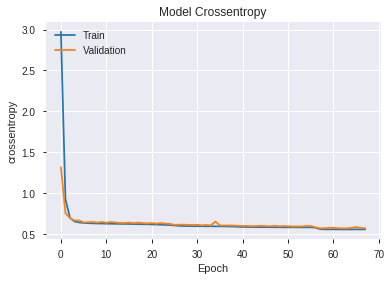

0.5 0.20739566550595084
0.51 0.19839145574554337
precision: [0.74365021 0.67021416]
recall: [0.90109987 0.39285577]
fscore: [0.81483882 0.49535311]
support [101830  52098]
test LogLoss 0.5602


In [ ]:
pred_ans=[1e-5 if x ==0 else x for x in pred_ans]
draw_history(history)
threshold=getTop20Threshold(pred_ans)
Matrics(y_test_true, pred_ans,threshold) 

In [55]:
print(np.sum(pred_ans == 1))

11


In [54]:
pred_ans=np.array(pred_ans)

## DeepFM

In [16]:
model=DeepFM(linear_feature_columns,dnn_feature_columns,task='binary',l2_reg_embedding=0.0001,dnn_dropout=0.5,l2_reg_dnn=0.0001)
model.compile(keras.optimizers.Adam(learning_rate=0.001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=5),
                                                                      keras.callbacks.ModelCheckpoint("DeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=1024,epochs=100,verbose=2,validation_split=0.2)

Train on 492568 samples, validate on 123142 samples
Epoch 1/100

Epoch 00001: val_loss improved from inf to 1.31955, saving model to DeepFM.h5
492568/492568 - 42s - loss: 3.3443 - acc: 0.6425 - val_loss: 1.3195 - val_acc: 0.5600
Epoch 2/100

Epoch 00002: val_loss improved from 1.31955 to 0.95400, saving model to DeepFM.h5
492568/492568 - 27s - loss: 0.9843 - acc: 0.6827 - val_loss: 0.9540 - val_acc: 0.6691
Epoch 3/100

Epoch 00003: val_loss improved from 0.95400 to 0.84554, saving model to DeepFM.h5
492568/492568 - 24s - loss: 0.7687 - acc: 0.7050 - val_loss: 0.8455 - val_acc: 0.6745
Epoch 4/100

Epoch 00004: val_loss improved from 0.84554 to 0.76657, saving model to DeepFM.h5
492568/492568 - 24s - loss: 0.6869 - acc: 0.7166 - val_loss: 0.7666 - val_acc: 0.6804
Epoch 5/100

Epoch 00005: val_loss improved from 0.76657 to 0.68117, saving model to DeepFM.h5
492568/492568 - 25s - loss: 0.6410 - acc: 0.7239 - val_loss: 0.6812 - val_acc: 0.7037
Epoch 6/100

Epoch 00006: val_loss improved fro

In [21]:
# model=load_model("DeepFM.h5",custom_objects={'NoMask' : NoMask,"SequencePoolingLayer":SequencePoolingLayer,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)

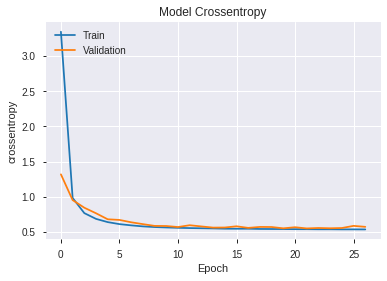

0.5 0.13898705888467336
precision: [0.72480269 0.73034496]
recall: [0.94334675 0.29991554]
fscore: [0.81975901 0.42521635]
support [101830  52098]
test LogLoss 0.5711


In [ ]:
pred_ans=[1e-5 if x ==0 else x for x in pred_ans]
draw_history(history)
threshold=getTop20Threshold(pred_ans)
Matrics(test[target].values, pred_ans,threshold) 

## FNN

In [17]:
model=FNN(linear_feature_columns,dnn_feature_columns,task='binary',l2_reg_embedding=0.0001,l2_reg_linear=0.0001, dnn_dropout=0.5,l2_reg_dnn=0.0001)
model.compile(keras.optimizers.Adam(learning_rate=0.001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=5),
                                                                      keras.callbacks.ModelCheckpoint("FNN.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=256,epochs=50,verbose=2,validation_split=0.2)

Train on 492568 samples, validate on 123142 samples
Epoch 1/50

Epoch 00001: val_loss improved from inf to 5.22176, saving model to FNN.h5
492568/492568 - 45s - loss: 5.2088 - acc: 0.6613 - val_loss: 5.2218 - val_acc: 0.6622
Epoch 2/50

Epoch 00002: val_loss improved from 5.22176 to 5.21943, saving model to FNN.h5
492568/492568 - 45s - loss: 5.1598 - acc: 0.6653 - val_loss: 5.2194 - val_acc: 0.6624
Epoch 3/50

Epoch 00003: val_loss improved from 5.21943 to 5.01753, saving model to FNN.h5
492568/492568 - 34s - loss: 5.1156 - acc: 0.6672 - val_loss: 5.0175 - val_acc: 0.6742
Epoch 4/50

Epoch 00004: val_loss improved from 5.01753 to 1.26051, saving model to FNN.h5
492568/492568 - 34s - loss: 3.8687 - acc: 0.6701 - val_loss: 1.2605 - val_acc: 0.6676
Epoch 5/50

Epoch 00005: val_loss improved from 1.26051 to 0.92715, saving model to FNN.h5
492568/492568 - 36s - loss: 1.0546 - acc: 0.7011 - val_loss: 0.9271 - val_acc: 0.7121
Epoch 6/50

Epoch 00006: val_loss improved from 0.92715 to 0.69145,

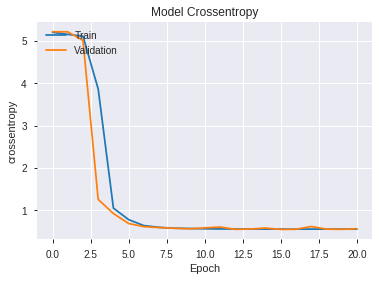

0.5 0.23310898601943766
0.51 0.22277298477210125
0.52 0.2128592588742789
0.53 0.2030689673093914
0.54 0.19390884049685567
0.54 0.19390884049685567


In [18]:
model=load_model("FNN.h5",custom_objects={'NoMask' : NoMask,"SequencePoolingLayer":SequencePoolingLayer,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)
draw_history(history)
from numpy import arange
for threshold in arange(0.5,1.0,0.01):
    count=pd.DataFrame(BinaryValue(pred_ans,threshold))
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
    print(threshold,positiveRate)
    if positiveRate<0.2:
        print(threshold,positiveRate)
        break

In [20]:
Matrics(test[target].values, pred_ans,0.54) 

precision: [0.74162637 0.67136827]
recall: [0.90367279 0.38464049]
fscore: [0.81466956 0.48907817]
support [101830  52098]
test LogLoss 0.5418
test AUC 0.7613


# impression>=20

## Data Profiling

In [44]:
data = pd.read_csv("./dac/Adwords/AllFeatures2020.csv")
pandas_profiling.ProfileReport(data)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



## LR

In [ ]:
model = LR(linear_feature_columns, dnn_feature_columns, task='binary')
model.compile(keras.optimizers.Adam(lr=0.001), "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1)
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_binary_crossentropy',patience=5),],
                  batch_size=256,epochs=100,verbose=2,validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Train on 492568 samples, validate on 123142 samples
Epoch 1/100
492568/492568 - 85s - loss: 5.3299 - binary_crossentropy: 5.3257 - val_loss: 5.0191 - val_binary_crossentropy: 5.0185
Epoch 2/100
492568/492568 - 82s - loss: 5.0033 - binary_crossentropy: 5.0017 - val_loss: 4.9962 - val_binary_crossentropy: 4.9948
Epoch 3/100
492568/492568 - 82s - loss: 2.0426 - binary_crossentropy: 2.0373 - val_loss: 0.6317 - val_binary_crossentropy: 0.6251
Epoch 4/100
492568/492568 - 81s - loss: 0.5984 - binary_crossentropy: 0.5907 - val_loss: 0.5991 - val_binary_crossentropy: 0.5913
Epoch 5/100
492568/492568 - 90s - loss: 0.5740 - binary_crossentropy: 0.5656 - val_loss: 0.5851 - val_binary_crossentropy: 0.5767
Epoch 6/100
492568/492568 - 83s - loss: 0.5689 - binary_crossentropy: 0.5602 - val_loss: 0.5701 - val_binary_crossentropy: 0.5618
Epoch 7/100
492568/492568 - 81s - loss: 0.5685 - binary_crossentropy: 0.5599 - val_loss: 0.5781 - val_binary_crossentropy: 0.5699
Epoch 8/100
492568/492568 - 82s - loss

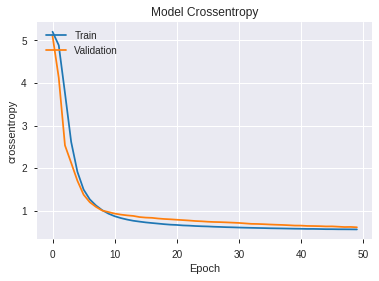

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/sklearn/metrics/classification.py:2174: RuntimeWarning: divide by zero encountered in log
  loss = -(transformed_labels * np.log(y_pred)).sum(axis=1)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/sklearn/metrics/classification.py:2174: RuntimeWarning: invalid value encountered in multiply
  loss = -(transformed_labels * np.log(y_pred)).sum(axis=1)


Test LogLoss nan
test AUC 0.7413


In [39]:
draw_history(history)
print("Test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

In [91]:
from numpy import arange
for threshold in arange(0.5,1.0,0.01):
    count=pd.DataFrame(BinaryValue(pred_ans,threshold))
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
    print(threshold,positiveRate)
    if positiveRate<0.2:
        print(threshold,positiveRate)
        break

0.5 0.22082402162049788
0.51 0.21149498466815653
0.52 0.2023673405748142
0.53 0.1938178888831142
0.53 0.1938178888831142


In [92]:
Matrics(test[target].values, pred_ans,0.51) 

precision: [0.74979608 0.66585778]
recall: [0.89323047 0.41650495]
fscore: [0.81525245 0.51245863]
support [101883  52045]
test LogLoss 0.5362
test AUC 0.7657


## FM

## DeepFM

In [34]:
model=DeepFM(linear_feature_columns,dnn_feature_columns,task='binary',l2_reg_embedding=0.0001,dnn_dropout=0.5,l2_reg_dnn=0.0001)
model.compile(keras.optimizers.Adam(learning_rate=0.0001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=5),
                                                                      keras.callbacks.ModelCheckpoint("DeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=1024,epochs=100,verbose=2,validation_split=0.2)

Train on 492568 samples, validate on 123142 samples
Epoch 1/50

Epoch 00001: val_loss improved from inf to 5.10580, saving model to DeepFM.h5
492568/492568 - 57s - loss: 5.2039 - acc: 0.6368 - val_loss: 5.1058 - val_acc: 0.6652
Epoch 2/50

Epoch 00002: val_loss improved from 5.10580 to 4.12291, saving model to DeepFM.h5
492568/492568 - 53s - loss: 4.8860 - acc: 0.6341 - val_loss: 4.1229 - val_acc: 0.6544
Epoch 3/50

Epoch 00003: val_loss improved from 4.12291 to 2.53426, saving model to DeepFM.h5
492568/492568 - 51s - loss: 3.7650 - acc: 0.6093 - val_loss: 2.5343 - val_acc: 0.6275
Epoch 4/50

Epoch 00004: val_loss improved from 2.53426 to 2.12312, saving model to DeepFM.h5
492568/492568 - 53s - loss: 2.6140 - acc: 0.6086 - val_loss: 2.1231 - val_acc: 0.6215
Epoch 5/50

Epoch 00005: val_loss improved from 2.12312 to 1.70383, saving model to DeepFM.h5
492568/492568 - 55s - loss: 1.9150 - acc: 0.6194 - val_loss: 1.7038 - val_acc: 0.6353
Epoch 6/50

Epoch 00006: val_loss improved from 1.70

In [35]:
# model=load_model("DeepFM.h5",custom_objects={'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)

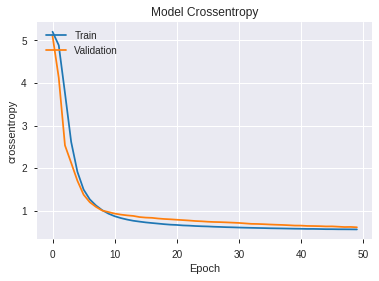

0.5 0.2528714723766956
0.51 0.2427043812691648
0.52 0.23249181435476327
0.53 0.22240917831713528
0.54 0.21266436255911855
0.55 0.20323138090535836
0.56 0.19414921261888676
precision: [0.74000951 0.66414589]
recall: [0.90143376 0.38097432]
fscore: [0.81278418 0.48419794]
support [101830  52098]


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/sklearn/metrics/classification.py:2174: RuntimeWarning: divide by zero encountered in log
  loss = -(transformed_labels * np.log(y_pred)).sum(axis=1)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/sklearn/metrics/classification.py:2174: RuntimeWarning: invalid value encountered in multiply
  loss = -(transformed_labels * np.log(y_pred)).sum(axis=1)


test LogLoss nan
test AUC 0.7413


In [38]:
draw_history(history)
threshold=getTop20Threshold(pred_ans)
Matrics(test[target].values, pred_ans,threshold) 

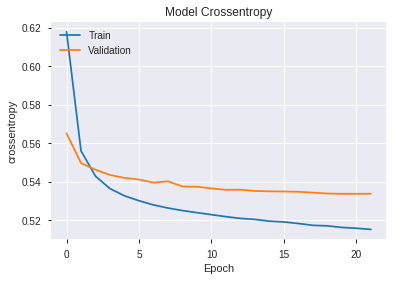

0.5 0.2592900576893093
0.51 0.24799256795384855
0.52 0.23779949067096304
0.53 0.22729457928382102
0.54 0.21667273010758276
0.55 0.20667454913985758
0.56 0.19643599605010134
0.56 0.19643599605010134


In [159]:
draw_history(history)
from numpy import arange
for threshold in arange(0.5,1.0,0.01):
    count=pd.DataFrame(BinaryValue(pred_ans,threshold))
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
    print(threshold,positiveRate)
    if positiveRate<0.2:
        print(threshold,positiveRate)
        break

In [160]:
Matrics(test[target].values, pred_ans,0.55) 

precision: [0.75342914 0.689498  ]
recall: [0.90304565 0.4214622 ]
fscore: [0.82148055 0.52314627]
support [101883  52045]
test LogLoss 0.523
test AUC 0.7795


## xDeepFM

In [193]:
model=xDeepFM(linear_feature_columns,dnn_feature_columns,task='binary',dnn_hidden_units=(100,100,100), l2_reg_embedding=0.0001,l2_reg_cin=0.0001,dnn_dropout=0.5,l2_reg_dnn=0.0005)
model.compile(keras.optimizers.Adam(learning_rate=0.0001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=5),
                                                                      keras.callbacks.ModelCheckpoint("xDeepFM1.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=256,epochs=25,verbose=2,validation_split=0.2)

Train on 492568 samples, validate on 123142 samples
Epoch 1/25

Epoch 00001: val_loss improved from inf to 0.60473, saving model to xDeepFM1.h5
492568/492568 - 31s - loss: 0.7047 - accuracy: 0.6836 - val_loss: 0.6047 - val_accuracy: 0.7281
Epoch 2/25

Epoch 00002: val_loss improved from 0.60473 to 0.57325, saving model to xDeepFM1.h5
492568/492568 - 29s - loss: 0.5806 - accuracy: 0.7341 - val_loss: 0.5733 - val_accuracy: 0.7346
Epoch 3/25

Epoch 00003: val_loss improved from 0.57325 to 0.55800, saving model to xDeepFM1.h5
492568/492568 - 29s - loss: 0.5543 - accuracy: 0.7391 - val_loss: 0.5580 - val_accuracy: 0.7344
Epoch 4/25

Epoch 00004: val_loss improved from 0.55800 to 0.54985, saving model to xDeepFM1.h5
492568/492568 - 29s - loss: 0.5410 - accuracy: 0.7398 - val_loss: 0.5499 - val_accuracy: 0.7351
Epoch 5/25

Epoch 00005: val_loss improved from 0.54985 to 0.54642, saving model to xDeepFM1.h5
492568/492568 - 29s - loss: 0.5343 - accuracy: 0.7406 - val_loss: 0.5464 - val_accuracy:

In [194]:
# Load the best model
model=load_model("xDeepFM1.h5",custom_objects={'NoMask' : NoMask,"CIN":CIN,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)


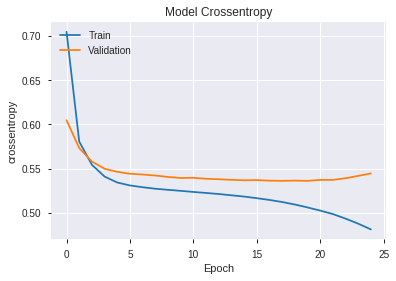

0.5 0.2565874954524193
0.51 0.24625149420508288
0.52 0.23617535471129358
0.53 0.22637207005872875
0.54 0.21678317135284028
0.55 0.20773998232940075
0.56 0.1985343797099943
0.56 0.1985343797099943


In [195]:
draw_history(history)
from numpy import arange
for threshold in arange(0.5,1.0,0.01):
    count=pd.DataFrame(BinaryValue(pred_ans,threshold))
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
    print(threshold,positiveRate)
    if positiveRate<0.2:
        print(threshold,positiveRate)
        break

In [197]:
Matrics(test[target].values, pred_ans,0.55) 

precision: [0.75497536 0.69312318]
recall: [0.90368364 0.42586223]
fscore: [0.82266322 0.52757611]
support [101883  52045]
test LogLoss 0.5253
test AUC 0.7788


## FNN

In [189]:
model=FNN(linear_feature_columns,dnn_feature_columns,task='binary',l2_reg_embedding=0.0001,l2_reg_linear=0.0001, dnn_dropout=0.8,l2_reg_dnn=0.0001)
model.compile(keras.optimizers.Adam(learning_rate=0.0001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=5),
                                                                      keras.callbacks.ModelCheckpoint("FNN.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=256,epochs=50,verbose=2,validation_split=0.2)

Train on 492568 samples, validate on 123142 samples
Epoch 1/50

Epoch 00001: val_loss improved from inf to 0.59320, saving model to FNN.h5
492568/492568 - 17s - loss: 0.6893 - accuracy: 0.6692 - val_loss: 0.5932 - val_accuracy: 0.6956
Epoch 2/50

Epoch 00002: val_loss improved from 0.59320 to 0.57542, saving model to FNN.h5
492568/492568 - 15s - loss: 0.5808 - accuracy: 0.7069 - val_loss: 0.5754 - val_accuracy: 0.7092
Epoch 3/50

Epoch 00003: val_loss improved from 0.57542 to 0.56541, saving model to FNN.h5
492568/492568 - 15s - loss: 0.5660 - accuracy: 0.7181 - val_loss: 0.5654 - val_accuracy: 0.7178
Epoch 4/50

Epoch 00004: val_loss improved from 0.56541 to 0.55906, saving model to FNN.h5
492568/492568 - 15s - loss: 0.5579 - accuracy: 0.7243 - val_loss: 0.5591 - val_accuracy: 0.7228
Epoch 5/50

Epoch 00005: val_loss improved from 0.55906 to 0.55432, saving model to FNN.h5
492568/492568 - 15s - loss: 0.5520 - accuracy: 0.7286 - val_loss: 0.5543 - val_accuracy: 0.7275
Epoch 6/50

Epoch

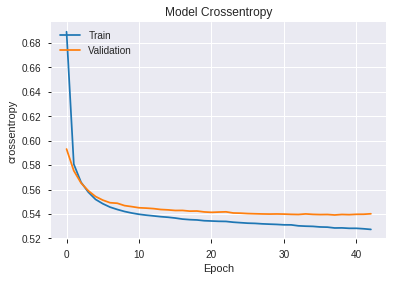

0.5 0.22765188919494828
0.51 0.21739384647367602
0.52 0.20749961020736968
0.53 0.19789771841380385
0.53 0.19789771841380385


In [191]:
model=load_model("FNN.h5",custom_objects={'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)
draw_history(history)
from numpy import arange
for threshold in arange(0.5,1.0,0.01):
    count=pd.DataFrame(BinaryValue(pred_ans,threshold))
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
    print(threshold,positiveRate)
    if positiveRate<0.2:
        print(threshold,positiveRate)
        break

In [192]:
Matrics(test[target].values, pred_ans,0.53) 

precision: [0.74916171 0.69184558]
recall: [0.9078649  0.40493803]
fscore: [0.82091334 0.51086574]
support [101883  52045]
test LogLoss 0.5256
test AUC 0.7767


## AutoInt

In [215]:
model=AutoInt(linear_feature_columns, dnn_feature_columns, att_layer_num=3, att_embedding_size=16, att_head_num=2,
            att_res=True,
            dnn_hidden_units=(32, 32,32), dnn_activation='relu', l2_reg_linear=5e-5,
            l2_reg_embedding=5e-5, l2_reg_dnn=0.0001, dnn_use_bn=False, dnn_dropout=0.5, init_std=0.0001, seed=1024,
            task='binary', )
model.compile(keras.optimizers.Adam(learning_rate=0.0001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['target'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=5),
                                                                      keras.callbacks.ModelCheckpoint("AutoInt.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=1024,epochs=50,verbose=2,validation_split=0.2)

Train on 492568 samples, validate on 123142 samples
Epoch 1/50

Epoch 00001: val_loss improved from inf to 0.59027, saving model to AutoInt.h5
492568/492568 - 15s - loss: 0.7452 - accuracy: 0.6654 - val_loss: 0.5903 - val_accuracy: 0.6960
Epoch 2/50

Epoch 00002: val_loss improved from 0.59027 to 0.55155, saving model to AutoInt.h5
492568/492568 - 10s - loss: 0.5607 - accuracy: 0.7224 - val_loss: 0.5515 - val_accuracy: 0.7292
Epoch 3/50

Epoch 00003: val_loss improved from 0.55155 to 0.54683, saving model to AutoInt.h5
492568/492568 - 10s - loss: 0.5369 - accuracy: 0.7377 - val_loss: 0.5468 - val_accuracy: 0.7316
Epoch 4/50

Epoch 00004: val_loss improved from 0.54683 to 0.54487, saving model to AutoInt.h5
492568/492568 - 10s - loss: 0.5303 - accuracy: 0.7406 - val_loss: 0.5449 - val_accuracy: 0.7323
Epoch 5/50

Epoch 00005: val_loss improved from 0.54487 to 0.54409, saving model to AutoInt.h5
492568/492568 - 10s - loss: 0.5273 - accuracy: 0.7413 - val_loss: 0.5441 - val_accuracy: 0.73

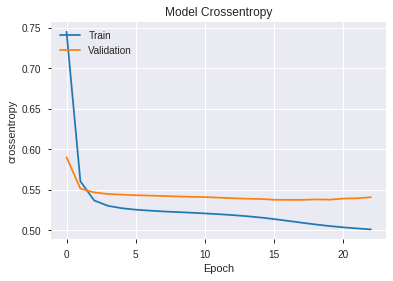

0.5 0.2540993191622057
0.51 0.2436983524764825
0.52 0.23312847565095368
0.53 0.22282495712281067
0.54 0.21297619666337508
0.55 0.20319889818616496
0.56 0.19390884049685567
precision: [0.74501128 0.6836639 ]
recall: [0.90732507 0.39208377]
fscore: [0.8181959  0.49835761]
support [101883  52045]
test LogLoss 0.5349
test AUC 0.769


In [216]:
model=load_model("AutoInt.h5",custom_objects={"InteractingLayer":InteractingLayer,'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)
draw_history(history)
threshold=getTop20Threshold(pred_ans)
Matrics(test[target].values, pred_ans,threshold) 

## GBDT

In [2]:
from __future__ import division
import json
import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LogisticRegression

In [132]:
data = pd.read_csv('./dac/Adwords/AllFeatures2020.csv')

categorical_features =["BaseAdGroupId", "Criteria","placementType",]#'languageCode','locationName']#
dense_features = ['adActiveViewCpm','adActiveViewCtr','adActiveViewImpressions','adActiveViewMeasurability','adActiveViewMeasurableCost',
                          'adActiveViewMeasurableImpressions','adActiveViewViewability','adAverageCpc','adImpressions','adCtr','plaActiveViewCpm','plaActiveViewCtr','plaActiveViewImpressions','plaActiveViewMeasurability','plaActiveViewMeasurableCost',
                          'plaActiveViewMeasurableImpressions','plaActiveViewViewability','plaAverageCpc','plaImpressions','plaCtr']
data=data[categorical_features+dense_features+['target']]
for feat in categorical_features:
    data[feat] =  pd.Categorical(data[feat]).codes

data['target']=data['target'].apply(lambda x: 1 if x>0 else 0)    
data[categorical_features] = data[categorical_features].fillna('-1', )
data[dense_features] = data[dense_features].fillna(0,)
# for numFeature in dense_features:
#     data[numFeature] = data[numFeature].apply(lambda x: x if x<2 else math.sqrt(math.log(x)))
train, test = train_test_split(data, test_size=0.2,random_state=1024)
y_train = train["target"]  # training label
y_test = test["target"]   # testing label
X_train = train.drop(columns=["target"] , axis=1)  # training dataset
X_test = test.drop(columns=["target"] , axis=1)  # testing dataset

# create dataset for lightgbm
lgb_train = lgb.Dataset(X_train, y_train,feature_name=dense_features+categorical_features,
                        categorical_feature=categorical_features,free_raw_data=False)
lgb_train.save_binary("train.bin")
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)

# specify your configurations as a dict


In [133]:
params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'is_unbalance':True,
    'max_depth':15,
    'objective': 'binary',
    'metric': {'binary_logloss','auc'},
    "min_child_samples": 30,   # for overfitting
	'num_trees': 100,
    'num_leaves':64,
    'learning_rate': 0.1,
    'feature_fraction': 0.7,   # Select a part of the features on each tree, for preventing overfitting and speed-up
    'bagging_fraction': 0.7,
    'bagging_freq': 5,
    'lambda_l1':0.1,
    'lambda_l2':0.1,
    'verbose': 1
}

# number of leaves,will be used in feature transformation
num_leaf = 64

print('Start training...')
# train
gbm = lgb.train(params,
                lgb_train,
                valid_sets=lgb_train)
y_pred = gbm.predict(X_test)
print("test LogLoss", round(log_loss(test["target"].values , y_pred ), 4))
print("test AUC", round(roc_auc_score(test["target"].values , y_pred), 4))

Start training...


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_trees` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


[1]	training's binary_logloss: 0.625697	training's auc: 0.72171
[2]	training's binary_logloss: 0.615151	training's auc: 0.735962
[3]	training's binary_logloss: 0.607506	training's auc: 0.739456
[4]	training's binary_logloss: 0.60148	training's auc: 0.741263
[5]	training's binary_logloss: 0.596979	training's auc: 0.7424
[6]	training's binary_logloss: 0.593522	training's auc: 0.74352
[7]	training's binary_logloss: 0.590481	training's auc: 0.745597
[8]	training's binary_logloss: 0.588127	training's auc: 0.746835
[9]	training's binary_logloss: 0.586397	training's auc: 0.748336
[10]	training's binary_logloss: 0.585175	training's auc: 0.749075
[11]	training's binary_logloss: 0.583968	training's auc: 0.750136
[12]	training's binary_logloss: 0.583031	training's auc: 0.75106
[13]	training's binary_logloss: 0.582323	training's auc: 0.752298
[14]	training's binary_logloss: 0.581909	training's auc: 0.753003
[15]	training's binary_logloss: 0.581328	training's auc: 0.754297
[16]	training's binary_lo

In [134]:
y_pred = gbm.predict(X_train,pred_leaf=True)
indexRange=int(len(y_pred)*0.8)

615710


array([[53,  6, 21, ..., 54, 27, 39],
       [62, 58, 51, ..., 35, 41, 39],
       [39, 20, 14, ..., 56, 12, 39],
       ...,
       [52, 60, 33, ..., 36, 12, 39],
       [61, 41, 42, ..., 56,  4, 39],
       [61, 10, 52, ..., 57, 34, 39]], dtype=int32)

In [78]:
def myGenerator(y_pred,y_train,batch_size):
    steps=y_pred.shape[0]//batch_size
    while True:
        for i in range(0,steps):
            batchX = np.zeros([batch_size,y_pred.shape[1] * num_leaf],dtype=np.int64)        
            for j in range(i*batch_size,(i+1)*batch_size):
                temp = np.arange(len(y_pred[0])) * num_leaf-1+ np.array(y_pred[j])
                batchX[j-i*batch_size][temp] += 1
#             batchX=y_pred[i*batch_size:(i+1)*batch_size]
            batchY=y_train[i*batch_size:(i+1)*batch_size]
            yield batchX,batchY

In [150]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.regularizers import L1L2
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
model = Sequential()
model.add(Dense(1,activation='sigmoid',kernel_regularizer=L1L2(l1=0.0, l2=0.01),input_dim=len(y_pred[0]) * num_leaf))
model.compile(Adam(lr=0.001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(y_pred[:indexRange],y_train[:indexRange],1024),callbacks=[keras.callbacks.EarlyStopping(monitor='loss',patience=5),
                                                                      ModelCheckpoint("GBDT+LR.h5",monitor="loss",verbose=1,save_best_only=True)], 
                            steps_per_epoch=indexRange//1024,epochs=50,verbose=1,
                           validation_data=myGenerator(y_pred[indexRange:len(y_pred)],y_train[indexRange:len(y_pred)],1024),
                            validation_steps=(len(y_pred)-indexRange)//1024)

Epoch 1/50
247/481 [==============>...............] - ETA: 24:39 - loss: 0.7104 - acc: 0.52 - ETA: 12:31 - loss: 0.7040 - acc: 0.55 - ETA: 8:27 - loss: 0.6969 - acc: 0.5811 - ETA: 6:31 - loss: 0.6917 - acc: 0.596 - ETA: 5:18 - loss: 0.6857 - acc: 0.610 - ETA: 4:30 - loss: 0.6788 - acc: 0.624 - ETA: 3:56 - loss: 0.6739 - acc: 0.631 - ETA: 3:31 - loss: 0.6699 - acc: 0.636 - ETA: 3:11 - loss: 0.6657 - acc: 0.640 - ETA: 2:55 - loss: 0.6624 - acc: 0.643 - ETA: 2:42 - loss: 0.6588 - acc: 0.646 - ETA: 2:31 - loss: 0.6550 - acc: 0.649 - ETA: 2:22 - loss: 0.6514 - acc: 0.652 - ETA: 2:14 - loss: 0.6481 - acc: 0.656 - ETA: 2:07 - loss: 0.6442 - acc: 0.659 - ETA: 2:02 - loss: 0.6411 - acc: 0.662 - ETA: 1:56 - loss: 0.6387 - acc: 0.664 - ETA: 1:51 - loss: 0.6379 - acc: 0.665 - ETA: 1:47 - loss: 0.6352 - acc: 0.668 - ETA: 1:43 - loss: 0.6338 - acc: 0.669 - ETA: 1:39 - loss: 0.6319 - acc: 0.670 - ETA: 1:37 - loss: 0.6298 - acc: 0.672 - ETA: 1:30 - loss: 0.6260 - acc: 0.676 - ETA: 1:24 - loss: 0.6212 

245/481 [==============>...............] - ETA: 28s - loss: 0.5391 - acc: 0.74 - ETA: 19s - loss: 0.5411 - acc: 0.73 - ETA: 23s - loss: 0.5379 - acc: 0.73 - ETA: 23s - loss: 0.5326 - acc: 0.74 - ETA: 27s - loss: 0.5336 - acc: 0.75 - ETA: 35s - loss: 0.5349 - acc: 0.74 - ETA: 36s - loss: 0.5375 - acc: 0.74 - ETA: 36s - loss: 0.5381 - acc: 0.74 - ETA: 32s - loss: 0.5383 - acc: 0.74 - ETA: 32s - loss: 0.5395 - acc: 0.74 - ETA: 32s - loss: 0.5410 - acc: 0.74 - ETA: 30s - loss: 0.5403 - acc: 0.74 - ETA: 30s - loss: 0.5406 - acc: 0.74 - ETA: 34s - loss: 0.5436 - acc: 0.74 - ETA: 35s - loss: 0.5437 - acc: 0.74 - ETA: 35s - loss: 0.5450 - acc: 0.74 - ETA: 34s - loss: 0.5453 - acc: 0.74 - ETA: 34s - loss: 0.5451 - acc: 0.74 - ETA: 35s - loss: 0.5451 - acc: 0.74 - ETA: 34s - loss: 0.5452 - acc: 0.74 - ETA: 34s - loss: 0.5447 - acc: 0.74 - ETA: 34s - loss: 0.5438 - acc: 0.74 - ETA: 34s - loss: 0.5437 - acc: 0.74 - ETA: 33s - loss: 0.5434 - acc: 0.74 - ETA: 34s - loss: 0.5429 - acc: 0.74 - ETA: 34

477/481 [============================>.] - ETA: 18s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5470 - acc: 0.73 - ETA: 17s - loss: 0.5470 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5470 - acc: 0.73 - ETA: 17s - loss: 0.5470 - acc: 0.73 - ETA: 17s - loss: 0.5470 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5471 - acc: 0.73 - ETA: 17s - loss: 0.5470 - acc: 0.73 - ETA: 16s - loss: 0.5471 - acc: 0.73 - ETA: 16s - loss: 0.5471 - acc: 0.73 - ETA: 16s - loss: 0.5471 - acc: 0.73 - ETA: 16s - loss: 0.5471 - acc: 0.73 - ETA: 16s - loss: 0.5472 - acc: 0.73 - ETA: 16s - loss: 0.5471 - acc: 0.73 - ETA: 16s - loss: 0.5471 - acc: 0.73 - ETA: 16

481/481 [==============================] - ETA: 0s - loss: 0.5471 - acc: 0.737 - ETA: 0s - loss: 0.5472 - acc: 0.737 - 46s 96ms/step - loss: 0.5472 - acc: 0.7377 - val_loss: 0.5466 - val_acc: 0.7377

Epoch 00002: loss improved from 0.55382 to 0.54718, saving model to GBDT+LR.h5
Epoch 3/50
  1/481 [..............................] - ETA: 56s - loss: 0.5388 - acc: 0.7441

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142632). Check your callbacks.
  % delta_t_median)


235/481 [=============>................] - ETA: 1:19 - loss: 0.5377 - acc: 0.747 - ETA: 1:07 - loss: 0.5408 - acc: 0.740 - ETA: 58s - loss: 0.5376 - acc: 0.739 - ETA: 56s - loss: 0.5373 - acc: 0.74 - ETA: 52s - loss: 0.5323 - acc: 0.74 - ETA: 48s - loss: 0.5333 - acc: 0.75 - ETA: 48s - loss: 0.5346 - acc: 0.75 - ETA: 46s - loss: 0.5372 - acc: 0.74 - ETA: 45s - loss: 0.5379 - acc: 0.74 - ETA: 46s - loss: 0.5377 - acc: 0.74 - ETA: 45s - loss: 0.5380 - acc: 0.74 - ETA: 44s - loss: 0.5393 - acc: 0.74 - ETA: 40s - loss: 0.5396 - acc: 0.74 - ETA: 43s - loss: 0.5401 - acc: 0.74 - ETA: 42s - loss: 0.5404 - acc: 0.74 - ETA: 41s - loss: 0.5434 - acc: 0.74 - ETA: 41s - loss: 0.5435 - acc: 0.74 - ETA: 40s - loss: 0.5448 - acc: 0.74 - ETA: 40s - loss: 0.5451 - acc: 0.74 - ETA: 40s - loss: 0.5449 - acc: 0.74 - ETA: 39s - loss: 0.5448 - acc: 0.74 - ETA: 39s - loss: 0.5450 - acc: 0.74 - ETA: 39s - loss: 0.5445 - acc: 0.74 - ETA: 37s - loss: 0.5435 - acc: 0.74 - ETA: 35s - loss: 0.5432 - acc: 0.74 - ET

467/481 [============================>.] - ETA: 19s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5471 - acc: 0.73 - ETA: 18s - loss: 0.5471 - acc: 0.73 - ETA: 18s - loss: 0.5471 - acc: 0.73 - ETA: 18s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5469 - acc: 0.73 - ETA: 18s - loss: 0.5470 - acc: 0.73 - ETA: 18s - loss: 0.5469 - acc: 0.73 - ETA: 18s - loss: 0.5468 - acc: 0.73 - ETA: 18s - loss: 0.5469 - acc: 0.73 - ETA: 18s - loss: 0.5468 - acc: 0.73 - ETA: 18s - loss: 0.5468 - acc: 0.73 - ETA: 18s - loss: 0.5468 - acc: 0.73 - ETA: 18s - loss: 0.5468 - acc: 0.73 - ETA: 18s - loss: 0.5469 - acc: 0.73 - ETA: 17s - loss: 0.5469 - acc: 0.73 - ETA: 17s - loss: 0.5469 - acc: 0.73 - ETA: 17s - loss: 0.5469 - acc: 0.73 - ETA: 17s - loss: 0.5468 - acc: 0.73 - ETA: 17s - loss: 0.5468 - acc: 0.73 - ETA: 17s - loss: 0.5469 - acc: 0.73 - ETA: 17s - loss: 0.5469 - acc: 0.73 - ETA: 17s - loss: 0.5468 - acc: 0.73 - ETA: 17s - loss: 0.5468 - acc: 0.73 - ETA: 17s - loss: 0.5468 - acc: 0.73 - ETA: 17

481/481 [==============================] - ETA: 1s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - ETA: 0s - loss: 0.5470 - acc: 0.737 - 46s 96ms/step - loss: 0.5470 - acc: 0.7377 - val_loss: 0.5464 - val_acc: 0.7376

Epoch 00003: loss improved from 0.54718 to 0.54699, saving model to GBDT+LR.h5
Epoch 4/50
248/481 [==============>...............] - ETA: 26s - loss: 0.5385 - acc: 0.74 - ETA: 45s - loss: 0.5375 - acc: 0.74 - ETA: 45s - loss: 0.5406 - acc: 0.74 - ETA: 45s - loss: 0.5374 - acc: 0.73 - ETA: 42s - loss: 0.5371 - acc: 0.74 - ETA: 44s - loss: 0.5321 - acc: 0.74 - ETA: 44s - loss: 0.53

Epoch 5/50
247/481 [==============>...............] - ETA: 26s - loss: 0.5384 - acc: 0.74 - ETA: 27s - loss: 0.5373 - acc: 0.74 - ETA: 37s - loss: 0.5404 - acc: 0.74 - ETA: 41s - loss: 0.5372 - acc: 0.74 - ETA: 39s - loss: 0.5369 - acc: 0.74 - ETA: 38s - loss: 0.5320 - acc: 0.74 - ETA: 38s - loss: 0.5329 - acc: 0.75 - ETA: 39s - loss: 0.5343 - acc: 0.75 - ETA: 41s - loss: 0.5369 - acc: 0.74 - ETA: 41s - loss: 0.5376 - acc: 0.74 - ETA: 41s - loss: 0.5374 - acc: 0.74 - ETA: 37s - loss: 0.5390 - acc: 0.74 - ETA: 34s - loss: 0.5393 - acc: 0.74 - ETA: 32s - loss: 0.5402 - acc: 0.74 - ETA: 39s - loss: 0.5431 - acc: 0.74 - ETA: 38s - loss: 0.5432 - acc: 0.74 - ETA: 38s - loss: 0.5445 - acc: 0.74 - ETA: 38s - loss: 0.5448 - acc: 0.74 - ETA: 38s - loss: 0.5446 - acc: 0.74 - ETA: 38s - loss: 0.5446 - acc: 0.74 - ETA: 37s - loss: 0.5447 - acc: 0.74 - ETA: 37s - loss: 0.5442 - acc: 0.74 - ETA: 37s - loss: 0.5433 - acc: 0.74 - ETA: 37s - loss: 0.5432 - acc: 0.74 - ETA: 37s - loss: 0.5432 - acc: 0.7

Epoch 6/50
  2/481 [..............................] - ETA: 33s - loss: 0.5382 - acc: 0.74 - ETA: 31s - loss: 0.5372 - acc: 0.7466

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135495). Check your callbacks.
  % delta_t_median)


  3/481 [..............................] - ETA: 1:26 - loss: 0.5403 - acc: 0.7406

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261672). Check your callbacks.
  % delta_t_median)


  4/481 [..............................] - ETA: 1:44 - loss: 0.5371 - acc: 0.7393

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145052). Check your callbacks.
  % delta_t_median)


231/481 [=============>................] - ETA: 1:30 - loss: 0.5368 - acc: 0.742 - ETA: 1:21 - loss: 0.5318 - acc: 0.748 - ETA: 1:14 - loss: 0.5328 - acc: 0.750 - ETA: 1:09 - loss: 0.5342 - acc: 0.750 - ETA: 1:05 - loss: 0.5368 - acc: 0.748 - ETA: 1:02 - loss: 0.5375 - acc: 0.745 - ETA: 59s - loss: 0.5373 - acc: 0.745 - ETA: 58s - loss: 0.5376 - acc: 0.74 - ETA: 56s - loss: 0.5388 - acc: 0.74 - ETA: 54s - loss: 0.5404 - acc: 0.74 - ETA: 53s - loss: 0.5392 - acc: 0.74 - ETA: 52s - loss: 0.5397 - acc: 0.74 - ETA: 51s - loss: 0.5400 - acc: 0.74 - ETA: 50s - loss: 0.5430 - acc: 0.74 - ETA: 49s - loss: 0.5431 - acc: 0.74 - ETA: 48s - loss: 0.5444 - acc: 0.74 - ETA: 47s - loss: 0.5447 - acc: 0.74 - ETA: 47s - loss: 0.5445 - acc: 0.74 - ETA: 46s - loss: 0.5444 - acc: 0.74 - ETA: 46s - loss: 0.5445 - acc: 0.74 - ETA: 45s - loss: 0.5441 - acc: 0.74 - ETA: 45s - loss: 0.5432 - acc: 0.74 - ETA: 44s - loss: 0.5431 - acc: 0.74 - ETA: 44s - loss: 0.5431 - acc: 0.74 - ETA: 43s - loss: 0.5427 - acc: 0

460/481 [===========================>..] - ETA: 20s - loss: 0.5468 - acc: 0.73 - ETA: 20s - loss: 0.5468 - acc: 0.73 - ETA: 20s - loss: 0.5467 - acc: 0.73 - ETA: 20s - loss: 0.5467 - acc: 0.73 - ETA: 19s - loss: 0.5466 - acc: 0.73 - ETA: 19s - loss: 0.5467 - acc: 0.73 - ETA: 19s - loss: 0.5467 - acc: 0.73 - ETA: 19s - loss: 0.5466 - acc: 0.73 - ETA: 19s - loss: 0.5466 - acc: 0.73 - ETA: 19s - loss: 0.5466 - acc: 0.73 - ETA: 19s - loss: 0.5465 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5465 - acc: 0.73 - ETA: 18s - loss: 0.5465 - acc: 0.73 - ETA: 18s - loss: 0.5465 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5465 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 18s - loss: 0.5464 - acc: 0.73 - ETA: 17

481/481 [==============================] - ETA: 1s - loss: 0.5467 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 1s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5465 - acc: 0.737 - ETA: 0s - loss: 0.5465 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - ETA: 0s - loss: 0.5466 - acc: 0.737 - 47s 97ms/step - loss: 0.5466 - acc: 0.7375 - val_loss: 0.5461 - val_acc: 0.7376

Epoch 00006: loss improved from 0.54670 to 0.54658, saving model to GBDT+LR.h5
Epoch 7/50
235/481 [=============>...

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236158). Check your callbacks.
  % delta_t_median)


  4/481 [..............................] - ETA: 1:42 - loss: 0.5401 - acc: 0.740 - ETA: 1:28 - loss: 0.5369 - acc: 0.7393

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112423). Check your callbacks.
  % delta_t_median)


234/481 [=============>................] - ETA: 1:31 - loss: 0.5366 - acc: 0.742 - ETA: 1:21 - loss: 0.5316 - acc: 0.749 - ETA: 1:15 - loss: 0.5326 - acc: 0.750 - ETA: 1:10 - loss: 0.5340 - acc: 0.749 - ETA: 1:06 - loss: 0.5366 - acc: 0.748 - ETA: 1:03 - loss: 0.5373 - acc: 0.745 - ETA: 1:00 - loss: 0.5371 - acc: 0.745 - ETA: 53s - loss: 0.5387 - acc: 0.745 - ETA: 47s - loss: 0.5390 - acc: 0.74 - ETA: 43s - loss: 0.5399 - acc: 0.74 - ETA: 40s - loss: 0.5429 - acc: 0.74 - ETA: 39s - loss: 0.5442 - acc: 0.74 - ETA: 37s - loss: 0.5444 - acc: 0.74 - ETA: 35s - loss: 0.5444 - acc: 0.74 - ETA: 35s - loss: 0.5439 - acc: 0.74 - ETA: 35s - loss: 0.5430 - acc: 0.74 - ETA: 35s - loss: 0.5429 - acc: 0.74 - ETA: 35s - loss: 0.5429 - acc: 0.74 - ETA: 35s - loss: 0.5426 - acc: 0.74 - ETA: 35s - loss: 0.5421 - acc: 0.74 - ETA: 35s - loss: 0.5418 - acc: 0.74 - ETA: 35s - loss: 0.5424 - acc: 0.74 - ETA: 35s - loss: 0.5426 - acc: 0.74 - ETA: 34s - loss: 0.5429 - acc: 0.74 - ETA: 34s - loss: 0.5433 - acc:

460/481 [===========================>..] - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 19s - loss: 0.5465 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 18s - loss: 0.5463 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 18s - loss: 0.5463 - acc: 0.73 - ETA: 18s - loss: 0.5463 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 18

481/481 [==============================] - ETA: 1s - loss: 0.5465 - acc: 0.737 - ETA: 1s - loss: 0.5465 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5465 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5464 - acc: 0.737 - 48s 99ms/step - loss: 0.5464 - acc: 0.7375 - val_loss: 0.5459 - val_acc: 0.7376

Epoch 00008: loss improved from 0.54649 to 0.54641, saving model to GBDT+LR.h5
Epoch 9/50
  1/481 [.................

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.392205). Check your callbacks.
  % delta_t_median)


  2/481 [..............................] - ETA: 1:56 - loss: 0.5369 - acc: 0.7466

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216472). Check your callbacks.
  % delta_t_median)


223/481 [============>.................] - ETA: 1:29 - loss: 0.5400 - acc: 0.740 - ETA: 1:16 - loss: 0.5368 - acc: 0.739 - ETA: 1:07 - loss: 0.5365 - acc: 0.742 - ETA: 1:02 - loss: 0.5315 - acc: 0.749 - ETA: 1:00 - loss: 0.5325 - acc: 0.750 - ETA: 57s - loss: 0.5339 - acc: 0.750 - ETA: 55s - loss: 0.5365 - acc: 0.74 - ETA: 54s - loss: 0.5372 - acc: 0.74 - ETA: 52s - loss: 0.5370 - acc: 0.74 - ETA: 51s - loss: 0.5373 - acc: 0.74 - ETA: 50s - loss: 0.5386 - acc: 0.74 - ETA: 49s - loss: 0.5402 - acc: 0.74 - ETA: 48s - loss: 0.5390 - acc: 0.74 - ETA: 47s - loss: 0.5395 - acc: 0.74 - ETA: 47s - loss: 0.5398 - acc: 0.74 - ETA: 46s - loss: 0.5428 - acc: 0.74 - ETA: 45s - loss: 0.5428 - acc: 0.74 - ETA: 45s - loss: 0.5441 - acc: 0.74 - ETA: 44s - loss: 0.5444 - acc: 0.74 - ETA: 44s - loss: 0.5443 - acc: 0.74 - ETA: 44s - loss: 0.5442 - acc: 0.74 - ETA: 43s - loss: 0.5443 - acc: 0.74 - ETA: 43s - loss: 0.5439 - acc: 0.74 - ETA: 43s - loss: 0.5429 - acc: 0.74 - ETA: 42s - loss: 0.5429 - acc: 0.7

444/481 [==========================>...] - ETA: 21s - loss: 0.5467 - acc: 0.73 - ETA: 20s - loss: 0.5466 - acc: 0.73 - ETA: 20s - loss: 0.5466 - acc: 0.73 - ETA: 20s - loss: 0.5466 - acc: 0.73 - ETA: 20s - loss: 0.5466 - acc: 0.73 - ETA: 20s - loss: 0.5466 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5465 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18

481/481 [==============================] - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5465 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 0s - loss: 0.5463 - acc: 0.737 - ETA: 0s

229/481 [=============>................] - ETA: 24s - loss: 0.5378 - acc: 0.74 - ETA: 25s - loss: 0.5368 - acc: 0.74 - ETA: 28s - loss: 0.5399 - acc: 0.74 - ETA: 30s - loss: 0.5367 - acc: 0.73 - ETA: 37s - loss: 0.5364 - acc: 0.74 - ETA: 40s - loss: 0.5314 - acc: 0.74 - ETA: 34s - loss: 0.5338 - acc: 0.74 - ETA: 37s - loss: 0.5364 - acc: 0.74 - ETA: 33s - loss: 0.5369 - acc: 0.74 - ETA: 36s - loss: 0.5372 - acc: 0.74 - ETA: 36s - loss: 0.5385 - acc: 0.74 - ETA: 36s - loss: 0.5401 - acc: 0.74 - ETA: 36s - loss: 0.5389 - acc: 0.74 - ETA: 36s - loss: 0.5394 - acc: 0.74 - ETA: 36s - loss: 0.5397 - acc: 0.74 - ETA: 34s - loss: 0.5428 - acc: 0.74 - ETA: 36s - loss: 0.5440 - acc: 0.74 - ETA: 36s - loss: 0.5443 - acc: 0.74 - ETA: 35s - loss: 0.5442 - acc: 0.74 - ETA: 35s - loss: 0.5441 - acc: 0.74 - ETA: 35s - loss: 0.5442 - acc: 0.74 - ETA: 35s - loss: 0.5438 - acc: 0.74 - ETA: 35s - loss: 0.5428 - acc: 0.74 - ETA: 35s - loss: 0.5428 - acc: 0.74 - ETA: 35s - loss: 0.5428 - acc: 0.74 - ETA: 35

481/481 [==============================] - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5464 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5463 - acc: 0.737 - ETA: 0s - loss: 0.5463 - acc: 0.737 - ETA: 0s - loss: 0.5463 - acc: 0.737 - ETA: 0s - loss: 0.5463 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.204561). Check your callbacks.
  % delta_t_median)


  2/481 [..............................] - ETA: 1:09 - loss: 0.5368 - acc: 0.7466

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.121875). Check your callbacks.
  % delta_t_median)


224/481 [============>.................] - ETA: 1:01 - loss: 0.5398 - acc: 0.740 - ETA: 55s - loss: 0.5366 - acc: 0.739 - ETA: 53s - loss: 0.5364 - acc: 0.74 - ETA: 52s - loss: 0.5314 - acc: 0.74 - ETA: 49s - loss: 0.5324 - acc: 0.75 - ETA: 47s - loss: 0.5338 - acc: 0.75 - ETA: 46s - loss: 0.5364 - acc: 0.74 - ETA: 47s - loss: 0.5371 - acc: 0.74 - ETA: 46s - loss: 0.5369 - acc: 0.74 - ETA: 45s - loss: 0.5372 - acc: 0.74 - ETA: 44s - loss: 0.5384 - acc: 0.74 - ETA: 43s - loss: 0.5400 - acc: 0.74 - ETA: 43s - loss: 0.5388 - acc: 0.74 - ETA: 42s - loss: 0.5393 - acc: 0.74 - ETA: 42s - loss: 0.5397 - acc: 0.74 - ETA: 41s - loss: 0.5427 - acc: 0.74 - ETA: 41s - loss: 0.5427 - acc: 0.74 - ETA: 41s - loss: 0.5440 - acc: 0.74 - ETA: 40s - loss: 0.5443 - acc: 0.74 - ETA: 38s - loss: 0.5441 - acc: 0.74 - ETA: 40s - loss: 0.5442 - acc: 0.74 - ETA: 40s - loss: 0.5437 - acc: 0.74 - ETA: 39s - loss: 0.5428 - acc: 0.74 - ETA: 39s - loss: 0.5427 - acc: 0.74 - ETA: 39s - loss: 0.5427 - acc: 0.74 - ETA:

442/481 [==========================>...] - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5464 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5460 - acc: 0.73 - ETA: 18s - loss: 0.5460 - acc: 0.73 - ETA: 18s - loss: 0.5460 - acc: 0.73 - ETA: 18s - loss: 0.5460 - acc: 0.73 - ETA: 18

481/481 [==============================] - ETA: 3s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s - loss: 0.5462 - acc: 0.737 - ETA: 0s

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159885). Check your callbacks.
  % delta_t_median)


  2/481 [..............................] - ETA: 56s - loss: 0.5367 - acc: 0.7461

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.104006). Check your callbacks.
  % delta_t_median)


222/481 [============>.................] - ETA: 48s - loss: 0.5398 - acc: 0.74 - ETA: 46s - loss: 0.5366 - acc: 0.73 - ETA: 44s - loss: 0.5363 - acc: 0.74 - ETA: 43s - loss: 0.5314 - acc: 0.74 - ETA: 42s - loss: 0.5323 - acc: 0.75 - ETA: 41s - loss: 0.5337 - acc: 0.74 - ETA: 41s - loss: 0.5363 - acc: 0.74 - ETA: 40s - loss: 0.5370 - acc: 0.74 - ETA: 41s - loss: 0.5368 - acc: 0.74 - ETA: 40s - loss: 0.5372 - acc: 0.74 - ETA: 40s - loss: 0.5384 - acc: 0.74 - ETA: 40s - loss: 0.5400 - acc: 0.74 - ETA: 39s - loss: 0.5388 - acc: 0.74 - ETA: 39s - loss: 0.5393 - acc: 0.74 - ETA: 39s - loss: 0.5396 - acc: 0.74 - ETA: 38s - loss: 0.5426 - acc: 0.74 - ETA: 38s - loss: 0.5427 - acc: 0.74 - ETA: 38s - loss: 0.5440 - acc: 0.74 - ETA: 38s - loss: 0.5443 - acc: 0.74 - ETA: 39s - loss: 0.5441 - acc: 0.74 - ETA: 38s - loss: 0.5440 - acc: 0.74 - ETA: 38s - loss: 0.5441 - acc: 0.74 - ETA: 38s - loss: 0.5437 - acc: 0.74 - ETA: 38s - loss: 0.5428 - acc: 0.74 - ETA: 38s - loss: 0.5427 - acc: 0.74 - ETA: 37

442/481 [==========================>...] - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5465 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5464 - acc: 0.73 - ETA: 20s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5463 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 19s - loss: 0.5462 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 18s - loss: 0.5460 - acc: 0.73 - ETA: 18

481/481 [==============================] - ETA: 3s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5463 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s

216/481 [============>.................] - ETA: 18s - loss: 0.5377 - acc: 0.74 - ETA: 26s - loss: 0.5367 - acc: 0.74 - ETA: 30s - loss: 0.5398 - acc: 0.74 - ETA: 32s - loss: 0.5365 - acc: 0.73 - ETA: 32s - loss: 0.5363 - acc: 0.74 - ETA: 34s - loss: 0.5313 - acc: 0.74 - ETA: 34s - loss: 0.5323 - acc: 0.75 - ETA: 35s - loss: 0.5337 - acc: 0.74 - ETA: 35s - loss: 0.5363 - acc: 0.74 - ETA: 35s - loss: 0.5370 - acc: 0.74 - ETA: 35s - loss: 0.5368 - acc: 0.74 - ETA: 35s - loss: 0.5371 - acc: 0.74 - ETA: 35s - loss: 0.5384 - acc: 0.74 - ETA: 35s - loss: 0.5400 - acc: 0.74 - ETA: 35s - loss: 0.5388 - acc: 0.74 - ETA: 35s - loss: 0.5393 - acc: 0.74 - ETA: 35s - loss: 0.5396 - acc: 0.74 - ETA: 35s - loss: 0.5426 - acc: 0.74 - ETA: 35s - loss: 0.5427 - acc: 0.74 - ETA: 35s - loss: 0.5439 - acc: 0.74 - ETA: 35s - loss: 0.5442 - acc: 0.74 - ETA: 35s - loss: 0.5441 - acc: 0.74 - ETA: 35s - loss: 0.5440 - acc: 0.74 - ETA: 35s - loss: 0.5441 - acc: 0.74 - ETA: 35s - loss: 0.5437 - acc: 0.74 - ETA: 35

481/481 [==============================] - ETA: 3s - loss: 0.5463 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5463 - acc: 0.737 - ETA: 3s - loss: 0.5463 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5463 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.103962). Check your callbacks.
  % delta_t_median)


319/481 [==================>...........] - ETA: 13s - loss: 0.5461 - acc: 0.7374

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.107081). Check your callbacks.
  % delta_t_median)


320/481 [==================>...........] - ETA: 13s - loss: 0.5462 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109208). Check your callbacks.
  % delta_t_median)


321/481 [===================>..........] - ETA: 13s - loss: 0.5462 - acc: 0.7374

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.111541). Check your callbacks.
  % delta_t_median)


322/481 [===================>..........] - ETA: 13s - loss: 0.5462 - acc: 0.7374

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.114170). Check your callbacks.
  % delta_t_median)


325/481 [===================>..........] - ETA: 13s - loss: 0.5462 - acc: 0.73 - ETA: 13s - loss: 0.5462 - acc: 0.73 - ETA: 13s - loss: 0.5462 - acc: 0.7374

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122848). Check your callbacks.
  % delta_t_median)


328/481 [===================>..........] - ETA: 13s - loss: 0.5462 - acc: 0.73 - ETA: 13s - loss: 0.5462 - acc: 0.73 - ETA: 13s - loss: 0.5462 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.110173). Check your callbacks.
  % delta_t_median)


329/481 [===================>..........] - ETA: 12s - loss: 0.5462 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109585). Check your callbacks.
  % delta_t_median)


333/481 [===================>..........] - ETA: 12s - loss: 0.5461 - acc: 0.73 - ETA: 12s - loss: 0.5461 - acc: 0.73 - ETA: 12s - loss: 0.5461 - acc: 0.73 - ETA: 12s - loss: 0.5462 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112637). Check your callbacks.
  % delta_t_median)


334/481 [===================>..........] - ETA: 12s - loss: 0.5461 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116597). Check your callbacks.
  % delta_t_median)


338/481 [====================>.........] - ETA: 12s - loss: 0.5462 - acc: 0.73 - ETA: 12s - loss: 0.5462 - acc: 0.73 - ETA: 12s - loss: 0.5461 - acc: 0.73 - ETA: 12s - loss: 0.5461 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119690). Check your callbacks.
  % delta_t_median)


341/481 [====================>.........] - ETA: 12s - loss: 0.5462 - acc: 0.73 - ETA: 12s - loss: 0.5461 - acc: 0.73 - ETA: 12s - loss: 0.5462 - acc: 0.7373

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.106040). Check your callbacks.
  % delta_t_median)


345/481 [====================>.........] - ETA: 12s - loss: 0.5463 - acc: 0.73 - ETA: 12s - loss: 0.5463 - acc: 0.73 - ETA: 12s - loss: 0.5464 - acc: 0.73 - ETA: 12s - loss: 0.5463 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.111845). Check your callbacks.
  % delta_t_median)


346/481 [====================>.........] - ETA: 12s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125937). Check your callbacks.
  % delta_t_median)


347/481 [====================>.........] - ETA: 12s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120400). Check your callbacks.
  % delta_t_median)


349/481 [====================>.........] - ETA: 12s - loss: 0.5464 - acc: 0.73 - ETA: 11s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116368). Check your callbacks.
  % delta_t_median)


355/481 [=====================>........] - ETA: 11s - loss: 0.5464 - acc: 0.73 - ETA: 11s - loss: 0.5464 - acc: 0.73 - ETA: 11s - loss: 0.5463 - acc: 0.73 - ETA: 11s - loss: 0.5463 - acc: 0.73 - ETA: 11s - loss: 0.5463 - acc: 0.73 - ETA: 11s - loss: 0.5463 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.115784). Check your callbacks.
  % delta_t_median)


357/481 [=====================>........] - ETA: 11s - loss: 0.5463 - acc: 0.73 - ETA: 11s - loss: 0.5463 - acc: 0.7372

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116212). Check your callbacks.
  % delta_t_median)


358/481 [=====================>........] - ETA: 11s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116797). Check your callbacks.
  % delta_t_median)


359/481 [=====================>........] - ETA: 11s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117066). Check your callbacks.
  % delta_t_median)


361/481 [=====================>........] - ETA: 11s - loss: 0.5464 - acc: 0.73 - ETA: 11s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118714). Check your callbacks.
  % delta_t_median)


363/481 [=====================>........] - ETA: 11s - loss: 0.5464 - acc: 0.73 - ETA: 11s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117913). Check your callbacks.
  % delta_t_median)


374/481 [======================>.......] - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5463 - acc: 0.73 - ETA: 10s - loss: 0.5463 - acc: 0.73 - ETA: 10s - loss: 0.5463 - acc: 0.73 - ETA: 10s - loss: 0.5463 - acc: 0.73 - ETA: 10s - loss: 0.5463 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127969). Check your callbacks.
  % delta_t_median)


376/481 [======================>.......] - ETA: 10s - loss: 0.5464 - acc: 0.73 - ETA: 10s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.123705). Check your callbacks.
  % delta_t_median)


378/481 [======================>.......] - ETA: 9s - loss: 0.5464 - acc: 0.7369 - ETA: 9s - loss: 0.5464 - acc: 0.7369

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125578). Check your callbacks.
  % delta_t_median)


380/481 [======================>.......] - ETA: 9s - loss: 0.5464 - acc: 0.736 - ETA: 9s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122958). Check your callbacks.
  % delta_t_median)


382/481 [======================>.......] - ETA: 9s - loss: 0.5464 - acc: 0.737 - ETA: 9s - loss: 0.5463 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122449). Check your callbacks.
  % delta_t_median)


383/481 [======================>.......] - ETA: 9s - loss: 0.5463 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118935). Check your callbacks.
  % delta_t_median)


384/481 [======================>.......] - ETA: 9s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116177). Check your callbacks.
  % delta_t_median)


387/481 [=======================>......] - ETA: 9s - loss: 0.5464 - acc: 0.737 - ETA: 9s - loss: 0.5465 - acc: 0.737 - ETA: 9s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.115899). Check your callbacks.
  % delta_t_median)


388/481 [=======================>......] - ETA: 9s - loss: 0.5464 - acc: 0.7370

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112677). Check your callbacks.
  % delta_t_median)


389/481 [=======================>......] - ETA: 9s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.108845). Check your callbacks.
  % delta_t_median)


391/481 [=======================>......] - ETA: 8s - loss: 0.5464 - acc: 0.737 - ETA: 8s - loss: 0.5464 - acc: 0.7371

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.101227). Check your callbacks.
  % delta_t_median)


481/481 [==============================] - ETA: 8s - loss: 0.5464 - acc: 0.737 - ETA: 8s - loss: 0.5464 - acc: 0.737 - ETA: 8s - loss: 0.5464 - acc: 0.737 - ETA: 8s - loss: 0.5464 - acc: 0.737 - ETA: 8s - loss: 0.5463 - acc: 0.737 - ETA: 8s - loss: 0.5463 - acc: 0.737 - ETA: 8s - loss: 0.5463 - acc: 0.737 - ETA: 7s - loss: 0.5463 - acc: 0.737 - ETA: 7s - loss: 0.5463 - acc: 0.737 - ETA: 7s - loss: 0.5463 - acc: 0.737 - ETA: 7s - loss: 0.5463 - acc: 0.737 - ETA: 7s - loss: 0.5464 - acc: 0.737 - ETA: 7s - loss: 0.5464 - acc: 0.737 - ETA: 7s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5463 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5464 - acc: 0.737 - ETA: 6s - loss: 0.5465 - acc: 0.737 - ETA: 5s - loss: 0.5465 - acc: 0.737 - ETA: 5s

216/481 [============>.................] - ETA: 36s - loss: 0.5376 - acc: 0.74 - ETA: 35s - loss: 0.5366 - acc: 0.74 - ETA: 38s - loss: 0.5397 - acc: 0.74 - ETA: 36s - loss: 0.5365 - acc: 0.73 - ETA: 40s - loss: 0.5362 - acc: 0.74 - ETA: 40s - loss: 0.5312 - acc: 0.74 - ETA: 41s - loss: 0.5322 - acc: 0.75 - ETA: 40s - loss: 0.5336 - acc: 0.74 - ETA: 42s - loss: 0.5362 - acc: 0.74 - ETA: 42s - loss: 0.5370 - acc: 0.74 - ETA: 42s - loss: 0.5367 - acc: 0.74 - ETA: 40s - loss: 0.5383 - acc: 0.74 - ETA: 40s - loss: 0.5399 - acc: 0.74 - ETA: 40s - loss: 0.5387 - acc: 0.74 - ETA: 40s - loss: 0.5392 - acc: 0.74 - ETA: 41s - loss: 0.5396 - acc: 0.74 - ETA: 43s - loss: 0.5426 - acc: 0.74 - ETA: 44s - loss: 0.5426 - acc: 0.74 - ETA: 46s - loss: 0.5439 - acc: 0.74 - ETA: 48s - loss: 0.5442 - acc: 0.74 - ETA: 48s - loss: 0.5440 - acc: 0.74 - ETA: 47s - loss: 0.5439 - acc: 0.74 - ETA: 48s - loss: 0.5441 - acc: 0.74 - ETA: 47s - loss: 0.5436 - acc: 0.74 - ETA: 47s - loss: 0.5427 - acc: 0.74 - ETA: 47

481/481 [==============================] - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s

215/481 [============>.................] - ETA: 34s - loss: 0.5376 - acc: 0.74 - ETA: 40s - loss: 0.5366 - acc: 0.74 - ETA: 37s - loss: 0.5397 - acc: 0.74 - ETA: 39s - loss: 0.5364 - acc: 0.73 - ETA: 39s - loss: 0.5362 - acc: 0.74 - ETA: 39s - loss: 0.5312 - acc: 0.74 - ETA: 38s - loss: 0.5322 - acc: 0.75 - ETA: 41s - loss: 0.5336 - acc: 0.74 - ETA: 42s - loss: 0.5362 - acc: 0.74 - ETA: 41s - loss: 0.5369 - acc: 0.74 - ETA: 40s - loss: 0.5367 - acc: 0.74 - ETA: 39s - loss: 0.5371 - acc: 0.74 - ETA: 39s - loss: 0.5383 - acc: 0.74 - ETA: 38s - loss: 0.5399 - acc: 0.74 - ETA: 38s - loss: 0.5387 - acc: 0.74 - ETA: 37s - loss: 0.5392 - acc: 0.74 - ETA: 40s - loss: 0.5395 - acc: 0.74 - ETA: 43s - loss: 0.5425 - acc: 0.74 - ETA: 45s - loss: 0.5426 - acc: 0.74 - ETA: 47s - loss: 0.5439 - acc: 0.74 - ETA: 47s - loss: 0.5442 - acc: 0.74 - ETA: 48s - loss: 0.5440 - acc: 0.74 - ETA: 48s - loss: 0.5439 - acc: 0.74 - ETA: 47s - loss: 0.5441 - acc: 0.74 - ETA: 48s - loss: 0.5436 - acc: 0.74 - ETA: 47

481/481 [==============================] - ETA: 5s - loss: 0.5463 - acc: 0.737 - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.147253). Check your callbacks.
  % delta_t_median)


 22/481 [>.............................] - ETA: 1:12 - loss: 0.5440 - acc: 0.7410

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199237). Check your callbacks.
  % delta_t_median)


 23/481 [>.............................] - ETA: 1:17 - loss: 0.5439 - acc: 0.7408

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246847). Check your callbacks.
  % delta_t_median)


 24/481 [>.............................] - ETA: 1:20 - loss: 0.5441 - acc: 0.7405

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253248). Check your callbacks.
  % delta_t_median)


 25/481 [>.............................] - ETA: 1:22 - loss: 0.5436 - acc: 0.7411

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279454). Check your callbacks.
  % delta_t_median)


 29/481 [>.............................] - ETA: 1:25 - loss: 0.5427 - acc: 0.742 - ETA: 1:24 - loss: 0.5426 - acc: 0.742 - ETA: 1:24 - loss: 0.5426 - acc: 0.742 - ETA: 1:24 - loss: 0.5422 - acc: 0.7431

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221959). Check your callbacks.
  % delta_t_median)


 30/481 [>.............................] - ETA: 1:23 - loss: 0.5417 - acc: 0.7439

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.173577). Check your callbacks.
  % delta_t_median)


 31/481 [>.............................] - ETA: 1:23 - loss: 0.5414 - acc: 0.7443

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128591). Check your callbacks.
  % delta_t_median)


 32/481 [>.............................] - ETA: 1:23 - loss: 0.5421 - acc: 0.7434

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.123916). Check your callbacks.
  % delta_t_median)


 34/481 [=>............................] - ETA: 1:22 - loss: 0.5423 - acc: 0.743 - ETA: 1:22 - loss: 0.5426 - acc: 0.7426

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120377). Check your callbacks.
  % delta_t_median)


 37/481 [=>............................] - ETA: 1:20 - loss: 0.5430 - acc: 0.742 - ETA: 1:21 - loss: 0.5436 - acc: 0.741 - ETA: 1:21 - loss: 0.5440 - acc: 0.7411

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120579). Check your callbacks.
  % delta_t_median)


 41/481 [=>............................] - ETA: 1:21 - loss: 0.5442 - acc: 0.740 - ETA: 1:20 - loss: 0.5442 - acc: 0.740 - ETA: 1:20 - loss: 0.5443 - acc: 0.740 - ETA: 1:20 - loss: 0.5440 - acc: 0.7406

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122327). Check your callbacks.
  % delta_t_median)


 42/481 [=>............................] - ETA: 1:19 - loss: 0.5439 - acc: 0.7408

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.126083). Check your callbacks.
  % delta_t_median)


 43/481 [=>............................] - ETA: 1:19 - loss: 0.5439 - acc: 0.7408

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125946). Check your callbacks.
  % delta_t_median)


 45/481 [=>............................] - ETA: 1:19 - loss: 0.5444 - acc: 0.740 - ETA: 1:19 - loss: 0.5442 - acc: 0.7406

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124827). Check your callbacks.
  % delta_t_median)


 51/481 [==>...........................] - ETA: 1:18 - loss: 0.5441 - acc: 0.740 - ETA: 1:18 - loss: 0.5447 - acc: 0.740 - ETA: 1:18 - loss: 0.5444 - acc: 0.740 - ETA: 1:18 - loss: 0.5440 - acc: 0.740 - ETA: 1:17 - loss: 0.5445 - acc: 0.740 - ETA: 1:17 - loss: 0.5445 - acc: 0.7404

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124555). Check your callbacks.
  % delta_t_median)


 52/481 [==>...........................] - ETA: 1:17 - loss: 0.5446 - acc: 0.7403

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.123446). Check your callbacks.
  % delta_t_median)


 53/481 [==>...........................] - ETA: 1:17 - loss: 0.5442 - acc: 0.7407

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122857). Check your callbacks.
  % delta_t_median)


 55/481 [==>...........................] - ETA: 1:16 - loss: 0.5439 - acc: 0.741 - ETA: 1:16 - loss: 0.5444 - acc: 0.7403

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120603). Check your callbacks.
  % delta_t_median)


 56/481 [==>...........................] - ETA: 1:16 - loss: 0.5448 - acc: 0.7399

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119525). Check your callbacks.
  % delta_t_median)


 57/481 [==>...........................] - ETA: 1:16 - loss: 0.5447 - acc: 0.7399

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118122). Check your callbacks.
  % delta_t_median)


 59/481 [==>...........................] - ETA: 1:15 - loss: 0.5449 - acc: 0.739 - ETA: 1:15 - loss: 0.5453 - acc: 0.7393

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118867). Check your callbacks.
  % delta_t_median)


 62/481 [==>...........................] - ETA: 1:15 - loss: 0.5452 - acc: 0.739 - ETA: 1:15 - loss: 0.5455 - acc: 0.739 - ETA: 1:14 - loss: 0.5456 - acc: 0.7389

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120270). Check your callbacks.
  % delta_t_median)


 63/481 [==>...........................] - ETA: 1:14 - loss: 0.5457 - acc: 0.7387

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120769). Check your callbacks.
  % delta_t_median)


 66/481 [===>..........................] - ETA: 1:14 - loss: 0.5456 - acc: 0.739 - ETA: 1:14 - loss: 0.5455 - acc: 0.739 - ETA: 1:14 - loss: 0.5453 - acc: 0.7394

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120462). Check your callbacks.
  % delta_t_median)


 68/481 [===>..........................] - ETA: 1:13 - loss: 0.5452 - acc: 0.739 - ETA: 1:13 - loss: 0.5453 - acc: 0.7394

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122206). Check your callbacks.
  % delta_t_median)


 69/481 [===>..........................] - ETA: 1:13 - loss: 0.5452 - acc: 0.7395

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119792). Check your callbacks.
  % delta_t_median)


 70/481 [===>..........................] - ETA: 1:13 - loss: 0.5450 - acc: 0.7397

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118556). Check your callbacks.
  % delta_t_median)


 73/481 [===>..........................] - ETA: 1:13 - loss: 0.5450 - acc: 0.739 - ETA: 1:12 - loss: 0.5449 - acc: 0.739 - ETA: 1:12 - loss: 0.5447 - acc: 0.7398

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118353). Check your callbacks.
  % delta_t_median)


 75/481 [===>..........................] - ETA: 1:12 - loss: 0.5446 - acc: 0.739 - ETA: 1:12 - loss: 0.5447 - acc: 0.7397

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120826). Check your callbacks.
  % delta_t_median)


 77/481 [===>..........................] - ETA: 1:12 - loss: 0.5448 - acc: 0.739 - ETA: 1:11 - loss: 0.5447 - acc: 0.7397

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.123030). Check your callbacks.
  % delta_t_median)


 81/481 [====>.........................] - ETA: 1:11 - loss: 0.5447 - acc: 0.739 - ETA: 1:11 - loss: 0.5446 - acc: 0.739 - ETA: 1:11 - loss: 0.5445 - acc: 0.739 - ETA: 1:10 - loss: 0.5445 - acc: 0.7397

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120613). Check your callbacks.
  % delta_t_median)


 84/481 [====>.........................] - ETA: 1:10 - loss: 0.5442 - acc: 0.739 - ETA: 1:10 - loss: 0.5443 - acc: 0.739 - ETA: 1:10 - loss: 0.5445 - acc: 0.7398

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120614). Check your callbacks.
  % delta_t_median)


 85/481 [====>.........................] - ETA: 1:09 - loss: 0.5444 - acc: 0.7398

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118178). Check your callbacks.
  % delta_t_median)


 86/481 [====>.........................] - ETA: 1:08 - loss: 0.5444 - acc: 0.7398

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117035). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112465). Check your callbacks.
  % delta_t_median)


306/481 [==================>...........] - ETA: 1:07 - loss: 0.5446 - acc: 0.739 - ETA: 1:06 - loss: 0.5448 - acc: 0.739 - ETA: 1:06 - loss: 0.5449 - acc: 0.739 - ETA: 1:05 - loss: 0.5449 - acc: 0.739 - ETA: 1:04 - loss: 0.5445 - acc: 0.739 - ETA: 1:03 - loss: 0.5443 - acc: 0.740 - ETA: 1:03 - loss: 0.5444 - acc: 0.740 - ETA: 1:02 - loss: 0.5447 - acc: 0.739 - ETA: 1:02 - loss: 0.5450 - acc: 0.739 - ETA: 1:01 - loss: 0.5449 - acc: 0.739 - ETA: 1:01 - loss: 0.5449 - acc: 0.739 - ETA: 1:00 - loss: 0.5450 - acc: 0.739 - ETA: 1:00 - loss: 0.5450 - acc: 0.739 - ETA: 1:00 - loss: 0.5450 - acc: 0.739 - ETA: 59s - loss: 0.5450 - acc: 0.739 - ETA: 59s - loss: 0.5449 - acc: 0.74 - ETA: 58s - loss: 0.5450 - acc: 0.73 - ETA: 58s - loss: 0.5451 - acc: 0.73 - ETA: 58s - loss: 0.5451 - acc: 0.73 - ETA: 57s - loss: 0.5450 - acc: 0.73 - ETA: 56s - loss: 0.5451 - acc: 0.73 - ETA: 56s - loss: 0.5454 - acc: 0.73 - ETA: 56s - loss: 0.5455 - acc: 0.73 - ETA: 55s - loss: 0.5454 - acc: 0.73 - ETA: 55s - loss:

481/481 [==============================] - ETA: 20s - loss: 0.5459 - acc: 0.73 - ETA: 20s - loss: 0.5460 - acc: 0.73 - ETA: 20s - loss: 0.5460 - acc: 0.73 - ETA: 20s - loss: 0.5460 - acc: 0.73 - ETA: 20s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5460 - acc: 0.73 - ETA: 19s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5461 - acc: 0.73 - ETA: 18s - loss: 0.5462 - acc: 0.73 - ETA: 17s - loss: 0.5461 - acc: 0.73 - ETA: 17s - loss: 0.5461 - acc: 0.73 - ETA: 17s - loss: 0.5461 - acc: 0.73 - ETA: 17

216/481 [============>.................] - ETA: 1:08 - loss: 0.5376 - acc: 0.745 - ETA: 54s - loss: 0.5366 - acc: 0.746 - ETA: 47s - loss: 0.5397 - acc: 0.74 - ETA: 47s - loss: 0.5364 - acc: 0.74 - ETA: 45s - loss: 0.5362 - acc: 0.74 - ETA: 45s - loss: 0.5312 - acc: 0.74 - ETA: 40s - loss: 0.5336 - acc: 0.74 - ETA: 40s - loss: 0.5362 - acc: 0.74 - ETA: 40s - loss: 0.5369 - acc: 0.74 - ETA: 40s - loss: 0.5367 - acc: 0.74 - ETA: 40s - loss: 0.5370 - acc: 0.74 - ETA: 39s - loss: 0.5383 - acc: 0.74 - ETA: 40s - loss: 0.5399 - acc: 0.74 - ETA: 39s - loss: 0.5387 - acc: 0.74 - ETA: 40s - loss: 0.5392 - acc: 0.74 - ETA: 40s - loss: 0.5395 - acc: 0.74 - ETA: 41s - loss: 0.5425 - acc: 0.74 - ETA: 43s - loss: 0.5426 - acc: 0.74 - ETA: 45s - loss: 0.5439 - acc: 0.74 - ETA: 47s - loss: 0.5442 - acc: 0.74 - ETA: 48s - loss: 0.5440 - acc: 0.74 - ETA: 47s - loss: 0.5439 - acc: 0.74 - ETA: 47s - loss: 0.5440 - acc: 0.74 - ETA: 47s - loss: 0.5436 - acc: 0.74 - ETA: 47s - loss: 0.5427 - acc: 0.74 - ETA:

481/481 [==============================] - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5461 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s

216/481 [============>.................] - ETA: 36s - loss: 0.5375 - acc: 0.74 - ETA: 36s - loss: 0.5366 - acc: 0.74 - ETA: 36s - loss: 0.5397 - acc: 0.74 - ETA: 43s - loss: 0.5364 - acc: 0.73 - ETA: 42s - loss: 0.5362 - acc: 0.74 - ETA: 42s - loss: 0.5312 - acc: 0.74 - ETA: 38s - loss: 0.5336 - acc: 0.74 - ETA: 38s - loss: 0.5362 - acc: 0.74 - ETA: 38s - loss: 0.5369 - acc: 0.74 - ETA: 39s - loss: 0.5367 - acc: 0.74 - ETA: 39s - loss: 0.5370 - acc: 0.74 - ETA: 39s - loss: 0.5383 - acc: 0.74 - ETA: 39s - loss: 0.5399 - acc: 0.74 - ETA: 38s - loss: 0.5387 - acc: 0.74 - ETA: 38s - loss: 0.5392 - acc: 0.74 - ETA: 40s - loss: 0.5395 - acc: 0.74 - ETA: 42s - loss: 0.5425 - acc: 0.74 - ETA: 43s - loss: 0.5426 - acc: 0.74 - ETA: 46s - loss: 0.5439 - acc: 0.74 - ETA: 47s - loss: 0.5442 - acc: 0.74 - ETA: 47s - loss: 0.5440 - acc: 0.74 - ETA: 47s - loss: 0.5439 - acc: 0.74 - ETA: 47s - loss: 0.5440 - acc: 0.74 - ETA: 46s - loss: 0.5436 - acc: 0.74 - ETA: 47s - loss: 0.5427 - acc: 0.74 - ETA: 46

481/481 [==============================] - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5461 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s

224/481 [============>.................] - ETA: 37s - loss: 0.5375 - acc: 0.74 - ETA: 30s - loss: 0.5397 - acc: 0.73 - ETA: 43s - loss: 0.5364 - acc: 0.73 - ETA: 45s - loss: 0.5362 - acc: 0.74 - ETA: 44s - loss: 0.5312 - acc: 0.74 - ETA: 48s - loss: 0.5321 - acc: 0.74 - ETA: 45s - loss: 0.5336 - acc: 0.74 - ETA: 44s - loss: 0.5362 - acc: 0.74 - ETA: 44s - loss: 0.5369 - acc: 0.74 - ETA: 44s - loss: 0.5367 - acc: 0.74 - ETA: 46s - loss: 0.5370 - acc: 0.74 - ETA: 45s - loss: 0.5383 - acc: 0.74 - ETA: 47s - loss: 0.5399 - acc: 0.74 - ETA: 49s - loss: 0.5387 - acc: 0.74 - ETA: 47s - loss: 0.5392 - acc: 0.74 - ETA: 47s - loss: 0.5395 - acc: 0.74 - ETA: 48s - loss: 0.5425 - acc: 0.74 - ETA: 47s - loss: 0.5426 - acc: 0.74 - ETA: 47s - loss: 0.5439 - acc: 0.74 - ETA: 46s - loss: 0.5442 - acc: 0.74 - ETA: 45s - loss: 0.5440 - acc: 0.74 - ETA: 43s - loss: 0.5440 - acc: 0.74 - ETA: 43s - loss: 0.5436 - acc: 0.74 - ETA: 44s - loss: 0.5427 - acc: 0.74 - ETA: 44s - loss: 0.5426 - acc: 0.74 - ETA: 44

481/481 [==============================] - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s

215/481 [============>.................] - ETA: 38s - loss: 0.5375 - acc: 0.74 - ETA: 42s - loss: 0.5366 - acc: 0.74 - ETA: 46s - loss: 0.5397 - acc: 0.73 - ETA: 44s - loss: 0.5364 - acc: 0.73 - ETA: 47s - loss: 0.5362 - acc: 0.74 - ETA: 46s - loss: 0.5312 - acc: 0.74 - ETA: 49s - loss: 0.5321 - acc: 0.74 - ETA: 51s - loss: 0.5336 - acc: 0.74 - ETA: 53s - loss: 0.5362 - acc: 0.74 - ETA: 53s - loss: 0.5369 - acc: 0.74 - ETA: 54s - loss: 0.5367 - acc: 0.74 - ETA: 53s - loss: 0.5370 - acc: 0.74 - ETA: 50s - loss: 0.5383 - acc: 0.74 - ETA: 49s - loss: 0.5399 - acc: 0.74 - ETA: 48s - loss: 0.5387 - acc: 0.74 - ETA: 47s - loss: 0.5392 - acc: 0.74 - ETA: 46s - loss: 0.5395 - acc: 0.74 - ETA: 45s - loss: 0.5425 - acc: 0.74 - ETA: 47s - loss: 0.5426 - acc: 0.74 - ETA: 48s - loss: 0.5439 - acc: 0.74 - ETA: 49s - loss: 0.5442 - acc: 0.74 - ETA: 49s - loss: 0.5440 - acc: 0.74 - ETA: 49s - loss: 0.5439 - acc: 0.74 - ETA: 48s - loss: 0.5440 - acc: 0.74 - ETA: 49s - loss: 0.5436 - acc: 0.74 - ETA: 48

481/481 [==============================] - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 5s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5461 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5462 - acc: 0.737 - ETA: 4s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s

233/481 [=============>................] - ETA: 33s - loss: 0.5375 - acc: 0.74 - ETA: 23s - loss: 0.5397 - acc: 0.73 - ETA: 21s - loss: 0.5362 - acc: 0.74 - ETA: 22s - loss: 0.5312 - acc: 0.74 - ETA: 23s - loss: 0.5336 - acc: 0.74 - ETA: 24s - loss: 0.5362 - acc: 0.74 - ETA: 26s - loss: 0.5369 - acc: 0.74 - ETA: 27s - loss: 0.5367 - acc: 0.74 - ETA: 27s - loss: 0.5370 - acc: 0.74 - ETA: 30s - loss: 0.5383 - acc: 0.74 - ETA: 36s - loss: 0.5399 - acc: 0.74 - ETA: 48s - loss: 0.5387 - acc: 0.74 - ETA: 47s - loss: 0.5392 - acc: 0.74 - ETA: 47s - loss: 0.5395 - acc: 0.74 - ETA: 44s - loss: 0.5426 - acc: 0.74 - ETA: 41s - loss: 0.5442 - acc: 0.74 - ETA: 38s - loss: 0.5439 - acc: 0.74 - ETA: 37s - loss: 0.5436 - acc: 0.74 - ETA: 35s - loss: 0.5426 - acc: 0.74 - ETA: 35s - loss: 0.5426 - acc: 0.74 - ETA: 35s - loss: 0.5422 - acc: 0.74 - ETA: 35s - loss: 0.5417 - acc: 0.74 - ETA: 34s - loss: 0.5414 - acc: 0.74 - ETA: 34s - loss: 0.5421 - acc: 0.74 - ETA: 34s - loss: 0.5423 - acc: 0.74 - ETA: 34

481/481 [==============================] - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - 45s 94ms/step - loss: 0.5461 - acc: 0.7373 - 

242/481 [==============>...............] - ETA: 33s - loss: 0.5375 - acc: 0.74 - ETA: 35s - loss: 0.5366 - acc: 0.74 - ETA: 30s - loss: 0.5364 - acc: 0.73 - ETA: 47s - loss: 0.5362 - acc: 0.74 - ETA: 45s - loss: 0.5312 - acc: 0.74 - ETA: 43s - loss: 0.5321 - acc: 0.74 - ETA: 41s - loss: 0.5336 - acc: 0.74 - ETA: 42s - loss: 0.5362 - acc: 0.74 - ETA: 42s - loss: 0.5369 - acc: 0.74 - ETA: 38s - loss: 0.5370 - acc: 0.74 - ETA: 40s - loss: 0.5383 - acc: 0.74 - ETA: 39s - loss: 0.5399 - acc: 0.74 - ETA: 39s - loss: 0.5387 - acc: 0.74 - ETA: 38s - loss: 0.5392 - acc: 0.74 - ETA: 38s - loss: 0.5395 - acc: 0.74 - ETA: 37s - loss: 0.5425 - acc: 0.74 - ETA: 37s - loss: 0.5426 - acc: 0.74 - ETA: 37s - loss: 0.5439 - acc: 0.74 - ETA: 37s - loss: 0.5442 - acc: 0.74 - ETA: 37s - loss: 0.5440 - acc: 0.74 - ETA: 36s - loss: 0.5439 - acc: 0.74 - ETA: 36s - loss: 0.5440 - acc: 0.74 - ETA: 35s - loss: 0.5436 - acc: 0.74 - ETA: 36s - loss: 0.5427 - acc: 0.74 - ETA: 35s - loss: 0.5426 - acc: 0.74 - ETA: 35

481/481 [==============================] - 45s 94ms/step - loss: 0.5461 - acc: 0.7373 - val_loss: 0.5456 - val_acc: 0.7375

Epoch 00033: loss improved from 0.54606 to 0.54606, saving model to GBDT+LR.h5
Epoch 34/50
245/481 [==============>...............] - ETA: 20s - loss: 0.5375 - acc: 0.74 - ETA: 29s - loss: 0.5366 - acc: 0.74 - ETA: 32s - loss: 0.5397 - acc: 0.73 - ETA: 34s - loss: 0.5364 - acc: 0.73 - ETA: 33s - loss: 0.5362 - acc: 0.74 - ETA: 33s - loss: 0.5312 - acc: 0.74 - ETA: 35s - loss: 0.5321 - acc: 0.74 - ETA: 35s - loss: 0.5336 - acc: 0.74 - ETA: 35s - loss: 0.5362 - acc: 0.74 - ETA: 35s - loss: 0.5369 - acc: 0.74 - ETA: 36s - loss: 0.5367 - acc: 0.74 - ETA: 35s - loss: 0.5370 - acc: 0.74 - ETA: 35s - loss: 0.5383 - acc: 0.74 - ETA: 36s - loss: 0.5399 - acc: 0.74 - ETA: 35s - loss: 0.5387 - acc: 0.74 - ETA: 32s - loss: 0.5395 - acc: 0.74 - ETA: 30s - loss: 0.5426 - acc: 0.74 - ETA: 29s - loss: 0.5442 - acc: 0.74 - ETA: 28s - loss: 0.5439 - acc: 0.74 - ETA: 27s - loss: 0.5

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.100556). Check your callbacks.
  % delta_t_median)


284/481 [================>.............] - ETA: 16s - loss: 0.5460 - acc: 0.7375

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.113255). Check your callbacks.
  % delta_t_median)


287/481 [================>.............] - ETA: 16s - loss: 0.5460 - acc: 0.73 - ETA: 16s - loss: 0.5461 - acc: 0.73 - ETA: 16s - loss: 0.5461 - acc: 0.7374

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109811). Check your callbacks.
  % delta_t_median)


288/481 [================>.............] - ETA: 15s - loss: 0.5460 - acc: 0.7375

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.100043). Check your callbacks.
  % delta_t_median)


481/481 [==============================] - ETA: 15s - loss: 0.5460 - acc: 0.73 - ETA: 15s - loss: 0.5460 - acc: 0.73 - ETA: 15s - loss: 0.5461 - acc: 0.73 - ETA: 15s - loss: 0.5460 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 15s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5458 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5458 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5460 - acc: 0.73 - ETA: 14s - loss: 0.5459 - acc: 0.73 - ETA: 14s - loss: 0.5460 - acc: 0.73 - ETA: 13s - loss: 0.5460 - acc: 0.73 - ETA: 13s - loss: 0.5460 - acc: 0.73 - ETA: 13

215/481 [============>.................] - ETA: 21s - loss: 0.5375 - acc: 0.74 - ETA: 24s - loss: 0.5366 - acc: 0.74 - ETA: 32s - loss: 0.5397 - acc: 0.73 - ETA: 35s - loss: 0.5364 - acc: 0.73 - ETA: 36s - loss: 0.5362 - acc: 0.74 - ETA: 37s - loss: 0.5312 - acc: 0.74 - ETA: 37s - loss: 0.5321 - acc: 0.74 - ETA: 36s - loss: 0.5336 - acc: 0.74 - ETA: 37s - loss: 0.5362 - acc: 0.74 - ETA: 37s - loss: 0.5369 - acc: 0.74 - ETA: 37s - loss: 0.5367 - acc: 0.74 - ETA: 37s - loss: 0.5370 - acc: 0.74 - ETA: 36s - loss: 0.5383 - acc: 0.74 - ETA: 36s - loss: 0.5399 - acc: 0.74 - ETA: 36s - loss: 0.5387 - acc: 0.74 - ETA: 36s - loss: 0.5392 - acc: 0.74 - ETA: 36s - loss: 0.5395 - acc: 0.74 - ETA: 36s - loss: 0.5425 - acc: 0.74 - ETA: 36s - loss: 0.5426 - acc: 0.74 - ETA: 36s - loss: 0.5439 - acc: 0.74 - ETA: 36s - loss: 0.5442 - acc: 0.74 - ETA: 35s - loss: 0.5440 - acc: 0.74 - ETA: 35s - loss: 0.5439 - acc: 0.74 - ETA: 35s - loss: 0.5440 - acc: 0.74 - ETA: 35s - loss: 0.5436 - acc: 0.74 - ETA: 35

481/481 [==============================] - ETA: 3s - loss: 0.5461 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 3s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s

220/481 [============>.................] - ETA: 33s - loss: 0.5375 - acc: 0.74 - ETA: 24s - loss: 0.5397 - acc: 0.73 - ETA: 23s - loss: 0.5362 - acc: 0.74 - ETA: 24s - loss: 0.5312 - acc: 0.74 - ETA: 24s - loss: 0.5321 - acc: 0.74 - ETA: 24s - loss: 0.5336 - acc: 0.74 - ETA: 25s - loss: 0.5362 - acc: 0.74 - ETA: 23s - loss: 0.5367 - acc: 0.74 - ETA: 23s - loss: 0.5370 - acc: 0.74 - ETA: 23s - loss: 0.5399 - acc: 0.74 - ETA: 23s - loss: 0.5387 - acc: 0.74 - ETA: 25s - loss: 0.5392 - acc: 0.74 - ETA: 27s - loss: 0.5395 - acc: 0.74 - ETA: 29s - loss: 0.5425 - acc: 0.74 - ETA: 30s - loss: 0.5426 - acc: 0.74 - ETA: 32s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5442 - acc: 0.74 - ETA: 33s - loss: 0.5440 - acc: 0.74 - ETA: 33s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5440 - acc: 0.74 - ETA: 33s - loss: 0.5436 - acc: 0.74 - ETA: 33s - loss: 0.5427 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5422 - acc: 0.74 - ETA: 33

481/481 [==============================] - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 0s

220/481 [============>.................] - ETA: 42s - loss: 0.5375 - acc: 0.74 - ETA: 42s - loss: 0.5366 - acc: 0.74 - ETA: 33s - loss: 0.5364 - acc: 0.73 - ETA: 28s - loss: 0.5312 - acc: 0.74 - ETA: 28s - loss: 0.5336 - acc: 0.74 - ETA: 29s - loss: 0.5362 - acc: 0.74 - ETA: 31s - loss: 0.5369 - acc: 0.74 - ETA: 32s - loss: 0.5367 - acc: 0.74 - ETA: 31s - loss: 0.5370 - acc: 0.74 - ETA: 31s - loss: 0.5383 - acc: 0.74 - ETA: 29s - loss: 0.5387 - acc: 0.74 - ETA: 29s - loss: 0.5395 - acc: 0.74 - ETA: 31s - loss: 0.5425 - acc: 0.74 - ETA: 32s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5439 - acc: 0.74 - ETA: 34s - loss: 0.5442 - acc: 0.74 - ETA: 35s - loss: 0.5440 - acc: 0.74 - ETA: 35s - loss: 0.5439 - acc: 0.74 - ETA: 34s - loss: 0.5440 - acc: 0.74 - ETA: 35s - loss: 0.5436 - acc: 0.74 - ETA: 34s - loss: 0.5427 - acc: 0.74 - ETA: 34s - loss: 0.5426 - acc: 0.74 - ETA: 34s - loss: 0.5426 - acc: 0.74 - ETA: 34s - loss: 0.5422 - acc: 0.74 - ETA: 34s - loss: 0.5417 - acc: 0.74 - ETA: 34

481/481 [==============================] - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s

220/481 [============>.................] - ETA: 30s - loss: 0.5375 - acc: 0.74 - ETA: 22s - loss: 0.5397 - acc: 0.73 - ETA: 23s - loss: 0.5364 - acc: 0.73 - ETA: 22s - loss: 0.5312 - acc: 0.74 - ETA: 21s - loss: 0.5336 - acc: 0.74 - ETA: 21s - loss: 0.5369 - acc: 0.74 - ETA: 22s - loss: 0.5367 - acc: 0.74 - ETA: 21s - loss: 0.5383 - acc: 0.74 - ETA: 21s - loss: 0.5399 - acc: 0.74 - ETA: 23s - loss: 0.5387 - acc: 0.74 - ETA: 25s - loss: 0.5392 - acc: 0.74 - ETA: 27s - loss: 0.5395 - acc: 0.74 - ETA: 28s - loss: 0.5425 - acc: 0.74 - ETA: 30s - loss: 0.5426 - acc: 0.74 - ETA: 32s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5442 - acc: 0.74 - ETA: 33s - loss: 0.5440 - acc: 0.74 - ETA: 33s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5440 - acc: 0.74 - ETA: 33s - loss: 0.5436 - acc: 0.74 - ETA: 33s - loss: 0.5427 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5422 - acc: 0.74 - ETA: 33s - loss: 0.5417 - acc: 0.74 - ETA: 33

481/481 [==============================] - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 0s

226/481 [=============>................] - ETA: 30s - loss: 0.5375 - acc: 0.74 - ETA: 27s - loss: 0.5366 - acc: 0.74 - ETA: 27s - loss: 0.5396 - acc: 0.73 - ETA: 28s - loss: 0.5364 - acc: 0.73 - ETA: 25s - loss: 0.5312 - acc: 0.74 - ETA: 26s - loss: 0.5321 - acc: 0.74 - ETA: 24s - loss: 0.5362 - acc: 0.74 - ETA: 24s - loss: 0.5369 - acc: 0.74 - ETA: 24s - loss: 0.5367 - acc: 0.74 - ETA: 23s - loss: 0.5383 - acc: 0.74 - ETA: 23s - loss: 0.5399 - acc: 0.74 - ETA: 24s - loss: 0.5387 - acc: 0.74 - ETA: 25s - loss: 0.5392 - acc: 0.74 - ETA: 27s - loss: 0.5395 - acc: 0.74 - ETA: 29s - loss: 0.5425 - acc: 0.74 - ETA: 30s - loss: 0.5426 - acc: 0.74 - ETA: 31s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5442 - acc: 0.74 - ETA: 33s - loss: 0.5440 - acc: 0.74 - ETA: 33s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5440 - acc: 0.74 - ETA: 33s - loss: 0.5436 - acc: 0.74 - ETA: 33s - loss: 0.5427 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33

481/481 [==============================] - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - 44s 92m

229/481 [=============>................] - ETA: 21s - loss: 0.5375 - acc: 0.74 - ETA: 16s - loss: 0.5396 - acc: 0.73 - ETA: 15s - loss: 0.5362 - acc: 0.74 - ETA: 15s - loss: 0.5321 - acc: 0.74 - ETA: 15s - loss: 0.5362 - acc: 0.74 - ETA: 15s - loss: 0.5367 - acc: 0.74 - ETA: 15s - loss: 0.5383 - acc: 0.74 - ETA: 15s - loss: 0.5387 - acc: 0.74 - ETA: 16s - loss: 0.5392 - acc: 0.74 - ETA: 17s - loss: 0.5395 - acc: 0.74 - ETA: 18s - loss: 0.5425 - acc: 0.74 - ETA: 19s - loss: 0.5426 - acc: 0.74 - ETA: 20s - loss: 0.5439 - acc: 0.74 - ETA: 20s - loss: 0.5442 - acc: 0.74 - ETA: 21s - loss: 0.5440 - acc: 0.74 - ETA: 21s - loss: 0.5439 - acc: 0.74 - ETA: 22s - loss: 0.5440 - acc: 0.74 - ETA: 22s - loss: 0.5436 - acc: 0.74 - ETA: 23s - loss: 0.5427 - acc: 0.74 - ETA: 23s - loss: 0.5426 - acc: 0.74 - ETA: 23s - loss: 0.5426 - acc: 0.74 - ETA: 24s - loss: 0.5422 - acc: 0.74 - ETA: 24s - loss: 0.5417 - acc: 0.74 - ETA: 24s - loss: 0.5414 - acc: 0.74 - ETA: 25s - loss: 0.5421 - acc: 0.74 - ETA: 25

481/481 [==============================] - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s

219/481 [============>.................] - ETA: 28s - loss: 0.5375 - acc: 0.74 - ETA: 22s - loss: 0.5396 - acc: 0.73 - ETA: 22s - loss: 0.5364 - acc: 0.73 - ETA: 24s - loss: 0.5362 - acc: 0.74 - ETA: 24s - loss: 0.5312 - acc: 0.74 - ETA: 24s - loss: 0.5336 - acc: 0.74 - ETA: 23s - loss: 0.5369 - acc: 0.74 - ETA: 23s - loss: 0.5367 - acc: 0.74 - ETA: 23s - loss: 0.5370 - acc: 0.74 - ETA: 23s - loss: 0.5383 - acc: 0.74 - ETA: 23s - loss: 0.5387 - acc: 0.74 - ETA: 26s - loss: 0.5392 - acc: 0.74 - ETA: 28s - loss: 0.5395 - acc: 0.74 - ETA: 29s - loss: 0.5425 - acc: 0.74 - ETA: 30s - loss: 0.5426 - acc: 0.74 - ETA: 32s - loss: 0.5439 - acc: 0.74 - ETA: 33s - loss: 0.5442 - acc: 0.74 - ETA: 34s - loss: 0.5440 - acc: 0.74 - ETA: 34s - loss: 0.5439 - acc: 0.74 - ETA: 34s - loss: 0.5440 - acc: 0.74 - ETA: 34s - loss: 0.5436 - acc: 0.74 - ETA: 33s - loss: 0.5427 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5426 - acc: 0.74 - ETA: 33s - loss: 0.5422 - acc: 0.74 - ETA: 33

481/481 [==============================] - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5462 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s

228/481 [=============>................] - ETA: 28s - loss: 0.5375 - acc: 0.74 - ETA: 22s - loss: 0.5396 - acc: 0.73 - ETA: 21s - loss: 0.5362 - acc: 0.74 - ETA: 20s - loss: 0.5321 - acc: 0.74 - ETA: 20s - loss: 0.5362 - acc: 0.74 - ETA: 20s - loss: 0.5369 - acc: 0.74 - ETA: 20s - loss: 0.5370 - acc: 0.74 - ETA: 20s - loss: 0.5383 - acc: 0.74 - ETA: 21s - loss: 0.5387 - acc: 0.74 - ETA: 24s - loss: 0.5392 - acc: 0.74 - ETA: 26s - loss: 0.5395 - acc: 0.74 - ETA: 28s - loss: 0.5425 - acc: 0.74 - ETA: 29s - loss: 0.5426 - acc: 0.74 - ETA: 31s - loss: 0.5439 - acc: 0.74 - ETA: 32s - loss: 0.5442 - acc: 0.74 - ETA: 32s - loss: 0.5440 - acc: 0.74 - ETA: 32s - loss: 0.5439 - acc: 0.74 - ETA: 31s - loss: 0.5440 - acc: 0.74 - ETA: 32s - loss: 0.5436 - acc: 0.74 - ETA: 32s - loss: 0.5427 - acc: 0.74 - ETA: 32s - loss: 0.5426 - acc: 0.74 - ETA: 32s - loss: 0.5426 - acc: 0.74 - ETA: 32s - loss: 0.5422 - acc: 0.74 - ETA: 32s - loss: 0.5417 - acc: 0.74 - ETA: 32s - loss: 0.5414 - acc: 0.74 - ETA: 32

481/481 [==============================] - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5462 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 2s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 1s - loss: 0.5460 - acc: 0.737 - ETA: 1s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5460 - acc: 0.737 - ETA: 0s - loss: 0.5461 - acc: 0.737 - ETA: 0s

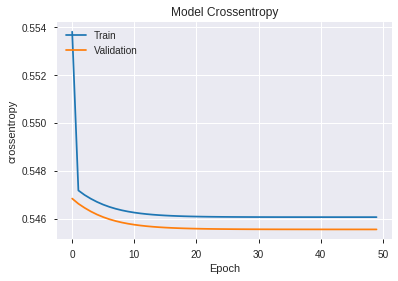

In [151]:
draw_history(history)

In [154]:

y_test_pred = gbm.predict(X_test,pred_leaf=True)
model=load_model("GBDT+LR.h5")
pred_ans=model.predict_generator(myGenerator(y_test_pred,y_test,1024),steps=len(y_test)//1024)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [155]:
draw_history(history)
threshold=getTop20Threshold(pred_ans)
Matrics(y_test.values[:len(pred_ans)], pred_ans,threshold) 

0.5 0.1948828125
precision: [0.74279915 0.67391595]
recall: [0.90394607 0.38809157]
fscore: [0.81548787 0.49254096]
support [101620  51980]
test LogLoss 0.5394
test AUC 0.7617


In [241]:
print("best n_estimators",len(cvResult['binary_logloss-mean']))
print("Best cv score",pd.Series(cvResult['binary_logloss-mean']).min())

best n_estimators 1000
Best cv score 0.5696908140682054


## xGBoost

In [ ]:
import xgboost as xgb


# impression >= 100

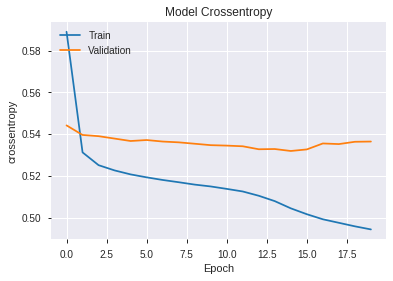

0.5 0.26129748973546074
0.51 0.25094849540044695
0.52 0.24152201029052545
0.53 0.23233589730263499
0.54 0.2232862117353568
0.55 0.21392469206382206
0.56 0.2049984408294787
0.5700000000000001 0.19592926563068447
0.5700000000000001 0.19592926563068447


In [205]:
model=load_model("AutoInt.h5",custom_objects={'NoMask' : NoMask,"Linear":Linear,"InteractingLayer":InteractingLayer,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
pred_ans=model.predict(test_model_input,batch_size=256)
draw_history(history)
from numpy import arange
for threshold in arange(0.5,1.0,0.01):
    count=pd.DataFrame(BinaryValue(pred_ans,threshold))
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
    print(threshold,positiveRate)
    if positiveRate<0.2:
        print(threshold,positiveRate)
        break

In [7]:
data = pd.read_csv("./dac/Adwords/AllFeatures2020.csv")
pandas_profiling.ProfileReport(data)

In [ ]:
rawData = pd.read_csv("./dac/Adwords/AW_AllFeatures.csv")
pandas_profiling.ProfileReport(Data)

In [198]:
value_counts = data['target'].value_counts()

In [199]:
print(value_counts)

1    65554
0    42226
Name: target, dtype: int64


In [10]:
from deepctr.inputs import build_input_features, get_linear_logit, input_from_feature_columns
from deepctr.layers.core import PredictionLayer
from tensorflow.python.keras.models import Model
model = LR(linear_feature_columns, task='binary',l2_reg_linear=3e-4)
model.compile("adam", "binary_crossentropy",metrics=['binary_crossentropy'])
earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,batch_size=512, epochs=50, verbose=2, validation_split=0.2)
LRpred_ans = model.predict(test_model_input, batch_size=512)

Train on 68979 samples, validate on 17245 samples
Epoch 1/50
68979/68979 - 3s - loss: 0.6538 - binary_crossentropy: 0.6520 - val_loss: 0.6180 - val_binary_crossentropy: 0.6143
Epoch 2/50
68979/68979 - 1s - loss: 0.6015 - binary_crossentropy: 0.5956 - val_loss: 0.6060 - val_binary_crossentropy: 0.5980
Epoch 3/50
68979/68979 - 1s - loss: 0.5892 - binary_crossentropy: 0.5793 - val_loss: 0.5991 - val_binary_crossentropy: 0.5876
Epoch 4/50
68979/68979 - 1s - loss: 0.5842 - binary_crossentropy: 0.5715 - val_loss: 0.5988 - val_binary_crossentropy: 0.5851
Epoch 5/50
68979/68979 - 1s - loss: 0.5829 - binary_crossentropy: 0.5684 - val_loss: 0.5979 - val_binary_crossentropy: 0.5828
Epoch 6/50
68979/68979 - 1s - loss: 0.5820 - binary_crossentropy: 0.5664 - val_loss: 0.6053 - val_binary_crossentropy: 0.5894
Epoch 7/50
68979/68979 - 1s - loss: 0.5821 - binary_crossentropy: 0.5658 - val_loss: 0.5988 - val_binary_crossentropy: 0.5824
Epoch 8/50
68979/68979 - 1s - loss: 0.5807 - binary_crossentropy: 0.

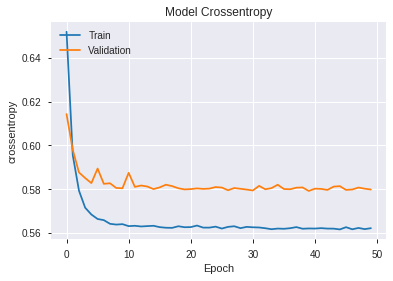

In [13]:
draw_history(history)

In [14]:
print("Test LogLoss", round(log_loss(test[target].values, LRpred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, LRpred_ans), 4))

Test LogLoss 0.5785
test AUC 0.7408


<Figure size 432x288 with 0 Axes>

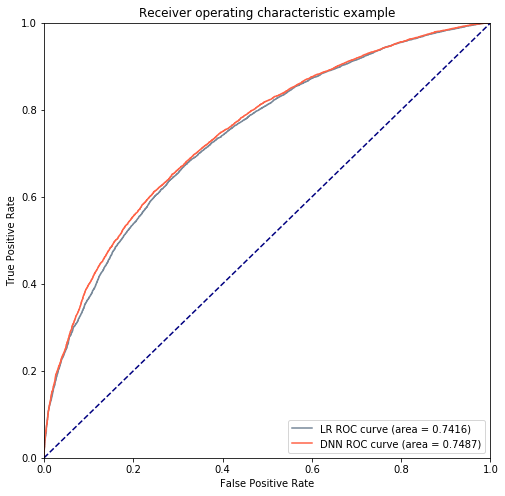

In [177]:
draw_curve(test[target].values,LRpred_ans,test[target].values,pred_ans)

In [15]:
import kerastuner
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow import keras

def buildxDeepFM(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
     model=DeepFM(linear_feature_columns, dnn_feature_column       s, dnn_hidden_units=(256, 512,256),
           l2_reg_linear=0.0005, l2_reg_embedding=0.0005, l2_reg_dnn                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   =0.0005, init_std=0.0001, seed=1024, dnn_dropout=dropout_rate,
           dnn_activation='relu', dnn_use_bn=False, task='binary')
    model = xDeepFM(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
def buildDeepFM(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = DeepFM(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildPNN(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = PNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
    
def buildFNN(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = FNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildFGCNN(hp):
    # k=40
    # conv=7*1
    #Kernal=[14,16,18,20]
    #new=[3,3,3,3]
    # ruenet=[4096,2048,1/]
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.8, step=0.1, default=0.5)
    model = FGCNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildAutoint(hp):
   
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.8, step=0.1, default=0.5)
    model=AutoInt(linear_feature_columns, dnn_feature_columns, dnn_use_bn=True, dnn_dropout=0, task='binary' )
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
    
    
    
class MyTuner(kerastuner.tuners.BayesianOptimization):
    def run_trial(self, trial, *args, **kwargs):
        # You can add additional HyperParameters for preprocessing and custom training loops
        # via overriding `run_trial`
        kwargs['batch_size'] = trial.hyperparameters.Int('batch_size', 256, 1024, step=256)
        kwargs['epochs'] = trial.hyperparameters.Int('epochs', 10, 30, step=5)
        super(MyTuner, self).run_trial(trial, *args, **kwargs)
        
def HypermeterTune(model,directory):
    tuner = MyTuner(
        model,
        objective='val_binary_crossentropy',
        max_trials=5,
        executions_per_trial=2,
        directory=directory)

    tuner.search_space_summary()

    tuner.search(x=train_model_input,
                 y=train[target].values,callbacks=[tf.keras.callbacks.EarlyStopping('val_binary_crossentropy', patience=3)],
                 validation_data=(test_model_input,test[target].values))
    print("finished")
    return tuner


In [26]:
def bestModel(tuner,batch_size,modelName):
    hps = tuner.get_best_hyperparameters()[0]
    es = EarlyStopping('val_binary_crossentropy', patience=3)
    best_model = tuner.hypermodel.build(hps)
    #
    history = best_model.fit(train_model_input, train[target].values,
                                batch_size=batch_size, epochs=20,callbacks=[es], verbose=2,validation_split=0.2)
    pred_ans = best_model.predict(test_model_input, batch_size=256)
    print("Final Result of ",modelName, " :")
    print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
    print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

## Train DeepFM

In [149]:
DeepFMtuner=HypermeterTune(buildDeepFM,"AWDeepFMPaper")

Train on 86224 samples, validate on 21556 samples
Epoch 1/10


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 16:57 - loss: 0.7343 - binary_crossentropy: 0.73 - ETA: 2:25 - loss: 0.7143 - binary_crossentropy: 0.7143 - ETA: 1:42 - loss: 0.7160 - binary_crossentropy: 0.716 - ETA: 1:13 - loss: 0.7191 - binary_crossentropy: 0.719 - ETA: 1:09 - loss: 0.7174 - binary_crossentropy: 0.717 - ETA: 1:02 - loss: 0.7192 - binary_crossentropy: 0.719 - ETA: 56s - loss: 0.7191 - binary_crossentropy: 0.719 - ETA: 42s - loss: 0.7187 - binary_crossentropy: 0.71 - ETA: 37s - loss: 0.7184 - binary_crossentropy: 0.71 - ETA: 30s - loss: 0.7174 - binary_crossentropy: 0.71 - ETA: 29s - loss: 0.7167 - binary_crossentropy: 0.71 - ETA: 26s - loss: 0.7177 - binary_crossentropy: 0.71 - ETA: 23s - loss: 0.7169 - binary_crossentropy: 0.71 - ETA: 22s - loss: 0.7154 - binary_crossentropy: 0.71 - ETA: 20s - loss: 0.7144 - binary_crossentropy: 0.71 - ETA: 20s - loss: 0.7141 - binary_crossentropy: 0.71 - ETA: 18s - loss: 0.7123 - binary_crossentropy: 0.71 - ETA: 18s - loss: 0.71

86224/86224 [==============================] - ETA: 13s - loss: 0.6458 - binary_crossentropy: 0.64 - ETA: 9s - loss: 0.6398 - binary_crossentropy: 0.6397 - ETA: 13s - loss: 0.6438 - binary_crossentropy: 0.64 - ETA: 7s - loss: 0.6524 - binary_crossentropy: 0.6524 - ETA: 6s - loss: 0.6510 - binary_crossentropy: 0.651 - ETA: 4s - loss: 0.6446 - binary_crossentropy: 0.644 - ETA: 5s - loss: 0.6454 - binary_crossentropy: 0.645 - ETA: 5s - loss: 0.6450 - binary_crossentropy: 0.645 - ETA: 4s - loss: 0.6461 - binary_crossentropy: 0.646 - ETA: 4s - loss: 0.6475 - binary_crossentropy: 0.647 - ETA: 4s - loss: 0.6466 - binary_crossentropy: 0.646 - ETA: 4s - loss: 0.6466 - binary_crossentropy: 0.646 - ETA: 4s - loss: 0.6469 - binary_crossentropy: 0.646 - ETA: 4s - loss: 0.6464 - binary_crossentropy: 0.646 - ETA: 4s - loss: 0.6477 - binary_crossentropy: 0.647 - ETA: 5s - loss: 0.6481 - binary_crossentropy: 0.648 - ETA: 4s - loss: 0.6483 - binary_crossentropy: 0.648 - ETA: 4s - loss: 0.6482 - binary_c

86224/86224 [==============================] - ETA: 1s - loss: 0.6319 - binary_crossentropy: 0.631 - ETA: 3s - loss: 0.6320 - binary_crossentropy: 0.631 - ETA: 4s - loss: 0.6325 - binary_crossentropy: 0.632 - ETA: 3s - loss: 0.6314 - binary_crossentropy: 0.631 - ETA: 3s - loss: 0.6293 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6291 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6301 - binary_crossentropy: 0.630 - ETA: 3s - loss: 0.6298 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6299 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6315 - binary_crossentropy: 0.631 - ETA: 3s - loss: 0.6321 - binary_crossentropy: 0.632 - ETA: 3s - loss: 0.6312 - binary_crossentropy: 0.631 - ETA: 3s - loss: 0.6306 - binary_crossentropy: 0.630 - ETA: 3s - loss: 0.6307 - binary_crossentropy: 0.630 - ETA: 3s - loss: 0.6297 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6299 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6294 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6295 - binary_cro

86224/86224 [==============================] - ETA: 2s - loss: 0.6197 - binary_crossentropy: 0.619 - ETA: 4s - loss: 0.6017 - binary_crossentropy: 0.601 - ETA: 6s - loss: 0.6016 - binary_crossentropy: 0.601 - ETA: 5s - loss: 0.6071 - binary_crossentropy: 0.607 - ETA: 6s - loss: 0.6100 - binary_crossentropy: 0.610 - ETA: 4s - loss: 0.6127 - binary_crossentropy: 0.612 - ETA: 4s - loss: 0.6141 - binary_crossentropy: 0.614 - ETA: 4s - loss: 0.6141 - binary_crossentropy: 0.614 - ETA: 3s - loss: 0.6139 - binary_crossentropy: 0.613 - ETA: 3s - loss: 0.6139 - binary_crossentropy: 0.613 - ETA: 3s - loss: 0.6128 - binary_crossentropy: 0.612 - ETA: 4s - loss: 0.6121 - binary_crossentropy: 0.612 - ETA: 4s - loss: 0.6126 - binary_crossentropy: 0.612 - ETA: 3s - loss: 0.6125 - binary_crossentropy: 0.612 - ETA: 3s - loss: 0.6124 - binary_crossentropy: 0.612 - ETA: 3s - loss: 0.6131 - binary_crossentropy: 0.613 - ETA: 4s - loss: 0.6123 - binary_crossentropy: 0.612 - ETA: 4s - loss: 0.6125 - binary_cro

86224/86224 [==============================] - ETA: 3s - loss: 0.5555 - binary_crossentropy: 0.555 - ETA: 4s - loss: 0.5855 - binary_crossentropy: 0.585 - ETA: 4s - loss: 0.5913 - binary_crossentropy: 0.591 - ETA: 6s - loss: 0.5932 - binary_crossentropy: 0.593 - ETA: 6s - loss: 0.5949 - binary_crossentropy: 0.594 - ETA: 7s - loss: 0.5934 - binary_crossentropy: 0.593 - ETA: 5s - loss: 0.5942 - binary_crossentropy: 0.594 - ETA: 5s - loss: 0.5954 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5960 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5948 - binary_crossentropy: 0.594 - ETA: 4s - loss: 0.5956 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5962 - binary_crossentropy: 0.596 - ETA: 4s - loss: 0.5959 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5952 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5949 - binary_crossentropy: 0.594 - ETA: 4s - loss: 0.5952 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5949 - binary_crossentropy: 0.594 - ETA: 4s - loss: 0.5945 - binary_cro

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 12:38 - loss: 0.7314 - binary_crossentropy: 0.73 - ETA: 2:36 - loss: 0.7397 - binary_crossentropy: 0.7396 - ETA: 1:05 - loss: 0.7426 - binary_crossentropy: 0.742 - ETA: 53s - loss: 0.7450 - binary_crossentropy: 0.744 - ETA: 34s - loss: 0.7438 - binary_crossentropy: 0.74 - ETA: 31s - loss: 0.7424 - binary_crossentropy: 0.74 - ETA: 28s - loss: 0.7417 - binary_crossentropy: 0.74 - ETA: 24s - loss: 0.7401 - binary_crossentropy: 0.74 - ETA: 21s - loss: 0.7373 - binary_crossentropy: 0.73 - ETA: 21s - loss: 0.7362 - binary_crossentropy: 0.73 - ETA: 19s - loss: 0.7357 - binary_crossentropy: 0.73 - ETA: 17s - loss: 0.7343 - binary_crossentropy: 0.73 - ETA: 17s - loss: 0.7340 - binary_crossentropy: 0.73 - ETA: 17s - loss: 0.7339 - binary_crossentropy: 0.73 - ETA: 16s - loss: 0.7334 - binary_crossentropy: 0.73 - ETA: 14s - loss: 0.7321 - binary_crossentropy: 0.73 - ETA: 14s - loss: 0.7316 - binary_crossentropy: 0.73 - ETA: 13s - loss: 0.7305 - b

86224/86224 [==============================] - ETA: 1s - loss: 0.6492 - binary_crossentropy: 0.649 - ETA: 3s - loss: 0.6648 - binary_crossentropy: 0.664 - ETA: 4s - loss: 0.6613 - binary_crossentropy: 0.661 - ETA: 4s - loss: 0.6551 - binary_crossentropy: 0.655 - ETA: 4s - loss: 0.6525 - binary_crossentropy: 0.652 - ETA: 3s - loss: 0.6514 - binary_crossentropy: 0.651 - ETA: 4s - loss: 0.6510 - binary_crossentropy: 0.651 - ETA: 3s - loss: 0.6532 - binary_crossentropy: 0.653 - ETA: 3s - loss: 0.6538 - binary_crossentropy: 0.653 - ETA: 3s - loss: 0.6537 - binary_crossentropy: 0.653 - ETA: 3s - loss: 0.6541 - binary_crossentropy: 0.654 - ETA: 3s - loss: 0.6543 - binary_crossentropy: 0.654 - ETA: 3s - loss: 0.6549 - binary_crossentropy: 0.654 - ETA: 3s - loss: 0.6551 - binary_crossentropy: 0.655 - ETA: 3s - loss: 0.6551 - binary_crossentropy: 0.655 - ETA: 3s - loss: 0.6547 - binary_crossentropy: 0.654 - ETA: 3s - loss: 0.6548 - binary_crossentropy: 0.654 - ETA: 3s - loss: 0.6543 - binary_cro

86224/86224 [==============================] - ETA: 6s - loss: 0.6356 - binary_crossentropy: 0.635 - ETA: 3s - loss: 0.6257 - binary_crossentropy: 0.625 - ETA: 3s - loss: 0.6295 - binary_crossentropy: 0.629 - ETA: 4s - loss: 0.6322 - binary_crossentropy: 0.632 - ETA: 4s - loss: 0.6308 - binary_crossentropy: 0.630 - ETA: 4s - loss: 0.6299 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6291 - binary_crossentropy: 0.629 - ETA: 4s - loss: 0.6283 - binary_crossentropy: 0.628 - ETA: 4s - loss: 0.6291 - binary_crossentropy: 0.629 - ETA: 3s - loss: 0.6279 - binary_crossentropy: 0.627 - ETA: 3s - loss: 0.6268 - binary_crossentropy: 0.626 - ETA: 3s - loss: 0.6269 - binary_crossentropy: 0.626 - ETA: 3s - loss: 0.6272 - binary_crossentropy: 0.627 - ETA: 3s - loss: 0.6271 - binary_crossentropy: 0.627 - ETA: 3s - loss: 0.6269 - binary_crossentropy: 0.626 - ETA: 3s - loss: 0.6262 - binary_crossentropy: 0.626 - ETA: 3s - loss: 0.6268 - binary_crossentropy: 0.626 - ETA: 3s - loss: 0.6268 - binary_cro

86224/86224 [==============================] - ETA: 2s - loss: 0.6285 - binary_crossentropy: 0.628 - ETA: 5s - loss: 0.6139 - binary_crossentropy: 0.613 - ETA: 5s - loss: 0.6114 - binary_crossentropy: 0.611 - ETA: 6s - loss: 0.6079 - binary_crossentropy: 0.607 - ETA: 6s - loss: 0.6062 - binary_crossentropy: 0.606 - ETA: 8s - loss: 0.6063 - binary_crossentropy: 0.606 - ETA: 5s - loss: 0.6086 - binary_crossentropy: 0.608 - ETA: 5s - loss: 0.6071 - binary_crossentropy: 0.607 - ETA: 4s - loss: 0.6078 - binary_crossentropy: 0.607 - ETA: 4s - loss: 0.6076 - binary_crossentropy: 0.607 - ETA: 4s - loss: 0.6085 - binary_crossentropy: 0.608 - ETA: 4s - loss: 0.6090 - binary_crossentropy: 0.608 - ETA: 4s - loss: 0.6091 - binary_crossentropy: 0.609 - ETA: 4s - loss: 0.6080 - binary_crossentropy: 0.607 - ETA: 4s - loss: 0.6063 - binary_crossentropy: 0.606 - ETA: 4s - loss: 0.6052 - binary_crossentropy: 0.605 - ETA: 4s - loss: 0.6045 - binary_crossentropy: 0.604 - ETA: 4s - loss: 0.6041 - binary_cro

86224/86224 [==============================] - ETA: 7s - loss: 0.5786 - binary_crossentropy: 0.578 - ETA: 7s - loss: 0.5926 - binary_crossentropy: 0.592 - ETA: 4s - loss: 0.5958 - binary_crossentropy: 0.595 - ETA: 4s - loss: 0.5922 - binary_crossentropy: 0.592 - ETA: 3s - loss: 0.5904 - binary_crossentropy: 0.590 - ETA: 4s - loss: 0.5891 - binary_crossentropy: 0.589 - ETA: 4s - loss: 0.5850 - binary_crossentropy: 0.584 - ETA: 5s - loss: 0.5842 - binary_crossentropy: 0.584 - ETA: 4s - loss: 0.5825 - binary_crossentropy: 0.582 - ETA: 4s - loss: 0.5827 - binary_crossentropy: 0.582 - ETA: 4s - loss: 0.5849 - binary_crossentropy: 0.584 - ETA: 3s - loss: 0.5862 - binary_crossentropy: 0.586 - ETA: 3s - loss: 0.5855 - binary_crossentropy: 0.585 - ETA: 3s - loss: 0.5853 - binary_crossentropy: 0.585 - ETA: 3s - loss: 0.5863 - binary_crossentropy: 0.586 - ETA: 3s - loss: 0.5860 - binary_crossentropy: 0.585 - ETA: 3s - loss: 0.5856 - binary_crossentropy: 0.585 - ETA: 3s - loss: 0.5852 - binary_cro

Train on 86224 samples, validate on 21556 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 4:20 - loss: 0.7450 - binary_crossentropy: 0.745 - ETA: 1:05 - loss: 0.7289 - binary_crossentropy: 0.728 - ETA: 52s - loss: 0.7206 - binary_crossentropy: 0.720 - ETA: 32s - loss: 0.7294 - binary_crossentropy: 0.72 - ETA: 29s - loss: 0.7271 - binary_crossentropy: 0.72 - ETA: 18s - loss: 0.7254 - binary_crossentropy: 0.72 - ETA: 16s - loss: 0.7259 - binary_crossentropy: 0.72 - ETA: 12s - loss: 0.7213 - binary_crossentropy: 0.72 - ETA: 10s - loss: 0.7217 - binary_crossentropy: 0.72 - ETA: 9s - loss: 0.7207 - binary_crossentropy: 0.7206 - ETA: 8s - loss: 0.7205 - binary_crossentropy: 0.720 - ETA: 7s - loss: 0.7201 - binary_crossentropy: 0.720 - ETA: 6s - loss: 0.7178 - binary_crossentropy: 0.717 - ETA: 5s - loss: 0.7166 - binary_crossentropy: 0.716 - ETA: 5s - loss: 0.7149 - binary_crossentropy: 0.714 - ETA: 5s - loss: 0.7150 - binary_crossentropy: 0.715 - ETA: 4s - loss: 0.7145 - binary_crossentropy: 0.714 - ETA: 3s - loss: 0.7131 - bina

Epoch 8/25
86224/86224 [==============================] - ETA: 0s - loss: 0.6393 - binary_crossentropy: 0.639 - ETA: 1s - loss: 0.6308 - binary_crossentropy: 0.630 - ETA: 1s - loss: 0.6329 - binary_crossentropy: 0.632 - ETA: 1s - loss: 0.6329 - binary_crossentropy: 0.632 - ETA: 1s - loss: 0.6313 - binary_crossentropy: 0.631 - ETA: 1s - loss: 0.6295 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6291 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6292 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6296 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6289 - binary_crossentropy: 0.628 - ETA: 1s - loss: 0.6295 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6293 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6295 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6292 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6299 - binary_crossentropy: 0.629 - ETA: 1s - loss: 0.6303 - binary_crossentropy: 0.630 - ETA: 0s - loss: 0.6299 - binary_crossentropy: 0.629 - ETA: 0s - loss: 0.6296 -

Epoch 16/25
86224/86224 [==============================] - ETA: 1s - loss: 0.5607 - binary_crossentropy: 0.560 - ETA: 1s - loss: 0.5844 - binary_crossentropy: 0.584 - ETA: 2s - loss: 0.5840 - binary_crossentropy: 0.583 - ETA: 2s - loss: 0.5840 - binary_crossentropy: 0.583 - ETA: 2s - loss: 0.5837 - binary_crossentropy: 0.583 - ETA: 2s - loss: 0.5857 - binary_crossentropy: 0.585 - ETA: 2s - loss: 0.5845 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5845 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5858 - binary_crossentropy: 0.585 - ETA: 1s - loss: 0.5855 - binary_crossentropy: 0.585 - ETA: 1s - loss: 0.5868 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5867 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5865 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5868 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5864 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5865 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5865 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5873 

Epoch 20/25
86224/86224 [==============================] - ETA: 5s - loss: 0.5601 - binary_crossentropy: 0.560 - ETA: 6s - loss: 0.5805 - binary_crossentropy: 0.580 - ETA: 3s - loss: 0.5786 - binary_crossentropy: 0.578 - ETA: 2s - loss: 0.5769 - binary_crossentropy: 0.576 - ETA: 2s - loss: 0.5799 - binary_crossentropy: 0.579 - ETA: 1s - loss: 0.5801 - binary_crossentropy: 0.579 - ETA: 1s - loss: 0.5787 - binary_crossentropy: 0.578 - ETA: 1s - loss: 0.5775 - binary_crossentropy: 0.577 - ETA: 1s - loss: 0.5760 - binary_crossentropy: 0.575 - ETA: 1s - loss: 0.5763 - binary_crossentropy: 0.576 - ETA: 1s - loss: 0.5756 - binary_crossentropy: 0.575 - ETA: 1s - loss: 0.5757 - binary_crossentropy: 0.575 - ETA: 1s - loss: 0.5765 - binary_crossentropy: 0.576 - ETA: 1s - loss: 0.5768 - binary_crossentropy: 0.576 - ETA: 1s - loss: 0.5768 - binary_crossentropy: 0.576 - ETA: 1s - loss: 0.5767 - binary_crossentropy: 0.576 - ETA: 1s - loss: 0.5766 - binary_crossentropy: 0.576 - ETA: 1s - loss: 0.5768 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 4:20 - loss: 0.7079 - binary_crossentropy: 0.707 - ETA: 1:28 - loss: 0.7073 - binary_crossentropy: 0.707 - ETA: 37s - loss: 0.7101 - binary_crossentropy: 0.710 - ETA: 29s - loss: 0.7054 - binary_crossentropy: 0.70 - ETA: 16s - loss: 0.7034 - binary_crossentropy: 0.70 - ETA: 13s - loss: 0.7025 - binary_crossentropy: 0.70 - ETA: 12s - loss: 0.7023 - binary_crossentropy: 0.70 - ETA: 10s - loss: 0.7002 - binary_crossentropy: 0.70 - ETA: 8s - loss: 0.7003 - binary_crossentropy: 0.7003 - ETA: 7s - loss: 0.6997 - binary_crossentropy: 0.699 - ETA: 7s - loss: 0.6997 - binary_crossentropy: 0.699 - ETA: 6s - loss: 0.7001 - binary_crossentropy: 0.700 - ETA: 6s - loss: 0.7003 - binary_crossentropy: 0.700 - ETA: 5s - loss: 0.7001 - binary_crossentropy: 0.700 - ETA: 5s - loss: 0.6998 - binary_crossentropy: 0.699 - ETA: 4s - loss: 0.6990 - binary_crossentropy: 0.699 - ETA: 4s - loss: 0.6990 - binary_crossentropy: 0.699 - ETA: 3s - loss: 0.6986 - bina

Epoch 5/25
86224/86224 [==============================] - ETA: 1s - loss: 0.6514 - binary_crossentropy: 0.651 - ETA: 1s - loss: 0.6512 - binary_crossentropy: 0.651 - ETA: 1s - loss: 0.6437 - binary_crossentropy: 0.643 - ETA: 1s - loss: 0.6462 - binary_crossentropy: 0.646 - ETA: 1s - loss: 0.6462 - binary_crossentropy: 0.646 - ETA: 1s - loss: 0.6461 - binary_crossentropy: 0.646 - ETA: 1s - loss: 0.6467 - binary_crossentropy: 0.646 - ETA: 1s - loss: 0.6480 - binary_crossentropy: 0.648 - ETA: 1s - loss: 0.6482 - binary_crossentropy: 0.648 - ETA: 1s - loss: 0.6483 - binary_crossentropy: 0.648 - ETA: 1s - loss: 0.6482 - binary_crossentropy: 0.648 - ETA: 1s - loss: 0.6488 - binary_crossentropy: 0.648 - ETA: 1s - loss: 0.6492 - binary_crossentropy: 0.649 - ETA: 1s - loss: 0.6494 - binary_crossentropy: 0.649 - ETA: 1s - loss: 0.6485 - binary_crossentropy: 0.648 - ETA: 1s - loss: 0.6480 - binary_crossentropy: 0.647 - ETA: 1s - loss: 0.6479 - binary_crossentropy: 0.647 - ETA: 1s - loss: 0.6477 -

86224/86224 [==============================] - ETA: 1s - loss: 0.6061 - binary_crossentropy: 0.606 - ETA: 2s - loss: 0.6143 - binary_crossentropy: 0.614 - ETA: 2s - loss: 0.6113 - binary_crossentropy: 0.611 - ETA: 2s - loss: 0.6125 - binary_crossentropy: 0.612 - ETA: 2s - loss: 0.6142 - binary_crossentropy: 0.614 - ETA: 2s - loss: 0.6128 - binary_crossentropy: 0.612 - ETA: 2s - loss: 0.6123 - binary_crossentropy: 0.612 - ETA: 1s - loss: 0.6116 - binary_crossentropy: 0.611 - ETA: 1s - loss: 0.6108 - binary_crossentropy: 0.610 - ETA: 1s - loss: 0.6109 - binary_crossentropy: 0.610 - ETA: 1s - loss: 0.6104 - binary_crossentropy: 0.610 - ETA: 1s - loss: 0.6097 - binary_crossentropy: 0.609 - ETA: 1s - loss: 0.6096 - binary_crossentropy: 0.609 - ETA: 1s - loss: 0.6096 - binary_crossentropy: 0.609 - ETA: 1s - loss: 0.6099 - binary_crossentropy: 0.609 - ETA: 1s - loss: 0.6103 - binary_crossentropy: 0.610 - ETA: 1s - loss: 0.6104 - binary_crossentropy: 0.610 - ETA: 1s - loss: 0.6104 - binary_cro

86224/86224 [==============================] - ETA: 1s - loss: 0.5769 - binary_crossentropy: 0.576 - ETA: 2s - loss: 0.5894 - binary_crossentropy: 0.589 - ETA: 1s - loss: 0.5898 - binary_crossentropy: 0.589 - ETA: 1s - loss: 0.5887 - binary_crossentropy: 0.588 - ETA: 1s - loss: 0.5882 - binary_crossentropy: 0.588 - ETA: 1s - loss: 0.5881 - binary_crossentropy: 0.587 - ETA: 1s - loss: 0.5867 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5872 - binary_crossentropy: 0.587 - ETA: 1s - loss: 0.5870 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5875 - binary_crossentropy: 0.587 - ETA: 1s - loss: 0.5870 - binary_crossentropy: 0.586 - ETA: 1s - loss: 0.5851 - binary_crossentropy: 0.585 - ETA: 1s - loss: 0.5850 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5850 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5851 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5841 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5845 - binary_crossentropy: 0.584 - ETA: 1s - loss: 0.5842 - binary_cro

86224/86224 [==============================] - ETA: 1s - loss: 0.5577 - binary_crossentropy: 0.557 - ETA: 2s - loss: 0.5766 - binary_crossentropy: 0.576 - ETA: 2s - loss: 0.5675 - binary_crossentropy: 0.567 - ETA: 2s - loss: 0.5687 - binary_crossentropy: 0.568 - ETA: 2s - loss: 0.5693 - binary_crossentropy: 0.569 - ETA: 2s - loss: 0.5680 - binary_crossentropy: 0.567 - ETA: 1s - loss: 0.5697 - binary_crossentropy: 0.569 - ETA: 1s - loss: 0.5697 - binary_crossentropy: 0.569 - ETA: 1s - loss: 0.5683 - binary_crossentropy: 0.568 - ETA: 1s - loss: 0.5695 - binary_crossentropy: 0.569 - ETA: 1s - loss: 0.5706 - binary_crossentropy: 0.570 - ETA: 1s - loss: 0.5707 - binary_crossentropy: 0.570 - ETA: 1s - loss: 0.5709 - binary_crossentropy: 0.570 - ETA: 1s - loss: 0.5730 - binary_crossentropy: 0.572 - ETA: 1s - loss: 0.5733 - binary_crossentropy: 0.573 - ETA: 1s - loss: 0.5726 - binary_crossentropy: 0.572 - ETA: 1s - loss: 0.5722 - binary_crossentropy: 0.572 - ETA: 1s - loss: 0.5725 - binary_cro

Train on 86224 samples, validate on 21556 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 3:18 - loss: 0.7717 - binary_crossentropy: 0.771 - ETA: 31s - loss: 0.7362 - binary_crossentropy: 0.736 - ETA: 20s - loss: 0.7245 - binary_crossentropy: 0.72 - ETA: 11s - loss: 0.7114 - binary_crossentropy: 0.71 - ETA: 9s - loss: 0.7084 - binary_crossentropy: 0.7084 - ETA: 8s - loss: 0.7064 - binary_crossentropy: 0.706 - ETA: 6s - loss: 0.7022 - binary_crossentropy: 0.702 - ETA: 5s - loss: 0.7012 - binary_crossentropy: 0.701 - ETA: 5s - loss: 0.6981 - binary_crossentropy: 0.698 - ETA: 4s - loss: 0.6959 - binary_crossentropy: 0.695 - ETA: 4s - loss: 0.6940 - binary_crossentropy: 0.693 - ETA: 3s - loss: 0.6935 - binary_crossentropy: 0.693 - ETA: 3s - loss: 0.6913 - binary_crossentropy: 0.691 - ETA: 2s - loss: 0.6885 - binary_crossentropy: 0.688 - ETA: 2s - loss: 0.6868 - binary_crossentropy: 0.686 - ETA: 1s - loss: 0.6843 - binary_crossentropy: 0.684 - ETA: 1s - loss: 0.6819 - binary_crossentropy: 0.681 - ETA: 1s - loss: 0.6801 - binary

86224/86224 [==============================] - ETA: 2s - loss: 0.5637 - binary_crossentropy: 0.563 - ETA: 1s - loss: 0.5531 - binary_crossentropy: 0.552 - ETA: 1s - loss: 0.5574 - binary_crossentropy: 0.556 - ETA: 1s - loss: 0.5563 - binary_crossentropy: 0.555 - ETA: 1s - loss: 0.5558 - binary_crossentropy: 0.555 - ETA: 1s - loss: 0.5553 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5551 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5549 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5554 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5550 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5553 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5556 - binary_crossentropy: 0.554 - ETA: 1s - loss: 0.5563 - binary_crossentropy: 0.555 - ETA: 0s - loss: 0.5554 - binary_crossentropy: 0.554 - ETA: 0s - loss: 0.5546 - binary_crossentropy: 0.553 - ETA: 0s - loss: 0.5546 - binary_crossentropy: 0.553 - ETA: 0s - loss: 0.5546 - binary_crossentropy: 0.553 - ETA: 0s - loss: 0.5548 - binary_cro

Epoch 16/25
86224/86224 [==============================] - ETA: 1s - loss: 0.5583 - binary_crossentropy: 0.557 - ETA: 1s - loss: 0.5520 - binary_crossentropy: 0.551 - ETA: 1s - loss: 0.5474 - binary_crossentropy: 0.546 - ETA: 1s - loss: 0.5459 - binary_crossentropy: 0.544 - ETA: 2s - loss: 0.5465 - binary_crossentropy: 0.545 - ETA: 2s - loss: 0.5474 - binary_crossentropy: 0.546 - ETA: 1s - loss: 0.5479 - binary_crossentropy: 0.547 - ETA: 1s - loss: 0.5467 - binary_crossentropy: 0.545 - ETA: 1s - loss: 0.5477 - binary_crossentropy: 0.546 - ETA: 1s - loss: 0.5485 - binary_crossentropy: 0.547 - ETA: 1s - loss: 0.5487 - binary_crossentropy: 0.547 - ETA: 1s - loss: 0.5490 - binary_crossentropy: 0.548 - ETA: 1s - loss: 0.5491 - binary_crossentropy: 0.548 - ETA: 1s - loss: 0.5497 - binary_crossentropy: 0.548 - ETA: 1s - loss: 0.5502 - binary_crossentropy: 0.549 - ETA: 0s - loss: 0.5502 - binary_crossentropy: 0.549 - ETA: 0s - loss: 0.5502 - binary_crossentropy: 0.549 - ETA: 0s - loss: 0.5495 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 3:08 - loss: 0.7700 - binary_crossentropy: 0.769 - ETA: 46s - loss: 0.7400 - binary_crossentropy: 0.740 - ETA: 26s - loss: 0.7259 - binary_crossentropy: 0.72 - ETA: 16s - loss: 0.7164 - binary_crossentropy: 0.71 - ETA: 15s - loss: 0.7144 - binary_crossentropy: 0.71 - ETA: 10s - loss: 0.7062 - binary_crossentropy: 0.70 - ETA: 9s - loss: 0.7042 - binary_crossentropy: 0.7042 - ETA: 7s - loss: 0.7017 - binary_crossentropy: 0.701 - ETA: 6s - loss: 0.7008 - binary_crossentropy: 0.700 - ETA: 6s - loss: 0.7003 - binary_crossentropy: 0.700 - ETA: 5s - loss: 0.6952 - binary_crossentropy: 0.695 - ETA: 5s - loss: 0.6945 - binary_crossentropy: 0.694 - ETA: 3s - loss: 0.6907 - binary_crossentropy: 0.690 - ETA: 3s - loss: 0.6895 - binary_crossentropy: 0.689 - ETA: 3s - loss: 0.6885 - binary_crossentropy: 0.688 - ETA: 2s - loss: 0.6855 - binary_crossentropy: 0.685 - ETA: 2s - loss: 0.6836 - binary_crossentropy: 0.683 - ETA: 1s - loss: 0.6819 - binary

86224/86224 [==============================] - ETA: 1s - loss: 0.5536 - binary_crossentropy: 0.552 - ETA: 1s - loss: 0.5560 - binary_crossentropy: 0.555 - ETA: 1s - loss: 0.5604 - binary_crossentropy: 0.559 - ETA: 1s - loss: 0.5569 - binary_crossentropy: 0.556 - ETA: 1s - loss: 0.5572 - binary_crossentropy: 0.556 - ETA: 1s - loss: 0.5589 - binary_crossentropy: 0.558 - ETA: 1s - loss: 0.5592 - binary_crossentropy: 0.558 - ETA: 1s - loss: 0.5586 - binary_crossentropy: 0.557 - ETA: 1s - loss: 0.5574 - binary_crossentropy: 0.556 - ETA: 1s - loss: 0.5602 - binary_crossentropy: 0.559 - ETA: 1s - loss: 0.5602 - binary_crossentropy: 0.559 - ETA: 0s - loss: 0.5602 - binary_crossentropy: 0.559 - ETA: 0s - loss: 0.5594 - binary_crossentropy: 0.558 - ETA: 0s - loss: 0.5597 - binary_crossentropy: 0.558 - ETA: 0s - loss: 0.5594 - binary_crossentropy: 0.558 - ETA: 0s - loss: 0.5592 - binary_crossentropy: 0.558 - ETA: 0s - loss: 0.5594 - binary_crossentropy: 0.558 - ETA: 0s - loss: 0.5601 - binary_cro

Epoch 21/25
86224/86224 [==============================] - ETA: 0s - loss: 0.5442 - binary_crossentropy: 0.543 - ETA: 1s - loss: 0.5605 - binary_crossentropy: 0.559 - ETA: 1s - loss: 0.5528 - binary_crossentropy: 0.551 - ETA: 1s - loss: 0.5516 - binary_crossentropy: 0.550 - ETA: 1s - loss: 0.5523 - binary_crossentropy: 0.551 - ETA: 1s - loss: 0.5518 - binary_crossentropy: 0.550 - ETA: 1s - loss: 0.5524 - binary_crossentropy: 0.551 - ETA: 1s - loss: 0.5530 - binary_crossentropy: 0.551 - ETA: 1s - loss: 0.5531 - binary_crossentropy: 0.552 - ETA: 1s - loss: 0.5514 - binary_crossentropy: 0.550 - ETA: 1s - loss: 0.5522 - binary_crossentropy: 0.551 - ETA: 0s - loss: 0.5519 - binary_crossentropy: 0.550 - ETA: 0s - loss: 0.5520 - binary_crossentropy: 0.550 - ETA: 0s - loss: 0.5531 - binary_crossentropy: 0.552 - ETA: 0s - loss: 0.5517 - binary_crossentropy: 0.550 - ETA: 0s - loss: 0.5519 - binary_crossentropy: 0.550 - ETA: 0s - loss: 0.5518 - binary_crossentropy: 0.550 - ETA: 0s - loss: 0.5520 

Train on 86224 samples, validate on 21556 samples
Epoch 1/20


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 3:00 - loss: 0.7155 - binary_crossentropy: 0.715 - ETA: 35s - loss: 0.6807 - binary_crossentropy: 0.680 - ETA: 19s - loss: 0.6649 - binary_crossentropy: 0.66 - ETA: 17s - loss: 0.6623 - binary_crossentropy: 0.66 - ETA: 12s - loss: 0.6542 - binary_crossentropy: 0.65 - ETA: 9s - loss: 0.6474 - binary_crossentropy: 0.6472 - ETA: 7s - loss: 0.6430 - binary_crossentropy: 0.642 - ETA: 6s - loss: 0.6392 - binary_crossentropy: 0.638 - ETA: 4s - loss: 0.6338 - binary_crossentropy: 0.633 - ETA: 4s - loss: 0.6322 - binary_crossentropy: 0.631 - ETA: 4s - loss: 0.6316 - binary_crossentropy: 0.631 - ETA: 3s - loss: 0.6277 - binary_crossentropy: 0.627 - ETA: 2s - loss: 0.6247 - binary_crossentropy: 0.624 - ETA: 2s - loss: 0.6235 - binary_crossentropy: 0.623 - ETA: 2s - loss: 0.6216 - binary_crossentropy: 0.621 - ETA: 2s - loss: 0.6191 - binary_crossentropy: 0.618 - ETA: 1s - loss: 0.6164 - binary_crossentropy: 0.615 - ETA: 1s - loss: 0.6155 - binary

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 3:12 - loss: 0.7906 - binary_crossentropy: 0.790 - ETA: 47s - loss: 0.7214 - binary_crossentropy: 0.721 - ETA: 26s - loss: 0.6946 - binary_crossentropy: 0.69 - ETA: 20s - loss: 0.6851 - binary_crossentropy: 0.68 - ETA: 15s - loss: 0.6753 - binary_crossentropy: 0.67 - ETA: 14s - loss: 0.6721 - binary_crossentropy: 0.67 - ETA: 12s - loss: 0.6669 - binary_crossentropy: 0.66 - ETA: 11s - loss: 0.6645 - binary_crossentropy: 0.66 - ETA: 8s - loss: 0.6539 - binary_crossentropy: 0.6537 - ETA: 7s - loss: 0.6485 - binary_crossentropy: 0.648 - ETA: 5s - loss: 0.6404 - binary_crossentropy: 0.640 - ETA: 4s - loss: 0.6352 - binary_crossentropy: 0.634 - ETA: 3s - loss: 0.6307 - binary_crossentropy: 0.630 - ETA: 3s - loss: 0.6283 - binary_crossentropy: 0.627 - ETA: 2s - loss: 0.6271 - binary_crossentropy: 0.626 - ETA: 2s - loss: 0.6245 - binary_crossentropy: 0.623 - ETA: 2s - loss: 0.6232 - binary_crossentropy: 0.622 - ETA: 2s - loss: 0.6216 - binary

86224/86224 [==============================] - ETA: 0s - loss: 0.5023 - binary_crossentropy: 0.480 - ETA: 1s - loss: 0.5040 - binary_crossentropy: 0.482 - ETA: 1s - loss: 0.5029 - binary_crossentropy: 0.480 - ETA: 1s - loss: 0.5052 - binary_crossentropy: 0.483 - ETA: 2s - loss: 0.5080 - binary_crossentropy: 0.485 - ETA: 1s - loss: 0.5165 - binary_crossentropy: 0.494 - ETA: 1s - loss: 0.5156 - binary_crossentropy: 0.493 - ETA: 1s - loss: 0.5150 - binary_crossentropy: 0.492 - ETA: 1s - loss: 0.5174 - binary_crossentropy: 0.494 - ETA: 1s - loss: 0.5177 - binary_crossentropy: 0.495 - ETA: 1s - loss: 0.5185 - binary_crossentropy: 0.496 - ETA: 1s - loss: 0.5186 - binary_crossentropy: 0.496 - ETA: 0s - loss: 0.5194 - binary_crossentropy: 0.496 - ETA: 0s - loss: 0.5197 - binary_crossentropy: 0.497 - ETA: 0s - loss: 0.5201 - binary_crossentropy: 0.497 - ETA: 0s - loss: 0.5204 - binary_crossentropy: 0.497 - ETA: 0s - loss: 0.5214 - binary_crossentropy: 0.498 - ETA: 0s - loss: 0.5237 - binary_cro

Train on 86224 samples, validate on 21556 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 13:04 - loss: 0.8409 - binary_crossentropy: 0.84 - ETA: 6:41 - loss: 0.7844 - binary_crossentropy: 0.7844 - ETA: 2:44 - loss: 0.7435 - binary_crossentropy: 0.743 - ETA: 1:59 - loss: 0.7251 - binary_crossentropy: 0.725 - ETA: 1:35 - loss: 0.7137 - binary_crossentropy: 0.713 - ETA: 57s - loss: 0.6874 - binary_crossentropy: 0.687 - ETA: 48s - loss: 0.6810 - binary_crossentropy: 0.68 - ETA: 34s - loss: 0.6673 - binary_crossentropy: 0.66 - ETA: 32s - loss: 0.6640 - binary_crossentropy: 0.66 - ETA: 29s - loss: 0.6582 - binary_crossentropy: 0.65 - ETA: 25s - loss: 0.6538 - binary_crossentropy: 0.65 - ETA: 22s - loss: 0.6503 - binary_crossentropy: 0.65 - ETA: 20s - loss: 0.6499 - binary_crossentropy: 0.64 - ETA: 19s - loss: 0.6465 - binary_crossentropy: 0.64 - ETA: 19s - loss: 0.6459 - binary_crossentropy: 0.64 - ETA: 18s - loss: 0.6428 - binary_crossentropy: 0.64 - ETA: 18s - loss: 0.6431 - binary_crossentropy: 0.64 - ETA: 17s - loss: 0.6426

86224/86224 [==============================] - ETA: 3s - loss: 0.5725 - binary_crossentropy: 0.565 - ETA: 4s - loss: 0.5410 - binary_crossentropy: 0.534 - ETA: 4s - loss: 0.5406 - binary_crossentropy: 0.533 - ETA: 6s - loss: 0.5441 - binary_crossentropy: 0.537 - ETA: 6s - loss: 0.5497 - binary_crossentropy: 0.542 - ETA: 7s - loss: 0.5510 - binary_crossentropy: 0.544 - ETA: 6s - loss: 0.5556 - binary_crossentropy: 0.548 - ETA: 6s - loss: 0.5558 - binary_crossentropy: 0.548 - ETA: 5s - loss: 0.5565 - binary_crossentropy: 0.549 - ETA: 5s - loss: 0.5555 - binary_crossentropy: 0.548 - ETA: 5s - loss: 0.5557 - binary_crossentropy: 0.548 - ETA: 5s - loss: 0.5586 - binary_crossentropy: 0.551 - ETA: 5s - loss: 0.5578 - binary_crossentropy: 0.550 - ETA: 4s - loss: 0.5580 - binary_crossentropy: 0.550 - ETA: 5s - loss: 0.5582 - binary_crossentropy: 0.550 - ETA: 5s - loss: 0.5590 - binary_crossentropy: 0.551 - ETA: 5s - loss: 0.5620 - binary_crossentropy: 0.554 - ETA: 5s - loss: 0.5625 - binary_cro

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


86224/86224 [==============================] - ETA: 13:36 - loss: 0.7218 - binary_crossentropy: 0.72 - ETA: 3:26 - loss: 0.7113 - binary_crossentropy: 0.7113 - ETA: 2:48 - loss: 0.7024 - binary_crossentropy: 0.702 - ETA: 1:16 - loss: 0.6709 - binary_crossentropy: 0.670 - ETA: 1:06 - loss: 0.6688 - binary_crossentropy: 0.668 - ETA: 54s - loss: 0.6639 - binary_crossentropy: 0.663 - ETA: 52s - loss: 0.6614 - binary_crossentropy: 0.66 - ETA: 45s - loss: 0.6589 - binary_crossentropy: 0.65 - ETA: 33s - loss: 0.6528 - binary_crossentropy: 0.65 - ETA: 30s - loss: 0.6502 - binary_crossentropy: 0.65 - ETA: 24s - loss: 0.6461 - binary_crossentropy: 0.64 - ETA: 22s - loss: 0.6436 - binary_crossentropy: 0.64 - ETA: 21s - loss: 0.6424 - binary_crossentropy: 0.64 - ETA: 19s - loss: 0.6407 - binary_crossentropy: 0.64 - ETA: 18s - loss: 0.6391 - binary_crossentropy: 0.63 - ETA: 17s - loss: 0.6369 - binary_crossentropy: 0.63 - ETA: 15s - loss: 0.6333 - binary_crossentropy: 0.63 - ETA: 14s - loss: 0.6310

86224/86224 [==============================] - ETA: 2s - loss: 0.5212 - binary_crossentropy: 0.514 - ETA: 2s - loss: 0.5522 - binary_crossentropy: 0.545 - ETA: 3s - loss: 0.5566 - binary_crossentropy: 0.549 - ETA: 3s - loss: 0.5571 - binary_crossentropy: 0.549 - ETA: 3s - loss: 0.5577 - binary_crossentropy: 0.550 - ETA: 4s - loss: 0.5600 - binary_crossentropy: 0.552 - ETA: 3s - loss: 0.5642 - binary_crossentropy: 0.556 - ETA: 3s - loss: 0.5621 - binary_crossentropy: 0.554 - ETA: 4s - loss: 0.5606 - binary_crossentropy: 0.553 - ETA: 4s - loss: 0.5599 - binary_crossentropy: 0.552 - ETA: 4s - loss: 0.5585 - binary_crossentropy: 0.550 - ETA: 4s - loss: 0.5578 - binary_crossentropy: 0.550 - ETA: 3s - loss: 0.5580 - binary_crossentropy: 0.550 - ETA: 3s - loss: 0.5572 - binary_crossentropy: 0.549 - ETA: 3s - loss: 0.5590 - binary_crossentropy: 0.551 - ETA: 3s - loss: 0.5583 - binary_crossentropy: 0.550 - ETA: 3s - loss: 0.5576 - binary_crossentropy: 0.549 - ETA: 3s - loss: 0.5578 - binary_cro

86224/86224 [==============================] - ETA: 1s - loss: 0.5035 - binary_crossentropy: 0.484 - ETA: 4s - loss: 0.5040 - binary_crossentropy: 0.485 - ETA: 4s - loss: 0.5088 - binary_crossentropy: 0.490 - ETA: 4s - loss: 0.5199 - binary_crossentropy: 0.501 - ETA: 4s - loss: 0.5218 - binary_crossentropy: 0.502 - ETA: 4s - loss: 0.5243 - binary_crossentropy: 0.505 - ETA: 4s - loss: 0.5248 - binary_crossentropy: 0.505 - ETA: 4s - loss: 0.5241 - binary_crossentropy: 0.505 - ETA: 4s - loss: 0.5235 - binary_crossentropy: 0.504 - ETA: 4s - loss: 0.5270 - binary_crossentropy: 0.507 - ETA: 4s - loss: 0.5273 - binary_crossentropy: 0.508 - ETA: 4s - loss: 0.5281 - binary_crossentropy: 0.508 - ETA: 4s - loss: 0.5292 - binary_crossentropy: 0.509 - ETA: 4s - loss: 0.5298 - binary_crossentropy: 0.510 - ETA: 4s - loss: 0.5302 - binary_crossentropy: 0.510 - ETA: 4s - loss: 0.5305 - binary_crossentropy: 0.511 - ETA: 3s - loss: 0.5312 - binary_crossentropy: 0.511 - ETA: 3s - loss: 0.5320 - binary_cro

86224/86224 [==============================] - ETA: 5s - loss: 0.5087 - binary_crossentropy: 0.482 - ETA: 3s - loss: 0.5062 - binary_crossentropy: 0.480 - ETA: 3s - loss: 0.5090 - binary_crossentropy: 0.483 - ETA: 3s - loss: 0.5100 - binary_crossentropy: 0.484 - ETA: 3s - loss: 0.5125 - binary_crossentropy: 0.486 - ETA: 3s - loss: 0.5159 - binary_crossentropy: 0.490 - ETA: 3s - loss: 0.5171 - binary_crossentropy: 0.491 - ETA: 3s - loss: 0.5170 - binary_crossentropy: 0.491 - ETA: 3s - loss: 0.5197 - binary_crossentropy: 0.493 - ETA: 3s - loss: 0.5206 - binary_crossentropy: 0.494 - ETA: 4s - loss: 0.5220 - binary_crossentropy: 0.495 - ETA: 4s - loss: 0.5206 - binary_crossentropy: 0.494 - ETA: 4s - loss: 0.5206 - binary_crossentropy: 0.494 - ETA: 4s - loss: 0.5210 - binary_crossentropy: 0.494 - ETA: 4s - loss: 0.5211 - binary_crossentropy: 0.494 - ETA: 3s - loss: 0.5209 - binary_crossentropy: 0.494 - ETA: 3s - loss: 0.5226 - binary_crossentropy: 0.496 - ETA: 3s - loss: 0.5232 - binary_cro

86224/86224 [==============================] - ETA: 3s - loss: 0.4946 - binary_crossentropy: 0.465 - ETA: 6s - loss: 0.5113 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.4963 - binary_crossentropy: 0.467 - ETA: 3s - loss: 0.4964 - binary_crossentropy: 0.467 - ETA: 3s - loss: 0.4981 - binary_crossentropy: 0.468 - ETA: 3s - loss: 0.5002 - binary_crossentropy: 0.471 - ETA: 3s - loss: 0.5016 - binary_crossentropy: 0.472 - ETA: 3s - loss: 0.5049 - binary_crossentropy: 0.475 - ETA: 3s - loss: 0.5054 - binary_crossentropy: 0.476 - ETA: 4s - loss: 0.5073 - binary_crossentropy: 0.478 - ETA: 4s - loss: 0.5082 - binary_crossentropy: 0.478 - ETA: 4s - loss: 0.5088 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5083 - binary_crossentropy: 0.478 - ETA: 4s - loss: 0.5084 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5093 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5107 - binary_crossentropy: 0.481 - ETA: 4s - loss: 0.5118 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5132 - binary_cro

86224/86224 [==============================] - ETA: 1s - loss: 0.5505 - binary_crossentropy: 0.519 - ETA: 2s - loss: 0.5140 - binary_crossentropy: 0.483 - ETA: 3s - loss: 0.5082 - binary_crossentropy: 0.477 - ETA: 2s - loss: 0.5034 - binary_crossentropy: 0.472 - ETA: 3s - loss: 0.5029 - binary_crossentropy: 0.472 - ETA: 3s - loss: 0.5042 - binary_crossentropy: 0.473 - ETA: 3s - loss: 0.5068 - binary_crossentropy: 0.475 - ETA: 3s - loss: 0.5085 - binary_crossentropy: 0.477 - ETA: 3s - loss: 0.5097 - binary_crossentropy: 0.478 - ETA: 3s - loss: 0.5103 - binary_crossentropy: 0.479 - ETA: 3s - loss: 0.5099 - binary_crossentropy: 0.478 - ETA: 3s - loss: 0.5124 - binary_crossentropy: 0.481 - ETA: 3s - loss: 0.5137 - binary_crossentropy: 0.482 - ETA: 3s - loss: 0.5134 - binary_crossentropy: 0.482 - ETA: 3s - loss: 0.5142 - binary_crossentropy: 0.483 - ETA: 3s - loss: 0.5157 - binary_crossentropy: 0.484 - ETA: 3s - loss: 0.5155 - binary_crossentropy: 0.484 - ETA: 3s - loss: 0.5159 - binary_cro

86224/86224 [==============================] - ETA: 6s - loss: 0.5127 - binary_crossentropy: 0.480 - ETA: 5s - loss: 0.4914 - binary_crossentropy: 0.459 - ETA: 5s - loss: 0.4961 - binary_crossentropy: 0.464 - ETA: 5s - loss: 0.4938 - binary_crossentropy: 0.461 - ETA: 6s - loss: 0.4971 - binary_crossentropy: 0.465 - ETA: 6s - loss: 0.4989 - binary_crossentropy: 0.467 - ETA: 5s - loss: 0.5083 - binary_crossentropy: 0.476 - ETA: 5s - loss: 0.5080 - binary_crossentropy: 0.476 - ETA: 4s - loss: 0.5117 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5106 - binary_crossentropy: 0.478 - ETA: 4s - loss: 0.5132 - binary_crossentropy: 0.481 - ETA: 4s - loss: 0.5134 - binary_crossentropy: 0.481 - ETA: 4s - loss: 0.5135 - binary_crossentropy: 0.481 - ETA: 4s - loss: 0.5142 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5142 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5142 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5143 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5152 - binary_cro

86224/86224 [==============================] - ETA: 2s - loss: 0.4646 - binary_crossentropy: 0.432 - ETA: 3s - loss: 0.5066 - binary_crossentropy: 0.474 - ETA: 3s - loss: 0.5067 - binary_crossentropy: 0.474 - ETA: 4s - loss: 0.5026 - binary_crossentropy: 0.470 - ETA: 4s - loss: 0.5033 - binary_crossentropy: 0.470 - ETA: 4s - loss: 0.5068 - binary_crossentropy: 0.474 - ETA: 4s - loss: 0.5081 - binary_crossentropy: 0.475 - ETA: 5s - loss: 0.5079 - binary_crossentropy: 0.475 - ETA: 4s - loss: 0.5065 - binary_crossentropy: 0.474 - ETA: 5s - loss: 0.5056 - binary_crossentropy: 0.473 - ETA: 5s - loss: 0.5064 - binary_crossentropy: 0.473 - ETA: 4s - loss: 0.5064 - binary_crossentropy: 0.473 - ETA: 4s - loss: 0.5062 - binary_crossentropy: 0.473 - ETA: 4s - loss: 0.5103 - binary_crossentropy: 0.477 - ETA: 4s - loss: 0.5102 - binary_crossentropy: 0.477 - ETA: 4s - loss: 0.5109 - binary_crossentropy: 0.478 - ETA: 4s - loss: 0.5128 - binary_crossentropy: 0.480 - ETA: 4s - loss: 0.5128 - binary_cro

86224/86224 [==============================] - ETA: 2s - loss: 0.5272 - binary_crossentropy: 0.494 - ETA: 2s - loss: 0.5218 - binary_crossentropy: 0.488 - ETA: 3s - loss: 0.5214 - binary_crossentropy: 0.488 - ETA: 3s - loss: 0.5141 - binary_crossentropy: 0.481 - ETA: 3s - loss: 0.5119 - binary_crossentropy: 0.478 - ETA: 3s - loss: 0.5130 - binary_crossentropy: 0.479 - ETA: 3s - loss: 0.5129 - binary_crossentropy: 0.479 - ETA: 3s - loss: 0.5139 - binary_crossentropy: 0.480 - ETA: 3s - loss: 0.5132 - binary_crossentropy: 0.480 - ETA: 3s - loss: 0.5135 - binary_crossentropy: 0.480 - ETA: 4s - loss: 0.5145 - binary_crossentropy: 0.481 - ETA: 4s - loss: 0.5170 - binary_crossentropy: 0.483 - ETA: 4s - loss: 0.5155 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5163 - binary_crossentropy: 0.483 - ETA: 3s - loss: 0.5160 - binary_crossentropy: 0.482 - ETA: 3s - loss: 0.5172 - binary_crossentropy: 0.483 - ETA: 3s - loss: 0.5175 - binary_crossentropy: 0.484 - ETA: 3s - loss: 0.5173 - binary_cro

86224/86224 [==============================] - ETA: 8s - loss: 0.4794 - binary_crossentropy: 0.446 - ETA: 12s - loss: 0.5175 - binary_crossentropy: 0.48 - ETA: 6s - loss: 0.5017 - binary_crossentropy: 0.4684 - ETA: 6s - loss: 0.5057 - binary_crossentropy: 0.472 - ETA: 5s - loss: 0.5036 - binary_crossentropy: 0.470 - ETA: 6s - loss: 0.5038 - binary_crossentropy: 0.470 - ETA: 7s - loss: 0.4985 - binary_crossentropy: 0.465 - ETA: 5s - loss: 0.4979 - binary_crossentropy: 0.464 - ETA: 5s - loss: 0.4956 - binary_crossentropy: 0.462 - ETA: 5s - loss: 0.4966 - binary_crossentropy: 0.463 - ETA: 5s - loss: 0.4999 - binary_crossentropy: 0.466 - ETA: 4s - loss: 0.5031 - binary_crossentropy: 0.469 - ETA: 5s - loss: 0.5027 - binary_crossentropy: 0.469 - ETA: 4s - loss: 0.5045 - binary_crossentropy: 0.471 - ETA: 4s - loss: 0.5064 - binary_crossentropy: 0.472 - ETA: 4s - loss: 0.5067 - binary_crossentropy: 0.473 - ETA: 4s - loss: 0.5060 - binary_crossentropy: 0.472 - ETA: 4s - loss: 0.5042 - binary_cr

86224/86224 [==============================] - ETA: 5s - loss: 0.5101 - binary_crossentropy: 0.476 - ETA: 4s - loss: 0.5143 - binary_crossentropy: 0.480 - ETA: 4s - loss: 0.5154 - binary_crossentropy: 0.481 - ETA: 4s - loss: 0.5133 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5140 - binary_crossentropy: 0.480 - ETA: 4s - loss: 0.5128 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5140 - binary_crossentropy: 0.480 - ETA: 4s - loss: 0.5135 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5146 - binary_crossentropy: 0.480 - ETA: 4s - loss: 0.5159 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5169 - binary_crossentropy: 0.483 - ETA: 5s - loss: 0.5177 - binary_crossentropy: 0.483 - ETA: 5s - loss: 0.5176 - binary_crossentropy: 0.483 - ETA: 4s - loss: 0.5166 - binary_crossentropy: 0.482 - ETA: 4s - loss: 0.5171 - binary_crossentropy: 0.483 - ETA: 4s - loss: 0.5172 - binary_crossentropy: 0.483 - ETA: 4s - loss: 0.5186 - binary_crossentropy: 0.484 - ETA: 4s - loss: 0.5195 - binary_cro

86224/86224 [==============================] - ETA: 3s - loss: 0.5136 - binary_crossentropy: 0.479 - ETA: 5s - loss: 0.4875 - binary_crossentropy: 0.453 - ETA: 5s - loss: 0.4901 - binary_crossentropy: 0.456 - ETA: 6s - loss: 0.4910 - binary_crossentropy: 0.457 - ETA: 7s - loss: 0.4972 - binary_crossentropy: 0.463 - ETA: 5s - loss: 0.4969 - binary_crossentropy: 0.462 - ETA: 5s - loss: 0.5007 - binary_crossentropy: 0.466 - ETA: 4s - loss: 0.5021 - binary_crossentropy: 0.468 - ETA: 4s - loss: 0.5031 - binary_crossentropy: 0.469 - ETA: 4s - loss: 0.5082 - binary_crossentropy: 0.474 - ETA: 4s - loss: 0.5074 - binary_crossentropy: 0.473 - ETA: 4s - loss: 0.5070 - binary_crossentropy: 0.472 - ETA: 4s - loss: 0.5085 - binary_crossentropy: 0.474 - ETA: 4s - loss: 0.5076 - binary_crossentropy: 0.473 - ETA: 4s - loss: 0.5092 - binary_crossentropy: 0.475 - ETA: 5s - loss: 0.5095 - binary_crossentropy: 0.475 - ETA: 5s - loss: 0.5093 - binary_crossentropy: 0.475 - ETA: 4s - loss: 0.5111 - binary_cro

86224/86224 [==============================] - ETA: 7s - loss: 0.5112 - binary_crossentropy: 0.477 - ETA: 8s - loss: 0.5008 - binary_crossentropy: 0.466 - ETA: 8s - loss: 0.5064 - binary_crossentropy: 0.472 - ETA: 10s - loss: 0.5057 - binary_crossentropy: 0.47 - ETA: 6s - loss: 0.5053 - binary_crossentropy: 0.4713 - ETA: 5s - loss: 0.5096 - binary_crossentropy: 0.475 - ETA: 4s - loss: 0.5110 - binary_crossentropy: 0.476 - ETA: 4s - loss: 0.5106 - binary_crossentropy: 0.476 - ETA: 4s - loss: 0.5097 - binary_crossentropy: 0.475 - ETA: 4s - loss: 0.5098 - binary_crossentropy: 0.475 - ETA: 4s - loss: 0.5097 - binary_crossentropy: 0.475 - ETA: 4s - loss: 0.5084 - binary_crossentropy: 0.474 - ETA: 4s - loss: 0.5108 - binary_crossentropy: 0.476 - ETA: 5s - loss: 0.5097 - binary_crossentropy: 0.475 - ETA: 5s - loss: 0.5111 - binary_crossentropy: 0.476 - ETA: 5s - loss: 0.5108 - binary_crossentropy: 0.476 - ETA: 4s - loss: 0.5136 - binary_crossentropy: 0.479 - ETA: 4s - loss: 0.5148 - binary_cr

INFO:tensorflow:Oracle triggered exit
finished


In [152]:
DeepFMtuner.results_summary()
print(DeepFMtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(DeepFMtuner,1024,"DeepFM")

{'activation': 'elu', 'dropout_rate': 0.5, 'learning_rate': 0.001, 'batch_size': 1024, 'epochs': 25}
Train on 68979 samples, validate on 17245 samples
Epoch 1/20


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


68979/68979 - 4s - loss: 0.6972 - binary_crossentropy: 0.6972 - val_loss: 0.6432 - val_binary_crossentropy: 0.6432
Epoch 2/20
68979/68979 - 2s - loss: 0.6309 - binary_crossentropy: 0.6308 - val_loss: 0.6140 - val_binary_crossentropy: 0.6138
Epoch 3/20
68979/68979 - 2s - loss: 0.6015 - binary_crossentropy: 0.6013 - val_loss: 0.5937 - val_binary_crossentropy: 0.5935
Epoch 4/20
68979/68979 - 1s - loss: 0.5847 - binary_crossentropy: 0.5844 - val_loss: 0.5858 - val_binary_crossentropy: 0.5855
Epoch 5/20
68979/68979 - 1s - loss: 0.5743 - binary_crossentropy: 0.5740 - val_loss: 0.5839 - val_binary_crossentropy: 0.5834
Epoch 6/20
68979/68979 - 1s - loss: 0.5699 - binary_crossentropy: 0.5694 - val_loss: 0.5837 - val_binary_crossentropy: 0.5832
Epoch 7/20
68979/68979 - 1s - loss: 0.5650 - binary_crossentropy: 0.5645 - val_loss: 0.5834 - val_binary_crossentropy: 0.5829
Epoch 8/20
68979/68979 - 1s - loss: 0.5630 - binary_crossentropy: 0.5624 - val_loss: 0.5835 - val_binary_crossentropy: 0.5829
Epo

<Figure size 432x288 with 0 Axes>

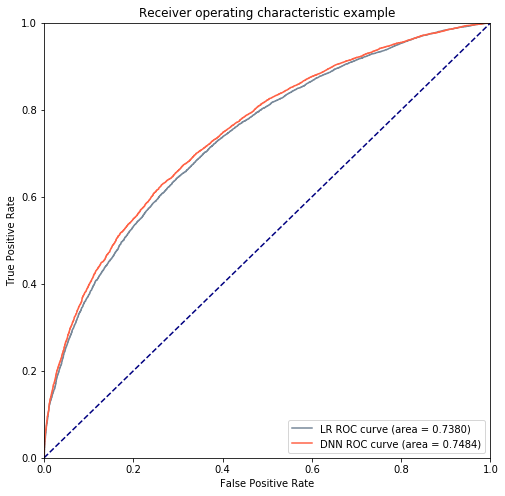

In [168]:
draw_curve(test[target].values,LRpred_ans,test[target].values,pred_ans)

In [17]:
model=DeepFM(linear_feature_columns, dnn_feature_columns, dnn_hidden_units=(256, 512,256),
           l2_reg_linear=0.0005, l2_reg_embedding=0.0005, l2_reg_dnn=0.0001, init_std=0.0001, seed=1024, dnn_dropout=0.5,
           dnn_activation='relu', dnn_use_bn=False, task='binary')
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.00005),loss= "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,batch_size=512, epochs=50, verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=512)

Train on 68979 samples, validate on 17245 samples
Epoch 1/50
68979/68979 - 7s - loss: 1.1742 - binary_crossentropy: 1.0814 - val_loss: 0.8205 - val_binary_crossentropy: 0.7304
Epoch 2/50
68979/68979 - 3s - loss: 0.8268 - binary_crossentropy: 0.7392 - val_loss: 0.7803 - val_binary_crossentropy: 0.6951
Epoch 3/50
68979/68979 - 3s - loss: 0.7812 - binary_crossentropy: 0.6981 - val_loss: 0.7714 - val_binary_crossentropy: 0.6902
Epoch 4/50
68979/68979 - 3s - loss: 0.7559 - binary_crossentropy: 0.6764 - val_loss: 0.7815 - val_binary_crossentropy: 0.7037
Epoch 5/50
68979/68979 - 3s - loss: 0.7391 - binary_crossentropy: 0.6627 - val_loss: 0.7756 - val_binary_crossentropy: 0.7006
Epoch 6/50
68979/68979 - 3s - loss: 0.7222 - binary_crossentropy: 0.6483 - val_loss: 0.7623 - val_binary_crossentropy: 0.6895
Epoch 7/50
68979/68979 - 2s - loss: 0.7032 - binary_crossentropy: 0.6313 - val_loss: 0.7420 - val_binary_crossentropy: 0.6709
Epoch 8/50
68979/68979 - 3s - loss: 0.6882 - binary_crossentropy: 0.

In [18]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.5782
test AUC 0.7442


In [19]:
def BinaryValue(pred_ans,threshold):
    pred_ans=[1 if x>=threshold else 0 for x in pred_ans]
    
    count=pd.DataFrame(pred_ans)
  
    positiveRate=count[0].value_counts()[1]/(count[0].value_counts()[0]+count[0].value_counts()[1])
#     print(positiveRate)
    return pred_ans

In [252]:
from numpy import arange
for threshold in arange(0.5,1.0,0.02):
    positiveRate=BinaryValue(pred_ans,)
    if positiveRate<0.3:
        print(threshold,positiveRate)
        break

0.8000000000000003 0.2647058823529412


In [22]:
Matrics(test[target].values, pred_ans,0.808)

precision: [0.8795263  0.45959802]
recall: [0.29395646 0.93715847]
fscore: [0.44064122 0.61673768]
support [13138  8418]
test LogLoss 15.7104
test AUC 0.6156


In [163]:
model=AutoInt(linear_feature_columns, dnn_feature_columns, att_layer_num=3, att_embedding_size=8, att_head_num=2,
            att_res=True,
            dnn_hidden_units=(32, 32,), dnn_activation='relu', l2_reg_linear=1e-5,
            l2_reg_embedding=1e-5, l2_reg_dnn=0, dnn_use_bn=False, dnn_dropout=0, init_std=0.0001, seed=1024,
            task='binary', )
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001),loss= "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,batch_size=512, epochs=50, verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=512)

Train on 68979 samples, validate on 17245 samples
Epoch 1/50


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


68979/68979 - 8s - loss: 0.7974 - binary_crossentropy: 0.7974 - val_loss: 0.7567 - val_binary_crossentropy: 0.7567
Epoch 2/50
68979/68979 - 3s - loss: 0.7196 - binary_crossentropy: 0.7196 - val_loss: 0.6856 - val_binary_crossentropy: 0.6856
Epoch 3/50
68979/68979 - 2s - loss: 0.6657 - binary_crossentropy: 0.6657 - val_loss: 0.6552 - val_binary_crossentropy: 0.6552
Epoch 4/50
68979/68979 - 2s - loss: 0.6420 - binary_crossentropy: 0.6419 - val_loss: 0.6328 - val_binary_crossentropy: 0.6327
Epoch 5/50
68979/68979 - 2s - loss: 0.6113 - binary_crossentropy: 0.6113 - val_loss: 0.6060 - val_binary_crossentropy: 0.6059
Epoch 6/50
68979/68979 - 2s - loss: 0.5847 - binary_crossentropy: 0.5846 - val_loss: 0.5931 - val_binary_crossentropy: 0.5930
Epoch 7/50
68979/68979 - 2s - loss: 0.5706 - binary_crossentropy: 0.5705 - val_loss: 0.5889 - val_binary_crossentropy: 0.5888
Epoch 8/50
68979/68979 - 2s - loss: 0.5636 - binary_crossentropy: 0.5636 - val_loss: 0.5881 - val_binary_crossentropy: 0.5881
Epo

In [164]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.5798
test AUC 0.7437


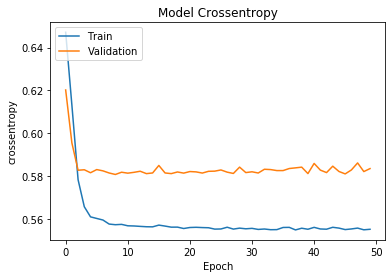

In [158]:
draw_history(history)

## Train FNN

In [23]:
FNNtuner=HypermeterTune(buildFNN,"AWFNN")

INFO:tensorflow:Reloading Oracle from AWFNN/untitled_project/oracle.json
INFO:tensorflow:Reloading Tuner from AWFNN/untitled_project/tuner0.json


INFO:tensorflow:Oracle triggered exit
finished


In [24]:
FNNtuner.results_summary()
print(FNNtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)

{'activation': 'relu', 'dropout_rate': 0.0, 'learning_rate': 0.001, 'batch_size': 1024, 'epochs': 25}


In [27]:
hps = FNNtuner.get_best_hyperparameters()[0]
es = EarlyStopping('val_binary_crossentropy', patience=3)
best_model = FNNtuner.hypermodel.build(hps)
#
history = best_model.fit(train_model_input, train[target].values,
                            batch_size=768, epochs=20,callbacks=[es], verbose=2,validation_split=0.2)
pred_ans = best_model.predict(test_model_input, batch_size=256)

Train on 68979 samples, validate on 17245 samples
Epoch 1/20
68979/68979 - 5s - loss: 0.6725 - binary_crossentropy: 0.6724 - val_loss: 0.6172 - val_binary_crossentropy: 0.6171
Epoch 2/20
68979/68979 - 1s - loss: 0.5995 - binary_crossentropy: 0.5993 - val_loss: 0.5976 - val_binary_crossentropy: 0.5973
Epoch 3/20
68979/68979 - 1s - loss: 0.5803 - binary_crossentropy: 0.5800 - val_loss: 0.5914 - val_binary_crossentropy: 0.5910
Epoch 4/20
68979/68979 - 1s - loss: 0.5711 - binary_crossentropy: 0.5706 - val_loss: 0.5851 - val_binary_crossentropy: 0.5845
Epoch 5/20
68979/68979 - 1s - loss: 0.5657 - binary_crossentropy: 0.5650 - val_loss: 0.5841 - val_binary_crossentropy: 0.5833
Epoch 6/20
68979/68979 - 1s - loss: 0.5614 - binary_crossentropy: 0.5606 - val_loss: 0.5825 - val_binary_crossentropy: 0.5817
Epoch 7/20
68979/68979 - 1s - loss: 0.5591 - binary_crossentropy: 0.5582 - val_loss: 0.5829 - val_binary_crossentropy: 0.5820
Epoch 8/20
68979/68979 - 1s - loss: 0.5578 - binary_crossentropy: 0.

In [28]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.5798
test AUC 0.7421


## Train xDeepFM

In [53]:
from tensorflow.python.keras.layers import Layer
from tensorflow.python.keras.initializers import Zeros, glorot_normal,he_normal
from tensorflow.python.keras.layers import Layer
from tensorflow.python.keras.regularizers import l2

from deepctr.layers.activation import activation_layer
class DNN(Layer):
    """The Multi Layer Percetron
      Input shape
        - nD tensor with shape: ``(batch_size, ..., input_dim)``. The most common situation would be a 2D input with shape ``(batch_size, input_dim)``.
      Output shape
        - nD tensor with shape: ``(batch_size, ..., hidden_size[-1])``. For instance, for a 2D input with shape ``(batch_size, input_dim)``, the output would have shape ``(batch_size, hidden_size[-1])``.
      Arguments
        - **hidden_units**:list of positive integer, the layer number and units in each layer.
        - **activation**: Activation function to use.
        - **l2_reg**: float between 0 and 1. L2 regularizer strength applied to the kernel weights matrix.
        - **dropout_rate**: float in [0,1). Fraction of the units to dropout.
        - **use_bn**: bool. Whether use BatchNormalization before activation or not.
        - **seed**: A Python integer to use as random seed.
    """

    def __init__(self, hidden_units, activation='relu', l2_reg=0, dropout_rate=0, use_bn=False, seed=1024, **kwargs):
        self.hidden_units = hidden_units
        self.activation = activation
        self.dropout_rate = dropout_rate
        self.seed = seed
        self.l2_reg = l2_reg
        self.use_bn = use_bn
        super(DNN, self).__init__(**kwargs)

    def build(self, input_shape):
        # if len(self.hidden_units) == 0:
        #     raise ValueError("hidden_units is empty")
        input_size = input_shape[-1]
        hidden_units = [int(input_size)] + list(self.hidden_units)
        self.kernels = [self.add_weight(name='kernel' + str(i),
                                        shape=(
                                            hidden_units[i], hidden_units[i + 1]),
                                        initializer=he_normal(
                                            seed=self.seed),
                                        regularizer=l2(self.l2_reg),
                                        trainable=True) for i in range(len(self.hidden_units))]
        self.bias = [self.add_weight(name='bias' + str(i),
                                     shape=(self.hidden_units[i],),
                                     initializer=Zeros(),
                                     trainable=True) for i in range(len(self.hidden_units))]
        if self.use_bn:
            self.bn_layers = [tf.keras.layers.BatchNormalization() for _ in range(len(self.hidden_units))]

        self.dropout_layers = [tf.keras.layers.Dropout(self.dropout_rate,seed=self.seed+i) for i in range(len(self.hidden_units))]

        self.activation_layers = [activation_layer(self.activation) for _ in range(len(self.hidden_units))]

        super(DNN, self).build(input_shape)  # Be sure to call this somewhere!

    def call(self, inputs, training=None, **kwargs):

        deep_input = inputs

        for i in range(len(self.hidden_units)):
            fc = tf.nn.bias_add(tf.tensordot(
                deep_input, self.kernels[i], axes=(-1, 0)), self.bias[i])
            # fc = Dense(self.hidden_size[i], activation=None, \
            #           kernel_initializer=glorot_normal(seed=self.seed), \
            #           kernel_regularizer=l2(self.l2_reg))(deep_input)
            if self.use_bn:
                fc = self.bn_layers[i](fc, training=training)

            fc = self.activation_layers[i](fc)

            fc = self.dropout_layers[i](fc,training = training)
            deep_input = fc

        return deep_input

    def compute_output_shape(self, input_shape):
        if len(self.hidden_units) > 0:
            shape = input_shape[:-1] + (self.hidden_units[-1],)
        else:
            shape = input_shape

        return tuple(shape)

    def get_config(self, ):
        config = {'activation': self.activation, 'hidden_units': self.hidden_units,
                  'l2_reg': self.l2_reg, 'use_bn': self.use_bn, 'dropout_rate': self.dropout_rate, 'seed': self.seed}
        base_config = super(DNN, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [47]:
import tensorflow as tf

from deepctr.inputs import input_from_feature_columns, get_linear_logit, build_input_features, combined_dnn_input
from deepctr.layers.core import PredictionLayer
from deepctr.layers.interaction import CIN
from deepctr.layers.utils import concat_func, add_func


def xDeepFM(linear_feature_columns, dnn_feature_columns, dnn_hidden_units=(256, 256),
            cin_layer_size=(128, 128,), cin_split_half=True, cin_activation='relu', l2_reg_linear=0.00001,
            l2_reg_embedding=0.00001, l2_reg_dnn=0, l2_reg_cin=0, init_std=0.0001, seed=1024, dnn_dropout=0,
            dnn_activation='relu', dnn_use_bn=False, task='binary'):
    """Instantiates the xDeepFM architecture.
    :param linear_feature_columns: An iterable containing all the features used by linear part of the model.
    :param dnn_feature_columns: An iterable containing all the features used by deep part of the model.
    :param dnn_hidden_units: list,list of positive integer or empty list, the layer number and units in each layer of deep net
    :param cin_layer_size: list,list of positive integer or empty list, the feature maps  in each hidden layer of Compressed Interaction Network
    :param cin_split_half: bool.if set to True, half of the feature maps in each hidden will connect to output unit
    :param cin_activation: activation function used on feature maps
    :param l2_reg_linear: float. L2 regularizer strength applied to linear part
    :param l2_reg_embedding: L2 regularizer strength applied to embedding vector
    :param l2_reg_dnn: L2 regularizer strength applied to deep net
    :param l2_reg_cin: L2 regularizer strength applied to CIN.
    :param init_std: float,to use as the initialize std of embedding vector
    :param seed: integer ,to use as random seed.
    :param dnn_dropout: float in [0,1), the probability we will drop out a given DNN coordinate.
    :param dnn_activation: Activation function to use in DNN
    :param dnn_use_bn: bool. Whether use BatchNormalization before activation or not in DNN
    :param task: str, ``"binary"`` for  binary logloss or  ``"regression"`` for regression loss
    :return: A Keras model instance.
    """

    features = build_input_features(
        linear_feature_columns + dnn_feature_columns)

    inputs_list = list(features.values())

    sparse_embedding_list, dense_value_list = input_from_feature_columns(features, dnn_feature_columns,
                                                                         l2_reg_embedding, init_std, seed)

    linear_logit = get_linear_logit(features, linear_feature_columns, init_std=init_std, seed=seed, prefix='linear',
                                    l2_reg=l2_reg_linear)

    fm_input = concat_func(sparse_embedding_list, axis=1)

    dnn_input = combined_dnn_input(sparse_embedding_list, dense_value_list)
    dnn_output = DNN(dnn_hidden_units, dnn_activation, l2_reg_dnn, dnn_dropout,
                     dnn_use_bn, seed)(dnn_input)
    dnn_logit = tf.keras.layers.Dense(
        1, use_bias=False, activation=None)(dnn_output)

    final_logit = add_func([linear_logit, dnn_logit])

    if len(cin_layer_size) > 0:
        exFM_out = CIN(cin_layer_size, cin_activation,
                       cin_split_half, l2_reg_cin, seed)(fm_input)
        exFM_logit = tf.keras.layers.Dense(1, activation=None, )(exFM_out)
        final_logit = add_func([final_logit, exFM_logit])

    output = PredictionLayer(task)(final_logit)

    model = tf.keras.models.Model(inputs=inputs_list, outputs=output)
    return model

In [29]:
xDeepFMTuner=HypermeterTune(buildxDeepFM,"AWxDeepFMMinMax")

INFO:tensorflow:Reloading Oracle from AWxDeepFMMinMax/untitled_project/oracle.json
INFO:tensorflow:Reloading Tuner from AWxDeepFMMinMax/untitled_project/tuner0.json


INFO:tensorflow:Oracle triggered exit
finished


In [30]:
xDeepFMTuner.results_summary()
print(xDeepFMTuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(xDeepFMTuner,768,"xDeepFMtuner")

{'activation': 'elu', 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 768, 'epochs': 15}
Train on 68979 samples, validate on 17245 samples
Epoch 1/20
68979/68979 - 11s - loss: 0.7357 - binary_crossentropy: 0.7357 - val_loss: 0.6463 - val_binary_crossentropy: 0.6463
Epoch 2/20
68979/68979 - 7s - loss: 0.6683 - binary_crossentropy: 0.6683 - val_loss: 0.6361 - val_binary_crossentropy: 0.6360
Epoch 3/20
68979/68979 - 6s - loss: 0.6424 - binary_crossentropy: 0.6424 - val_loss: 0.6294 - val_binary_crossentropy: 0.6294
Epoch 4/20
68979/68979 - 7s - loss: 0.6286 - binary_crossentropy: 0.6285 - val_loss: 0.6235 - val_binary_crossentropy: 0.6234
Epoch 5/20
68979/68979 - 7s - loss: 0.6176 - binary_crossentropy: 0.6175 - val_loss: 0.6148 - val_binary_crossentropy: 0.6148
Epoch 6/20
68979/68979 - 6s - loss: 0.6022 - binary_crossentropy: 0.6021 - val_loss: 0.5995 - val_binary_crossentropy: 0.5994
Epoch 7/20
68979/68979 - 6s - loss: 0.5806 - binary_crossentropy: 0.5806 - val_loss: 0.5866 

In [14]:
hps = xDeepFMTuner.get_best_hyperparameters()[0]
es = EarlyStopping('val_binary_crossentropy', patience=3)
best_model = xDeepFMTuner.hypermodel.build(hps)
#
history = best_model.fit(train_model_input, train[target].values,
                            batch_size=768, epochs=20,callbacks=[es], verbose=2,validation_split=0.2)
pred_ans = best_model.predict(test_model_input, batch_size=256)



Train on 68979 samples, validate on 17245 samples
Epoch 1/20


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


68979/68979 - 14s - loss: 0.6760 - binary_crossentropy: 0.6759 - val_loss: 0.6410 - val_binary_crossentropy: 0.6409
Epoch 2/20
68979/68979 - 10s - loss: 0.6409 - binary_crossentropy: 0.6409 - val_loss: 0.6234 - val_binary_crossentropy: 0.6233
Epoch 3/20
68979/68979 - 9s - loss: 0.6185 - binary_crossentropy: 0.6185 - val_loss: 0.6094 - val_binary_crossentropy: 0.6094
Epoch 4/20
68979/68979 - 9s - loss: 0.6015 - binary_crossentropy: 0.6015 - val_loss: 0.5988 - val_binary_crossentropy: 0.5987
Epoch 5/20
68979/68979 - 9s - loss: 0.5878 - binary_crossentropy: 0.5878 - val_loss: 0.5901 - val_binary_crossentropy: 0.5900
Epoch 6/20
68979/68979 - 9s - loss: 0.5760 - binary_crossentropy: 0.5759 - val_loss: 0.5825 - val_binary_crossentropy: 0.5824
Epoch 7/20
68979/68979 - 9s - loss: 0.5674 - binary_crossentropy: 0.5673 - val_loss: 0.5821 - val_binary_crossentropy: 0.5820
Epoch 8/20
68979/68979 - 9s - loss: 0.5621 - binary_crossentropy: 0.5620 - val_loss: 0.5803 - val_binary_crossentropy: 0.5801
E

NameError: name 'modelName' is not defined

In [60]:
model=xDeepFM(linear_feature_columns, dnn_feature_columns, dnn_hidden_units=(512, 256,256),
           l2_reg_linear=0.001, l2_reg_embedding=0.001, l2_reg_dnn=0.001, init_std=0.0001, seed=1024, dnn_dropout=0.5,
           dnn_activation='elu', dnn_use_bn=False, task='binary')
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.00008),loss= "binary_crossentropy",metrics=['binary_crossentropy'])
earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,batch_size=512, epochs=50, verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=512)

Train on 68979 samples, validate on 17245 samples
Epoch 1/50
68979/68979 - 11s - loss: 2.7835 - binary_crossentropy: 0.8360 - val_loss: 2.5080 - val_binary_crossentropy: 0.6642
Epoch 2/50
68979/68979 - 7s - loss: 2.4738 - binary_crossentropy: 0.7231 - val_loss: 2.3106 - val_binary_crossentropy: 0.6503
Epoch 3/50
68979/68979 - 7s - loss: 2.2659 - binary_crossentropy: 0.6862 - val_loss: 2.1344 - val_binary_crossentropy: 0.6330
Epoch 4/50
68979/68979 - 7s - loss: 2.1018 - binary_crossentropy: 0.6705 - val_loss: 1.9819 - val_binary_crossentropy: 0.6188
Epoch 5/50
68979/68979 - 7s - loss: 1.9558 - binary_crossentropy: 0.6538 - val_loss: 1.8616 - val_binary_crossentropy: 0.6189
Epoch 6/50
68979/68979 - 7s - loss: 1.8265 - binary_crossentropy: 0.6372 - val_loss: 1.7480 - val_binary_crossentropy: 0.6108
Epoch 7/50
68979/68979 - 7s - loss: 1.7095 - binary_crossentropy: 0.6192 - val_loss: 1.6374 - val_binary_crossentropy: 0.5932
Epoch 8/50
68979/68979 - 7s - loss: 1.5982 - binary_crossentropy: 0

In [61]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.5795
test AUC 0.7431


## GBDT

In [2]:
from __future__ import division
import json
import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LogisticRegression


In [178]:
data = pd.read_csv('./dac/Adwords/AW_AllFeatures.csv')

categorical_features = ["BaseAdGroupId", "Criteria","placementType",'languageCode','locationName']
dense_features = ['adActiveViewCpm','adActiveViewCtr','adActiveViewImpressions','adActiveViewMeasurability','adActiveViewMeasurableCost',
                          'adActiveViewMeasurableImpressions','adActiveViewViewability','adAverageCpc','adImpressions','adCtr','plaActiveViewCpm','plaActiveViewCtr','plaActiveViewImpressions','plaActiveViewMeasurability','plaActiveViewMeasurableCost',
                          'plaActiveViewMeasurableImpressions','plaActiveViewViewability','plaAverageCpc','plaImpressions','plaCtr']
data=data[categorical_features+dense_features+['target']]
for feat in categorical_features:
    data[feat] =  pd.Categorical(data[feat]).codes

data['target']=data['target'].apply(lambda x: 1 if x>0 else 0)    
data[categorical_features] = data[categorical_features].fillna('-1', )
data[dense_features] = data[dense_features].fillna(0,)
# for numFeature in dense_features:
#     data[numFeature] = data[numFeature].apply(lambda x: x if x<2 else math.sqrt(math.log(x)))
train, test = train_test_split(data, test_size=0.2,random_state=1024)
y_train = train["target"]  # training label
y_test = test["target"]   # testing label
X_train = train.drop(columns=["target"] , axis=1)  # training dataset
X_test = test.drop(columns=["target"] , axis=1)  # testing dataset

# create dataset for lightgbm
lgb_train = lgb.Dataset(X_train, y_train,feature_name=dense_features+categorical_features,categorical_feature=categorical_features)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)
num_leaf = 64
params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'is_unbalance':True,
    'max_depth':10,
    'objective': 'binary',
    'metric': {'binary_logloss','auc'},
    "min_child_samples": 20,   # for overfitting
	'num_trees': 50,
    'num_leaves':num_leaf,
    'learning_rate': 0.05,
    'feature_fraction': 0.6,# Select a part of the features on each tree, for preventing overfitting and speed-up
    'bagging_fraction': 0.6,
    'bagging_freq': 2,
    'lambda_l1':1,
    'lambda_l2':0.5,
    'verbose': 1
}

# number of leaves,will be used in feature transformation


print('Start training...')
# train
gbm = lgb.train(params,
                lgb_train,
                valid_sets=lgb_train)
y_pred = gbm.predict(X_test)
print("test LogLoss", round(log_loss(test["target"].values , y_pred ), 4))
print("test AUC", round(roc_auc_score(test["target"].values , y_pred), 4))

Start training...


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_trees` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


[1]	training's binary_logloss: 0.66288	training's auc: 0.70776
[2]	training's binary_logloss: 0.656375	training's auc: 0.722483
[3]	training's binary_logloss: 0.650798	training's auc: 0.727205
[4]	training's binary_logloss: 0.64546	training's auc: 0.732089
[5]	training's binary_logloss: 0.640742	training's auc: 0.734525
[6]	training's binary_logloss: 0.636132	training's auc: 0.737253
[7]	training's binary_logloss: 0.632106	training's auc: 0.738994
[8]	training's binary_logloss: 0.628698	training's auc: 0.740494
[9]	training's binary_logloss: 0.625167	training's auc: 0.741725
[10]	training's binary_logloss: 0.62211	training's auc: 0.7423
[11]	training's binary_logloss: 0.619406	training's auc: 0.743174
[12]	training's binary_logloss: 0.616937	training's auc: 0.743953
[13]	training's binary_logloss: 0.614725	training's auc: 0.744913
[14]	training's binary_logloss: 0.612482	training's auc: 0.745656
[15]	training's binary_logloss: 0.610354	training's auc: 0.746995
[16]	training's binary_lo

In [182]:
y_pred = gbm.predict(X_train,pred_leaf=True)
indexRange=int(len(y_pred)*0.8)
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.regularizers import L1L2
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
model = Sequential()
model.add(Dense(1,activation='sigmoid',kernel_regularizer=L1L2(l1=0.0, l2=0.01),input_dim=len(y_pred[0]) * num_leaf))
model.compile(Adam(lr=0.001),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit_generator(myGenerator(y_pred[:indexRange],y_train[:indexRange],256),callbacks=[keras.callbacks.EarlyStopping(monitor='loss',patience=5),
                                                                      ModelCheckpoint("GBDT+LR50.h5",monitor="loss",verbose=1,save_best_only=True)], 
                            steps_per_epoch=indexRange//256,epochs=50,verbose=1,
                           validation_data=myGenerator(y_pred[indexRange:len(y_pred)],y_train[indexRange:len(y_pred)],256),
                            validation_steps=(len(y_pred)-indexRange)//256)

Epoch 1/50
  2/269 [..............................] - ETA: 1:22:39 - loss: 0.7183 - acc: 0.49 - ETA: 41:49 - loss: 0.7144 - acc: 0.4980  

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261081). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 28:20 - loss: 0.7099 - acc: 0.5169

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254224). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 21:30 - loss: 0.7027 - acc: 0.5576

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251659). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 17:30 - loss: 0.7005 - acc: 0.56 - ETA: 14:45 - loss: 0.6971 - acc: 0.58 - ETA: 12:49 - loss: 0.6936 - acc: 0.5921

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267938). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 11:23 - loss: 0.6911 - acc: 0.6001

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274917). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 10:16 - loss: 0.6886 - acc: 0.60 - ETA: 9:18 - loss: 0.6861 - acc: 0.6156 - ETA: 8:30 - loss: 0.6844 - acc: 0.6200

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267624). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 7:54 - loss: 0.6827 - acc: 0.6217

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265849). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 7:23 - loss: 0.6811 - acc: 0.623 - ETA: 6:55 - loss: 0.6803 - acc: 0.623 - ETA: 6:31 - loss: 0.6771 - acc: 0.628 - ETA: 6:11 - loss: 0.6744 - acc: 0.633 - ETA: 5:55 - loss: 0.6722 - acc: 0.637 - ETA: 5:40 - loss: 0.6707 - acc: 0.6395

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261197). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 5:25 - loss: 0.6692 - acc: 0.640 - ETA: 5:13 - loss: 0.6676 - acc: 0.642 - ETA: 5:00 - loss: 0.6661 - acc: 0.643 - ETA: 4:48 - loss: 0.6646 - acc: 0.6454

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260469). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 4:38 - loss: 0.6635 - acc: 0.6459

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282723). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 4:30 - loss: 0.6617 - acc: 0.647 - ETA: 4:22 - loss: 0.6598 - acc: 0.6495

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308987). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 4:15 - loss: 0.6581 - acc: 0.6517

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261937). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 4:07 - loss: 0.6569 - acc: 0.653 - ETA: 4:00 - loss: 0.6554 - acc: 0.654 - ETA: 3:53 - loss: 0.6547 - acc: 0.6548

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252879). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 3:46 - loss: 0.6533 - acc: 0.656 - ETA: 3:40 - loss: 0.6527 - acc: 0.656 - ETA: 3:35 - loss: 0.6509 - acc: 0.6580

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270941). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 3:30 - loss: 0.6497 - acc: 0.659 - ETA: 3:25 - loss: 0.6485 - acc: 0.6611

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278114). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 3:21 - loss: 0.6472 - acc: 0.6621

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266979). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 3:17 - loss: 0.6466 - acc: 0.662 - ETA: 3:13 - loss: 0.6453 - acc: 0.662 - ETA: 3:09 - loss: 0.6443 - acc: 0.6631

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286651). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 3:07 - loss: 0.6429 - acc: 0.6645

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292794). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 3:04 - loss: 0.6418 - acc: 0.6650

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305245). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 3:02 - loss: 0.6410 - acc: 0.665 - ETA: 2:58 - loss: 0.6404 - acc: 0.6656

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321349). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 2:55 - loss: 0.6397 - acc: 0.666 - ETA: 2:52 - loss: 0.6385 - acc: 0.667 - ETA: 2:49 - loss: 0.6383 - acc: 0.667 - ETA: 2:45 - loss: 0.6378 - acc: 0.6673

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299132). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 2:42 - loss: 0.6371 - acc: 0.668 - ETA: 2:40 - loss: 0.6364 - acc: 0.6684

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274466). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 2:38 - loss: 0.6358 - acc: 0.6686

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267836). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 2:35 - loss: 0.6353 - acc: 0.669 - ETA: 2:33 - loss: 0.6341 - acc: 0.670 - ETA: 2:31 - loss: 0.6324 - acc: 0.672 - ETA: 2:28 - loss: 0.6320 - acc: 0.673 - ETA: 2:26 - loss: 0.6310 - acc: 0.6740

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293160). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 2:25 - loss: 0.6312 - acc: 0.6730

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320371). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 2:24 - loss: 0.6306 - acc: 0.673 - ETA: 2:22 - loss: 0.6295 - acc: 0.6741

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293063). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 2:20 - loss: 0.6287 - acc: 0.6747

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316785). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 2:18 - loss: 0.6280 - acc: 0.675 - ETA: 2:16 - loss: 0.6280 - acc: 0.6747

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291107). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 2:14 - loss: 0.6278 - acc: 0.674 - ETA: 2:12 - loss: 0.6277 - acc: 0.6746

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245650). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 2:10 - loss: 0.6271 - acc: 0.674 - ETA: 2:09 - loss: 0.6261 - acc: 0.675 - ETA: 2:07 - loss: 0.6255 - acc: 0.675 - ETA: 2:06 - loss: 0.6254 - acc: 0.675 - ETA: 2:04 - loss: 0.6250 - acc: 0.6755

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222636). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 2:02 - loss: 0.6250 - acc: 0.6752

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220466). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 2:01 - loss: 0.6245 - acc: 0.675 - ETA: 1:59 - loss: 0.6239 - acc: 0.6761

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241358). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:58 - loss: 0.6230 - acc: 0.676 - ETA: 1:57 - loss: 0.6225 - acc: 0.6767

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249724). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:55 - loss: 0.6217 - acc: 0.6773

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231001). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:54 - loss: 0.6212 - acc: 0.677 - ETA: 1:53 - loss: 0.6207 - acc: 0.678 - ETA: 1:52 - loss: 0.6199 - acc: 0.678 - ETA: 1:51 - loss: 0.6198 - acc: 0.6786

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224817). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:49 - loss: 0.6196 - acc: 0.678 - ETA: 1:48 - loss: 0.6190 - acc: 0.6793

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272905). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:47 - loss: 0.6188 - acc: 0.679 - ETA: 1:46 - loss: 0.6183 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260708). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:45 - loss: 0.6180 - acc: 0.6799

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292613). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:44 - loss: 0.6177 - acc: 0.680 - ETA: 1:43 - loss: 0.6173 - acc: 0.6806

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282369). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:42 - loss: 0.6168 - acc: 0.681 - ETA: 1:41 - loss: 0.6168 - acc: 0.680 - ETA: 1:40 - loss: 0.6162 - acc: 0.6813

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294566). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:39 - loss: 0.6159 - acc: 0.6812

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318080). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:38 - loss: 0.6155 - acc: 0.681 - ETA: 1:37 - loss: 0.6151 - acc: 0.681 - ETA: 1:36 - loss: 0.6143 - acc: 0.682 - ETA: 1:35 - loss: 0.6143 - acc: 0.6823

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281338). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:35 - loss: 0.6140 - acc: 0.6824

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307406). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:34 - loss: 0.6136 - acc: 0.6829

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304422). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:33 - loss: 0.6134 - acc: 0.6829

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270262). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:32 - loss: 0.6133 - acc: 0.682 - ETA: 1:31 - loss: 0.6130 - acc: 0.683 - ETA: 1:30 - loss: 0.6129 - acc: 0.6830

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261274). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:29 - loss: 0.6126 - acc: 0.683 - ETA: 1:29 - loss: 0.6123 - acc: 0.6832

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265881). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:28 - loss: 0.6119 - acc: 0.6835

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264986). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:27 - loss: 0.6115 - acc: 0.683 - ETA: 1:26 - loss: 0.6112 - acc: 0.684 - ETA: 1:25 - loss: 0.6111 - acc: 0.683 - ETA: 1:25 - loss: 0.6112 - acc: 0.6836

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261704). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:24 - loss: 0.6107 - acc: 0.6841

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250358). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:23 - loss: 0.6108 - acc: 0.6842

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242896). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:22 - loss: 0.6109 - acc: 0.6838

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223876). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:21 - loss: 0.6103 - acc: 0.6845

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214797). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:20 - loss: 0.6100 - acc: 0.684 - ETA: 1:20 - loss: 0.6100 - acc: 0.6846

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216573). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:19 - loss: 0.6097 - acc: 0.6849

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216264). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:18 - loss: 0.6095 - acc: 0.684 - ETA: 1:17 - loss: 0.6097 - acc: 0.6849

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217060). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:17 - loss: 0.6093 - acc: 0.685 - ETA: 1:16 - loss: 0.6093 - acc: 0.6852

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224672). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:15 - loss: 0.6091 - acc: 0.685 - ETA: 1:14 - loss: 0.6089 - acc: 0.685 - ETA: 1:13 - loss: 0.6086 - acc: 0.6859

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230416). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:13 - loss: 0.6085 - acc: 0.685 - ETA: 1:12 - loss: 0.6083 - acc: 0.6860

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230108). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:12 - loss: 0.6082 - acc: 0.6862

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253569). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:11 - loss: 0.6086 - acc: 0.6857

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264689). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:10 - loss: 0.6082 - acc: 0.6860

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238840). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:10 - loss: 0.6083 - acc: 0.686 - ETA: 1:09 - loss: 0.6080 - acc: 0.686 - ETA: 1:08 - loss: 0.6080 - acc: 0.6862

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217801). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:08 - loss: 0.6081 - acc: 0.685 - ETA: 1:07 - loss: 0.6082 - acc: 0.685 - ETA: 1:06 - loss: 0.6081 - acc: 0.685 - ETA: 1:06 - loss: 0.6079 - acc: 0.686 - ETA: 1:05 - loss: 0.6076 - acc: 0.6865

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250341). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:04 - loss: 0.6074 - acc: 0.6865

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224574). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:04 - loss: 0.6071 - acc: 0.686 - ETA: 1:03 - loss: 0.6071 - acc: 0.686 - ETA: 1:02 - loss: 0.6068 - acc: 0.687 - ETA: 1:02 - loss: 0.6067 - acc: 0.6872

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244936). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:01 - loss: 0.6066 - acc: 0.6873

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235549). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:00 - loss: 0.6067 - acc: 0.687 - ETA: 1:00 - loss: 0.6064 - acc: 0.6878

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245507). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 59s - loss: 0.6063 - acc: 0.687 - ETA: 59s - loss: 0.6059 - acc: 0.6879

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269010). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 58s - loss: 0.6058 - acc: 0.6879

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296463). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 58s - loss: 0.6058 - acc: 0.68 - ETA: 57s - loss: 0.6055 - acc: 0.6880

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328848). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 57s - loss: 0.6055 - acc: 0.68 - ETA: 56s - loss: 0.6053 - acc: 0.6882

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373860). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 56s - loss: 0.6054 - acc: 0.6880

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.433042). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 56s - loss: 0.6053 - acc: 0.68 - ETA: 55s - loss: 0.6049 - acc: 0.6885

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.442485). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 55s - loss: 0.6048 - acc: 0.68 - ETA: 54s - loss: 0.6046 - acc: 0.68 - ETA: 54s - loss: 0.6044 - acc: 0.6890

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.387710). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 53s - loss: 0.6044 - acc: 0.6891

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.451291). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 53s - loss: 0.6045 - acc: 0.6889

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.443651). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 52s - loss: 0.6046 - acc: 0.68 - ETA: 52s - loss: 0.6045 - acc: 0.68 - ETA: 51s - loss: 0.6045 - acc: 0.6889

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.411283). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 51s - loss: 0.6044 - acc: 0.68 - ETA: 50s - loss: 0.6041 - acc: 0.6893

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380285). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 50s - loss: 0.6041 - acc: 0.6892

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397465). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 49s - loss: 0.6039 - acc: 0.6893

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371330). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 49s - loss: 0.6040 - acc: 0.68 - ETA: 49s - loss: 0.6039 - acc: 0.68 - ETA: 48s - loss: 0.6037 - acc: 0.6892

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382308). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 48s - loss: 0.6036 - acc: 0.6894

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362565). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 47s - loss: 0.6033 - acc: 0.6897

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340973). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 47s - loss: 0.6031 - acc: 0.6898

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338555). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 46s - loss: 0.6027 - acc: 0.6901

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349533). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 46s - loss: 0.6024 - acc: 0.69 - ETA: 45s - loss: 0.6023 - acc: 0.6903

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309912). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 44s - loss: 0.6019 - acc: 0.69 - ETA: 44s - loss: 0.6017 - acc: 0.69 - ETA: 43s - loss: 0.6016 - acc: 0.69 - ETA: 43s - loss: 0.6015 - acc: 0.69 - ETA: 42s - loss: 0.6014 - acc: 0.6912

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340243). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 42s - loss: 0.6013 - acc: 0.6914

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364789). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 41s - loss: 0.6014 - acc: 0.6913

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366310). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 41s - loss: 0.6013 - acc: 0.6914

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356484). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 41s - loss: 0.6012 - acc: 0.69 - ETA: 40s - loss: 0.6010 - acc: 0.69 - ETA: 39s - loss: 0.6007 - acc: 0.6918

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344558). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 39s - loss: 0.6005 - acc: 0.6921

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322705). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 38s - loss: 0.6003 - acc: 0.69 - ETA: 38s - loss: 0.6000 - acc: 0.6924

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294683). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 37s - loss: 0.6000 - acc: 0.69 - ETA: 37s - loss: 0.6002 - acc: 0.6922

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292837). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 36s - loss: 0.6000 - acc: 0.6925

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287849). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 36s - loss: 0.6000 - acc: 0.6924

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274729). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 35s - loss: 0.5999 - acc: 0.6925

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284469). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 35s - loss: 0.6000 - acc: 0.6925

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302577). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 35s - loss: 0.6000 - acc: 0.69 - ETA: 34s - loss: 0.6000 - acc: 0.69 - ETA: 34s - loss: 0.6000 - acc: 0.69 - ETA: 33s - loss: 0.5998 - acc: 0.6925

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311198). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 33s - loss: 0.5996 - acc: 0.69 - ETA: 32s - loss: 0.5995 - acc: 0.6927

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294702). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 32s - loss: 0.5995 - acc: 0.6929

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286813). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 31s - loss: 0.5994 - acc: 0.69 - ETA: 31s - loss: 0.5993 - acc: 0.69 - ETA: 30s - loss: 0.5993 - acc: 0.69 - ETA: 30s - loss: 0.5992 - acc: 0.6930

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270259). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 29s - loss: 0.5991 - acc: 0.6929

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244848). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 29s - loss: 0.5990 - acc: 0.6928

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227125). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 28s - loss: 0.5989 - acc: 0.6931

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220964). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 28s - loss: 0.5987 - acc: 0.69 - ETA: 27s - loss: 0.5986 - acc: 0.69 - ETA: 27s - loss: 0.5985 - acc: 0.6935

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258391). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 26s - loss: 0.5985 - acc: 0.6934

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271389). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 26s - loss: 0.5984 - acc: 0.69 - ETA: 25s - loss: 0.5981 - acc: 0.69 - ETA: 25s - loss: 0.5981 - acc: 0.6936

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282576). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 24s - loss: 0.5980 - acc: 0.69 - ETA: 24s - loss: 0.5980 - acc: 0.69 - ETA: 23s - loss: 0.5978 - acc: 0.69 - ETA: 23s - loss: 0.5976 - acc: 0.6942

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273353). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 22s - loss: 0.5975 - acc: 0.6943

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262166). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 22s - loss: 0.5975 - acc: 0.6944

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257819). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 21s - loss: 0.5973 - acc: 0.6945

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245273). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 21s - loss: 0.5974 - acc: 0.6945

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228228). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 21s - loss: 0.5973 - acc: 0.6947

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226397). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 20s - loss: 0.5971 - acc: 0.69 - ETA: 20s - loss: 0.5971 - acc: 0.69 - ETA: 19s - loss: 0.5970 - acc: 0.6948

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230059). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 19s - loss: 0.5970 - acc: 0.69 - ETA: 18s - loss: 0.5969 - acc: 0.6948

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280731). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 18s - loss: 0.5970 - acc: 0.69 - ETA: 17s - loss: 0.5968 - acc: 0.6947

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267348). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 17s - loss: 0.5968 - acc: 0.6947

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294107). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 16s - loss: 0.5968 - acc: 0.69 - ETA: 16s - loss: 0.5967 - acc: 0.6945

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329387). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 16s - loss: 0.5968 - acc: 0.6944

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313574). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 15s - loss: 0.5968 - acc: 0.6944

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321029). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 15s - loss: 0.5969 - acc: 0.6943

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312960). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 14s - loss: 0.5967 - acc: 0.6945

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296806). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 14s - loss: 0.5966 - acc: 0.69 - ETA: 13s - loss: 0.5966 - acc: 0.69 - ETA: 13s - loss: 0.5965 - acc: 0.6947

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310674). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 13s - loss: 0.5965 - acc: 0.69 - ETA: 12s - loss: 0.5964 - acc: 0.69 - ETA: 12s - loss: 0.5962 - acc: 0.6949

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286447). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 11s - loss: 0.5961 - acc: 0.6950

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268627). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 11s - loss: 0.5960 - acc: 0.69 - ETA: 10s - loss: 0.5960 - acc: 0.6950

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259879). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 10s - loss: 0.5962 - acc: 0.69 - ETA: 9s - loss: 0.5962 - acc: 0.6949 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260151). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 9s - loss: 0.5960 - acc: 0.695 - ETA: 9s - loss: 0.5958 - acc: 0.6951

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245709). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 8s - loss: 0.5957 - acc: 0.695 - ETA: 8s - loss: 0.5954 - acc: 0.695 - ETA: 7s - loss: 0.5954 - acc: 0.6954

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289213). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 7s - loss: 0.5953 - acc: 0.6955

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334869). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5953 - acc: 0.6956

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377667). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 6s - loss: 0.5953 - acc: 0.6957

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395742). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 6s - loss: 0.5952 - acc: 0.695 - ETA: 5s - loss: 0.5951 - acc: 0.695 - ETA: 5s - loss: 0.5950 - acc: 0.695 - ETA: 4s - loss: 0.5949 - acc: 0.695 - ETA: 4s - loss: 0.5949 - acc: 0.6956

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361532). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5948 - acc: 0.6956

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352257). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5947 - acc: 0.695 - ETA: 3s - loss: 0.5947 - acc: 0.6957

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312706). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5946 - acc: 0.6958

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310090). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5946 - acc: 0.6959

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276456). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5946 - acc: 0.6959

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260813). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5946 - acc: 0.6960

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247273). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5947 - acc: 0.695 - ETA: 0s - loss: 0.5946 - acc: 0.6957

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250904). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213125). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 120s 446ms/step - loss: 0.5945 - acc: 0.6958 - val_loss: 0.5771 - val_acc: 0.7060

Epoch 00001: loss improved from inf to 0.59450, saving model to GBDT+LR50.h5
Epoch 2/50
  1/269 [..............................] - ETA: 7s - loss: 0.5995 - acc: 0.6680

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298486). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 46s - loss: 0.5993 - acc: 0.6680

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252409). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 56s - loss: 0.5852 - acc: 0.6979

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237051). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:08 - loss: 0.5764 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267768). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:22 - loss: 0.5781 - acc: 0.714 - ETA: 1:16 - loss: 0.5760 - acc: 0.716 - ETA: 1:24 - loss: 0.5746 - acc: 0.720 - ETA: 1:31 - loss: 0.5737 - acc: 0.7197

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309653). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:33 - loss: 0.5708 - acc: 0.722 - ETA: 1:30 - loss: 0.5700 - acc: 0.720 - ETA: 1:27 - loss: 0.5720 - acc: 0.7177

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242095). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:26 - loss: 0.5727 - acc: 0.716 - ETA: 1:24 - loss: 0.5752 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283979). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:26 - loss: 0.5793 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227972). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:24 - loss: 0.5784 - acc: 0.708 - ETA: 1:26 - loss: 0.5762 - acc: 0.712 - ETA: 1:28 - loss: 0.5767 - acc: 0.713 - ETA: 1:28 - loss: 0.5761 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284213). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:29 - loss: 0.5767 - acc: 0.712 - ETA: 1:26 - loss: 0.5760 - acc: 0.711 - ETA: 1:25 - loss: 0.5760 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264847). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:25 - loss: 0.5762 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304587). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:25 - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288440). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:25 - loss: 0.5761 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291754). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:24 - loss: 0.5753 - acc: 0.710 - ETA: 1:26 - loss: 0.5750 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291185). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:25 - loss: 0.5754 - acc: 0.712 - ETA: 1:26 - loss: 0.5747 - acc: 0.712 - ETA: 1:26 - loss: 0.5751 - acc: 0.711 - ETA: 1:25 - loss: 0.5743 - acc: 0.712 - ETA: 1:23 - loss: 0.5748 - acc: 0.711 - ETA: 1:21 - loss: 0.5737 - acc: 0.713 - ETA: 1:20 - loss: 0.5739 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285276). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:19 - loss: 0.5736 - acc: 0.7143

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226636). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:18 - loss: 0.5734 - acc: 0.7144

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226160). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:18 - loss: 0.5742 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216421). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:17 - loss: 0.5743 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214394). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:17 - loss: 0.5748 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179756). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:16 - loss: 0.5743 - acc: 0.713 - ETA: 1:16 - loss: 0.5739 - acc: 0.713 - ETA: 1:16 - loss: 0.5742 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254717). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:16 - loss: 0.5745 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259702). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:16 - loss: 0.5746 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266412). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:15 - loss: 0.5745 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273192). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:16 - loss: 0.5752 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273328). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:17 - loss: 0.5755 - acc: 0.711 - ETA: 1:16 - loss: 0.5755 - acc: 0.711 - ETA: 1:15 - loss: 0.5758 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301645). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:14 - loss: 0.5759 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298480). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:14 - loss: 0.5762 - acc: 0.711 - ETA: 1:14 - loss: 0.5757 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271338). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:14 - loss: 0.5748 - acc: 0.712 - ETA: 1:13 - loss: 0.5748 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239525). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:12 - loss: 0.5744 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.204868). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:12 - loss: 0.5755 - acc: 0.711 - ETA: 1:11 - loss: 0.5755 - acc: 0.711 - ETA: 1:11 - loss: 0.5751 - acc: 0.712 - ETA: 1:10 - loss: 0.5748 - acc: 0.712 - ETA: 1:10 - loss: 0.5746 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298997). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:11 - loss: 0.5756 - acc: 0.711 - ETA: 1:11 - loss: 0.5760 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334876). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:12 - loss: 0.5765 - acc: 0.710 - ETA: 1:11 - loss: 0.5763 - acc: 0.710 - ETA: 1:10 - loss: 0.5757 - acc: 0.711 - ETA: 1:10 - loss: 0.5756 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288324). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:09 - loss: 0.5761 - acc: 0.710 - ETA: 1:09 - loss: 0.5763 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324974). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:09 - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291757). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:09 - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287438). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:09 - loss: 0.5766 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255107). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:08 - loss: 0.5762 - acc: 0.709 - ETA: 1:08 - loss: 0.5761 - acc: 0.710 - ETA: 1:08 - loss: 0.5759 - acc: 0.710 - ETA: 1:07 - loss: 0.5759 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298154). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:07 - loss: 0.5758 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316907). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:07 - loss: 0.5754 - acc: 0.711 - ETA: 1:06 - loss: 0.5759 - acc: 0.710 - ETA: 1:06 - loss: 0.5760 - acc: 0.710 - ETA: 1:05 - loss: 0.5759 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318576). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:05 - loss: 0.5761 - acc: 0.709 - ETA: 1:05 - loss: 0.5759 - acc: 0.710 - ETA: 1:05 - loss: 0.5760 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317463). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:04 - loss: 0.5761 - acc: 0.710 - ETA: 1:04 - loss: 0.5760 - acc: 0.710 - ETA: 1:04 - loss: 0.5759 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318053). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:03 - loss: 0.5762 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313771). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:03 - loss: 0.5760 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308603). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:02 - loss: 0.5761 - acc: 0.709 - ETA: 1:02 - loss: 0.5759 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303029). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:02 - loss: 0.5758 - acc: 0.710 - ETA: 1:01 - loss: 0.5754 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279511). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:01 - loss: 0.5755 - acc: 0.710 - ETA: 1:01 - loss: 0.5755 - acc: 0.710 - ETA: 1:00 - loss: 0.5754 - acc: 0.710 - ETA: 1:00 - loss: 0.5756 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281510). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:00 - loss: 0.5759 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248147). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 59s - loss: 0.5758 - acc: 0.710 - ETA: 59s - loss: 0.5760 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294047). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 59s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289776). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 58s - loss: 0.5760 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288163). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 58s - loss: 0.5757 - acc: 0.70 - ETA: 57s - loss: 0.5756 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258829). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 57s - loss: 0.5756 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274723). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 57s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243187). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 56s - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231259). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 56s - loss: 0.5759 - acc: 0.70 - ETA: 56s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244112). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 55s - loss: 0.5767 - acc: 0.70 - ETA: 55s - loss: 0.5763 - acc: 0.70 - ETA: 54s - loss: 0.5763 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225444). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 54s - loss: 0.5765 - acc: 0.70 - ETA: 54s - loss: 0.5764 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206540). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 53s - loss: 0.5765 - acc: 0.70 - ETA: 53s - loss: 0.5769 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209159). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 52s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.198427). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 52s - loss: 0.5769 - acc: 0.70 - ETA: 51s - loss: 0.5769 - acc: 0.70 - ETA: 51s - loss: 0.5769 - acc: 0.70 - ETA: 50s - loss: 0.5768 - acc: 0.70 - ETA: 50s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225192). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 50s - loss: 0.5770 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233007). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 49s - loss: 0.5770 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242073). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 49s - loss: 0.5776 - acc: 0.70 - ETA: 49s - loss: 0.5774 - acc: 0.70 - ETA: 48s - loss: 0.5777 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255164). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 48s - loss: 0.5776 - acc: 0.70 - ETA: 47s - loss: 0.5778 - acc: 0.70 - ETA: 47s - loss: 0.5781 - acc: 0.70 - ETA: 46s - loss: 0.5783 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257204). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 46s - loss: 0.5785 - acc: 0.7071

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257686). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 46s - loss: 0.5785 - acc: 0.70 - ETA: 46s - loss: 0.5783 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261122). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 46s - loss: 0.5783 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264619). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 45s - loss: 0.5782 - acc: 0.70 - ETA: 45s - loss: 0.5783 - acc: 0.70 - ETA: 45s - loss: 0.5783 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269061). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 44s - loss: 0.5783 - acc: 0.70 - ETA: 44s - loss: 0.5784 - acc: 0.70 - ETA: 43s - loss: 0.5787 - acc: 0.70 - ETA: 43s - loss: 0.5785 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273215). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 43s - loss: 0.5786 - acc: 0.70 - ETA: 42s - loss: 0.5783 - acc: 0.70 - ETA: 42s - loss: 0.5784 - acc: 0.70 - ETA: 42s - loss: 0.5785 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290469). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 41s - loss: 0.5784 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254970). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 41s - loss: 0.5785 - acc: 0.7072

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230719). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 40s - loss: 0.5785 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271706). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 40s - loss: 0.5787 - acc: 0.7072

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309281). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 40s - loss: 0.5788 - acc: 0.70 - ETA: 40s - loss: 0.5785 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277860). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 39s - loss: 0.5785 - acc: 0.70 - ETA: 39s - loss: 0.5785 - acc: 0.70 - ETA: 39s - loss: 0.5784 - acc: 0.70 - ETA: 39s - loss: 0.5786 - acc: 0.70 - ETA: 38s - loss: 0.5788 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326451). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 38s - loss: 0.5790 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364389). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 38s - loss: 0.5791 - acc: 0.70 - ETA: 37s - loss: 0.5791 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295128). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 37s - loss: 0.5792 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304746). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 37s - loss: 0.5791 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340617). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 36s - loss: 0.5791 - acc: 0.7072

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301644). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 36s - loss: 0.5791 - acc: 0.7071

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275386). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 36s - loss: 0.5793 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250056). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 35s - loss: 0.5793 - acc: 0.7069

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268132). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 35s - loss: 0.5793 - acc: 0.70 - ETA: 35s - loss: 0.5793 - acc: 0.70 - ETA: 34s - loss: 0.5791 - acc: 0.70 - ETA: 34s - loss: 0.5790 - acc: 0.7071

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277745). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 34s - loss: 0.5787 - acc: 0.70 - ETA: 33s - loss: 0.5786 - acc: 0.70 - ETA: 33s - loss: 0.5785 - acc: 0.70 - ETA: 33s - loss: 0.5783 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286336). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 32s - loss: 0.5783 - acc: 0.70 - ETA: 32s - loss: 0.5782 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303625). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 32s - loss: 0.5783 - acc: 0.70 - ETA: 31s - loss: 0.5783 - acc: 0.70 - ETA: 31s - loss: 0.5782 - acc: 0.70 - ETA: 31s - loss: 0.5785 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310288). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 30s - loss: 0.5785 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329566). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 30s - loss: 0.5785 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352678). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 30s - loss: 0.5784 - acc: 0.70 - ETA: 30s - loss: 0.5782 - acc: 0.70 - ETA: 29s - loss: 0.5781 - acc: 0.70 - ETA: 29s - loss: 0.5780 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312016). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 28s - loss: 0.5778 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312303). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 28s - loss: 0.5780 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302659). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 28s - loss: 0.5782 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280693). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 27s - loss: 0.5781 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280362). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 27s - loss: 0.5782 - acc: 0.70 - ETA: 27s - loss: 0.5782 - acc: 0.70 - ETA: 26s - loss: 0.5784 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273507). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 26s - loss: 0.5785 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278553). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 26s - loss: 0.5786 - acc: 0.70 - ETA: 25s - loss: 0.5787 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269180). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 25s - loss: 0.5785 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230362). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 25s - loss: 0.5785 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221241). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 24s - loss: 0.5784 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223226). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 24s - loss: 0.5786 - acc: 0.70 - ETA: 23s - loss: 0.5785 - acc: 0.70 - ETA: 23s - loss: 0.5785 - acc: 0.70 - ETA: 23s - loss: 0.5786 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251384). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 22s - loss: 0.5785 - acc: 0.70 - ETA: 22s - loss: 0.5785 - acc: 0.70 - ETA: 22s - loss: 0.5786 - acc: 0.70 - ETA: 21s - loss: 0.5785 - acc: 0.70 - ETA: 21s - loss: 0.5784 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268470). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5784 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284583). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5784 - acc: 0.70 - ETA: 20s - loss: 0.5784 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276777). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 20s - loss: 0.5784 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267657). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 19s - loss: 0.5783 - acc: 0.70 - ETA: 19s - loss: 0.5784 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283770). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 19s - loss: 0.5783 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314283). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5784 - acc: 0.70 - ETA: 18s - loss: 0.5783 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303073). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5781 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295456). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5781 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276153). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 17s - loss: 0.5782 - acc: 0.70 - ETA: 17s - loss: 0.5781 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325779). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 16s - loss: 0.5782 - acc: 0.70 - ETA: 16s - loss: 0.5782 - acc: 0.70 - ETA: 16s - loss: 0.5781 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327601). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 15s - loss: 0.5781 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307980). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5782 - acc: 0.70 - ETA: 15s - loss: 0.5782 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288867). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 14s - loss: 0.5782 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321011). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5783 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350553). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 14s - loss: 0.5783 - acc: 0.70 - ETA: 13s - loss: 0.5783 - acc: 0.70 - ETA: 13s - loss: 0.5784 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336635). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5784 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317015). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5785 - acc: 0.70 - ETA: 12s - loss: 0.5786 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298128). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5787 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326993). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5786 - acc: 0.70 - ETA: 11s - loss: 0.5786 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312053). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 11s - loss: 0.5786 - acc: 0.70 - ETA: 10s - loss: 0.5786 - acc: 0.70 - ETA: 10s - loss: 0.5786 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318983). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5787 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309690). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5785 - acc: 0.7080 - ETA: 9s - loss: 0.5784 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293902). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 9s - loss: 0.5785 - acc: 0.708 - ETA: 8s - loss: 0.5784 - acc: 0.708 - ETA: 8s - loss: 0.5788 - acc: 0.707 - ETA: 7s - loss: 0.5788 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294299). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5786 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268600). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5785 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264268). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 6s - loss: 0.5785 - acc: 0.708 - ETA: 6s - loss: 0.5783 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245458). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5784 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261972). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5783 - acc: 0.708 - ETA: 5s - loss: 0.5784 - acc: 0.708 - ETA: 5s - loss: 0.5784 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274085). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5783 - acc: 0.708 - ETA: 4s - loss: 0.5784 - acc: 0.708 - ETA: 4s - loss: 0.5782 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261494). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5783 - acc: 0.708 - ETA: 3s - loss: 0.5783 - acc: 0.708 - ETA: 3s - loss: 0.5783 - acc: 0.708 - ETA: 2s - loss: 0.5782 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263754). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5782 - acc: 0.708 - ETA: 2s - loss: 0.5782 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234893). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5782 - acc: 0.708 - ETA: 1s - loss: 0.5783 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237954). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5784 - acc: 0.708 - ETA: 0s - loss: 0.5785 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229974). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5785 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190682). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 94s 351ms/step - loss: 0.5784 - acc: 0.7079 - val_loss: 0.5763 - val_acc: 0.7066

Epoch 00002: loss improved from 0.59450 to 0.57842, saving model to GBDT+LR50.h5
Epoch 3/50
  1/269 [..............................] - ETA: 10s - loss: 0.5998 - acc: 0.6641

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210239). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 42s - loss: 0.5994 - acc: 0.6699

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250674). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 58s - loss: 0.5847 - acc: 0.69 - ETA: 56s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228580). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:04 - loss: 0.5779 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246921). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:07 - loss: 0.5755 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247270). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:10 - loss: 0.5742 - acc: 0.7171

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247620). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:13 - loss: 0.5731 - acc: 0.715 - ETA: 1:12 - loss: 0.5702 - acc: 0.718 - ETA: 1:11 - loss: 0.5693 - acc: 0.7172

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240495). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:10 - loss: 0.5712 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245544). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:11 - loss: 0.5720 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239118). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:11 - loss: 0.5746 - acc: 0.709 - ETA: 1:11 - loss: 0.5787 - acc: 0.7056

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243601). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:12 - loss: 0.5779 - acc: 0.7060

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238810). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:12 - loss: 0.5757 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234328). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:11 - loss: 0.5762 - acc: 0.711 - ETA: 1:13 - loss: 0.5756 - acc: 0.711 - ETA: 1:14 - loss: 0.5761 - acc: 0.710 - ETA: 1:15 - loss: 0.5754 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254972). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:16 - loss: 0.5753 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254405). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:16 - loss: 0.5756 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299224). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:18 - loss: 0.5759 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316556). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:18 - loss: 0.5754 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338167). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:19 - loss: 0.5746 - acc: 0.709 - ETA: 1:18 - loss: 0.5743 - acc: 0.711 - ETA: 1:17 - loss: 0.5747 - acc: 0.711 - ETA: 1:18 - loss: 0.5740 - acc: 0.712 - ETA: 1:16 - loss: 0.5743 - acc: 0.711 - ETA: 1:17 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272394). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:16 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287355). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:16 - loss: 0.5728 - acc: 0.712 - ETA: 1:17 - loss: 0.5731 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286065). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:17 - loss: 0.5727 - acc: 0.713 - ETA: 1:17 - loss: 0.5725 - acc: 0.713 - ETA: 1:15 - loss: 0.5734 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290805). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:15 - loss: 0.5735 - acc: 0.712 - ETA: 1:15 - loss: 0.5740 - acc: 0.712 - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:14 - loss: 0.5731 - acc: 0.713 - ETA: 1:13 - loss: 0.5735 - acc: 0.712 - ETA: 1:13 - loss: 0.5737 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270279). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:12 - loss: 0.5738 - acc: 0.712 - ETA: 1:12 - loss: 0.5737 - acc: 0.712 - ETA: 1:12 - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288386). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:13 - loss: 0.5747 - acc: 0.710 - ETA: 1:12 - loss: 0.5746 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265274). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:12 - loss: 0.5750 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271135). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:12 - loss: 0.5751 - acc: 0.710 - ETA: 1:12 - loss: 0.5754 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283381). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:13 - loss: 0.5748 - acc: 0.710 - ETA: 1:12 - loss: 0.5739 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319407). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:12 - loss: 0.5740 - acc: 0.712 - ETA: 1:11 - loss: 0.5736 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271828). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:11 - loss: 0.5747 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269224). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:10 - loss: 0.5746 - acc: 0.711 - ETA: 1:11 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307854). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:11 - loss: 0.5739 - acc: 0.711 - ETA: 1:10 - loss: 0.5737 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269525). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:09 - loss: 0.5748 - acc: 0.711 - ETA: 1:09 - loss: 0.5752 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296993). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:09 - loss: 0.5757 - acc: 0.710 - ETA: 1:09 - loss: 0.5755 - acc: 0.710 - ETA: 1:09 - loss: 0.5749 - acc: 0.710 - ETA: 1:08 - loss: 0.5748 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317318). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:08 - loss: 0.5753 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289457). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:07 - loss: 0.5755 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231629). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:07 - loss: 0.5759 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232834). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:06 - loss: 0.5760 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195331). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:05 - loss: 0.5758 - acc: 0.709 - ETA: 1:05 - loss: 0.5754 - acc: 0.709 - ETA: 1:05 - loss: 0.5752 - acc: 0.709 - ETA: 1:04 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241848). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:04 - loss: 0.5751 - acc: 0.710 - ETA: 1:03 - loss: 0.5750 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203918). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:03 - loss: 0.5746 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249231). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:03 - loss: 0.5751 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263927). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:03 - loss: 0.5753 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293323). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:03 - loss: 0.5751 - acc: 0.710 - ETA: 1:02 - loss: 0.5753 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278187). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:02 - loss: 0.5751 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254953). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:01 - loss: 0.5752 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229994). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:01 - loss: 0.5753 - acc: 0.710 - ETA: 1:01 - loss: 0.5753 - acc: 0.710 - ETA: 1:01 - loss: 0.5751 - acc: 0.710 - ETA: 1:00 - loss: 0.5754 - acc: 0.710 - ETA: 59s - loss: 0.5752 - acc: 0.7103 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244255). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 59s - loss: 0.5753 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215254). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 59s - loss: 0.5752 - acc: 0.71 - ETA: 58s - loss: 0.5751 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249585). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 58s - loss: 0.5747 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293297). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 58s - loss: 0.5748 - acc: 0.71 - ETA: 58s - loss: 0.5748 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253965). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 57s - loss: 0.5747 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239938). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 57s - loss: 0.5748 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246485). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 57s - loss: 0.5751 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265847). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 57s - loss: 0.5751 - acc: 0.71 - ETA: 56s - loss: 0.5752 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301180). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 56s - loss: 0.5751 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297535). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 56s - loss: 0.5752 - acc: 0.71 - ETA: 56s - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273730). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 55s - loss: 0.5749 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277166). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 55s - loss: 0.5748 - acc: 0.71 - ETA: 54s - loss: 0.5751 - acc: 0.70 - ETA: 54s - loss: 0.5754 - acc: 0.70 - ETA: 53s - loss: 0.5752 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264476). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 53s - loss: 0.5756 - acc: 0.70 - ETA: 53s - loss: 0.5760 - acc: 0.70 - ETA: 53s - loss: 0.5756 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230793). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 52s - loss: 0.5756 - acc: 0.70 - ETA: 52s - loss: 0.5758 - acc: 0.70 - ETA: 52s - loss: 0.5757 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264808). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 51s - loss: 0.5758 - acc: 0.70 - ETA: 51s - loss: 0.5762 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280358). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 51s - loss: 0.5760 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307577). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 51s - loss: 0.5762 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339344). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 50s - loss: 0.5762 - acc: 0.70 - ETA: 50s - loss: 0.5762 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286584). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 50s - loss: 0.5761 - acc: 0.70 - ETA: 49s - loss: 0.5762 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271035). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 49s - loss: 0.5763 - acc: 0.70 - ETA: 49s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301073). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 49s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322065). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 48s - loss: 0.5767 - acc: 0.70 - ETA: 48s - loss: 0.5770 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273225). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 47s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270665). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 47s - loss: 0.5771 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266577). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 46s - loss: 0.5777 - acc: 0.70 - ETA: 46s - loss: 0.5778 - acc: 0.70 - ETA: 46s - loss: 0.5778 - acc: 0.70 - ETA: 45s - loss: 0.5776 - acc: 0.70 - ETA: 45s - loss: 0.5776 - acc: 0.70 - ETA: 45s - loss: 0.5776 - acc: 0.70 - ETA: 44s - loss: 0.5777 - acc: 0.70 - ETA: 44s - loss: 0.5776 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262877). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 44s - loss: 0.5776 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289494). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 44s - loss: 0.5777 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282951). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 43s - loss: 0.5780 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283955). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 43s - loss: 0.5779 - acc: 0.70 - ETA: 42s - loss: 0.5779 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257338). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 42s - loss: 0.5776 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255507). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 42s - loss: 0.5777 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254859). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 41s - loss: 0.5779 - acc: 0.70 - ETA: 41s - loss: 0.5777 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255685). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 41s - loss: 0.5779 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256690). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 40s - loss: 0.5778 - acc: 0.70 - ETA: 40s - loss: 0.5781 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262533). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 40s - loss: 0.5781 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260879). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 40s - loss: 0.5778 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254309). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 39s - loss: 0.5779 - acc: 0.70 - ETA: 39s - loss: 0.5778 - acc: 0.70 - ETA: 39s - loss: 0.5778 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285916). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 38s - loss: 0.5780 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293404). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 38s - loss: 0.5782 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274211). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 38s - loss: 0.5784 - acc: 0.70 - ETA: 37s - loss: 0.5784 - acc: 0.70 - ETA: 37s - loss: 0.5785 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257096). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 37s - loss: 0.5785 - acc: 0.70 - ETA: 36s - loss: 0.5784 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261287). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 36s - loss: 0.5785 - acc: 0.70 - ETA: 36s - loss: 0.5784 - acc: 0.70 - ETA: 35s - loss: 0.5787 - acc: 0.70 - ETA: 35s - loss: 0.5786 - acc: 0.70 - ETA: 35s - loss: 0.5786 - acc: 0.7071

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269395). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 34s - loss: 0.5787 - acc: 0.7072

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283793). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 34s - loss: 0.5785 - acc: 0.70 - ETA: 34s - loss: 0.5783 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268705). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 33s - loss: 0.5781 - acc: 0.70 - ETA: 33s - loss: 0.5779 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250194). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 32s - loss: 0.5779 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240244). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 32s - loss: 0.5777 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266862). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 32s - loss: 0.5776 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252753). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 32s - loss: 0.5776 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247922). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 31s - loss: 0.5776 - acc: 0.70 - ETA: 31s - loss: 0.5776 - acc: 0.70 - ETA: 31s - loss: 0.5776 - acc: 0.70 - ETA: 30s - loss: 0.5779 - acc: 0.70 - ETA: 30s - loss: 0.5779 - acc: 0.70 - ETA: 29s - loss: 0.5779 - acc: 0.70 - ETA: 29s - loss: 0.5778 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291433). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 29s - loss: 0.5776 - acc: 0.70 - ETA: 28s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264545). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 28s - loss: 0.5774 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308056). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 28s - loss: 0.5771 - acc: 0.70 - ETA: 27s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312150). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 27s - loss: 0.5776 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326826). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 27s - loss: 0.5775 - acc: 0.70 - ETA: 27s - loss: 0.5776 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309660). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 26s - loss: 0.5776 - acc: 0.70 - ETA: 26s - loss: 0.5778 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294985). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 25s - loss: 0.5778 - acc: 0.70 - ETA: 25s - loss: 0.5780 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287801). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 25s - loss: 0.5780 - acc: 0.70 - ETA: 24s - loss: 0.5779 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255819). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 24s - loss: 0.5778 - acc: 0.70 - ETA: 24s - loss: 0.5778 - acc: 0.70 - ETA: 23s - loss: 0.5779 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239010). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 23s - loss: 0.5779 - acc: 0.70 - ETA: 23s - loss: 0.5778 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269946). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 22s - loss: 0.5780 - acc: 0.70 - ETA: 22s - loss: 0.5779 - acc: 0.70 - ETA: 22s - loss: 0.5779 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253136). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 21s - loss: 0.5780 - acc: 0.70 - ETA: 21s - loss: 0.5779 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256334). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 21s - loss: 0.5778 - acc: 0.70 - ETA: 20s - loss: 0.5778 - acc: 0.70 - ETA: 20s - loss: 0.5778 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274619). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5778 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264618). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 19s - loss: 0.5778 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246333). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 19s - loss: 0.5777 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270160). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 19s - loss: 0.5777 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299731). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 18s - loss: 0.5777 - acc: 0.70 - ETA: 18s - loss: 0.5777 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298535). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5777 - acc: 0.70 - ETA: 17s - loss: 0.5775 - acc: 0.70 - ETA: 17s - loss: 0.5775 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278978). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 17s - loss: 0.5776 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289609). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 16s - loss: 0.5774 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302094). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 16s - loss: 0.5776 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311701). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5776 - acc: 0.70 - ETA: 15s - loss: 0.5775 - acc: 0.70 - ETA: 15s - loss: 0.5775 - acc: 0.70 - ETA: 15s - loss: 0.5775 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316362). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 14s - loss: 0.5776 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331657). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 14s - loss: 0.5776 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347107). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 14s - loss: 0.5777 - acc: 0.70 - ETA: 13s - loss: 0.5777 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348533). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 13s - loss: 0.5777 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364465). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 13s - loss: 0.5778 - acc: 0.70 - ETA: 12s - loss: 0.5778 - acc: 0.70 - ETA: 12s - loss: 0.5779 - acc: 0.70 - ETA: 12s - loss: 0.5780 - acc: 0.70 - ETA: 11s - loss: 0.5781 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344057). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 11s - loss: 0.5780 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335766). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5780 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320126). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 10s - loss: 0.5780 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246774). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5780 - acc: 0.70 - ETA: 10s - loss: 0.5780 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194478). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5781 - acc: 0.7084 - ETA: 9s - loss: 0.5779 - acc: 0.708 - ETA: 9s - loss: 0.5778 - acc: 0.708 - ETA: 8s - loss: 0.5779 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256861). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5778 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314698). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5782 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343740). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 7s - loss: 0.5782 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355839). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5780 - acc: 0.708 - ETA: 7s - loss: 0.5780 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361874). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 6s - loss: 0.5779 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377948). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5777 - acc: 0.708 - ETA: 6s - loss: 0.5778 - acc: 0.708 - ETA: 5s - loss: 0.5777 - acc: 0.708 - ETA: 5s - loss: 0.5778 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350473). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5778 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343622). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5778 - acc: 0.708 - ETA: 4s - loss: 0.5778 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338109). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5777 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344960). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 3s - loss: 0.5777 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379616). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5777 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359740). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5777 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405944). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5776 - acc: 0.708 - ETA: 2s - loss: 0.5776 - acc: 0.708 - ETA: 2s - loss: 0.5776 - acc: 0.708 - ETA: 1s - loss: 0.5777 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423751). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5777 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.403875). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5778 - acc: 0.708 - ETA: 0s - loss: 0.5779 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.378933). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5779 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356755). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333256). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 96s 357ms/step - loss: 0.5778 - acc: 0.7085 - val_loss: 0.5761 - val_acc: 0.7058

Epoch 00003: loss improved from 0.57842 to 0.57784, saving model to GBDT+LR50.h5
Epoch 4/50
  1/269 [..............................] - ETA: 6s - loss: 0.5998 - acc: 0.6719

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.126672). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 30s - loss: 0.5995 - acc: 0.6738

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.144822). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 41s - loss: 0.5846 - acc: 0.7005

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162973). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 52s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203938). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:01 - loss: 0.5779 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244902). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:04 - loss: 0.5755 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245512). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:07 - loss: 0.5741 - acc: 0.7176

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246121). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:14 - loss: 0.5730 - acc: 0.716 - ETA: 1:11 - loss: 0.5701 - acc: 0.720 - ETA: 1:10 - loss: 0.5692 - acc: 0.7188

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233442). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:11 - loss: 0.5711 - acc: 0.716 - ETA: 1:12 - loss: 0.5719 - acc: 0.714 - ETA: 1:11 - loss: 0.5745 - acc: 0.710 - ETA: 1:14 - loss: 0.5786 - acc: 0.7065

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256592). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:14 - loss: 0.5779 - acc: 0.7065

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267300). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:17 - loss: 0.5756 - acc: 0.711 - ETA: 1:16 - loss: 0.5761 - acc: 0.712 - ETA: 1:18 - loss: 0.5755 - acc: 0.712 - ETA: 1:16 - loss: 0.5760 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275684). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:18 - loss: 0.5753 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306318). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:20 - loss: 0.5752 - acc: 0.711 - ETA: 1:18 - loss: 0.5754 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333212). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:21 - loss: 0.5757 - acc: 0.708 - ETA: 1:19 - loss: 0.5753 - acc: 0.709 - ETA: 1:20 - loss: 0.5744 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352903). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:22 - loss: 0.5742 - acc: 0.710 - ETA: 1:21 - loss: 0.5746 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314240). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:20 - loss: 0.5738 - acc: 0.711 - ETA: 1:19 - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284034). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:19 - loss: 0.5733 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243158). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:18 - loss: 0.5738 - acc: 0.711 - ETA: 1:19 - loss: 0.5726 - acc: 0.711 - ETA: 1:19 - loss: 0.5729 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308631). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:21 - loss: 0.5725 - acc: 0.712 - ETA: 1:20 - loss: 0.5723 - acc: 0.712 - ETA: 1:20 - loss: 0.5732 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301802). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:21 - loss: 0.5733 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336546). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:21 - loss: 0.5738 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347929). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:22 - loss: 0.5733 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366596). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:23 - loss: 0.5729 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407164). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:23 - loss: 0.5733 - acc: 0.711 - ETA: 1:24 - loss: 0.5735 - acc: 0.712 - ETA: 1:23 - loss: 0.5736 - acc: 0.712 - ETA: 1:24 - loss: 0.5735 - acc: 0.712 - ETA: 1:23 - loss: 0.5742 - acc: 0.710 - ETA: 1:22 - loss: 0.5745 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421803). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:22 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.398666). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:22 - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366127). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:21 - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310660). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:21 - loss: 0.5752 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301494). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:20 - loss: 0.5746 - acc: 0.710 - ETA: 1:20 - loss: 0.5737 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273233). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:19 - loss: 0.5737 - acc: 0.712 - ETA: 1:20 - loss: 0.5733 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290292). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:19 - loss: 0.5745 - acc: 0.711 - ETA: 1:19 - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262909). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:18 - loss: 0.5740 - acc: 0.711 - ETA: 1:18 - loss: 0.5737 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304059). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:19 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293735). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:18 - loss: 0.5745 - acc: 0.710 - ETA: 1:17 - loss: 0.5750 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297712). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:17 - loss: 0.5754 - acc: 0.710 - ETA: 1:16 - loss: 0.5753 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268161). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:15 - loss: 0.5746 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285906). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:15 - loss: 0.5746 - acc: 0.710 - ETA: 1:15 - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294916). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:15 - loss: 0.5753 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265365). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:14 - loss: 0.5757 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258805). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:14 - loss: 0.5757 - acc: 0.708 - ETA: 1:13 - loss: 0.5756 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253844). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:12 - loss: 0.5752 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242414). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:12 - loss: 0.5750 - acc: 0.709 - ETA: 1:11 - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267816). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:11 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260823). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:11 - loss: 0.5747 - acc: 0.710 - ETA: 1:11 - loss: 0.5744 - acc: 0.710 - ETA: 1:11 - loss: 0.5749 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309339). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:11 - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358195). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:11 - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366323). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:11 - loss: 0.5751 - acc: 0.709 - ETA: 1:10 - loss: 0.5749 - acc: 0.709 - ETA: 1:09 - loss: 0.5750 - acc: 0.710 - ETA: 1:09 - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329214). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:08 - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349322). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:08 - loss: 0.5749 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321327). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:08 - loss: 0.5752 - acc: 0.709 - ETA: 1:07 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301219). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:07 - loss: 0.5751 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282281). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:06 - loss: 0.5750 - acc: 0.710 - ETA: 1:06 - loss: 0.5749 - acc: 0.710 - ETA: 1:06 - loss: 0.5745 - acc: 0.710 - ETA: 1:05 - loss: 0.5746 - acc: 0.710 - ETA: 1:05 - loss: 0.5746 - acc: 0.710 - ETA: 1:05 - loss: 0.5745 - acc: 0.710 - ETA: 1:04 - loss: 0.5746 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313161). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:04 - loss: 0.5749 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325959). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:04 - loss: 0.5748 - acc: 0.710 - ETA: 1:03 - loss: 0.5750 - acc: 0.710 - ETA: 1:03 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308906). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:02 - loss: 0.5750 - acc: 0.710 - ETA: 1:02 - loss: 0.5747 - acc: 0.710 - ETA: 1:02 - loss: 0.5746 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305846). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:01 - loss: 0.5746 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278239). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:01 - loss: 0.5749 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264360). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:00 - loss: 0.5752 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246476). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:00 - loss: 0.5750 - acc: 0.709 - ETA: 59s - loss: 0.5754 - acc: 0.7093 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253143). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 59s - loss: 0.5758 - acc: 0.70 - ETA: 59s - loss: 0.5753 - acc: 0.70 - ETA: 58s - loss: 0.5754 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223426). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 58s - loss: 0.5756 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248591). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 57s - loss: 0.5755 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254441). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 57s - loss: 0.5756 - acc: 0.70 - ETA: 56s - loss: 0.5760 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258499). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 56s - loss: 0.5758 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263950). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 55s - loss: 0.5760 - acc: 0.70 - ETA: 55s - loss: 0.5760 - acc: 0.70 - ETA: 54s - loss: 0.5760 - acc: 0.70 - ETA: 54s - loss: 0.5759 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253542). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 54s - loss: 0.5760 - acc: 0.70 - ETA: 53s - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263562). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 53s - loss: 0.5761 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278911). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 53s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293554). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 52s - loss: 0.5765 - acc: 0.70 - ETA: 52s - loss: 0.5767 - acc: 0.70 - ETA: 51s - loss: 0.5767 - acc: 0.70 - ETA: 51s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275084). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 51s - loss: 0.5771 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247741). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 50s - loss: 0.5774 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266444). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 50s - loss: 0.5776 - acc: 0.70 - ETA: 49s - loss: 0.5776 - acc: 0.70 - ETA: 49s - loss: 0.5774 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243307). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 48s - loss: 0.5774 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241441). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 48s - loss: 0.5773 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236025). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 47s - loss: 0.5774 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216100). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 47s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.196820). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 47s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.184389). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 46s - loss: 0.5775 - acc: 0.70 - ETA: 46s - loss: 0.5778 - acc: 0.70 - ETA: 45s - loss: 0.5777 - acc: 0.70 - ETA: 45s - loss: 0.5777 - acc: 0.70 - ETA: 45s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213076). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 44s - loss: 0.5775 - acc: 0.70 - ETA: 44s - loss: 0.5776 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243948). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 44s - loss: 0.5775 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276936). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 43s - loss: 0.5776 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282097). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 43s - loss: 0.5776 - acc: 0.70 - ETA: 42s - loss: 0.5779 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269987). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 42s - loss: 0.5779 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264826). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 42s - loss: 0.5776 - acc: 0.70 - ETA: 41s - loss: 0.5777 - acc: 0.70 - ETA: 41s - loss: 0.5776 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263371). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 40s - loss: 0.5775 - acc: 0.70 - ETA: 40s - loss: 0.5777 - acc: 0.70 - ETA: 40s - loss: 0.5779 - acc: 0.70 - ETA: 39s - loss: 0.5781 - acc: 0.70 - ETA: 39s - loss: 0.5782 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249345). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 39s - loss: 0.5782 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258456). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 38s - loss: 0.5783 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256298). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 38s - loss: 0.5782 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275734). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 38s - loss: 0.5782 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269910). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 37s - loss: 0.5782 - acc: 0.70 - ETA: 37s - loss: 0.5784 - acc: 0.7074

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265624). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 36s - loss: 0.5784 - acc: 0.70 - ETA: 36s - loss: 0.5784 - acc: 0.7071

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258221). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 36s - loss: 0.5784 - acc: 0.70 - ETA: 35s - loss: 0.5782 - acc: 0.70 - ETA: 35s - loss: 0.5781 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256982). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 35s - loss: 0.5778 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266308). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 34s - loss: 0.5777 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238735). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 34s - loss: 0.5776 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234494). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 33s - loss: 0.5774 - acc: 0.70 - ETA: 33s - loss: 0.5774 - acc: 0.70 - ETA: 33s - loss: 0.5773 - acc: 0.70 - ETA: 32s - loss: 0.5774 - acc: 0.70 - ETA: 32s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213948). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 32s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229875). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 31s - loss: 0.5776 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266795). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 31s - loss: 0.5777 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264433). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 31s - loss: 0.5777 - acc: 0.70 - ETA: 30s - loss: 0.5776 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241672). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 30s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280806). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 29s - loss: 0.5772 - acc: 0.70 - ETA: 29s - loss: 0.5771 - acc: 0.70 - ETA: 29s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285200). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 28s - loss: 0.5771 - acc: 0.70 - ETA: 28s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240019). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 28s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199526). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 27s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197314). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 27s - loss: 0.5774 - acc: 0.70 - ETA: 27s - loss: 0.5776 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258189). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 26s - loss: 0.5776 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221832). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 26s - loss: 0.5777 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219766). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 26s - loss: 0.5778 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194642). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 25s - loss: 0.5777 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188226). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 25s - loss: 0.5776 - acc: 0.70 - ETA: 24s - loss: 0.5776 - acc: 0.70 - ETA: 24s - loss: 0.5777 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236141). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 24s - loss: 0.5777 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272023). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 23s - loss: 0.5776 - acc: 0.70 - ETA: 23s - loss: 0.5777 - acc: 0.70 - ETA: 23s - loss: 0.5777 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266091). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 22s - loss: 0.5777 - acc: 0.70 - ETA: 22s - loss: 0.5777 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272012). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 22s - loss: 0.5776 - acc: 0.70 - ETA: 21s - loss: 0.5775 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266592). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5776 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265300). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 21s - loss: 0.5775 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289840). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5776 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270394). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 20s - loss: 0.5776 - acc: 0.70 - ETA: 20s - loss: 0.5774 - acc: 0.70 - ETA: 19s - loss: 0.5775 - acc: 0.70 - ETA: 19s - loss: 0.5775 - acc: 0.70 - ETA: 18s - loss: 0.5775 - acc: 0.70 - ETA: 18s - loss: 0.5774 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293225). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5773 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298179). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 17s - loss: 0.5773 - acc: 0.70 - ETA: 17s - loss: 0.5773 - acc: 0.70 - ETA: 17s - loss: 0.5772 - acc: 0.70 - ETA: 16s - loss: 0.5774 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301762). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 16s - loss: 0.5774 - acc: 0.70 - ETA: 16s - loss: 0.5773 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279107). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5773 - acc: 0.70 - ETA: 15s - loss: 0.5773 - acc: 0.70 - ETA: 15s - loss: 0.5774 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293001). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 14s - loss: 0.5774 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281299). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 14s - loss: 0.5775 - acc: 0.70 - ETA: 14s - loss: 0.5774 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280093). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 13s - loss: 0.5775 - acc: 0.70 - ETA: 13s - loss: 0.5776 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269274). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 13s - loss: 0.5776 - acc: 0.70 - ETA: 12s - loss: 0.5776 - acc: 0.70 - ETA: 12s - loss: 0.5777 - acc: 0.70 - ETA: 12s - loss: 0.5779 - acc: 0.70 - ETA: 11s - loss: 0.5777 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265797). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5778 - acc: 0.70 - ETA: 10s - loss: 0.5777 - acc: 0.70 - ETA: 10s - loss: 0.5777 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259375). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5778 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255068). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 9s - loss: 0.5778 - acc: 0.7084 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264259). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5777 - acc: 0.708 - ETA: 9s - loss: 0.5776 - acc: 0.708 - ETA: 8s - loss: 0.5776 - acc: 0.708 - ETA: 8s - loss: 0.5776 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245974). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5780 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226918). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5779 - acc: 0.708 - ETA: 7s - loss: 0.5778 - acc: 0.708 - ETA: 7s - loss: 0.5777 - acc: 0.708 - ETA: 6s - loss: 0.5777 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247517). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 6s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210130). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5775 - acc: 0.708 - ETA: 5s - loss: 0.5775 - acc: 0.708 - ETA: 5s - loss: 0.5775 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243460). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5775 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293130). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5775 - acc: 0.708 - ETA: 4s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289299). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5774 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301582). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 3s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278031). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5775 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230726). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 3s - loss: 0.5774 - acc: 0.708 - ETA: 2s - loss: 0.5774 - acc: 0.708 - ETA: 2s - loss: 0.5774 - acc: 0.708 - ETA: 2s - loss: 0.5774 - acc: 0.708 - ETA: 1s - loss: 0.5774 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228969). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5775 - acc: 0.708 - ETA: 1s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222359). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5777 - acc: 0.708 - ETA: 0s - loss: 0.5777 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.208071). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 94s 348ms/step - loss: 0.5776 - acc: 0.7085 - val_loss: 0.5759 - val_acc: 0.7059

Epoch 00004: loss improved from 0.57784 to 0.57760, saving model to GBDT+LR50.h5
Epoch 5/50
  1/269 [..............................] - ETA: 8s - loss: 0.5997 - acc: 0.6758

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164621). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 39s - loss: 0.5994 - acc: 0.6758

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150163). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 41s - loss: 0.5845 - acc: 0.70 - ETA: 52s - loss: 0.5763 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.163913). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 56s - loss: 0.5778 - acc: 0.71 - ETA: 1:03 - loss: 0.5754 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229209). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:07 - loss: 0.5740 - acc: 0.7188

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293796). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:17 - loss: 0.5729 - acc: 0.7178

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299094). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:22 - loss: 0.5700 - acc: 0.721 - ETA: 1:21 - loss: 0.5691 - acc: 0.719 - ETA: 1:24 - loss: 0.5710 - acc: 0.7170

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324592). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:29 - loss: 0.5718 - acc: 0.716 - ETA: 1:26 - loss: 0.5744 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350661). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:28 - loss: 0.5785 - acc: 0.707 - ETA: 1:25 - loss: 0.5777 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367258). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:31 - loss: 0.5755 - acc: 0.712 - ETA: 1:30 - loss: 0.5760 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366466). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:31 - loss: 0.5754 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340811). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:32 - loss: 0.5758 - acc: 0.711 - ETA: 1:34 - loss: 0.5751 - acc: 0.711 - ETA: 1:34 - loss: 0.5750 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350745). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:32 - loss: 0.5752 - acc: 0.710 - ETA: 1:31 - loss: 0.5755 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343602). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:32 - loss: 0.5751 - acc: 0.709 - ETA: 1:30 - loss: 0.5743 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312717). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:29 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333181). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:29 - loss: 0.5744 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289548). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:28 - loss: 0.5737 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242825). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:27 - loss: 0.5739 - acc: 0.711 - ETA: 1:27 - loss: 0.5732 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228201). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:25 - loss: 0.5736 - acc: 0.711 - ETA: 1:25 - loss: 0.5725 - acc: 0.712 - ETA: 1:23 - loss: 0.5727 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222259). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:23 - loss: 0.5724 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225701). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:23 - loss: 0.5721 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211977). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:22 - loss: 0.5730 - acc: 0.712 - ETA: 1:21 - loss: 0.5731 - acc: 0.712 - ETA: 1:20 - loss: 0.5737 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220310). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:20 - loss: 0.5732 - acc: 0.712 - ETA: 1:19 - loss: 0.5728 - acc: 0.712 - ETA: 1:19 - loss: 0.5731 - acc: 0.712 - ETA: 1:18 - loss: 0.5734 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220993). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:19 - loss: 0.5735 - acc: 0.712 - ETA: 1:18 - loss: 0.5733 - acc: 0.712 - ETA: 1:18 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245297). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:18 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264020). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:18 - loss: 0.5743 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312455). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:19 - loss: 0.5746 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343295). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:19 - loss: 0.5747 - acc: 0.710 - ETA: 1:19 - loss: 0.5750 - acc: 0.710 - ETA: 1:18 - loss: 0.5745 - acc: 0.710 - ETA: 1:18 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312200). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:17 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321515). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:17 - loss: 0.5732 - acc: 0.712 - ETA: 1:16 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304455). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:15 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296733). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:15 - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289030). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:14 - loss: 0.5735 - acc: 0.711 - ETA: 1:14 - loss: 0.5733 - acc: 0.711 - ETA: 1:13 - loss: 0.5744 - acc: 0.711 - ETA: 1:12 - loss: 0.5748 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255559). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:12 - loss: 0.5753 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210941). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:11 - loss: 0.5751 - acc: 0.710 - ETA: 1:10 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218261). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:10 - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223386). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:09 - loss: 0.5751 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243813). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:09 - loss: 0.5756 - acc: 0.709 - ETA: 1:09 - loss: 0.5756 - acc: 0.709 - ETA: 1:08 - loss: 0.5754 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275991). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:09 - loss: 0.5750 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279651). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:08 - loss: 0.5748 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295790). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:08 - loss: 0.5747 - acc: 0.709 - ETA: 1:07 - loss: 0.5747 - acc: 0.710 - ETA: 1:07 - loss: 0.5746 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302632). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:07 - loss: 0.5742 - acc: 0.710 - ETA: 1:06 - loss: 0.5747 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290074). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:06 - loss: 0.5749 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294892). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:06 - loss: 0.5747 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278753). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:05 - loss: 0.5749 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257965). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:05 - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225521). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:04 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211962). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:04 - loss: 0.5750 - acc: 0.709 - ETA: 1:03 - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223999). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:03 - loss: 0.5747 - acc: 0.710 - ETA: 1:03 - loss: 0.5750 - acc: 0.709 - ETA: 1:03 - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235211). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:02 - loss: 0.5749 - acc: 0.709 - ETA: 1:02 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234314). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:01 - loss: 0.5747 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242011). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:01 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266937). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:01 - loss: 0.5744 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295092). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:00 - loss: 0.5744 - acc: 0.710 - ETA: 1:00 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289655). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:00 - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265627). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 59s - loss: 0.5747 - acc: 0.7106 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283247). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 59s - loss: 0.5747 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259632). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 58s - loss: 0.5748 - acc: 0.71 - ETA: 58s - loss: 0.5747 - acc: 0.71 - ETA: 57s - loss: 0.5748 - acc: 0.71 - ETA: 57s - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277143). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 57s - loss: 0.5744 - acc: 0.71 - ETA: 57s - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250273). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 56s - loss: 0.5747 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239759). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 56s - loss: 0.5750 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257153). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 55s - loss: 0.5748 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252966). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 55s - loss: 0.5752 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271950). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 55s - loss: 0.5756 - acc: 0.70 - ETA: 54s - loss: 0.5752 - acc: 0.70 - ETA: 54s - loss: 0.5752 - acc: 0.70 - ETA: 54s - loss: 0.5754 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287993). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 53s - loss: 0.5753 - acc: 0.70 - ETA: 53s - loss: 0.5754 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273009). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 53s - loss: 0.5758 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293238). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 52s - loss: 0.5756 - acc: 0.70 - ETA: 52s - loss: 0.5758 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296180). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 52s - loss: 0.5758 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289872). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 51s - loss: 0.5758 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303535). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 51s - loss: 0.5757 - acc: 0.70 - ETA: 50s - loss: 0.5758 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281196). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 50s - loss: 0.5759 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275105). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 50s - loss: 0.5759 - acc: 0.70 - ETA: 49s - loss: 0.5765 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278046). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 49s - loss: 0.5763 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269933). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 48s - loss: 0.5765 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.70 - ETA: 47s - loss: 0.5770 - acc: 0.70 - ETA: 47s - loss: 0.5772 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253300). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 46s - loss: 0.5774 - acc: 0.70 - ETA: 46s - loss: 0.5772 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255291). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 45s - loss: 0.5772 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253293). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 45s - loss: 0.5772 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269896). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 45s - loss: 0.5773 - acc: 0.70 - ETA: 45s - loss: 0.5772 - acc: 0.70 - ETA: 44s - loss: 0.5772 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263880). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 44s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260066). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 44s - loss: 0.5776 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264085). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 43s - loss: 0.5775 - acc: 0.70 - ETA: 43s - loss: 0.5775 - acc: 0.70 - ETA: 42s - loss: 0.5772 - acc: 0.70 - ETA: 42s - loss: 0.5773 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265385). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 42s - loss: 0.5775 - acc: 0.70 - ETA: 42s - loss: 0.5773 - acc: 0.70 - ETA: 41s - loss: 0.5775 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238402). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 41s - loss: 0.5774 - acc: 0.70 - ETA: 40s - loss: 0.5777 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231485). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 40s - loss: 0.5777 - acc: 0.70 - ETA: 40s - loss: 0.5774 - acc: 0.70 - ETA: 39s - loss: 0.5775 - acc: 0.70 - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5776 - acc: 0.70 - ETA: 38s - loss: 0.5778 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247143). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 37s - loss: 0.5780 - acc: 0.70 - ETA: 37s - loss: 0.5780 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257477). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 37s - loss: 0.5781 - acc: 0.70 - ETA: 36s - loss: 0.5781 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247701). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 36s - loss: 0.5780 - acc: 0.70 - ETA: 35s - loss: 0.5781 - acc: 0.70 - ETA: 35s - loss: 0.5780 - acc: 0.70 - ETA: 35s - loss: 0.5783 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235108). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 34s - loss: 0.5782 - acc: 0.70 - ETA: 34s - loss: 0.5782 - acc: 0.70 - ETA: 34s - loss: 0.5783 - acc: 0.70 - ETA: 33s - loss: 0.5781 - acc: 0.70 - ETA: 33s - loss: 0.5779 - acc: 0.70 - ETA: 33s - loss: 0.5777 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215585). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 32s - loss: 0.5775 - acc: 0.70 - ETA: 32s - loss: 0.5775 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224701). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 31s - loss: 0.5772 - acc: 0.70 - ETA: 31s - loss: 0.5772 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251943). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 31s - loss: 0.5772 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210889). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 31s - loss: 0.5772 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.174611). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 30s - loss: 0.5772 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203957). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 30s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166665). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 30s - loss: 0.5775 - acc: 0.70 - ETA: 29s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244132). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 29s - loss: 0.5775 - acc: 0.70 - ETA: 29s - loss: 0.5774 - acc: 0.70 - ETA: 28s - loss: 0.5772 - acc: 0.70 - ETA: 28s - loss: 0.5770 - acc: 0.70 - ETA: 28s - loss: 0.5769 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258261). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 27s - loss: 0.5769 - acc: 0.70 - ETA: 27s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269826). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 26s - loss: 0.5770 - acc: 0.70 - ETA: 26s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248911). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 26s - loss: 0.5772 - acc: 0.70 - ETA: 25s - loss: 0.5774 - acc: 0.70 - ETA: 25s - loss: 0.5774 - acc: 0.70 - ETA: 25s - loss: 0.5776 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260374). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 24s - loss: 0.5776 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239459). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 24s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217415). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 23s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217811). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 23s - loss: 0.5774 - acc: 0.70 - ETA: 23s - loss: 0.5775 - acc: 0.70 - ETA: 22s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249675). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 22s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249321). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 22s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227280). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 21s - loss: 0.5775 - acc: 0.70 - ETA: 21s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250067). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 21s - loss: 0.5776 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255687). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5775 - acc: 0.70 - ETA: 20s - loss: 0.5774 - acc: 0.70 - ETA: 20s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255332). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 19s - loss: 0.5773 - acc: 0.70 - ETA: 19s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228408). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 19s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217214). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 18s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230192). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5773 - acc: 0.70 - ETA: 18s - loss: 0.5773 - acc: 0.70 - ETA: 17s - loss: 0.5773 - acc: 0.70 - ETA: 17s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233877). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 17s - loss: 0.5771 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236953). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248099). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 16s - loss: 0.5771 - acc: 0.70 - ETA: 16s - loss: 0.5770 - acc: 0.70 - ETA: 16s - loss: 0.5772 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274634). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 15s - loss: 0.5772 - acc: 0.70 - ETA: 15s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284317). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5771 - acc: 0.70 - ETA: 14s - loss: 0.5771 - acc: 0.70 - ETA: 14s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240734). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5772 - acc: 0.70 - ETA: 13s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229479). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 13s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273063). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5773 - acc: 0.70 - ETA: 12s - loss: 0.5774 - acc: 0.70 - ETA: 12s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251970). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 12s - loss: 0.5774 - acc: 0.70 - ETA: 11s - loss: 0.5776 - acc: 0.70 - ETA: 11s - loss: 0.5777 - acc: 0.70 - ETA: 11s - loss: 0.5776 - acc: 0.70 - ETA: 10s - loss: 0.5776 - acc: 0.70 - ETA: 10s - loss: 0.5775 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257674). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5775 - acc: 0.70 - ETA: 9s - loss: 0.5776 - acc: 0.7085 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251342). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5776 - acc: 0.708 - ETA: 9s - loss: 0.5775 - acc: 0.708 - ETA: 8s - loss: 0.5774 - acc: 0.708 - ETA: 8s - loss: 0.5774 - acc: 0.708 - ETA: 8s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264278). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 7s - loss: 0.5778 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282513). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5777 - acc: 0.708 - ETA: 7s - loss: 0.5776 - acc: 0.708 - ETA: 6s - loss: 0.5775 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243834). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 6s - loss: 0.5775 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248807). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 6s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241370). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 5s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.204549). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5773 - acc: 0.708 - ETA: 5s - loss: 0.5774 - acc: 0.708 - ETA: 4s - loss: 0.5774 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.193114). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 4s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190963). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181756). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 3s - loss: 0.5772 - acc: 0.708 - ETA: 3s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.173667). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5773 - acc: 0.708 - ETA: 2s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181045). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189147). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227913). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5772 - acc: 0.708 - ETA: 1s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217684). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5773 - acc: 0.708 - ETA: 0s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256451). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5775 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264535). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5775 - acc: 0.708 - 90s 333ms/step - loss: 0.5774 - acc: 0.7085 - val_loss: 0.5757 - val_acc: 0.7058

Epoch 00005: loss improved from 0.57760 to 0.57742, saving model to GBDT+LR50.h5
Epoch 6/50
  1/269 [..............................] - ETA: 10s - loss: 0.5996 - acc: 0.6719

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128586). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 29s - loss: 0.5994 - acc: 0.6738

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189515). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 55s - loss: 0.5843 - acc: 0.70 - ETA: 52s - loss: 0.5762 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116184). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 50s - loss: 0.5777 - acc: 0.71 - ETA: 51s - loss: 0.5753 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155920). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 56s - loss: 0.5739 - acc: 0.7182

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183254). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:00 - loss: 0.5728 - acc: 0.7173

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216849). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:09 - loss: 0.5699 - acc: 0.7214

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250445). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:12 - loss: 0.5690 - acc: 0.7191

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251381). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:13 - loss: 0.5708 - acc: 0.716 - ETA: 1:10 - loss: 0.5717 - acc: 0.7161

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221225). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:10 - loss: 0.5743 - acc: 0.711 - ETA: 1:08 - loss: 0.5784 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239556). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:09 - loss: 0.5776 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258898). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:13 - loss: 0.5753 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262260). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:14 - loss: 0.5759 - acc: 0.713 - ETA: 1:15 - loss: 0.5752 - acc: 0.712 - ETA: 1:13 - loss: 0.5757 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210665). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:13 - loss: 0.5750 - acc: 0.711 - ETA: 1:13 - loss: 0.5749 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244821). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:13 - loss: 0.5751 - acc: 0.710 - ETA: 1:11 - loss: 0.5754 - acc: 0.709 - ETA: 1:10 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251320). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:10 - loss: 0.5742 - acc: 0.710 - ETA: 1:10 - loss: 0.5739 - acc: 0.711 - ETA: 1:11 - loss: 0.5743 - acc: 0.712 - ETA: 1:12 - loss: 0.5736 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275709). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:12 - loss: 0.5738 - acc: 0.711 - ETA: 1:11 - loss: 0.5730 - acc: 0.712 - ETA: 1:11 - loss: 0.5735 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264181). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:10 - loss: 0.5723 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290670). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:11 - loss: 0.5726 - acc: 0.712 - ETA: 1:11 - loss: 0.5722 - acc: 0.713 - ETA: 1:10 - loss: 0.5720 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307083). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:11 - loss: 0.5729 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274842). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:11 - loss: 0.5730 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252670). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:11 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245886). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:10 - loss: 0.5731 - acc: 0.712 - ETA: 1:10 - loss: 0.5726 - acc: 0.712 - ETA: 1:10 - loss: 0.5730 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268477). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:10 - loss: 0.5732 - acc: 0.712 - ETA: 1:10 - loss: 0.5733 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276844). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:10 - loss: 0.5731 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292023). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:11 - loss: 0.5739 - acc: 0.711 - ETA: 1:10 - loss: 0.5742 - acc: 0.710 - ETA: 1:10 - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319781). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:10 - loss: 0.5745 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350239). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:11 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:09 - loss: 0.5743 - acc: 0.710 - ETA: 1:10 - loss: 0.5734 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304602). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:09 - loss: 0.5734 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289772). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:09 - loss: 0.5730 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236048). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:09 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271283). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:08 - loss: 0.5741 - acc: 0.711 - ETA: 1:09 - loss: 0.5737 - acc: 0.711 - ETA: 1:09 - loss: 0.5734 - acc: 0.711 - ETA: 1:08 - loss: 0.5732 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222482). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:08 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263342). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:08 - loss: 0.5747 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261843). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:08 - loss: 0.5751 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271173). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:08 - loss: 0.5750 - acc: 0.710 - ETA: 1:07 - loss: 0.5743 - acc: 0.711 - ETA: 1:06 - loss: 0.5743 - acc: 0.711 - ETA: 1:06 - loss: 0.5748 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252551). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:06 - loss: 0.5750 - acc: 0.709 - ETA: 1:05 - loss: 0.5754 - acc: 0.709 - ETA: 1:05 - loss: 0.5754 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270079). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:05 - loss: 0.5753 - acc: 0.709 - ETA: 1:04 - loss: 0.5749 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258395). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:04 - loss: 0.5747 - acc: 0.709 - ETA: 1:03 - loss: 0.5745 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270139). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:03 - loss: 0.5746 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287925). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:03 - loss: 0.5744 - acc: 0.710 - ETA: 1:03 - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271811). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:02 - loss: 0.5746 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260127). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:02 - loss: 0.5748 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277913). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:02 - loss: 0.5746 - acc: 0.710 - ETA: 1:02 - loss: 0.5748 - acc: 0.710 - ETA: 1:01 - loss: 0.5746 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239101). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:01 - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256390). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:00 - loss: 0.5748 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233803). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:00 - loss: 0.5747 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216514). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 59s - loss: 0.5746 - acc: 0.7105 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206670). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 59s - loss: 0.5749 - acc: 0.71 - ETA: 58s - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225074). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 58s - loss: 0.5748 - acc: 0.71 - ETA: 58s - loss: 0.5747 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224253). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 58s - loss: 0.5746 - acc: 0.71 - ETA: 57s - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232703). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 57s - loss: 0.5742 - acc: 0.71 - ETA: 57s - loss: 0.5742 - acc: 0.71 - ETA: 56s - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238587). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 56s - loss: 0.5743 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262652). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 56s - loss: 0.5746 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272987). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 55s - loss: 0.5745 - acc: 0.71 - ETA: 55s - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248171). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 54s - loss: 0.5746 - acc: 0.71 - ETA: 54s - loss: 0.5747 - acc: 0.71 - ETA: 53s - loss: 0.5744 - acc: 0.71 - ETA: 53s - loss: 0.5743 - acc: 0.71 - ETA: 53s - loss: 0.5742 - acc: 0.71 - ETA: 52s - loss: 0.5745 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200585). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 52s - loss: 0.5749 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162946). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 51s - loss: 0.5746 - acc: 0.70 - ETA: 51s - loss: 0.5751 - acc: 0.70 - ETA: 50s - loss: 0.5754 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176133). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 50s - loss: 0.5750 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213188). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 50s - loss: 0.5750 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239128). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 50s - loss: 0.5752 - acc: 0.70 - ETA: 50s - loss: 0.5752 - acc: 0.70 - ETA: 49s - loss: 0.5753 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254682). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 49s - loss: 0.5757 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286300). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 49s - loss: 0.5755 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310400). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 49s - loss: 0.5756 - acc: 0.70 - ETA: 49s - loss: 0.5757 - acc: 0.70 - ETA: 48s - loss: 0.5756 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286324). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 48s - loss: 0.5755 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345327). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 48s - loss: 0.5757 - acc: 0.70 - ETA: 47s - loss: 0.5757 - acc: 0.70 - ETA: 47s - loss: 0.5758 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335751). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 47s - loss: 0.5763 - acc: 0.70 - ETA: 47s - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259406). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249168). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 46s - loss: 0.5765 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263434). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 45s - loss: 0.5768 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309282). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 45s - loss: 0.5771 - acc: 0.70 - ETA: 45s - loss: 0.5773 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351190). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 45s - loss: 0.5772 - acc: 0.70 - ETA: 45s - loss: 0.5771 - acc: 0.70 - ETA: 45s - loss: 0.5771 - acc: 0.70 - ETA: 44s - loss: 0.5770 - acc: 0.70 - ETA: 44s - loss: 0.5771 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286166). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 43s - loss: 0.5770 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314257). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 43s - loss: 0.5771 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361083). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 43s - loss: 0.5772 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339104). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 43s - loss: 0.5775 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301876). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 43s - loss: 0.5773 - acc: 0.70 - ETA: 42s - loss: 0.5774 - acc: 0.70 - ETA: 42s - loss: 0.5771 - acc: 0.70 - ETA: 42s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5773 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325867). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 41s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5773 - acc: 0.70 - ETA: 40s - loss: 0.5773 - acc: 0.70 - ETA: 40s - loss: 0.5775 - acc: 0.70 - ETA: 40s - loss: 0.5776 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304783). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 40s - loss: 0.5773 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321274). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 39s - loss: 0.5773 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282901). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 39s - loss: 0.5773 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307920). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307301). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 38s - loss: 0.5776 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309311). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 38s - loss: 0.5778 - acc: 0.70 - ETA: 37s - loss: 0.5778 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299643). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 37s - loss: 0.5779 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297874). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 37s - loss: 0.5780 - acc: 0.70 - ETA: 36s - loss: 0.5779 - acc: 0.70 - ETA: 36s - loss: 0.5779 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276055). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 36s - loss: 0.5779 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238541). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 35s - loss: 0.5781 - acc: 0.7075

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227705). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 35s - loss: 0.5781 - acc: 0.7076

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220499). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 35s - loss: 0.5781 - acc: 0.70 - ETA: 34s - loss: 0.5781 - acc: 0.7074

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246790). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 34s - loss: 0.5779 - acc: 0.70 - ETA: 34s - loss: 0.5778 - acc: 0.70 - ETA: 33s - loss: 0.5775 - acc: 0.70 - ETA: 33s - loss: 0.5774 - acc: 0.70 - ETA: 32s - loss: 0.5773 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245449). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 32s - loss: 0.5771 - acc: 0.70 - ETA: 32s - loss: 0.5771 - acc: 0.70 - ETA: 31s - loss: 0.5770 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240346). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 31s - loss: 0.5771 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222719). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 31s - loss: 0.5771 - acc: 0.70 - ETA: 30s - loss: 0.5770 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229496). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 30s - loss: 0.5773 - acc: 0.70 - ETA: 30s - loss: 0.5774 - acc: 0.70 - ETA: 29s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228804). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 29s - loss: 0.5773 - acc: 0.70 - ETA: 28s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222145). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 28s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228922). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 28s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229869). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242571). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 26s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231444). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 26s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243890). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 26s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258792). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 26s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281365). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 25s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304706). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 25s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313675). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 25s - loss: 0.5775 - acc: 0.70 - ETA: 24s - loss: 0.5773 - acc: 0.70 - ETA: 24s - loss: 0.5773 - acc: 0.70 - ETA: 24s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307553). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 23s - loss: 0.5774 - acc: 0.70 - ETA: 23s - loss: 0.5773 - acc: 0.70 - ETA: 23s - loss: 0.5773 - acc: 0.70 - ETA: 22s - loss: 0.5774 - acc: 0.70 - ETA: 22s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311978). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 22s - loss: 0.5773 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303935). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 21s - loss: 0.5774 - acc: 0.70 - ETA: 21s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310609). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5772 - acc: 0.70 - ETA: 20s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303711). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 20s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284579). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 20s - loss: 0.5772 - acc: 0.70 - ETA: 19s - loss: 0.5772 - acc: 0.70 - ETA: 19s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255096). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 19s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253577). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 18s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262768). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 18s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266407). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233524). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5769 - acc: 0.70 - ETA: 17s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270326). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 17s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303798). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 16s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312401). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 16s - loss: 0.5770 - acc: 0.70 - ETA: 16s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318253). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 15s - loss: 0.5770 - acc: 0.70 - ETA: 15s - loss: 0.5769 - acc: 0.70 - ETA: 15s - loss: 0.5770 - acc: 0.70 - ETA: 14s - loss: 0.5770 - acc: 0.70 - ETA: 14s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286375). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5772 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265290). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 13s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252547). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 13s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227829). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 13s - loss: 0.5772 - acc: 0.70 - ETA: 12s - loss: 0.5772 - acc: 0.70 - ETA: 12s - loss: 0.5773 - acc: 0.70 - ETA: 12s - loss: 0.5774 - acc: 0.70 - ETA: 11s - loss: 0.5775 - acc: 0.70 - ETA: 11s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232931). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261729). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 10s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222793). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 10s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228125). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262087). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 9s - loss: 0.5775 - acc: 0.7085 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236124). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5773 - acc: 0.708 - ETA: 9s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270614). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5773 - acc: 0.708 - ETA: 8s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243458). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5776 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209496). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5776 - acc: 0.708 - ETA: 7s - loss: 0.5775 - acc: 0.708 - ETA: 7s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262726). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 6s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263255). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5772 - acc: 0.709 - ETA: 6s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261822). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5772 - acc: 0.709 - ETA: 5s - loss: 0.5772 - acc: 0.709 - ETA: 5s - loss: 0.5772 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294625). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5772 - acc: 0.709 - ETA: 4s - loss: 0.5772 - acc: 0.709 - ETA: 4s - loss: 0.5771 - acc: 0.709 - ETA: 3s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286055). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5772 - acc: 0.708 - ETA: 3s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324281). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5770 - acc: 0.709 - ETA: 2s - loss: 0.5771 - acc: 0.709 - ETA: 2s - loss: 0.5770 - acc: 0.709 - ETA: 1s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303802). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5772 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323169). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5772 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328828). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316652). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309460). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 93s 345ms/step - loss: 0.5773 - acc: 0.7087 - val_loss: 0.5755 - val_acc: 0.7057

Epoch 00006: loss improved from 0.57742 to 0.57727, saving model to GBDT+LR50.h5
Epoch 7/50
  1/269 [..............................] - ETA: 10s - loss: 0.5994 - acc: 0.6719

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172097). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 40s - loss: 0.5993 - acc: 0.6738

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275661). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:11 - loss: 0.5842 - acc: 0.7005

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310122). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:23 - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344673). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:34 - loss: 0.5777 - acc: 0.714 - ETA: 1:27 - loss: 0.5752 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323752). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:28 - loss: 0.5738 - acc: 0.717 - ETA: 1:26 - loss: 0.5727 - acc: 0.7168

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292150). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:28 - loss: 0.5698 - acc: 0.720 - ETA: 1:29 - loss: 0.5689 - acc: 0.7184

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307180). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:32 - loss: 0.5708 - acc: 0.715 - ETA: 1:31 - loss: 0.5716 - acc: 0.7158

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289209). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:31 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272727). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:30 - loss: 0.5784 - acc: 0.707 - ETA: 1:30 - loss: 0.5775 - acc: 0.707 - ETA: 1:27 - loss: 0.5752 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270148). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:27 - loss: 0.5758 - acc: 0.713 - ETA: 1:27 - loss: 0.5751 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262529). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:26 - loss: 0.5756 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248395). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:24 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229289). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:23 - loss: 0.5748 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210471). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:23 - loss: 0.5750 - acc: 0.710 - ETA: 1:22 - loss: 0.5753 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202029). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:21 - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200524). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:21 - loss: 0.5740 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203866). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:21 - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207077). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:21 - loss: 0.5742 - acc: 0.712 - ETA: 1:18 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195863). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:18 - loss: 0.5737 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187483). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:17 - loss: 0.5729 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197700). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:19 - loss: 0.5734 - acc: 0.711 - ETA: 1:18 - loss: 0.5722 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194139). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:18 - loss: 0.5724 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.198800). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:18 - loss: 0.5721 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203516). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:19 - loss: 0.5718 - acc: 0.713 - ETA: 1:19 - loss: 0.5727 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206314). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:19 - loss: 0.5729 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228738). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:18 - loss: 0.5734 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243333). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:19 - loss: 0.5729 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262350). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:18 - loss: 0.5725 - acc: 0.713 - ETA: 1:18 - loss: 0.5729 - acc: 0.712 - ETA: 1:17 - loss: 0.5731 - acc: 0.713 - ETA: 1:17 - loss: 0.5732 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304482). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:17 - loss: 0.5730 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273501). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:17 - loss: 0.5738 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254484). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:17 - loss: 0.5741 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256781). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:16 - loss: 0.5740 - acc: 0.710 - ETA: 1:17 - loss: 0.5744 - acc: 0.710 - ETA: 1:17 - loss: 0.5745 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272535). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:17 - loss: 0.5748 - acc: 0.710 - ETA: 1:16 - loss: 0.5742 - acc: 0.710 - ETA: 1:15 - loss: 0.5733 - acc: 0.712 - ETA: 1:14 - loss: 0.5733 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216651). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:14 - loss: 0.5729 - acc: 0.712 - ETA: 1:13 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260436). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:13 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276273). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:13 - loss: 0.5736 - acc: 0.711 - ETA: 1:13 - loss: 0.5732 - acc: 0.712 - ETA: 1:13 - loss: 0.5730 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232488). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:12 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297941). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:12 - loss: 0.5746 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321281). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:12 - loss: 0.5750 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323776). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:12 - loss: 0.5749 - acc: 0.710 - ETA: 1:11 - loss: 0.5742 - acc: 0.711 - ETA: 1:11 - loss: 0.5742 - acc: 0.711 - ETA: 1:10 - loss: 0.5746 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290846). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:09 - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230048). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:09 - loss: 0.5753 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.193624). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:08 - loss: 0.5753 - acc: 0.709 - ETA: 1:08 - loss: 0.5751 - acc: 0.709 - ETA: 1:08 - loss: 0.5747 - acc: 0.709 - ETA: 1:08 - loss: 0.5746 - acc: 0.709 - ETA: 1:07 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225743). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:07 - loss: 0.5744 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264645). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:06 - loss: 0.5743 - acc: 0.710 - ETA: 1:06 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267050). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:05 - loss: 0.5745 - acc: 0.710 - ETA: 1:05 - loss: 0.5746 - acc: 0.710 - ETA: 1:04 - loss: 0.5745 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247862). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:04 - loss: 0.5747 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228460). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:03 - loss: 0.5745 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227952). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:03 - loss: 0.5746 - acc: 0.710 - ETA: 1:03 - loss: 0.5747 - acc: 0.710 - ETA: 1:02 - loss: 0.5746 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227511). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:02 - loss: 0.5744 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221566). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:01 - loss: 0.5748 - acc: 0.710 - ETA: 1:01 - loss: 0.5745 - acc: 0.710 - ETA: 1:00 - loss: 0.5747 - acc: 0.710 - ETA: 1:00 - loss: 0.5746 - acc: 0.710 - ETA: 59s - loss: 0.5745 - acc: 0.7105 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222933). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 59s - loss: 0.5740 - acc: 0.71 - ETA: 58s - loss: 0.5741 - acc: 0.71 - ETA: 58s - loss: 0.5741 - acc: 0.71 - ETA: 58s - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222713). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 57s - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244072). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 57s - loss: 0.5745 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236320). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 57s - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243922). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 56s - loss: 0.5746 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222562). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 56s - loss: 0.5745 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210606). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 55s - loss: 0.5745 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194014). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 55s - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.171208). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 54s - loss: 0.5742 - acc: 0.71 - ETA: 54s - loss: 0.5741 - acc: 0.71 - ETA: 53s - loss: 0.5744 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199004). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 53s - loss: 0.5747 - acc: 0.70 - ETA: 53s - loss: 0.5745 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219750). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 53s - loss: 0.5749 - acc: 0.70 - ETA: 52s - loss: 0.5753 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209824). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 52s - loss: 0.5749 - acc: 0.70 - ETA: 51s - loss: 0.5749 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228469). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 51s - loss: 0.5751 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235673). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 51s - loss: 0.5751 - acc: 0.70 - ETA: 51s - loss: 0.5752 - acc: 0.70 - ETA: 50s - loss: 0.5756 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226113). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 50s - loss: 0.5753 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216693). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 49s - loss: 0.5755 - acc: 0.70 - ETA: 49s - loss: 0.5756 - acc: 0.70 - ETA: 49s - loss: 0.5755 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218707). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 48s - loss: 0.5754 - acc: 0.70 - ETA: 48s - loss: 0.5755 - acc: 0.70 - ETA: 47s - loss: 0.5756 - acc: 0.70 - ETA: 47s - loss: 0.5756 - acc: 0.70 - ETA: 47s - loss: 0.5762 - acc: 0.70 - ETA: 46s - loss: 0.5760 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254668). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 46s - loss: 0.5763 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262573). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 46s - loss: 0.5762 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292475). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 45s - loss: 0.5770 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303942). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 45s - loss: 0.5771 - acc: 0.70 - ETA: 44s - loss: 0.5771 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282365). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 44s - loss: 0.5769 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284053). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 44s - loss: 0.5770 - acc: 0.70 - ETA: 43s - loss: 0.5769 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258193). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 43s - loss: 0.5770 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275738). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 43s - loss: 0.5769 - acc: 0.70 - ETA: 42s - loss: 0.5770 - acc: 0.70 - ETA: 42s - loss: 0.5771 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250408). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 42s - loss: 0.5773 - acc: 0.70 - ETA: 41s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5772 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244916). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 41s - loss: 0.5769 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225377). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 40s - loss: 0.5771 - acc: 0.70 - ETA: 40s - loss: 0.5772 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209955). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 39s - loss: 0.5771 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206941). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5775 - acc: 0.70 - ETA: 38s - loss: 0.5771 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238483). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 38s - loss: 0.5772 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250293). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 37s - loss: 0.5772 - acc: 0.70 - ETA: 37s - loss: 0.5771 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227986). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 37s - loss: 0.5773 - acc: 0.70 - ETA: 36s - loss: 0.5775 - acc: 0.70 - ETA: 36s - loss: 0.5777 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243461). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 36s - loss: 0.5777 - acc: 0.70 - ETA: 35s - loss: 0.5778 - acc: 0.70 - ETA: 35s - loss: 0.5778 - acc: 0.70 - ETA: 35s - loss: 0.5777 - acc: 0.70 - ETA: 34s - loss: 0.5778 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210578). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 34s - loss: 0.5778 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234433). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 34s - loss: 0.5780 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222148). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 33s - loss: 0.5779 - acc: 0.7077

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246355). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 33s - loss: 0.5780 - acc: 0.7074

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243958). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 33s - loss: 0.5780 - acc: 0.70 - ETA: 32s - loss: 0.5778 - acc: 0.70 - ETA: 32s - loss: 0.5777 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249290). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 32s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258364). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 31s - loss: 0.5772 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280499). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 31s - loss: 0.5772 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312616). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 31s - loss: 0.5770 - acc: 0.70 - ETA: 31s - loss: 0.5769 - acc: 0.70 - ETA: 30s - loss: 0.5769 - acc: 0.70 - ETA: 30s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333970). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 30s - loss: 0.5770 - acc: 0.70 - ETA: 29s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290481). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 29s - loss: 0.5772 - acc: 0.70 - ETA: 29s - loss: 0.5772 - acc: 0.70 - ETA: 29s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290313). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 28s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242450). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 28s - loss: 0.5769 - acc: 0.70 - ETA: 28s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233034). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206716). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 26s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189038). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 26s - loss: 0.5769 - acc: 0.70 - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 25s - loss: 0.5769 - acc: 0.70 - ETA: 25s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189538). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 25s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207075). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 25s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245548). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 24s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288705). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 24s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303418). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 24s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322233). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 24s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346383). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 23s - loss: 0.5771 - acc: 0.70 - ETA: 23s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327871). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 23s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327568). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 22s - loss: 0.5771 - acc: 0.70 - ETA: 22s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312697). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 22s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274851). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 21s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249828). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 21s - loss: 0.5773 - acc: 0.70 - ETA: 21s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224983). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 20s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214341). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 20s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235945). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5770 - acc: 0.70 - ETA: 19s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287674). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 19s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293949). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 19s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259345). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 18s - loss: 0.5770 - acc: 0.70 - ETA: 18s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247020). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 18s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241529). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5770 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232166). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 16s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215744). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 16s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.201599). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 16s - loss: 0.5769 - acc: 0.70 - ETA: 15s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.201552). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203022). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219445). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5769 - acc: 0.70 - ETA: 13s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202211). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 13s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226322). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 13s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236425). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 12s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213079). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 12s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241569). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 12s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260390). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5773 - acc: 0.70 - ETA: 11s - loss: 0.5774 - acc: 0.70 - ETA: 11s - loss: 0.5773 - acc: 0.70 - ETA: 10s - loss: 0.5773 - acc: 0.70 - ETA: 10s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261728). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5773 - acc: 0.70 - ETA: 9s - loss: 0.5773 - acc: 0.7087 - ETA: 9s - loss: 0.5774 - acc: 0.708 - ETA: 9s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287424). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5771 - acc: 0.708 - ETA: 8s - loss: 0.5771 - acc: 0.708 - ETA: 8s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242131). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 7s - loss: 0.5775 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266922). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 7s - loss: 0.5775 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.196992). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5773 - acc: 0.708 - ETA: 6s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221103). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 6s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280004). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 6s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266212). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 5s - loss: 0.5771 - acc: 0.708 - ETA: 5s - loss: 0.5770 - acc: 0.709 - ETA: 5s - loss: 0.5771 - acc: 0.709 - ETA: 4s - loss: 0.5771 - acc: 0.709 - ETA: 4s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260874). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5771 - acc: 0.709 - ETA: 3s - loss: 0.5770 - acc: 0.709 - ETA: 3s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264736). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5770 - acc: 0.708 - ETA: 2s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263037). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256555). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 2s - loss: 0.5769 - acc: 0.709 - ETA: 1s - loss: 0.5769 - acc: 0.709 - ETA: 1s - loss: 0.5770 - acc: 0.709 - ETA: 1s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274435). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 0s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251955). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5772 - acc: 0.708 - ETA: 0s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261536). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 90s 336ms/step - loss: 0.5771 - acc: 0.7087 - val_loss: 0.5754 - val_acc: 0.7060

Epoch 00007: loss improved from 0.57727 to 0.57714, saving model to GBDT+LR50.h5
Epoch 8/50
  1/269 [..............................] - ETA: 14s - loss: 0.5993 - acc: 0.6719

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.147327). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 40s - loss: 0.5992 - acc: 0.6738

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.184403). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 54s - loss: 0.5841 - acc: 0.7005

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221479). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:10 - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218839). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:14 - loss: 0.5776 - acc: 0.715 - ETA: 1:19 - loss: 0.5751 - acc: 0.714 - ETA: 1:14 - loss: 0.5738 - acc: 0.718 - ETA: 1:14 - loss: 0.5726 - acc: 0.7178

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251026). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:18 - loss: 0.5697 - acc: 0.7214

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280572). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:19 - loss: 0.5688 - acc: 0.719 - ETA: 1:16 - loss: 0.5707 - acc: 0.7170

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282193). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:20 - loss: 0.5715 - acc: 0.716 - ETA: 1:18 - loss: 0.5741 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252383). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:18 - loss: 0.5783 - acc: 0.708 - ETA: 1:16 - loss: 0.5775 - acc: 0.708 - ETA: 1:17 - loss: 0.5752 - acc: 0.712 - ETA: 1:17 - loss: 0.5757 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281879). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:19 - loss: 0.5750 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253690). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:18 - loss: 0.5755 - acc: 0.712 - ETA: 1:18 - loss: 0.5748 - acc: 0.711 - ETA: 1:18 - loss: 0.5747 - acc: 0.712 - ETA: 1:18 - loss: 0.5749 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292199). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:18 - loss: 0.5752 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308151). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:19 - loss: 0.5747 - acc: 0.710 - ETA: 1:18 - loss: 0.5739 - acc: 0.710 - ETA: 1:19 - loss: 0.5737 - acc: 0.712 - ETA: 1:18 - loss: 0.5741 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263504). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:17 - loss: 0.5734 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298961). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261253). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:17 - loss: 0.5728 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271646). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:16 - loss: 0.5733 - acc: 0.712 - ETA: 1:17 - loss: 0.5721 - acc: 0.712 - ETA: 1:16 - loss: 0.5723 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260497). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:16 - loss: 0.5720 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267543). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:16 - loss: 0.5717 - acc: 0.714 - ETA: 1:15 - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285366). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:16 - loss: 0.5728 - acc: 0.712 - ETA: 1:15 - loss: 0.5733 - acc: 0.712 - ETA: 1:15 - loss: 0.5728 - acc: 0.712 - ETA: 1:14 - loss: 0.5724 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283368). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:14 - loss: 0.5728 - acc: 0.712 - ETA: 1:14 - loss: 0.5730 - acc: 0.713 - ETA: 1:13 - loss: 0.5731 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293898). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:13 - loss: 0.5729 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295896). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:14 - loss: 0.5737 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296112). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:14 - loss: 0.5740 - acc: 0.711 - ETA: 1:13 - loss: 0.5739 - acc: 0.711 - ETA: 1:14 - loss: 0.5743 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302422). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:14 - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323680). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:15 - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356156). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:15 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374541). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:16 - loss: 0.5732 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382419). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:17 - loss: 0.5732 - acc: 0.712 - ETA: 1:16 - loss: 0.5728 - acc: 0.713 - ETA: 1:16 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380924). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:15 - loss: 0.5739 - acc: 0.711 - ETA: 1:15 - loss: 0.5735 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362097). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:14 - loss: 0.5731 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322090). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:14 - loss: 0.5729 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290766). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:13 - loss: 0.5740 - acc: 0.711 - ETA: 1:13 - loss: 0.5745 - acc: 0.711 - ETA: 1:13 - loss: 0.5749 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275204). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:12 - loss: 0.5748 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254033). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:12 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233664). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:11 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213285). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:10 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5748 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225779). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:09 - loss: 0.5752 - acc: 0.709 - ETA: 1:09 - loss: 0.5752 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257278). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:09 - loss: 0.5750 - acc: 0.709 - ETA: 1:09 - loss: 0.5747 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223777). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:08 - loss: 0.5745 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234897). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:08 - loss: 0.5743 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257781). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:07 - loss: 0.5743 - acc: 0.710 - ETA: 1:07 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269001). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:06 - loss: 0.5739 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258384). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:06 - loss: 0.5744 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272454). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:06 - loss: 0.5745 - acc: 0.710 - ETA: 1:05 - loss: 0.5744 - acc: 0.710 - ETA: 1:05 - loss: 0.5746 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260247). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:05 - loss: 0.5744 - acc: 0.710 - ETA: 1:04 - loss: 0.5745 - acc: 0.710 - ETA: 1:04 - loss: 0.5746 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279336). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:03 - loss: 0.5745 - acc: 0.710 - ETA: 1:03 - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259822). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:02 - loss: 0.5747 - acc: 0.710 - ETA: 1:02 - loss: 0.5744 - acc: 0.710 - ETA: 1:01 - loss: 0.5746 - acc: 0.710 - ETA: 1:01 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241875). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:01 - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250463). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:00 - loss: 0.5739 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295173). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:00 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279244). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:00 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267679). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:00 - loss: 0.5739 - acc: 0.711 - ETA: 59s - loss: 0.5740 - acc: 0.7112 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283912). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 59s - loss: 0.5744 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288346). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 58s - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272417). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 58s - loss: 0.5744 - acc: 0.71 - ETA: 57s - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280880). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 57s - loss: 0.5744 - acc: 0.71 - ETA: 57s - loss: 0.5742 - acc: 0.71 - ETA: 57s - loss: 0.5741 - acc: 0.71 - ETA: 56s - loss: 0.5740 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291634). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 56s - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299373). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 56s - loss: 0.5746 - acc: 0.70 - ETA: 55s - loss: 0.5744 - acc: 0.70 - ETA: 55s - loss: 0.5748 - acc: 0.70 - ETA: 55s - loss: 0.5752 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308784). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 55s - loss: 0.5748 - acc: 0.70 - ETA: 54s - loss: 0.5748 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336940). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 54s - loss: 0.5750 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329470). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 54s - loss: 0.5750 - acc: 0.70 - ETA: 54s - loss: 0.5750 - acc: 0.70 - ETA: 53s - loss: 0.5755 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329216). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 53s - loss: 0.5752 - acc: 0.70 - ETA: 52s - loss: 0.5754 - acc: 0.70 - ETA: 52s - loss: 0.5755 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298774). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 51s - loss: 0.5754 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255560). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 51s - loss: 0.5753 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220927). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 50s - loss: 0.5754 - acc: 0.70 - ETA: 50s - loss: 0.5755 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213110). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 50s - loss: 0.5755 - acc: 0.70 - ETA: 50s - loss: 0.5761 - acc: 0.70 - ETA: 49s - loss: 0.5759 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222428). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 49s - loss: 0.5762 - acc: 0.70 - ETA: 49s - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254157). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 48s - loss: 0.5763 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288778). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 48s - loss: 0.5769 - acc: 0.70 - ETA: 47s - loss: 0.5770 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269846). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 47s - loss: 0.5770 - acc: 0.70 - ETA: 46s - loss: 0.5768 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234409). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 46s - loss: 0.5768 - acc: 0.70 - ETA: 45s - loss: 0.5768 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205348). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 45s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202417). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 44s - loss: 0.5768 - acc: 0.70 - ETA: 44s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197261). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 44s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.191740). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 43s - loss: 0.5772 - acc: 0.70 - ETA: 43s - loss: 0.5771 - acc: 0.70 - ETA: 43s - loss: 0.5771 - acc: 0.70 - ETA: 43s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200064). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 42s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226147). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 42s - loss: 0.5771 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259467). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 42s - loss: 0.5769 - acc: 0.70 - ETA: 41s - loss: 0.5771 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246181). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 41s - loss: 0.5770 - acc: 0.70 - ETA: 40s - loss: 0.5773 - acc: 0.70 - ETA: 40s - loss: 0.5774 - acc: 0.70 - ETA: 39s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244068). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 39s - loss: 0.5771 - acc: 0.70 - ETA: 39s - loss: 0.5771 - acc: 0.70 - ETA: 38s - loss: 0.5770 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267959). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 38s - loss: 0.5776 - acc: 0.70 - ETA: 37s - loss: 0.5776 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316009). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 37s - loss: 0.5777 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329727). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 37s - loss: 0.5777 - acc: 0.70 - ETA: 36s - loss: 0.5776 - acc: 0.70 - ETA: 36s - loss: 0.5777 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298325). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 36s - loss: 0.5776 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318684). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 35s - loss: 0.5779 - acc: 0.70 - ETA: 35s - loss: 0.5778 - acc: 0.70 - ETA: 35s - loss: 0.5779 - acc: 0.70 - ETA: 34s - loss: 0.5779 - acc: 0.7078

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292117). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 34s - loss: 0.5777 - acc: 0.70 - ETA: 33s - loss: 0.5776 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261369). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 33s - loss: 0.5773 - acc: 0.70 - ETA: 33s - loss: 0.5771 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231044). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 32s - loss: 0.5771 - acc: 0.70 - ETA: 32s - loss: 0.5769 - acc: 0.70 - ETA: 32s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239123). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 31s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287836). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 31s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252357). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 31s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220014). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 30s - loss: 0.5768 - acc: 0.70 - ETA: 30s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258435). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 30s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306877). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 29s - loss: 0.5771 - acc: 0.70 - ETA: 29s - loss: 0.5770 - acc: 0.70 - ETA: 29s - loss: 0.5768 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239326). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253199). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 27s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283620). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260474). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 26s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274095). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 26s - loss: 0.5770 - acc: 0.70 - ETA: 25s - loss: 0.5770 - acc: 0.70 - ETA: 25s - loss: 0.5772 - acc: 0.70 - ETA: 25s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273575). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 24s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252484). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 24s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234785). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 24s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249325). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 23s - loss: 0.5771 - acc: 0.70 - ETA: 23s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245435). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 23s - loss: 0.5770 - acc: 0.70 - ETA: 22s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220780). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 22s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223682). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 22s - loss: 0.5771 - acc: 0.70 - ETA: 21s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234332). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 21s - loss: 0.5771 - acc: 0.70 - ETA: 21s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249180). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5770 - acc: 0.70 - ETA: 20s - loss: 0.5769 - acc: 0.70 - ETA: 20s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251917). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 19s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252539). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 19s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265214). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5769 - acc: 0.70 - ETA: 18s - loss: 0.5769 - acc: 0.70 - ETA: 18s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292611). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5769 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299877). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301557). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 17s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294066). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 16s - loss: 0.5766 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271236). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242104). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 15s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225081). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5769 - acc: 0.70 - ETA: 13s - loss: 0.5769 - acc: 0.70 - ETA: 13s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218491). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5770 - acc: 0.70 - ETA: 12s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271137). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5771 - acc: 0.70 - ETA: 12s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329579). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5773 - acc: 0.70 - ETA: 11s - loss: 0.5772 - acc: 0.70 - ETA: 11s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322392). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 10s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297292). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 10s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285484). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5772 - acc: 0.70 - ETA: 9s - loss: 0.5773 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271836). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 9s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268706). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5770 - acc: 0.709 - ETA: 8s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249746). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228718). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214344). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5774 - acc: 0.708 - ETA: 7s - loss: 0.5772 - acc: 0.708 - ETA: 7s - loss: 0.5772 - acc: 0.708 - ETA: 6s - loss: 0.5771 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227029). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 6s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232513). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254562). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 5s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267325). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5770 - acc: 0.709 - ETA: 5s - loss: 0.5770 - acc: 0.709 - ETA: 4s - loss: 0.5770 - acc: 0.709 - ETA: 4s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303533). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5769 - acc: 0.709 - ETA: 3s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325811). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324167). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344178). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335702). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5768 - acc: 0.709 - ETA: 2s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342498). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5769 - acc: 0.709 - ETA: 1s - loss: 0.5769 - acc: 0.709 - ETA: 1s - loss: 0.5770 - acc: 0.709 - ETA: 0s - loss: 0.5771 - acc: 0.708 - ETA: 0s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293784). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 93s 344ms/step - loss: 0.5770 - acc: 0.7088 - val_loss: 0.5753 - val_acc: 0.7056

Epoch 00008: loss improved from 0.57714 to 0.57703, saving model to GBDT+LR50.h5
Epoch 9/50
  1/269 [..............................] - ETA: 7s - loss: 0.5992 - acc: 0.6758

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272317). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 46s - loss: 0.5992 - acc: 0.6758

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267880). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:01 - loss: 0.5840 - acc: 0.701 - ETA: 1:12 - loss: 0.5760 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307532). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:21 - loss: 0.5775 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342747). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:27 - loss: 0.5751 - acc: 0.7161

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331388). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:31 - loss: 0.5737 - acc: 0.719 - ETA: 1:33 - loss: 0.5726 - acc: 0.718 - ETA: 1:31 - loss: 0.5697 - acc: 0.7222

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320030). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:29 - loss: 0.5688 - acc: 0.7203

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297428). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:28 - loss: 0.5706 - acc: 0.717 - ETA: 1:27 - loss: 0.5715 - acc: 0.717 - ETA: 1:22 - loss: 0.5741 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272285). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:22 - loss: 0.5782 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261691). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:21 - loss: 0.5774 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242076). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:21 - loss: 0.5751 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241194). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:21 - loss: 0.5756 - acc: 0.714 - ETA: 1:21 - loss: 0.5750 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224308). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:19 - loss: 0.5754 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225598). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:19 - loss: 0.5747 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219394). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:18 - loss: 0.5746 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.198673). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:16 - loss: 0.5748 - acc: 0.711 - ETA: 1:15 - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222053). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:16 - loss: 0.5747 - acc: 0.710 - ETA: 1:14 - loss: 0.5738 - acc: 0.711 - ETA: 1:14 - loss: 0.5736 - acc: 0.712 - ETA: 1:16 - loss: 0.5740 - acc: 0.712 - ETA: 1:15 - loss: 0.5733 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237442). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:16 - loss: 0.5735 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265465). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:17 - loss: 0.5727 - acc: 0.712 - ETA: 1:15 - loss: 0.5732 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276015). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:15 - loss: 0.5720 - acc: 0.713 - ETA: 1:14 - loss: 0.5722 - acc: 0.713 - ETA: 1:13 - loss: 0.5719 - acc: 0.7145

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292578). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:13 - loss: 0.5716 - acc: 0.714 - ETA: 1:13 - loss: 0.5726 - acc: 0.713 - ETA: 1:14 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271267). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:13 - loss: 0.5733 - acc: 0.712 - ETA: 1:13 - loss: 0.5728 - acc: 0.713 - ETA: 1:12 - loss: 0.5723 - acc: 0.714 - ETA: 1:11 - loss: 0.5727 - acc: 0.713 - ETA: 1:11 - loss: 0.5729 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285096). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:12 - loss: 0.5730 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312609). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:12 - loss: 0.5728 - acc: 0.714 - ETA: 1:11 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283156). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:11 - loss: 0.5739 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252917). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:10 - loss: 0.5738 - acc: 0.711 - ETA: 1:09 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285740). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:10 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338564). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:10 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5741 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305805). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:10 - loss: 0.5731 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273257). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:09 - loss: 0.5732 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242507). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:08 - loss: 0.5728 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257229). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:08 - loss: 0.5739 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287704). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:08 - loss: 0.5738 - acc: 0.712 - ETA: 1:08 - loss: 0.5734 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326226). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:09 - loss: 0.5731 - acc: 0.713 - ETA: 1:09 - loss: 0.5728 - acc: 0.713 - ETA: 1:08 - loss: 0.5739 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301725). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:09 - loss: 0.5744 - acc: 0.712 - ETA: 1:08 - loss: 0.5749 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340246). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:09 - loss: 0.5747 - acc: 0.711 - ETA: 1:08 - loss: 0.5741 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349903). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.712 - ETA: 1:08 - loss: 0.5745 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320538). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:07 - loss: 0.5747 - acc: 0.710 - ETA: 1:07 - loss: 0.5752 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341431). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:08 - loss: 0.5752 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368106). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:08 - loss: 0.5750 - acc: 0.710 - ETA: 1:09 - loss: 0.5746 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.415513). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:09 - loss: 0.5744 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379530). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:09 - loss: 0.5742 - acc: 0.711 - ETA: 1:08 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399611). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:08 - loss: 0.5738 - acc: 0.712 - ETA: 1:08 - loss: 0.5743 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394018). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:07 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358967). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:07 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336107). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:06 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300509). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:06 - loss: 0.5743 - acc: 0.710 - ETA: 1:06 - loss: 0.5744 - acc: 0.711 - ETA: 1:06 - loss: 0.5745 - acc: 0.710 - ETA: 1:06 - loss: 0.5744 - acc: 0.711 - ETA: 1:06 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267070). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:06 - loss: 0.5746 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306086). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:06 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328638). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:05 - loss: 0.5745 - acc: 0.710 - ETA: 1:05 - loss: 0.5744 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352586). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:04 - loss: 0.5743 - acc: 0.711 - ETA: 1:04 - loss: 0.5738 - acc: 0.711 - ETA: 1:03 - loss: 0.5739 - acc: 0.711 - ETA: 1:03 - loss: 0.5739 - acc: 0.711 - ETA: 1:03 - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310881). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:03 - loss: 0.5739 - acc: 0.711 - ETA: 1:02 - loss: 0.5743 - acc: 0.711 - ETA: 1:02 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280659). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:02 - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334829). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:02 - loss: 0.5743 - acc: 0.710 - ETA: 1:01 - loss: 0.5743 - acc: 0.710 - ETA: 1:00 - loss: 0.5741 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266112). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:00 - loss: 0.5740 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255122). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 59s - loss: 0.5739 - acc: 0.7108 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224541). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 59s - loss: 0.5742 - acc: 0.71 - ETA: 59s - loss: 0.5745 - acc: 0.71 - ETA: 58s - loss: 0.5743 - acc: 0.71 - ETA: 58s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270152). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 57s - loss: 0.5751 - acc: 0.70 - ETA: 57s - loss: 0.5747 - acc: 0.71 - ETA: 56s - loss: 0.5747 - acc: 0.70 - ETA: 56s - loss: 0.5749 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222077). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 55s - loss: 0.5749 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271546). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 55s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286775). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 54s - loss: 0.5754 - acc: 0.70 - ETA: 54s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216131). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 53s - loss: 0.5753 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160786). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 53s - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142871). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 52s - loss: 0.5753 - acc: 0.70 - ETA: 52s - loss: 0.5752 - acc: 0.70 - ETA: 51s - loss: 0.5753 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148806). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 51s - loss: 0.5754 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.126841). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 50s - loss: 0.5755 - acc: 0.70 - ETA: 50s - loss: 0.5760 - acc: 0.70 - ETA: 50s - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.126489). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 49s - loss: 0.5761 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133173). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 49s - loss: 0.5760 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152756). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 48s - loss: 0.5762 - acc: 0.70 - ETA: 48s - loss: 0.5765 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133069). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 47s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125830). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 47s - loss: 0.5769 - acc: 0.70 - ETA: 46s - loss: 0.5769 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 45s - loss: 0.5768 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119336). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 44s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.107244). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 43s - loss: 0.5768 - acc: 0.70 - ETA: 43s - loss: 0.5769 - acc: 0.70 - ETA: 42s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109007). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 42s - loss: 0.5770 - acc: 0.70 - ETA: 41s - loss: 0.5770 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130547). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 41s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117760). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 40s - loss: 0.5769 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.70 - ETA: 40s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122284). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 39s - loss: 0.5770 - acc: 0.70 - ETA: 39s - loss: 0.5770 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129098). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 37s - loss: 0.5770 - acc: 0.70 - ETA: 37s - loss: 0.5770 - acc: 0.70 - ETA: 37s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158559). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 36s - loss: 0.5769 - acc: 0.70 - ETA: 36s - loss: 0.5771 - acc: 0.70 - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5775 - acc: 0.70 - ETA: 35s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119125). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 34s - loss: 0.5776 - acc: 0.70 - ETA: 34s - loss: 0.5776 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.192652). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 34s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156953). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 33s - loss: 0.5776 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131092). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 33s - loss: 0.5776 - acc: 0.70 - ETA: 33s - loss: 0.5778 - acc: 0.70 - ETA: 32s - loss: 0.5777 - acc: 0.70 - ETA: 32s - loss: 0.5778 - acc: 0.70 - ETA: 31s - loss: 0.5778 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148831). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 31s - loss: 0.5776 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167857). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 31s - loss: 0.5775 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152801). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 30s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136686). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 30s - loss: 0.5770 - acc: 0.70 - ETA: 30s - loss: 0.5770 - acc: 0.70 - ETA: 29s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.138218). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 29s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140244). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155300). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 28s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141097). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5770 - acc: 0.70 - ETA: 27s - loss: 0.5770 - acc: 0.70 - ETA: 26s - loss: 0.5770 - acc: 0.70 - ETA: 26s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143079). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 26s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148014). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 25s - loss: 0.5766 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151390). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 25s - loss: 0.5763 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142831). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 24s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119052). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 24s - loss: 0.5766 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145461). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 23s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150045). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5769 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.144291). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 22s - loss: 0.5770 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120940). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 22s - loss: 0.5771 - acc: 0.70 - ETA: 22s - loss: 0.5771 - acc: 0.70 - ETA: 21s - loss: 0.5770 - acc: 0.70 - ETA: 21s - loss: 0.5770 - acc: 0.70 - ETA: 21s - loss: 0.5769 - acc: 0.70 - ETA: 20s - loss: 0.5770 - acc: 0.70 - ETA: 20s - loss: 0.5770 - acc: 0.70 - ETA: 20s - loss: 0.5770 - acc: 0.70 - ETA: 19s - loss: 0.5771 - acc: 0.70 - ETA: 19s - loss: 0.5770 - acc: 0.70 - ETA: 18s - loss: 0.5770 - acc: 0.70 - ETA: 18s - loss: 0.5771 - acc: 0.70 - ETA: 18s - loss: 0.5770 - acc: 0.70 - ETA: 18s - loss: 0.5769 - acc: 0.70 - ETA: 17s - loss: 0.5769 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109212). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 17s - loss: 0.5769 - acc: 0.70 - ETA: 17s - loss: 0.5769 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116253). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 16s - loss: 0.5769 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129923). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.138170). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 15s - loss: 0.5766 - acc: 0.70 - ETA: 14s - loss: 0.5766 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162158). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 14s - loss: 0.5765 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.173642). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186899). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179951). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157327). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185374). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 11s - loss: 0.5768 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.170108). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 10s - loss: 0.5769 - acc: 0.70 - ETA: 10s - loss: 0.5770 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.137095). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 10s - loss: 0.5771 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.144090). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 9s - loss: 0.5772 - acc: 0.7091 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148915). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 9s - loss: 0.5771 - acc: 0.709 - ETA: 9s - loss: 0.5771 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135314). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 9s - loss: 0.5771 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127707). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 8s - loss: 0.5771 - acc: 0.709 - ETA: 8s - loss: 0.5771 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124432). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 8s - loss: 0.5772 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131428). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 7s - loss: 0.5770 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118868). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 7s - loss: 0.5770 - acc: 0.709 - ETA: 6s - loss: 0.5769 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109787). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 6s - loss: 0.5773 - acc: 0.709 - ETA: 6s - loss: 0.5773 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.132145). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 6s - loss: 0.5771 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129723). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 5s - loss: 0.5771 - acc: 0.709 - ETA: 5s - loss: 0.5770 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148352). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 5s - loss: 0.5768 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155701). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 5s - loss: 0.5769 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165667). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 4s - loss: 0.5768 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179020). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5769 - acc: 0.709 - ETA: 4s - loss: 0.5769 - acc: 0.709 - ETA: 3s - loss: 0.5769 - acc: 0.709 - ETA: 3s - loss: 0.5769 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166647). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.709 - ETA: 3s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156680). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 2s - loss: 0.5768 - acc: 0.709 - ETA: 2s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135664). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5767 - acc: 0.709 - ETA: 1s - loss: 0.5767 - acc: 0.709 - ETA: 1s - loss: 0.5767 - acc: 0.709 - ETA: 1s - loss: 0.5768 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156414). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5769 - acc: 0.709 - ETA: 0s - loss: 0.5769 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149095). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5770 - acc: 0.709 - ETA: 0s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.163688). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 78s 292ms/step - loss: 0.5769 - acc: 0.7092 - val_loss: 0.5752 - val_acc: 0.7063

Epoch 00009: loss improved from 0.57703 to 0.57694, saving model to GBDT+LR50.h5
Epoch 10/50
  4/269 [..............................] - ETA: 15s - loss: 0.5991 - acc: 0.67 - ETA: 16s - loss: 0.5991 - acc: 0.67 - ETA: 22s - loss: 0.5840 - acc: 0.70 - ETA: 30s - loss: 0.5760 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135097). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 42s - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186918). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 54s - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.208152). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 57s - loss: 0.5737 - acc: 0.71 - ETA: 54s - loss: 0.5725 - acc: 0.7173

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186733). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 55s - loss: 0.5696 - acc: 0.7209

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186547). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 53s - loss: 0.5687 - acc: 0.7191

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.178447). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 55s - loss: 0.5706 - acc: 0.7166

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185264). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 56s - loss: 0.5714 - acc: 0.71 - ETA: 55s - loss: 0.5740 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.177164). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 53s - loss: 0.5782 - acc: 0.70 - ETA: 54s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158632). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 53s - loss: 0.5750 - acc: 0.71 - ETA: 54s - loss: 0.5756 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162822). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 54s - loss: 0.5749 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151107). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 54s - loss: 0.5753 - acc: 0.71 - ETA: 53s - loss: 0.5746 - acc: 0.71 - ETA: 53s - loss: 0.5746 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141409). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 52s - loss: 0.5747 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145599). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 52s - loss: 0.5750 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162264). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 53s - loss: 0.5746 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160279). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 52s - loss: 0.5738 - acc: 0.71 - ETA: 51s - loss: 0.5735 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151975). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 51s - loss: 0.5740 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156957). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 53s - loss: 0.5732 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167245). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 53s - loss: 0.5735 - acc: 0.71 - ETA: 53s - loss: 0.5727 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159930). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 52s - loss: 0.5731 - acc: 0.71 - ETA: 52s - loss: 0.5719 - acc: 0.71 - ETA: 52s - loss: 0.5722 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151627). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 52s - loss: 0.5718 - acc: 0.71 - ETA: 52s - loss: 0.5716 - acc: 0.7146

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160181). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 52s - loss: 0.5725 - acc: 0.71 - ETA: 52s - loss: 0.5726 - acc: 0.71 - ETA: 52s - loss: 0.5732 - acc: 0.71 - ETA: 52s - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155850). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 51s - loss: 0.5723 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164201). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 51s - loss: 0.5726 - acc: 0.71 - ETA: 51s - loss: 0.5729 - acc: 0.71 - ETA: 51s - loss: 0.5729 - acc: 0.71 - ETA: 50s - loss: 0.5728 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148338). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 50s - loss: 0.5735 - acc: 0.71 - ETA: 49s - loss: 0.5738 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.170013). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 49s - loss: 0.5737 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141857). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 49s - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124103). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 49s - loss: 0.5743 - acc: 0.71 - ETA: 48s - loss: 0.5746 - acc: 0.71 - ETA: 48s - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.118970). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 47s - loss: 0.5731 - acc: 0.71 - ETA: 47s - loss: 0.5731 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128132). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 47s - loss: 0.5727 - acc: 0.71 - ETA: 47s - loss: 0.5738 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127111). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 47s - loss: 0.5737 - acc: 0.71 - ETA: 47s - loss: 0.5733 - acc: 0.71 - ETA: 47s - loss: 0.5730 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140696). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 47s - loss: 0.5728 - acc: 0.71 - ETA: 46s - loss: 0.5739 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.182540). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 47s - loss: 0.5743 - acc: 0.71 - ETA: 47s - loss: 0.5748 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135877). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 46s - loss: 0.5747 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159803). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 46s - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181153). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 46s - loss: 0.5739 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183683). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 46s - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179512). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 46s - loss: 0.5747 - acc: 0.71 - ETA: 45s - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159016). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 45s - loss: 0.5751 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166119). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 45s - loss: 0.5749 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156469). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 45s - loss: 0.5745 - acc: 0.71 - ETA: 45s - loss: 0.5743 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175871). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 45s - loss: 0.5742 - acc: 0.71 - ETA: 44s - loss: 0.5742 - acc: 0.71 - ETA: 44s - loss: 0.5741 - acc: 0.71 - ETA: 44s - loss: 0.5738 - acc: 0.71 - ETA: 44s - loss: 0.5742 - acc: 0.71 - ETA: 44s - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176720). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 43s - loss: 0.5742 - acc: 0.71 - ETA: 43s - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185956). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 43s - loss: 0.5743 - acc: 0.71 - ETA: 43s - loss: 0.5744 - acc: 0.71 - ETA: 43s - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165668). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 43s - loss: 0.5744 - acc: 0.71 - ETA: 42s - loss: 0.5742 - acc: 0.71 - ETA: 42s - loss: 0.5745 - acc: 0.71 - ETA: 42s - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164563). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 41s - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140852). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 41s - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119449). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 41s - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.107305). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 40s - loss: 0.5738 - acc: 0.71 - ETA: 40s - loss: 0.5739 - acc: 0.71 - ETA: 40s - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143160). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 40s - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.180216). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 40s - loss: 0.5739 - acc: 0.71 - ETA: 40s - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.191522). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 40s - loss: 0.5741 - acc: 0.71 - ETA: 40s - loss: 0.5743 - acc: 0.71 - ETA: 39s - loss: 0.5742 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194454). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 39s - loss: 0.5743 - acc: 0.71 - ETA: 39s - loss: 0.5740 - acc: 0.71 - ETA: 38s - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.182282). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 38s - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179202). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 38s - loss: 0.5742 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166565). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 38s - loss: 0.5745 - acc: 0.71 - ETA: 37s - loss: 0.5743 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158860). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 37s - loss: 0.5747 - acc: 0.71 - ETA: 37s - loss: 0.5751 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172483). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 37s - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165886). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 37s - loss: 0.5747 - acc: 0.71 - ETA: 36s - loss: 0.5749 - acc: 0.70 - ETA: 36s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164778). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 36s - loss: 0.5749 - acc: 0.70 - ETA: 35s - loss: 0.5753 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157835). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 35s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155020). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 35s - loss: 0.5753 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167389). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 35s - loss: 0.5753 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154485). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 34s - loss: 0.5752 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145290). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 34s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156980). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 34s - loss: 0.5753 - acc: 0.71 - ETA: 34s - loss: 0.5753 - acc: 0.70 - ETA: 34s - loss: 0.5754 - acc: 0.71 - ETA: 33s - loss: 0.5759 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.137321). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 33s - loss: 0.5757 - acc: 0.70 - ETA: 33s - loss: 0.5760 - acc: 0.70 - ETA: 32s - loss: 0.5760 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122867). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 32s - loss: 0.5761 - acc: 0.70 - ETA: 32s - loss: 0.5764 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5769 - acc: 0.70 - ETA: 31s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135043). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135834). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158289). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 30s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169927). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5768 - acc: 0.70 - ETA: 29s - loss: 0.5771 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.180686). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 29s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.163787). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 29s - loss: 0.5770 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5768 - acc: 0.70 - ETA: 28s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164357). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 28s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152450). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 28s - loss: 0.5769 - acc: 0.70 - ETA: 27s - loss: 0.5769 - acc: 0.70 - ETA: 27s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140170). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 27s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125757). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 27s - loss: 0.5769 - acc: 0.70 - ETA: 27s - loss: 0.5769 - acc: 0.70 - ETA: 26s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141383). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 26s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152143). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 26s - loss: 0.5770 - acc: 0.70 - ETA: 26s - loss: 0.5772 - acc: 0.70 - ETA: 25s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143776). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 25s - loss: 0.5775 - acc: 0.70 - ETA: 25s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164896). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 25s - loss: 0.5776 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179353). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 25s - loss: 0.5775 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168694). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 24s - loss: 0.5775 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166599). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 24s - loss: 0.5775 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161933). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 24s - loss: 0.5777 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155661). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 24s - loss: 0.5777 - acc: 0.70 - ETA: 24s - loss: 0.5777 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187558). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 23s - loss: 0.5777 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212736). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 23s - loss: 0.5775 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.198996). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 23s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151958). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 23s - loss: 0.5771 - acc: 0.70 - ETA: 23s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197975). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 22s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200370). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 22s - loss: 0.5767 - acc: 0.70 - ETA: 22s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227653). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5767 - acc: 0.70 - ETA: 21s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189843). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 21s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211605). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 21s - loss: 0.5769 - acc: 0.70 - ETA: 21s - loss: 0.5770 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209438). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 20s - loss: 0.5769 - acc: 0.70 - ETA: 20s - loss: 0.5769 - acc: 0.70 - ETA: 20s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194596). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 20s - loss: 0.5764 - acc: 0.71 - ETA: 19s - loss: 0.5762 - acc: 0.71 - ETA: 19s - loss: 0.5764 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202955). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 19s - loss: 0.5766 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194031). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 19s - loss: 0.5765 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185715). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 18s - loss: 0.5766 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169387). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 18s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166722). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 18s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168817). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 18s - loss: 0.5769 - acc: 0.70 - ETA: 18s - loss: 0.5770 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157532). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 17s - loss: 0.5771 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149893). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 17s - loss: 0.5770 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.147014). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 17s - loss: 0.5769 - acc: 0.70 - ETA: 17s - loss: 0.5769 - acc: 0.70 - ETA: 16s - loss: 0.5770 - acc: 0.70 - ETA: 16s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.144143). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 16s - loss: 0.5769 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128050). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 16s - loss: 0.5770 - acc: 0.70 - ETA: 15s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136935). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 15s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139814). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 15s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119870). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 15s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145022). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 14s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.113131). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5768 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150563). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 14s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172484). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 13s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.178727). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164227). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187909). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 12s - loss: 0.5766 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.180951). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 12s - loss: 0.5766 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188831). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 11s - loss: 0.5765 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172107). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 11s - loss: 0.5766 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149191). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 11s - loss: 0.5766 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150548). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 10s - loss: 0.5765 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155987). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 10s - loss: 0.5766 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143883). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 10s - loss: 0.5766 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.70 - ETA: 9s - loss: 0.5768 - acc: 0.7096 - ETA: 9s - loss: 0.5767 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.137154). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 9s - loss: 0.5767 - acc: 0.709 - ETA: 9s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149302). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 9s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142518). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 8s - loss: 0.5769 - acc: 0.709 - ETA: 8s - loss: 0.5770 - acc: 0.709 - ETA: 8s - loss: 0.5772 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159420). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 8s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172336). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 7s - loss: 0.5770 - acc: 0.709 - ETA: 7s - loss: 0.5770 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158979). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 7s - loss: 0.5770 - acc: 0.709 - ETA: 7s - loss: 0.5770 - acc: 0.709 - ETA: 6s - loss: 0.5771 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148010). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 6s - loss: 0.5769 - acc: 0.709 - ETA: 6s - loss: 0.5769 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.171168). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 6s - loss: 0.5769 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164671). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 5s - loss: 0.5769 - acc: 0.709 - ETA: 5s - loss: 0.5772 - acc: 0.709 - ETA: 5s - loss: 0.5772 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160199). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 5s - loss: 0.5771 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166794). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 4s - loss: 0.5770 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.177944). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 4s - loss: 0.5769 - acc: 0.709 - ETA: 4s - loss: 0.5768 - acc: 0.709 - ETA: 4s - loss: 0.5768 - acc: 0.709 - ETA: 4s - loss: 0.5768 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142979). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149510). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.709 - ETA: 3s - loss: 0.5768 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149010). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156229). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 2s - loss: 0.5767 - acc: 0.709 - ETA: 2s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135760). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 2s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125179). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 2s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131710). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143710). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 1s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145617). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.709 - ETA: 1s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133129). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 0s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128970). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5768 - acc: 0.709 - ETA: 0s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140825). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5769 - acc: 0.709 - 67s 250ms/step - loss: 0.5769 - acc: 0.7092 - val_loss: 0.5751 - val_acc: 0.7064

Epoch 00010: loss improved from 0.57694 to 0.57687, saving model to GBDT+LR50.h5
Epoch 11/50
  1/269 [..............................] - ETA: 8s - loss: 0.5990 - acc: 0.6758

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150920). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 37s - loss: 0.5991 - acc: 0.6758

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.138469). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 44s - loss: 0.5839 - acc: 0.7005

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.126017). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 40s - loss: 0.5760 - acc: 0.71 - ETA: 45s - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136372). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 46s - loss: 0.5750 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131195). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 47s - loss: 0.5736 - acc: 0.71 - ETA: 54s - loss: 0.5725 - acc: 0.7173

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143646). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 57s - loss: 0.5696 - acc: 0.72 - ETA: 59s - loss: 0.5687 - acc: 0.7191

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159007). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 58s - loss: 0.5705 - acc: 0.7166

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159987). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 59s - loss: 0.5714 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175181). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:00 - loss: 0.5740 - acc: 0.712 - ETA: 58s - loss: 0.5781 - acc: 0.708 - ETA: 59s - loss: 0.5773 - acc: 0.70 - ETA: 58s - loss: 0.5750 - acc: 0.71 - ETA: 57s - loss: 0.5755 - acc: 0.71 - ETA: 56s - loss: 0.5749 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145736). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 55s - loss: 0.5753 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.134795). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 55s - loss: 0.5745 - acc: 0.71 - ETA: 54s - loss: 0.5745 - acc: 0.71 - ETA: 54s - loss: 0.5747 - acc: 0.71 - ETA: 53s - loss: 0.5750 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139211). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 53s - loss: 0.5745 - acc: 0.71 - ETA: 53s - loss: 0.5737 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143287). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 53s - loss: 0.5735 - acc: 0.71 - ETA: 52s - loss: 0.5739 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.147727). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 52s - loss: 0.5732 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156155). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 53s - loss: 0.5734 - acc: 0.71 - ETA: 52s - loss: 0.5726 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157201). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 52s - loss: 0.5731 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156219). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 52s - loss: 0.5719 - acc: 0.71 - ETA: 51s - loss: 0.5721 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140180). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 50s - loss: 0.5717 - acc: 0.71 - ETA: 51s - loss: 0.5715 - acc: 0.7144

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152871). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 51s - loss: 0.5724 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172750). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 51s - loss: 0.5726 - acc: 0.71 - ETA: 51s - loss: 0.5731 - acc: 0.71 - ETA: 51s - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161365). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 51s - loss: 0.5722 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157654). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 51s - loss: 0.5726 - acc: 0.71 - ETA: 50s - loss: 0.5728 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159387). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 50s - loss: 0.5729 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168415). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 50s - loss: 0.5727 - acc: 0.71 - ETA: 50s - loss: 0.5735 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152337). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 49s - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141328). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 49s - loss: 0.5737 - acc: 0.71 - ETA: 49s - loss: 0.5741 - acc: 0.71 - ETA: 49s - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155464). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 49s - loss: 0.5745 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143060). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 49s - loss: 0.5739 - acc: 0.71 - ETA: 49s - loss: 0.5730 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162339). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 49s - loss: 0.5730 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.137428). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 49s - loss: 0.5727 - acc: 0.71 - ETA: 49s - loss: 0.5738 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.171238). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 49s - loss: 0.5737 - acc: 0.71 - ETA: 48s - loss: 0.5733 - acc: 0.71 - ETA: 48s - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164816). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 47s - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151872). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 47s - loss: 0.5738 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168236). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 47s - loss: 0.5743 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164015). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 47s - loss: 0.5748 - acc: 0.71 - ETA: 47s - loss: 0.5746 - acc: 0.71 - ETA: 46s - loss: 0.5740 - acc: 0.71 - ETA: 47s - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154940). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 47s - loss: 0.5744 - acc: 0.71 - ETA: 46s - loss: 0.5746 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145564). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 46s - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157141). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 46s - loss: 0.5750 - acc: 0.71 - ETA: 45s - loss: 0.5749 - acc: 0.71 - ETA: 45s - loss: 0.5745 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140063). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 45s - loss: 0.5743 - acc: 0.71 - ETA: 44s - loss: 0.5741 - acc: 0.71 - ETA: 44s - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131931). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 44s - loss: 0.5740 - acc: 0.71 - ETA: 43s - loss: 0.5737 - acc: 0.71 - ETA: 43s - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.137362). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 43s - loss: 0.5744 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117113). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 43s - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130697). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 42s - loss: 0.5744 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.110182). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 42s - loss: 0.5742 - acc: 0.71 - ETA: 41s - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130994). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 42s - loss: 0.5744 - acc: 0.71 - ETA: 41s - loss: 0.5743 - acc: 0.71 - ETA: 41s - loss: 0.5741 - acc: 0.71 - ETA: 41s - loss: 0.5745 - acc: 0.71 - ETA: 41s - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131009). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 41s - loss: 0.5744 - acc: 0.71 - ETA: 40s - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.146771). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 40s - loss: 0.5741 - acc: 0.71 - ETA: 40s - loss: 0.5737 - acc: 0.71 - ETA: 39s - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143915). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 39s - loss: 0.5738 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152997). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 39s - loss: 0.5737 - acc: 0.71 - ETA: 39s - loss: 0.5738 - acc: 0.71 - ETA: 39s - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.121530). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 38s - loss: 0.5741 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.123097). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 38s - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145483). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 38s - loss: 0.5741 - acc: 0.71 - ETA: 38s - loss: 0.5742 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.147627). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 37s - loss: 0.5740 - acc: 0.71 - ETA: 37s - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142969). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 37s - loss: 0.5738 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125947). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 36s - loss: 0.5741 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.126053). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 36s - loss: 0.5744 - acc: 0.71 - ETA: 36s - loss: 0.5742 - acc: 0.71 - ETA: 36s - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152813). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 36s - loss: 0.5750 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152120). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 35s - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128197). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 35s - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.111175). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 35s - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116004). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 35s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139927). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 34s - loss: 0.5748 - acc: 0.70 - ETA: 34s - loss: 0.5752 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.163298). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 34s - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153610). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 34s - loss: 0.5752 - acc: 0.70 - ETA: 34s - loss: 0.5752 - acc: 0.71 - ETA: 33s - loss: 0.5752 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159614). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 33s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181582). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 33s - loss: 0.5752 - acc: 0.71 - ETA: 33s - loss: 0.5753 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.192318). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 33s - loss: 0.5753 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181870). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 32s - loss: 0.5759 - acc: 0.70 - ETA: 32s - loss: 0.5757 - acc: 0.70 - ETA: 32s - loss: 0.5760 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.170843). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 32s - loss: 0.5759 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150741). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 31s - loss: 0.5761 - acc: 0.70 - ETA: 31s - loss: 0.5763 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176886). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 31s - loss: 0.5768 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.191640). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.208363). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.198255). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 29s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.182885). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 29s - loss: 0.5769 - acc: 0.70 - ETA: 28s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148613). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127295). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 28s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.113552). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 27s - loss: 0.5769 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5771 - acc: 0.70 - ETA: 27s - loss: 0.5772 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124516). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 26s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130614). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 25s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.163130). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 25s - loss: 0.5772 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169412). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 25s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.173258). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 25s - loss: 0.5774 - acc: 0.70 - ETA: 25s - loss: 0.5775 - acc: 0.70 - ETA: 25s - loss: 0.5775 - acc: 0.70 - ETA: 24s - loss: 0.5774 - acc: 0.70 - ETA: 24s - loss: 0.5775 - acc: 0.70 - ETA: 24s - loss: 0.5774 - acc: 0.70 - ETA: 23s - loss: 0.5777 - acc: 0.70 - ETA: 23s - loss: 0.5776 - acc: 0.70 - ETA: 23s - loss: 0.5776 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175817). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 23s - loss: 0.5777 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167566). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 23s - loss: 0.5775 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143855). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 22s - loss: 0.5773 - acc: 0.70 - ETA: 22s - loss: 0.5771 - acc: 0.70 - ETA: 22s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.184935). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 22s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172570). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142169). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129302). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 20s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145250). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 20s - loss: 0.5769 - acc: 0.70 - ETA: 20s - loss: 0.5769 - acc: 0.70 - ETA: 20s - loss: 0.5769 - acc: 0.70 - ETA: 19s - loss: 0.5768 - acc: 0.70 - ETA: 19s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161205). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 19s - loss: 0.5764 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168961). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 19s - loss: 0.5763 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175208). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 19s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167622). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 18s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175611). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 18s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181562). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 18s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179820). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 18s - loss: 0.5766 - acc: 0.70 - ETA: 18s - loss: 0.5766 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186010). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 17s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.180059). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 17s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168457). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 17s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168364). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 16s - loss: 0.5769 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167609). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 16s - loss: 0.5769 - acc: 0.70 - ETA: 15s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165202). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 15s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169765). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 15s - loss: 0.5769 - acc: 0.70 - ETA: 15s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166930). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 15s - loss: 0.5769 - acc: 0.70 - ETA: 14s - loss: 0.5769 - acc: 0.70 - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145315). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157873). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 13s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.138352). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125794). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 12s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127208). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 12s - loss: 0.5766 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127918). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 12s - loss: 0.5765 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135544). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5764 - acc: 0.70 - ETA: 11s - loss: 0.5766 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159383). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 11s - loss: 0.5766 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143695). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 10s - loss: 0.5765 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160365). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 10s - loss: 0.5765 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165475). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 10s - loss: 0.5765 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176848). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 10s - loss: 0.5766 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176945). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 9s - loss: 0.5766 - acc: 0.7097 - ETA: 9s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176152). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 9s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167558). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 8s - loss: 0.5768 - acc: 0.709 - ETA: 8s - loss: 0.5768 - acc: 0.709 - ETA: 8s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156882). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 8s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157937). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 8s - loss: 0.5771 - acc: 0.708 - ETA: 7s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.132478). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 7s - loss: 0.5770 - acc: 0.709 - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 6s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164808). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 6s - loss: 0.5770 - acc: 0.709 - ETA: 6s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.174290). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 6s - loss: 0.5768 - acc: 0.709 - ETA: 6s - loss: 0.5768 - acc: 0.709 - ETA: 5s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179662). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 5s - loss: 0.5772 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209411). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 5s - loss: 0.5771 - acc: 0.709 - ETA: 5s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231291). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 4s - loss: 0.5769 - acc: 0.709 - ETA: 4s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.208495). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 4s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165513). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 4s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139229). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 3s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153072). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.709 - ETA: 3s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122360). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.108346). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 3s - loss: 0.5768 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119934). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 2s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.105401). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5767 - acc: 0.709 - ETA: 2s - loss: 0.5767 - acc: 0.709 - ETA: 2s - loss: 0.5767 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135143). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149703). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188761). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.173062). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5769 - acc: 0.709 - ETA: 0s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142386). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 66s 245ms/step - loss: 0.5768 - acc: 0.7091 - val_loss: 0.5751 - val_acc: 0.7068

Epoch 00011: loss improved from 0.57687 to 0.57681, saving model to GBDT+LR50.h5
Epoch 12/50
  5/269 [..............................] - ETA: 19s - loss: 0.5990 - acc: 0.67 - ETA: 21s - loss: 0.5991 - acc: 0.67 - ETA: 28s - loss: 0.5839 - acc: 0.70 - ETA: 29s - loss: 0.5760 - acc: 0.71 - ETA: 35s - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109096). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 39s - loss: 0.5750 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109848). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 41s - loss: 0.5736 - acc: 0.71 - ETA: 38s - loss: 0.5725 - acc: 0.71 - ETA: 43s - loss: 0.5696 - acc: 0.7201

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.110601). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 45s - loss: 0.5687 - acc: 0.7184

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116164). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 49s - loss: 0.5705 - acc: 0.71 - ETA: 47s - loss: 0.5714 - acc: 0.7158

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.115411). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 45s - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148900). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 47s - loss: 0.5781 - acc: 0.7079

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133857). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 48s - loss: 0.5773 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160390). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 49s - loss: 0.5749 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175433). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 50s - loss: 0.5755 - acc: 0.71 - ETA: 49s - loss: 0.5748 - acc: 0.71 - ETA: 50s - loss: 0.5752 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183878). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 53s - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162138). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 52s - loss: 0.5745 - acc: 0.71 - ETA: 51s - loss: 0.5746 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167114). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 51s - loss: 0.5749 - acc: 0.70 - ETA: 52s - loss: 0.5745 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197716). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 53s - loss: 0.5737 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190036). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 52s - loss: 0.5734 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154458). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 52s - loss: 0.5739 - acc: 0.71 - ETA: 51s - loss: 0.5731 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141205). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 51s - loss: 0.5734 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131083). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 50s - loss: 0.5726 - acc: 0.71 - ETA: 50s - loss: 0.5730 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131142). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 50s - loss: 0.5718 - acc: 0.71 - ETA: 50s - loss: 0.5721 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129295). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 50s - loss: 0.5717 - acc: 0.71 - ETA: 50s - loss: 0.5715 - acc: 0.71 - ETA: 50s - loss: 0.5724 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.134740). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 50s - loss: 0.5725 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.141198). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 50s - loss: 0.5731 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143994). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 50s - loss: 0.5726 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161842). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 50s - loss: 0.5722 - acc: 0.71 - ETA: 50s - loss: 0.5725 - acc: 0.71 - ETA: 49s - loss: 0.5728 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160118). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 49s - loss: 0.5729 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.182926). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 49s - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165078). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 48s - loss: 0.5735 - acc: 0.71 - ETA: 49s - loss: 0.5738 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150568). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 49s - loss: 0.5737 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.173376). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 49s - loss: 0.5741 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179052). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 49s - loss: 0.5742 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143594). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 48s - loss: 0.5745 - acc: 0.71 - ETA: 48s - loss: 0.5739 - acc: 0.71 - ETA: 48s - loss: 0.5730 - acc: 0.71 - ETA: 48s - loss: 0.5730 - acc: 0.71 - ETA: 48s - loss: 0.5726 - acc: 0.71 - ETA: 47s - loss: 0.5737 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159617). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 47s - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156385). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 47s - loss: 0.5733 - acc: 0.71 - ETA: 47s - loss: 0.5729 - acc: 0.71 - ETA: 47s - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169319). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 47s - loss: 0.5738 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183093). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 48s - loss: 0.5742 - acc: 0.71 - ETA: 47s - loss: 0.5747 - acc: 0.71 - ETA: 47s - loss: 0.5746 - acc: 0.71 - ETA: 47s - loss: 0.5739 - acc: 0.71 - ETA: 46s - loss: 0.5738 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.178558). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 46s - loss: 0.5743 - acc: 0.71 - ETA: 46s - loss: 0.5746 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160066). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 45s - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.146696). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 45s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135212). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 45s - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128783). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 45s - loss: 0.5744 - acc: 0.71 - ETA: 45s - loss: 0.5742 - acc: 0.71 - ETA: 45s - loss: 0.5741 - acc: 0.71 - ETA: 44s - loss: 0.5741 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140621). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 44s - loss: 0.5740 - acc: 0.71 - ETA: 44s - loss: 0.5737 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139295). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 43s - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150779). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 43s - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154453). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 43s - loss: 0.5742 - acc: 0.71 - ETA: 43s - loss: 0.5743 - acc: 0.71 - ETA: 42s - loss: 0.5742 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.144834). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 42s - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129451). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 42s - loss: 0.5744 - acc: 0.71 - ETA: 42s - loss: 0.5743 - acc: 0.71 - ETA: 41s - loss: 0.5741 - acc: 0.71 - ETA: 41s - loss: 0.5744 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.146118). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 41s - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.129054). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 41s - loss: 0.5743 - acc: 0.71 - ETA: 41s - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.114286). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 40s - loss: 0.5741 - acc: 0.71 - ETA: 40s - loss: 0.5737 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.134958). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 40s - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148323). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 39s - loss: 0.5738 - acc: 0.71 - ETA: 39s - loss: 0.5737 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127650). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 39s - loss: 0.5738 - acc: 0.71 - ETA: 39s - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122312). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 38s - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.131567). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 38s - loss: 0.5742 - acc: 0.71 - ETA: 38s - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139285). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 38s - loss: 0.5742 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149518). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 38s - loss: 0.5739 - acc: 0.71 - ETA: 37s - loss: 0.5738 - acc: 0.71 - ETA: 37s - loss: 0.5738 - acc: 0.71 - ETA: 37s - loss: 0.5741 - acc: 0.71 - ETA: 37s - loss: 0.5744 - acc: 0.71 - ETA: 36s - loss: 0.5742 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133787). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 36s - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145941). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 36s - loss: 0.5750 - acc: 0.70 - ETA: 36s - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143050). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 36s - loss: 0.5746 - acc: 0.71 - ETA: 36s - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150604). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 36s - loss: 0.5747 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.171030). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 36s - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206109). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 36s - loss: 0.5752 - acc: 0.70 - ETA: 35s - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229895). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 35s - loss: 0.5751 - acc: 0.70 - ETA: 35s - loss: 0.5752 - acc: 0.71 - ETA: 35s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225084). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 35s - loss: 0.5750 - acc: 0.71 - ETA: 34s - loss: 0.5752 - acc: 0.71 - ETA: 34s - loss: 0.5752 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215843). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 34s - loss: 0.5753 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.204074). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 34s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.156030). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 33s - loss: 0.5756 - acc: 0.70 - ETA: 33s - loss: 0.5759 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185709). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 33s - loss: 0.5759 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169127). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 33s - loss: 0.5760 - acc: 0.70 - ETA: 33s - loss: 0.5763 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151680). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189951). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.166975). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 31s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176889). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 30s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160406). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5770 - acc: 0.70 - ETA: 30s - loss: 0.5768 - acc: 0.70 - ETA: 30s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151865). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5768 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5768 - acc: 0.70 - ETA: 28s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.144503). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 28s - loss: 0.5770 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.162685). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 28s - loss: 0.5771 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.170881). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152700). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 27s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158216). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 26s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.178034). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 26s - loss: 0.5771 - acc: 0.70 - ETA: 26s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.138605). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 26s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128521). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 25s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.108616). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 25s - loss: 0.5775 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.103486). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 25s - loss: 0.5774 - acc: 0.70 - ETA: 25s - loss: 0.5774 - acc: 0.70 - ETA: 24s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112101). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 24s - loss: 0.5776 - acc: 0.70 - ETA: 24s - loss: 0.5776 - acc: 0.70 - ETA: 24s - loss: 0.5776 - acc: 0.70 - ETA: 23s - loss: 0.5776 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130292). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 23s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153635). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 23s - loss: 0.5773 - acc: 0.70 - ETA: 23s - loss: 0.5770 - acc: 0.70 - ETA: 22s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.171831). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 22s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151803). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130326). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157055). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153905). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 20s - loss: 0.5769 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154477). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 20s - loss: 0.5768 - acc: 0.70 - ETA: 20s - loss: 0.5768 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154338). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 19s - loss: 0.5761 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140541). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 18s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153528). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153566). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 18s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142949). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 18s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.70 - ETA: 17s - loss: 0.5769 - acc: 0.70 - ETA: 17s - loss: 0.5770 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136314). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 16s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136352). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 16s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116606). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 16s - loss: 0.5769 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.135241). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148327). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 14s - loss: 0.5769 - acc: 0.70 - ETA: 14s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.116373). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124335). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.101911). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.127737). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.132042). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 12s - loss: 0.5766 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.152921). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 12s - loss: 0.5764 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5764 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 10s - loss: 0.5765 - acc: 0.70 - ETA: 10s - loss: 0.5764 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151338). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 10s - loss: 0.5764 - acc: 0.70 - ETA: 10s - loss: 0.5765 - acc: 0.70 - ETA: 10s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142201). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 9s - loss: 0.5765 - acc: 0.7096 - ETA: 9s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.147130). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 9s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142547). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149678). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 8s - loss: 0.5767 - acc: 0.709 - ETA: 8s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136895). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 7s - loss: 0.5770 - acc: 0.708 - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 7s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112332). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 6s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151091). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 6s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150040). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 6s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140081). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 6s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168342). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 5s - loss: 0.5768 - acc: 0.709 - ETA: 5s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172437). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 5s - loss: 0.5771 - acc: 0.708 - ETA: 5s - loss: 0.5771 - acc: 0.709 - ETA: 4s - loss: 0.5770 - acc: 0.709 - ETA: 4s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157933). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 4s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142633). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 4s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133662). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 4s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142492). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 3s - loss: 0.5767 - acc: 0.709 - ETA: 3s - loss: 0.5767 - acc: 0.709 - ETA: 3s - loss: 0.5767 - acc: 0.709 - ETA: 3s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145102). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 2s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150428). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 2s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155791). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 2s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161592). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5767 - acc: 0.709 - ETA: 2s - loss: 0.5766 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168863). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.168566). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.177304). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164549). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.709 - ETA: 0s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175911). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5769 - acc: 0.709 - ETA: 0s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148118). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140497). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 65s 241ms/step - loss: 0.5768 - acc: 0.7090 - val_loss: 0.5750 - val_acc: 0.7067

Epoch 00012: loss improved from 0.57681 to 0.57676, saving model to GBDT+LR50.h5
Epoch 13/50
  1/269 [..............................] - ETA: 16s - loss: 0.5989 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119491). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 30s - loss: 0.5990 - acc: 0.67 - ETA: 25s - loss: 0.5838 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.103377). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 32s - loss: 0.5759 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.111434). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 39s - loss: 0.5775 - acc: 0.71 - ETA: 39s - loss: 0.5750 - acc: 0.71 - ETA: 40s - loss: 0.5736 - acc: 0.71 - ETA: 43s - loss: 0.5725 - acc: 0.7153

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124900). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 46s - loss: 0.5695 - acc: 0.7192

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.130309). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 49s - loss: 0.5687 - acc: 0.7172

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.136226). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 52s - loss: 0.5705 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167992). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 54s - loss: 0.5713 - acc: 0.71 - ETA: 53s - loss: 0.5740 - acc: 0.71 - ETA: 51s - loss: 0.5781 - acc: 0.70 - ETA: 50s - loss: 0.5772 - acc: 0.70 - ETA: 49s - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.128572). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 48s - loss: 0.5755 - acc: 0.71 - ETA: 48s - loss: 0.5748 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124437). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 49s - loss: 0.5752 - acc: 0.71 - ETA: 49s - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119529). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 49s - loss: 0.5744 - acc: 0.71 - ETA: 49s - loss: 0.5746 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.111330). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 49s - loss: 0.5749 - acc: 0.70 - ETA: 49s - loss: 0.5745 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.132987). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 50s - loss: 0.5736 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119880). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 49s - loss: 0.5734 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.120377). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 48s - loss: 0.5738 - acc: 0.71 - ETA: 48s - loss: 0.5731 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158189). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 49s - loss: 0.5733 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.176217). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 49s - loss: 0.5725 - acc: 0.71 - ETA: 49s - loss: 0.5730 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.151031). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 49s - loss: 0.5718 - acc: 0.71 - ETA: 48s - loss: 0.5720 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.140528). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 48s - loss: 0.5716 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.125483). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 48s - loss: 0.5714 - acc: 0.71 - ETA: 48s - loss: 0.5724 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.154712). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 48s - loss: 0.5725 - acc: 0.71 - ETA: 49s - loss: 0.5731 - acc: 0.71 - ETA: 49s - loss: 0.5726 - acc: 0.71 - ETA: 48s - loss: 0.5722 - acc: 0.71 - ETA: 49s - loss: 0.5725 - acc: 0.71 - ETA: 49s - loss: 0.5728 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172004). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 50s - loss: 0.5728 - acc: 0.71 - ETA: 50s - loss: 0.5726 - acc: 0.71 - ETA: 49s - loss: 0.5734 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.170583). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 49s - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194319). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 50s - loss: 0.5736 - acc: 0.71 - ETA: 50s - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223057). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 51s - loss: 0.5741 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262257). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 51s - loss: 0.5745 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302521). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 53s - loss: 0.5739 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340196). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 54s - loss: 0.5730 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343791). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 55s - loss: 0.5730 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400731). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 57s - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424325). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 57s - loss: 0.5737 - acc: 0.71 - ETA: 58s - loss: 0.5736 - acc: 0.71 - ETA: 59s - loss: 0.5732 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484278). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:00 - loss: 0.5729 - acc: 0.712 - ETA: 1:00 - loss: 0.5726 - acc: 0.713 - ETA: 1:01 - loss: 0.5737 - acc: 0.712 - ETA: 1:01 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397682). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:01 - loss: 0.5747 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385090). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:01 - loss: 0.5746 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373919). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:01 - loss: 0.5739 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363941). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:01 - loss: 0.5738 - acc: 0.711 - ETA: 1:01 - loss: 0.5743 - acc: 0.711 - ETA: 1:01 - loss: 0.5745 - acc: 0.710 - ETA: 1:02 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374555). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:03 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359302). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:02 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371906). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:03 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382442). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:03 - loss: 0.5742 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410799). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:04 - loss: 0.5740 - acc: 0.711 - ETA: 1:03 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413778). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:03 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463384). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:04 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.415091). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:04 - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.386505). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:04 - loss: 0.5743 - acc: 0.710 - ETA: 1:04 - loss: 0.5741 - acc: 0.711 - ETA: 1:04 - loss: 0.5743 - acc: 0.710 - ETA: 1:04 - loss: 0.5741 - acc: 0.710 - ETA: 1:04 - loss: 0.5743 - acc: 0.711 - ETA: 1:03 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400735). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:04 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422512). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:04 - loss: 0.5741 - acc: 0.711 - ETA: 1:03 - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395573). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:03 - loss: 0.5742 - acc: 0.711 - ETA: 1:03 - loss: 0.5743 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405807). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:03 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407390). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:03 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399546). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:03 - loss: 0.5736 - acc: 0.711 - ETA: 1:03 - loss: 0.5737 - acc: 0.711 - ETA: 1:03 - loss: 0.5737 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.404367). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:03 - loss: 0.5736 - acc: 0.711 - ETA: 1:03 - loss: 0.5737 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.460477). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:04 - loss: 0.5741 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530558). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:04 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.481261). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:04 - loss: 0.5741 - acc: 0.710 - ETA: 1:04 - loss: 0.5741 - acc: 0.710 - ETA: 1:03 - loss: 0.5741 - acc: 0.710 - ETA: 1:03 - loss: 0.5739 - acc: 0.710 - ETA: 1:03 - loss: 0.5738 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.490377). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:03 - loss: 0.5737 - acc: 0.710 - ETA: 1:03 - loss: 0.5740 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.432811). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:02 - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407280). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:02 - loss: 0.5741 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385672). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:02 - loss: 0.5745 - acc: 0.709 - ETA: 1:02 - loss: 0.5749 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394840). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:01 - loss: 0.5745 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.396356). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:01 - loss: 0.5745 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.420221). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:01 - loss: 0.5747 - acc: 0.709 - ETA: 1:01 - loss: 0.5747 - acc: 0.709 - ETA: 1:01 - loss: 0.5747 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.472127). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:01 - loss: 0.5752 - acc: 0.709 - ETA: 1:00 - loss: 0.5749 - acc: 0.709 - ETA: 1:00 - loss: 0.5751 - acc: 0.709 - ETA: 59s - loss: 0.5751 - acc: 0.7099 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.432759). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 59s - loss: 0.5751 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.388802). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 59s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377664). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 58s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349812). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 58s - loss: 0.5752 - acc: 0.70 - ETA: 57s - loss: 0.5752 - acc: 0.70 - ETA: 57s - loss: 0.5758 - acc: 0.70 - ETA: 57s - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373489). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 57s - loss: 0.5759 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324371). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 56s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379121). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 56s - loss: 0.5760 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.418839). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 56s - loss: 0.5763 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422919). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 55s - loss: 0.5766 - acc: 0.70 - ETA: 55s - loss: 0.5767 - acc: 0.70 - ETA: 55s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416685). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 54s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407462). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 54s - loss: 0.5765 - acc: 0.70 - ETA: 54s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397982). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 53s - loss: 0.5766 - acc: 0.70 - ETA: 53s - loss: 0.5765 - acc: 0.70 - ETA: 52s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367044). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 52s - loss: 0.5767 - acc: 0.70 - ETA: 51s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331079). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 51s - loss: 0.5768 - acc: 0.70 - ETA: 51s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371259). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 51s - loss: 0.5765 - acc: 0.70 - ETA: 50s - loss: 0.5767 - acc: 0.70 - ETA: 50s - loss: 0.5768 - acc: 0.70 - ETA: 49s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.420961). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 49s - loss: 0.5768 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424811). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 49s - loss: 0.5767 - acc: 0.70 - ETA: 48s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450344). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 48s - loss: 0.5771 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428374). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 47s - loss: 0.5768 - acc: 0.70 - ETA: 47s - loss: 0.5768 - acc: 0.70 - ETA: 47s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431172). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 46s - loss: 0.5769 - acc: 0.70 - ETA: 46s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401431). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 46s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.392944). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 45s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400715). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 45s - loss: 0.5774 - acc: 0.70 - ETA: 45s - loss: 0.5774 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389086). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 44s - loss: 0.5773 - acc: 0.70 - ETA: 44s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364651). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 43s - loss: 0.5773 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350388). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 43s - loss: 0.5776 - acc: 0.70 - ETA: 42s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364065). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 42s - loss: 0.5776 - acc: 0.70 - ETA: 42s - loss: 0.5776 - acc: 0.70 - ETA: 41s - loss: 0.5774 - acc: 0.70 - ETA: 41s - loss: 0.5773 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352296). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 40s - loss: 0.5768 - acc: 0.70 - ETA: 40s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.376423). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 39s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5765 - acc: 0.70 - ETA: 38s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394007). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 38s - loss: 0.5765 - acc: 0.70 - ETA: 38s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364654). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 37s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342844). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 37s - loss: 0.5768 - acc: 0.70 - ETA: 36s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297014). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 36s - loss: 0.5768 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266793). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 34s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255144). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 34s - loss: 0.5760 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262094). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 33s - loss: 0.5762 - acc: 0.70 - ETA: 33s - loss: 0.5765 - acc: 0.70 - ETA: 32s - loss: 0.5764 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273743). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 32s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239516). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 30s - loss: 0.5769 - acc: 0.70 - ETA: 30s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281482). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 29s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278748). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 29s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277794). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 28s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292597). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 28s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337058). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363034). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5769 - acc: 0.70 - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367923). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 24s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348485). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319602). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 23s - loss: 0.5765 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296205). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 22s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295095). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295691). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301658). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 19s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310490). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 18s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321216). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 18s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360466). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 18s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368080). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361398). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 16s - loss: 0.5765 - acc: 0.70 - ETA: 16s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401084). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.411267). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 15s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416273). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 14s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.415618). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 14s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408370). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 13s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423558). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 13s - loss: 0.5769 - acc: 0.70 - ETA: 13s - loss: 0.5769 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.403726). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356549). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323036). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 9s - loss: 0.5771 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285334). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 9s - loss: 0.5771 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310676). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 8s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278489). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 8s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231253). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 7s - loss: 0.5766 - acc: 0.709 - ETA: 7s - loss: 0.5767 - acc: 0.709 - ETA: 6s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232772). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259578). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 6s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278419). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5767 - acc: 0.709 - ETA: 5s - loss: 0.5767 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244127). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 4s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.709 - ETA: 3s - loss: 0.5766 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 2s - loss: 0.5765 - acc: 0.709 - ETA: 2s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262968). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265177). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265064). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305397). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305819). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5768 - acc: 0.709 - 109s 406ms/step - loss: 0.5767 - acc: 0.7090 - val_loss: 0.5750 - val_acc: 0.7069

Epoch 00013: loss improved from 0.57676 to 0.57672, saving model to GBDT+LR50.h5
Epoch 14/50
  1/269 [..............................] - ETA: 26s - loss: 0.5989 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124132). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 43s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256929). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:11 - loss: 0.5838 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237902). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:16 - loss: 0.5759 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277987). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:21 - loss: 0.5774 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246373). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:22 - loss: 0.5750 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282222). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:26 - loss: 0.5736 - acc: 0.7171

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281376). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:26 - loss: 0.5725 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272018). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:26 - loss: 0.5695 - acc: 0.718 - ETA: 1:26 - loss: 0.5687 - acc: 0.716 - ETA: 1:25 - loss: 0.5705 - acc: 0.7145

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275508). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:26 - loss: 0.5713 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266150). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:25 - loss: 0.5739 - acc: 0.710 - ETA: 1:24 - loss: 0.5781 - acc: 0.707 - ETA: 1:24 - loss: 0.5772 - acc: 0.707 - ETA: 1:25 - loss: 0.5749 - acc: 0.711 - ETA: 1:25 - loss: 0.5754 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276468). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:26 - loss: 0.5748 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286779). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:26 - loss: 0.5751 - acc: 0.711 - ETA: 1:25 - loss: 0.5744 - acc: 0.710 - ETA: 1:24 - loss: 0.5744 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280972). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:23 - loss: 0.5746 - acc: 0.710 - ETA: 1:24 - loss: 0.5749 - acc: 0.708 - ETA: 1:23 - loss: 0.5744 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289810). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:25 - loss: 0.5736 - acc: 0.709 - ETA: 1:24 - loss: 0.5734 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287485). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:24 - loss: 0.5738 - acc: 0.711 - ETA: 1:24 - loss: 0.5731 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269674). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:24 - loss: 0.5733 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312014). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:24 - loss: 0.5725 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329510). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:24 - loss: 0.5730 - acc: 0.711 - ETA: 1:23 - loss: 0.5718 - acc: 0.712 - ETA: 1:22 - loss: 0.5720 - acc: 0.712 - ETA: 1:22 - loss: 0.5716 - acc: 0.713 - ETA: 1:22 - loss: 0.5714 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335414). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:22 - loss: 0.5723 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339921). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:22 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340778). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:23 - loss: 0.5730 - acc: 0.712 - ETA: 1:22 - loss: 0.5725 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341257). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:22 - loss: 0.5721 - acc: 0.713 - ETA: 1:21 - loss: 0.5725 - acc: 0.712 - ETA: 1:21 - loss: 0.5727 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345572). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:21 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329763). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:20 - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328659). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:20 - loss: 0.5734 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310204). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:19 - loss: 0.5737 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274316). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:18 - loss: 0.5736 - acc: 0.711 - ETA: 1:18 - loss: 0.5740 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278129). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:18 - loss: 0.5741 - acc: 0.710 - ETA: 1:18 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298919). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:17 - loss: 0.5739 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288510). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:17 - loss: 0.5729 - acc: 0.712 - ETA: 1:17 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315638). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:17 - loss: 0.5726 - acc: 0.713 - ETA: 1:17 - loss: 0.5737 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326317). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343228). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:18 - loss: 0.5732 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364757). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:18 - loss: 0.5728 - acc: 0.712 - ETA: 1:17 - loss: 0.5726 - acc: 0.713 - ETA: 1:16 - loss: 0.5737 - acc: 0.712 - ETA: 1:15 - loss: 0.5742 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377758). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:15 - loss: 0.5747 - acc: 0.711 - ETA: 1:14 - loss: 0.5745 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341626). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:14 - loss: 0.5739 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294271). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:14 - loss: 0.5738 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263833). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:13 - loss: 0.5743 - acc: 0.711 - ETA: 1:13 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242230). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:13 - loss: 0.5750 - acc: 0.710 - ETA: 1:12 - loss: 0.5750 - acc: 0.710 - ETA: 1:12 - loss: 0.5748 - acc: 0.710 - ETA: 1:11 - loss: 0.5744 - acc: 0.710 - ETA: 1:11 - loss: 0.5742 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281967). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:10 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266794). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:10 - loss: 0.5741 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286575). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:10 - loss: 0.5739 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291409). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:10 - loss: 0.5736 - acc: 0.712 - ETA: 1:09 - loss: 0.5741 - acc: 0.711 - ETA: 1:09 - loss: 0.5743 - acc: 0.710 - ETA: 1:08 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270210). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:08 - loss: 0.5743 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289933). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:08 - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272087). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:07 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252364). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:07 - loss: 0.5743 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252519). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:06 - loss: 0.5742 - acc: 0.711 - ETA: 1:06 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252354). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:06 - loss: 0.5744 - acc: 0.711 - ETA: 1:05 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251689). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:05 - loss: 0.5743 - acc: 0.710 - ETA: 1:04 - loss: 0.5741 - acc: 0.711 - ETA: 1:04 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252120). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:03 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245870). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:03 - loss: 0.5737 - acc: 0.711 - ETA: 1:02 - loss: 0.5737 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265417). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:02 - loss: 0.5736 - acc: 0.711 - ETA: 1:02 - loss: 0.5737 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311581). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:01 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322307). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:01 - loss: 0.5741 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289829). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:01 - loss: 0.5740 - acc: 0.710 - ETA: 1:00 - loss: 0.5741 - acc: 0.710 - ETA: 1:00 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312061). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:00 - loss: 0.5737 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333812). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 59s - loss: 0.5737 - acc: 0.710 - ETA: 59s - loss: 0.5740 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287842). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 58s - loss: 0.5743 - acc: 0.71 - ETA: 58s - loss: 0.5741 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258599). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 57s - loss: 0.5745 - acc: 0.71 - ETA: 57s - loss: 0.5749 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284504). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 57s - loss: 0.5745 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308723). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 57s - loss: 0.5745 - acc: 0.70 - ETA: 56s - loss: 0.5747 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267974). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 56s - loss: 0.5746 - acc: 0.70 - ETA: 55s - loss: 0.5747 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309243). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 55s - loss: 0.5751 - acc: 0.70 - ETA: 55s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320881). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 55s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335368). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 54s - loss: 0.5751 - acc: 0.71 - ETA: 54s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299089). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 53s - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268604). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 53s - loss: 0.5751 - acc: 0.70 - ETA: 53s - loss: 0.5752 - acc: 0.70 - ETA: 52s - loss: 0.5752 - acc: 0.71 - ETA: 52s - loss: 0.5758 - acc: 0.70 - ETA: 52s - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320739). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 52s - loss: 0.5759 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305738). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 51s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298245). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 51s - loss: 0.5760 - acc: 0.70 - ETA: 50s - loss: 0.5762 - acc: 0.70 - ETA: 50s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311130). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 50s - loss: 0.5767 - acc: 0.70 - ETA: 49s - loss: 0.5766 - acc: 0.70 - ETA: 49s - loss: 0.5765 - acc: 0.70 - ETA: 49s - loss: 0.5765 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312728). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 48s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325439). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 48s - loss: 0.5765 - acc: 0.70 - ETA: 47s - loss: 0.5765 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278846). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 46s - loss: 0.5768 - acc: 0.70 - ETA: 46s - loss: 0.5768 - acc: 0.70 - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5768 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339348). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 44s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367940). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 44s - loss: 0.5770 - acc: 0.70 - ETA: 44s - loss: 0.5770 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389370). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 43s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426855). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 43s - loss: 0.5768 - acc: 0.70 - ETA: 43s - loss: 0.5767 - acc: 0.70 - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 42s - loss: 0.5769 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.392298). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 41s - loss: 0.5771 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.357621). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 41s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323746). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 41s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317599). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 40s - loss: 0.5774 - acc: 0.70 - ETA: 40s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274519). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 40s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247079). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 39s - loss: 0.5773 - acc: 0.70 - ETA: 39s - loss: 0.5773 - acc: 0.70 - ETA: 39s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284523). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 38s - loss: 0.5775 - acc: 0.70 - ETA: 38s - loss: 0.5775 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290159). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 38s - loss: 0.5775 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254573). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 37s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240433). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 36s - loss: 0.5770 - acc: 0.70 - ETA: 36s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256699). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 36s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264712). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.70 - ETA: 33s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283651). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 33s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297893). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 32s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299965). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 32s - loss: 0.5768 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300590). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 31s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302628). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 31s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299931). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 31s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312330). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 30s - loss: 0.5760 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308970). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 30s - loss: 0.5762 - acc: 0.70 - ETA: 30s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309308). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 29s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326189). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 29s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334142). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332590). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 28s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332406). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311592). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 25s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290580). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5768 - acc: 0.70 - ETA: 24s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308940). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5768 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306302). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327506). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 22s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329269). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 22s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326425). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 22s - loss: 0.5767 - acc: 0.70 - ETA: 21s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292718). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292270). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303363). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 20s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325977). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322248). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5764 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301846). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 17s - loss: 0.5764 - acc: 0.70 - ETA: 16s - loss: 0.5764 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299385). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5764 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253871). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 16s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5766 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308624). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339684). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5770 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274909). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.196877). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270293). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194522). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 9s - loss: 0.5767 - acc: 0.7092 - ETA: 9s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218516). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257187). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283439). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300269). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336223). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.709 - ETA: 7s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348788). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 7s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410732). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.448064). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 6s - loss: 0.5766 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408751). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354908). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335636). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314741). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 2s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279723). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278712). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278098). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295509). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277533). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241389). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5767 - acc: 0.709 - 102s 379ms/step - loss: 0.5767 - acc: 0.7091 - val_loss: 0.5749 - val_acc: 0.7073

Epoch 00014: loss improved from 0.57672 to 0.57669, saving model to GBDT+LR50.h5
Epoch 15/50
  2/269 [..............................] - ETA: 13s - loss: 0.5989 - acc: 0.67 - ETA: 23s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.123981). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 41s - loss: 0.5838 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.153568). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 52s - loss: 0.5759 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167295). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 57s - loss: 0.5774 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.158054). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 58s - loss: 0.5750 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155811). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 57s - loss: 0.5736 - acc: 0.71 - ETA: 56s - loss: 0.5725 - acc: 0.7144

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169538). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:05 - loss: 0.5695 - acc: 0.7183

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181022). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:12 - loss: 0.5687 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.182349). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:15 - loss: 0.5705 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195104). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:15 - loss: 0.5713 - acc: 0.714 - ETA: 1:12 - loss: 0.5739 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224356). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:16 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278488). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:18 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321786). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:20 - loss: 0.5749 - acc: 0.711 - ETA: 1:18 - loss: 0.5754 - acc: 0.713 - ETA: 1:18 - loss: 0.5747 - acc: 0.712 - ETA: 1:19 - loss: 0.5751 - acc: 0.710 - ETA: 1:20 - loss: 0.5744 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298412). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:20 - loss: 0.5744 - acc: 0.711 - ETA: 1:19 - loss: 0.5745 - acc: 0.710 - ETA: 1:20 - loss: 0.5748 - acc: 0.708 - ETA: 1:18 - loss: 0.5744 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313131). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:19 - loss: 0.5736 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278740). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:19 - loss: 0.5734 - acc: 0.711 - ETA: 1:18 - loss: 0.5738 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270851). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:17 - loss: 0.5731 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258718). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:17 - loss: 0.5733 - acc: 0.710 - ETA: 1:17 - loss: 0.5725 - acc: 0.711 - ETA: 1:16 - loss: 0.5729 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253371). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:15 - loss: 0.5718 - acc: 0.712 - ETA: 1:15 - loss: 0.5720 - acc: 0.712 - ETA: 1:14 - loss: 0.5716 - acc: 0.713 - ETA: 1:14 - loss: 0.5714 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257589). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:14 - loss: 0.5723 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275824). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:15 - loss: 0.5724 - acc: 0.712 - ETA: 1:14 - loss: 0.5730 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302763). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:15 - loss: 0.5725 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283416). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:14 - loss: 0.5721 - acc: 0.713 - ETA: 1:14 - loss: 0.5725 - acc: 0.712 - ETA: 1:13 - loss: 0.5727 - acc: 0.713 - ETA: 1:12 - loss: 0.5728 - acc: 0.713 - ETA: 1:12 - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282509). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:12 - loss: 0.5734 - acc: 0.711 - ETA: 1:12 - loss: 0.5737 - acc: 0.711 - ETA: 1:12 - loss: 0.5736 - acc: 0.711 - ETA: 1:12 - loss: 0.5740 - acc: 0.710 - ETA: 1:12 - loss: 0.5741 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272733). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:12 - loss: 0.5744 - acc: 0.710 - ETA: 1:11 - loss: 0.5738 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291724). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:11 - loss: 0.5729 - acc: 0.712 - ETA: 1:11 - loss: 0.5729 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269559). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:10 - loss: 0.5725 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285345). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:10 - loss: 0.5737 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251050). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:10 - loss: 0.5736 - acc: 0.711 - ETA: 1:09 - loss: 0.5732 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277151). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:09 - loss: 0.5728 - acc: 0.712 - ETA: 1:09 - loss: 0.5726 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307018). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:09 - loss: 0.5737 - acc: 0.712 - ETA: 1:09 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294666). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:09 - loss: 0.5746 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311621). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:09 - loss: 0.5745 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326557). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:09 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313760). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:09 - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333150). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:09 - loss: 0.5743 - acc: 0.711 - ETA: 1:09 - loss: 0.5745 - acc: 0.710 - ETA: 1:09 - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379207). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:09 - loss: 0.5749 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328143). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:09 - loss: 0.5747 - acc: 0.710 - ETA: 1:08 - loss: 0.5743 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330314). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:08 - loss: 0.5742 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320851). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306846). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:07 - loss: 0.5736 - acc: 0.711 - ETA: 1:06 - loss: 0.5741 - acc: 0.710 - ETA: 1:06 - loss: 0.5742 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268190). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:06 - loss: 0.5741 - acc: 0.711 - ETA: 1:06 - loss: 0.5743 - acc: 0.710 - ETA: 1:05 - loss: 0.5741 - acc: 0.710 - ETA: 1:04 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288462). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:04 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273158). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:04 - loss: 0.5742 - acc: 0.711 - ETA: 1:03 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273351). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:03 - loss: 0.5743 - acc: 0.710 - ETA: 1:02 - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261577). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:02 - loss: 0.5742 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286189). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:02 - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246724). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:01 - loss: 0.5740 - acc: 0.711 - ETA: 1:01 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5737 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222111). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:00 - loss: 0.5737 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235265). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 59s - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5737 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248913). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 59s - loss: 0.5740 - acc: 0.711 - ETA: 59s - loss: 0.5739 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300615). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 59s - loss: 0.5741 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342551). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 59s - loss: 0.5740 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343356). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 59s - loss: 0.5741 - acc: 0.71 - ETA: 58s - loss: 0.5738 - acc: 0.71 - ETA: 58s - loss: 0.5737 - acc: 0.71 - ETA: 57s - loss: 0.5737 - acc: 0.71 - ETA: 57s - loss: 0.5740 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339964). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 56s - loss: 0.5743 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298124). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 56s - loss: 0.5741 - acc: 0.71 - ETA: 56s - loss: 0.5745 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241428). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 55s - loss: 0.5749 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213802). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 55s - loss: 0.5744 - acc: 0.70 - ETA: 54s - loss: 0.5745 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214906). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 54s - loss: 0.5747 - acc: 0.70 - ETA: 54s - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.192563). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 53s - loss: 0.5747 - acc: 0.70 - ETA: 53s - loss: 0.5751 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188804). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 52s - loss: 0.5749 - acc: 0.70 - ETA: 52s - loss: 0.5751 - acc: 0.70 - ETA: 52s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230685). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274550). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 51s - loss: 0.5749 - acc: 0.71 - ETA: 51s - loss: 0.5751 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278746). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 51s - loss: 0.5751 - acc: 0.70 - ETA: 50s - loss: 0.5752 - acc: 0.70 - ETA: 50s - loss: 0.5757 - acc: 0.70 - ETA: 50s - loss: 0.5755 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328943). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 49s - loss: 0.5758 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338052). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 49s - loss: 0.5758 - acc: 0.70 - ETA: 49s - loss: 0.5759 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329176). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 49s - loss: 0.5762 - acc: 0.70 - ETA: 48s - loss: 0.5765 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293751). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317152). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 47s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288036). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 47s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259008). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 46s - loss: 0.5765 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251896). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253454). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 45s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282482). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 44s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287724). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 44s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258770). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 44s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297269). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 43s - loss: 0.5767 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314491). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 43s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281235). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 43s - loss: 0.5767 - acc: 0.70 - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 42s - loss: 0.5770 - acc: 0.70 - ETA: 41s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260453). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 41s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254677). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 41s - loss: 0.5768 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.70 - ETA: 40s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243808). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 39s - loss: 0.5770 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246023). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 38s - loss: 0.5774 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229512). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 37s - loss: 0.5773 - acc: 0.70 - ETA: 37s - loss: 0.5773 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237069). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 36s - loss: 0.5775 - acc: 0.70 - ETA: 36s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249092). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 35s - loss: 0.5775 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231427). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 35s - loss: 0.5775 - acc: 0.70 - ETA: 35s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259989). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 35s - loss: 0.5772 - acc: 0.70 - ETA: 34s - loss: 0.5769 - acc: 0.70 - ETA: 34s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286614). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 34s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301597). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 33s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319241). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 33s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308391). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319902). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 32s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302257). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 31s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257068). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 31s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296847). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 31s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282602). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288702). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 30s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248923). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 29s - loss: 0.5763 - acc: 0.70 - ETA: 29s - loss: 0.5762 - acc: 0.70 - ETA: 29s - loss: 0.5760 - acc: 0.71 - ETA: 28s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310347). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 28s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319687). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 28s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322415). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 27s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334323). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309033). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 26s - loss: 0.5769 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320475). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320242). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 25s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292371). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 24s - loss: 0.5768 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269552). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272801). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 22s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280732). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 22s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269111). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291092). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273990). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 20s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245511). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206959). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197477). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190853). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 17s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213463). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 16s - loss: 0.5764 - acc: 0.70 - ETA: 16s - loss: 0.5764 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217315). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 15s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252819). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 15s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304733). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329841). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5766 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286186). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233028). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253758). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244215). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232937). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224082). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220410). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235269). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253667). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 9s - loss: 0.5769 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259246). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 9s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264876). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297077). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 8s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297950). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329289). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341314). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5770 - acc: 0.708 - ETA: 7s - loss: 0.5769 - acc: 0.709 - ETA: 7s - loss: 0.5768 - acc: 0.709 - ETA: 6s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313964). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5766 - acc: 0.709 - ETA: 6s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292233). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 5s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270063). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 5s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255343). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245758). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243763). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5766 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266336). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291553). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319161). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5768 - acc: 0.709 - ETA: 0s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323112). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 95s 355ms/step - loss: 0.5767 - acc: 0.7090 - val_loss: 0.5749 - val_acc: 0.7073

Epoch 00015: loss improved from 0.57669 to 0.57666, saving model to GBDT+LR50.h5
Epoch 16/50
  1/269 [..............................] - ETA: 8s - loss: 0.5988 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306295). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 51s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247977). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 58s - loss: 0.5838 - acc: 0.70 - ETA: 1:09 - loss: 0.5759 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306037). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:18 - loss: 0.5774 - acc: 0.715 - ETA: 1:29 - loss: 0.5750 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319981). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:36 - loss: 0.5736 - acc: 0.717 - ETA: 1:33 - loss: 0.5725 - acc: 0.714 - ETA: 1:28 - loss: 0.5695 - acc: 0.718 - ETA: 1:30 - loss: 0.5686 - acc: 0.716 - ETA: 1:30 - loss: 0.5704 - acc: 0.7145

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319723). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:34 - loss: 0.5713 - acc: 0.714 - ETA: 1:30 - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291893). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:30 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268563). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:29 - loss: 0.5772 - acc: 0.707 - ETA: 1:28 - loss: 0.5749 - acc: 0.712 - ETA: 1:27 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279234). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:28 - loss: 0.5747 - acc: 0.712 - ETA: 1:25 - loss: 0.5751 - acc: 0.711 - ETA: 1:26 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288164). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:26 - loss: 0.5744 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279475). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:26 - loss: 0.5745 - acc: 0.710 - ETA: 1:26 - loss: 0.5748 - acc: 0.708 - ETA: 1:23 - loss: 0.5744 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303480). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:24 - loss: 0.5736 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295779). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:22 - loss: 0.5734 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316026). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:22 - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333157). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:23 - loss: 0.5730 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343457). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:24 - loss: 0.5733 - acc: 0.711 - ETA: 1:25 - loss: 0.5725 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355669). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:26 - loss: 0.5729 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369838). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:29 - loss: 0.5717 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374193). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:30 - loss: 0.5720 - acc: 0.712 - ETA: 1:29 - loss: 0.5716 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.415293). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:31 - loss: 0.5713 - acc: 0.713 - ETA: 1:30 - loss: 0.5723 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.485950). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:32 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528096). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:33 - loss: 0.5730 - acc: 0.712 - ETA: 1:33 - loss: 0.5725 - acc: 0.712 - ETA: 1:33 - loss: 0.5721 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473075). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:32 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382798). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:32 - loss: 0.5727 - acc: 0.713 - ETA: 1:32 - loss: 0.5728 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.420527). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:32 - loss: 0.5726 - acc: 0.713 - ETA: 1:33 - loss: 0.5734 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.457306). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:33 - loss: 0.5737 - acc: 0.711 - ETA: 1:33 - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401144). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:33 - loss: 0.5740 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.391589). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:32 - loss: 0.5741 - acc: 0.710 - ETA: 1:31 - loss: 0.5744 - acc: 0.710 - ETA: 1:30 - loss: 0.5738 - acc: 0.711 - ETA: 1:30 - loss: 0.5729 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375570). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:29 - loss: 0.5729 - acc: 0.712 - ETA: 1:28 - loss: 0.5725 - acc: 0.713 - ETA: 1:28 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341160). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:27 - loss: 0.5735 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313232). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:27 - loss: 0.5732 - acc: 0.712 - ETA: 1:26 - loss: 0.5728 - acc: 0.712 - ETA: 1:26 - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329018). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:26 - loss: 0.5737 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342347). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:25 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354923). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:25 - loss: 0.5746 - acc: 0.711 - ETA: 1:25 - loss: 0.5745 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343892). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:24 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337635). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:23 - loss: 0.5738 - acc: 0.711 - ETA: 1:22 - loss: 0.5742 - acc: 0.711 - ETA: 1:21 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318262). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:20 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265320). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:20 - loss: 0.5749 - acc: 0.710 - ETA: 1:20 - loss: 0.5747 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244829). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:19 - loss: 0.5743 - acc: 0.710 - ETA: 1:18 - loss: 0.5741 - acc: 0.710 - ETA: 1:18 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261752). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:18 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282242). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:18 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304441). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:17 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313408). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:17 - loss: 0.5741 - acc: 0.710 - ETA: 1:16 - loss: 0.5742 - acc: 0.710 - ETA: 1:15 - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289338). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:14 - loss: 0.5742 - acc: 0.710 - ETA: 1:14 - loss: 0.5741 - acc: 0.710 - ETA: 1:13 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266290). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:12 - loss: 0.5743 - acc: 0.710 - ETA: 1:12 - loss: 0.5742 - acc: 0.711 - ETA: 1:12 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219029). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:11 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218674). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:11 - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215502). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:10 - loss: 0.5742 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220687). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:10 - loss: 0.5741 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280503). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:09 - loss: 0.5740 - acc: 0.711 - ETA: 1:09 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341494). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:09 - loss: 0.5737 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343165). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:09 - loss: 0.5737 - acc: 0.711 - ETA: 1:08 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332562). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:08 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340539). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:07 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5739 - acc: 0.711 - ETA: 1:06 - loss: 0.5741 - acc: 0.710 - ETA: 1:06 - loss: 0.5740 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342069). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:06 - loss: 0.5740 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333137). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:05 - loss: 0.5738 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323468). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:05 - loss: 0.5737 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297980). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:05 - loss: 0.5736 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305242). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:04 - loss: 0.5739 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281446). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:04 - loss: 0.5743 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273541). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:03 - loss: 0.5740 - acc: 0.710 - ETA: 1:03 - loss: 0.5745 - acc: 0.709 - ETA: 1:02 - loss: 0.5749 - acc: 0.709 - ETA: 1:02 - loss: 0.5744 - acc: 0.709 - ETA: 1:02 - loss: 0.5744 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271230). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:01 - loss: 0.5747 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278492). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:01 - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335488). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:01 - loss: 0.5747 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377927). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:01 - loss: 0.5751 - acc: 0.709 - ETA: 1:01 - loss: 0.5749 - acc: 0.709 - ETA: 1:00 - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382402). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:00 - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394858). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:00 - loss: 0.5750 - acc: 0.709 - ETA: 59s - loss: 0.5749 - acc: 0.7100 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370544). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 59s - loss: 0.5750 - acc: 0.70 - ETA: 58s - loss: 0.5751 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362625). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 58s - loss: 0.5752 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343311). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 57s - loss: 0.5757 - acc: 0.70 - ETA: 57s - loss: 0.5755 - acc: 0.70 - ETA: 57s - loss: 0.5758 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324186). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 56s - loss: 0.5757 - acc: 0.70 - ETA: 56s - loss: 0.5759 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310848). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 55s - loss: 0.5762 - acc: 0.70 - ETA: 55s - loss: 0.5765 - acc: 0.70 - ETA: 55s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307800). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 54s - loss: 0.5766 - acc: 0.70 - ETA: 54s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329108). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 53s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326044). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 53s - loss: 0.5764 - acc: 0.70 - ETA: 52s - loss: 0.5765 - acc: 0.70 - ETA: 52s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288296). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 52s - loss: 0.5765 - acc: 0.70 - ETA: 51s - loss: 0.5766 - acc: 0.70 - ETA: 51s - loss: 0.5768 - acc: 0.70 - ETA: 50s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288172). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 50s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275630). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 49s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272857). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 49s - loss: 0.5766 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.70 - ETA: 48s - loss: 0.5765 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.70 - ETA: 47s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262651). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 47s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243414). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 46s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251262). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 46s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283858). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291766). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251039). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 44s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225252). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 43s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231512). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 43s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257299). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 42s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278185). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 42s - loss: 0.5774 - acc: 0.70 - ETA: 42s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244872). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 41s - loss: 0.5773 - acc: 0.70 - ETA: 41s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240233). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 40s - loss: 0.5775 - acc: 0.70 - ETA: 40s - loss: 0.5775 - acc: 0.70 - ETA: 39s - loss: 0.5775 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247997). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 39s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251061). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 39s - loss: 0.5773 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5769 - acc: 0.70 - ETA: 37s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263415). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 37s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266425). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 36s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270514). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 36s - loss: 0.5765 - acc: 0.70 - ETA: 36s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261437). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279758). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 34s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274769). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 34s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270467). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274591). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 33s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279711). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 32s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305489). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 32s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341320). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 32s - loss: 0.5760 - acc: 0.70 - ETA: 31s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313852). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369058). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381664). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 29s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383787). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 28s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362517). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 28s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338039). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314253). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 27s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274763). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 26s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258979). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 26s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280792). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 26s - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294374). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278589). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 24s - loss: 0.5768 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 24s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250768). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 23s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246266). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 23s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256796). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 22s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270379). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269359). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296242). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 20s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303322). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5762 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301234). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316484). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 16s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308786). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 16s - loss: 0.5764 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283015). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 15s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287651). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 14s - loss: 0.5766 - acc: 0.70 - ETA: 14s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330496). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 14s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304188). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 13s - loss: 0.5769 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261343). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299756). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5769 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258609). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266276). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7091 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307423). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 9s - loss: 0.5770 - acc: 0.708 - ETA: 8s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323378). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 8s - loss: 0.5768 - acc: 0.709 - ETA: 7s - loss: 0.5768 - acc: 0.709 - ETA: 7s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294811). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 7s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310615). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329367). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309401). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282165). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336292). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360880). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380325). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395510). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365257). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351757). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329623). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288945). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278230). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264117). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 104s 386ms/step - loss: 0.5766 - acc: 0.7089 - val_loss: 0.5749 - val_acc: 0.7074

Epoch 00016: loss improved from 0.57666 to 0.57664, saving model to GBDT+LR50.h5
Epoch 17/50
  1/269 [..............................] - ETA: 12s - loss: 0.5988 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.143305). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 38s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186398). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 49s - loss: 0.5838 - acc: 0.70 - ETA: 46s - loss: 0.5759 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164868). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 50s - loss: 0.5774 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.148312). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 53s - loss: 0.5750 - acc: 0.7155

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.167371). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 58s - loss: 0.5736 - acc: 0.7176

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.186431). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:07 - loss: 0.5724 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207961). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:09 - loss: 0.5695 - acc: 0.7188

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229491). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:16 - loss: 0.5686 - acc: 0.7168

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247396). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:20 - loss: 0.5704 - acc: 0.714 - ETA: 1:18 - loss: 0.5713 - acc: 0.7152

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265750). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:18 - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281279). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:20 - loss: 0.5781 - acc: 0.707 - ETA: 1:18 - loss: 0.5772 - acc: 0.707 - ETA: 1:17 - loss: 0.5749 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302765). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:21 - loss: 0.5754 - acc: 0.713 - ETA: 1:21 - loss: 0.5747 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287685). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:20 - loss: 0.5751 - acc: 0.711 - ETA: 1:20 - loss: 0.5744 - acc: 0.711 - ETA: 1:20 - loss: 0.5744 - acc: 0.712 - ETA: 1:20 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276608). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:18 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282874). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:20 - loss: 0.5744 - acc: 0.710 - ETA: 1:17 - loss: 0.5736 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303300). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:17 - loss: 0.5733 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264471). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:17 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256430). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:16 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276856). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:17 - loss: 0.5733 - acc: 0.711 - ETA: 1:16 - loss: 0.5725 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240749). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:15 - loss: 0.5729 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194463). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:15 - loss: 0.5717 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217478). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:14 - loss: 0.5719 - acc: 0.713 - ETA: 1:14 - loss: 0.5715 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245545). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:15 - loss: 0.5713 - acc: 0.713 - ETA: 1:14 - loss: 0.5723 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277420). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:15 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311151). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:15 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254149). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:14 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309594). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:14 - loss: 0.5721 - acc: 0.713 - ETA: 1:13 - loss: 0.5724 - acc: 0.712 - ETA: 1:13 - loss: 0.5727 - acc: 0.712 - ETA: 1:12 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301646). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:12 - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264946). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:11 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233464). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:11 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199523). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:10 - loss: 0.5735 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188824). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:09 - loss: 0.5740 - acc: 0.710 - ETA: 1:09 - loss: 0.5741 - acc: 0.710 - ETA: 1:09 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.196464). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:08 - loss: 0.5738 - acc: 0.711 - ETA: 1:08 - loss: 0.5729 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218829). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:07 - loss: 0.5729 - acc: 0.712 - ETA: 1:07 - loss: 0.5725 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247996). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:07 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277875). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:07 - loss: 0.5735 - acc: 0.711 - ETA: 1:06 - loss: 0.5731 - acc: 0.712 - ETA: 1:06 - loss: 0.5728 - acc: 0.712 - ETA: 1:05 - loss: 0.5726 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232891). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:05 - loss: 0.5736 - acc: 0.712 - ETA: 1:04 - loss: 0.5741 - acc: 0.711 - ETA: 1:05 - loss: 0.5746 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227750). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:04 - loss: 0.5745 - acc: 0.711 - ETA: 1:04 - loss: 0.5738 - acc: 0.712 - ETA: 1:04 - loss: 0.5737 - acc: 0.711 - ETA: 1:05 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315257). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:05 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397605). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:05 - loss: 0.5749 - acc: 0.710 - ETA: 1:05 - loss: 0.5749 - acc: 0.710 - ETA: 1:04 - loss: 0.5747 - acc: 0.710 - ETA: 1:04 - loss: 0.5743 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381484). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:03 - loss: 0.5741 - acc: 0.710 - ETA: 1:03 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310610). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:03 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267651). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:02 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255016). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:02 - loss: 0.5736 - acc: 0.712 - ETA: 1:02 - loss: 0.5740 - acc: 0.710 - ETA: 1:02 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252880). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:02 - loss: 0.5741 - acc: 0.711 - ETA: 1:02 - loss: 0.5742 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260555). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:01 - loss: 0.5741 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273189). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:01 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292759). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:01 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301435). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:01 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306350). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:02 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325418). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:01 - loss: 0.5743 - acc: 0.711 - ETA: 1:01 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348272). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:01 - loss: 0.5742 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361785). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:01 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385400). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:02 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.415258). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:02 - loss: 0.5736 - acc: 0.711 - ETA: 1:01 - loss: 0.5737 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.378326). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:01 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5735 - acc: 0.711 - ETA: 1:00 - loss: 0.5736 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317819). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 59s - loss: 0.5740 - acc: 0.7113 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244709). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 59s - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199233). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 58s - loss: 0.5741 - acc: 0.71 - ETA: 58s - loss: 0.5740 - acc: 0.71 - ETA: 57s - loss: 0.5740 - acc: 0.71 - ETA: 57s - loss: 0.5738 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.178771). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 56s - loss: 0.5737 - acc: 0.71 - ETA: 56s - loss: 0.5736 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209878). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 56s - loss: 0.5739 - acc: 0.71 - ETA: 55s - loss: 0.5742 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241924). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 55s - loss: 0.5740 - acc: 0.71 - ETA: 54s - loss: 0.5745 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265170). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 54s - loss: 0.5748 - acc: 0.70 - ETA: 54s - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237147). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 53s - loss: 0.5744 - acc: 0.70 - ETA: 53s - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247934). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 53s - loss: 0.5746 - acc: 0.70 - ETA: 52s - loss: 0.5747 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233343). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 52s - loss: 0.5751 - acc: 0.70 - ETA: 51s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245041). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.70 - ETA: 50s - loss: 0.5751 - acc: 0.71 - ETA: 50s - loss: 0.5750 - acc: 0.70 - ETA: 50s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248463). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 50s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233872). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 49s - loss: 0.5751 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213649). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 49s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218112). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 49s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221151). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 48s - loss: 0.5755 - acc: 0.70 - ETA: 48s - loss: 0.5758 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209587). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 47s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217914). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 47s - loss: 0.5759 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225014). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 47s - loss: 0.5762 - acc: 0.70 - ETA: 46s - loss: 0.5765 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239789). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 45s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236552). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 44s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244904). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 44s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270590). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 44s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274155). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 43s - loss: 0.5765 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5768 - acc: 0.70 - ETA: 42s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271109). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 41s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275183). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251449). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237842). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232954). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 39s - loss: 0.5770 - acc: 0.70 - ETA: 39s - loss: 0.5767 - acc: 0.70 - ETA: 38s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237871). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 38s - loss: 0.5767 - acc: 0.70 - ETA: 38s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242686). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 37s - loss: 0.5768 - acc: 0.70 - ETA: 37s - loss: 0.5770 - acc: 0.70 - ETA: 37s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257171). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 36s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277488). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 36s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299500). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5772 - acc: 0.70 - ETA: 35s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5772 - acc: 0.70 - ETA: 34s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315841). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 34s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321410). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 34s - loss: 0.5775 - acc: 0.70 - ETA: 34s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331707). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 33s - loss: 0.5773 - acc: 0.70 - ETA: 33s - loss: 0.5772 - acc: 0.70 - ETA: 33s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300798). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 32s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271136). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 32s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280512). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 32s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303689). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276709). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289024). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299022). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 28s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282331). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 28s - loss: 0.5763 - acc: 0.70 - ETA: 28s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261891). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 27s - loss: 0.5760 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274207). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 27s - loss: 0.5761 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291201). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 27s - loss: 0.5764 - acc: 0.70 - ETA: 27s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250254). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287687). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 26s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247006). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 25s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287954). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 25s - loss: 0.5768 - acc: 0.70 - ETA: 25s - loss: 0.5768 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297912). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282133). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332772). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338516). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322738). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 22s - loss: 0.5768 - acc: 0.70 - ETA: 22s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288195). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 22s - loss: 0.5767 - acc: 0.70 - ETA: 21s - loss: 0.5768 - acc: 0.70 - ETA: 21s - loss: 0.5767 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348181). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295283). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271193). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 19s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283447). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328307). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303318). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 18s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322256). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314919). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298193). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293910). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305511). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5764 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269671). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245537). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232358). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 13s - loss: 0.5764 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261385). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282103). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313338). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340795). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350383). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 9s - loss: 0.5768 - acc: 0.7088 - ETA: 9s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360096). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352061). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350989). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315865). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 7s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295943). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.708 - ETA: 7s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280390). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5767 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258447). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260476). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257611). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 4s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263316). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274261). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286963). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305433). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261261). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284535). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292731). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.708 - ETA: 0s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282159). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241547). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 95s 352ms/step - loss: 0.5766 - acc: 0.7089 - val_loss: 0.5748 - val_acc: 0.7074

Epoch 00017: loss improved from 0.57664 to 0.57662, saving model to GBDT+LR50.h5
Epoch 18/50
  1/269 [..............................] - ETA: 8s - loss: 0.5988 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.132736). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 34s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149320). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 43s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.145489). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 49s - loss: 0.5759 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.139112). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 48s - loss: 0.5774 - acc: 0.71 - ETA: 55s - loss: 0.5750 - acc: 0.7155

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.155697). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:00 - loss: 0.5736 - acc: 0.7176

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165905). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:08 - loss: 0.5725 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218603). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:12 - loss: 0.5695 - acc: 0.7188

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263873). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:14 - loss: 0.5686 - acc: 0.7168

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267587). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:18 - loss: 0.5704 - acc: 0.714 - ETA: 1:17 - loss: 0.5713 - acc: 0.7152

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274612). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:19 - loss: 0.5739 - acc: 0.710 - ETA: 1:16 - loss: 0.5781 - acc: 0.707 - ETA: 1:15 - loss: 0.5772 - acc: 0.707 - ETA: 1:14 - loss: 0.5749 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270897). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:16 - loss: 0.5754 - acc: 0.714 - ETA: 1:17 - loss: 0.5747 - acc: 0.713 - ETA: 1:18 - loss: 0.5751 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267481). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:18 - loss: 0.5744 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275025). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:19 - loss: 0.5743 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287005). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:19 - loss: 0.5745 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269020). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:19 - loss: 0.5748 - acc: 0.709 - ETA: 1:17 - loss: 0.5744 - acc: 0.710 - ETA: 1:19 - loss: 0.5735 - acc: 0.710 - ETA: 1:18 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274459). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:19 - loss: 0.5738 - acc: 0.712 - ETA: 1:19 - loss: 0.5730 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262479). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:19 - loss: 0.5733 - acc: 0.711 - ETA: 1:19 - loss: 0.5725 - acc: 0.712 - ETA: 1:20 - loss: 0.5729 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282868). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:21 - loss: 0.5717 - acc: 0.712 - ETA: 1:20 - loss: 0.5719 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303197). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:20 - loss: 0.5715 - acc: 0.713 - ETA: 1:19 - loss: 0.5713 - acc: 0.713 - ETA: 1:19 - loss: 0.5723 - acc: 0.712 - ETA: 1:17 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298708). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:18 - loss: 0.5730 - acc: 0.712 - ETA: 1:17 - loss: 0.5725 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281362). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:16 - loss: 0.5721 - acc: 0.713 - ETA: 1:16 - loss: 0.5724 - acc: 0.712 - ETA: 1:16 - loss: 0.5727 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302376). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:16 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254816). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:16 - loss: 0.5726 - acc: 0.713 - ETA: 1:14 - loss: 0.5733 - acc: 0.711 - ETA: 1:14 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291440). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:14 - loss: 0.5735 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283283). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:14 - loss: 0.5740 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294219). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:15 - loss: 0.5741 - acc: 0.710 - ETA: 1:14 - loss: 0.5744 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302762). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:14 - loss: 0.5738 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314235). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:14 - loss: 0.5729 - acc: 0.712 - ETA: 1:14 - loss: 0.5729 - acc: 0.712 - ETA: 1:13 - loss: 0.5725 - acc: 0.713 - ETA: 1:12 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317156). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:12 - loss: 0.5735 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328692). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:13 - loss: 0.5731 - acc: 0.712 - ETA: 1:12 - loss: 0.5728 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301534). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:12 - loss: 0.5726 - acc: 0.713 - ETA: 1:11 - loss: 0.5736 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263628). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:10 - loss: 0.5741 - acc: 0.711 - ETA: 1:10 - loss: 0.5746 - acc: 0.711 - ETA: 1:09 - loss: 0.5745 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236088). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:09 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269170). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:09 - loss: 0.5737 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249751). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:09 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240949). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:08 - loss: 0.5745 - acc: 0.710 - ETA: 1:08 - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247411). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:07 - loss: 0.5749 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248126). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:07 - loss: 0.5747 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255532). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:07 - loss: 0.5743 - acc: 0.710 - ETA: 1:06 - loss: 0.5741 - acc: 0.710 - ETA: 1:05 - loss: 0.5740 - acc: 0.711 - ETA: 1:05 - loss: 0.5740 - acc: 0.711 - ETA: 1:05 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264937). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:05 - loss: 0.5735 - acc: 0.712 - ETA: 1:04 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286632). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:05 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274262). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:04 - loss: 0.5740 - acc: 0.711 - ETA: 1:03 - loss: 0.5742 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261813). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:03 - loss: 0.5741 - acc: 0.711 - ETA: 1:02 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284133). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:02 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298984). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:02 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279140). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:02 - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306440). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:02 - loss: 0.5741 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292747). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:02 - loss: 0.5742 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309221). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:02 - loss: 0.5741 - acc: 0.711 - ETA: 1:01 - loss: 0.5740 - acc: 0.711 - ETA: 1:01 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316338). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:01 - loss: 0.5736 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306013). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:00 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5735 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290394). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 59s - loss: 0.5736 - acc: 0.7115 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280822). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 59s - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274377). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 58s - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252971). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 58s - loss: 0.5740 - acc: 0.71 - ETA: 58s - loss: 0.5740 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250712). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 57s - loss: 0.5740 - acc: 0.71 - ETA: 57s - loss: 0.5738 - acc: 0.71 - ETA: 56s - loss: 0.5737 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249488). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 56s - loss: 0.5736 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232708). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 56s - loss: 0.5739 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245254). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 55s - loss: 0.5742 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263258). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 55s - loss: 0.5740 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266789). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 55s - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271246). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 55s - loss: 0.5748 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268939). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 54s - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267715). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 54s - loss: 0.5744 - acc: 0.70 - ETA: 53s - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254782). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 53s - loss: 0.5746 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260464). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 53s - loss: 0.5746 - acc: 0.70 - ETA: 52s - loss: 0.5751 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239781). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 52s - loss: 0.5748 - acc: 0.71 - ETA: 51s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236059). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.70 - ETA: 51s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243810). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 51s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252128). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282061). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 50s - loss: 0.5751 - acc: 0.70 - ETA: 50s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278476). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 50s - loss: 0.5757 - acc: 0.70 - ETA: 49s - loss: 0.5755 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293531). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 49s - loss: 0.5758 - acc: 0.70 - ETA: 48s - loss: 0.5757 - acc: 0.70 - ETA: 48s - loss: 0.5759 - acc: 0.70 - ETA: 48s - loss: 0.5761 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274046). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 47s - loss: 0.5764 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243270). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254560). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278263). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277516). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 44s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303223). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 43s - loss: 0.5767 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292022). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 42s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245048). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 42s - loss: 0.5765 - acc: 0.70 - ETA: 41s - loss: 0.5767 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207322). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 40s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244358). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 40s - loss: 0.5770 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244059). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 40s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281042). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 39s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282083). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 39s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294648). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 39s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314173). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 39s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358680). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.453366). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.488464). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 38s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.498942). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.70 - ETA: 37s - loss: 0.5772 - acc: 0.70 - ETA: 37s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459553). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.419548). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383845). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 36s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361773). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373127). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 35s - loss: 0.5769 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367975). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356554). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.70 - ETA: 32s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335111). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 32s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310705). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280497). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317237). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 30s - loss: 0.5761 - acc: 0.70 - ETA: 29s - loss: 0.5759 - acc: 0.71 - ETA: 29s - loss: 0.5761 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254988). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 29s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248808). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 28s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301290). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316350). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 27s - loss: 0.5766 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322484). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 26s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263868). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297808). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260069). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263207). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305136). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267397). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324863). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287228). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289859). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 20s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236687). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281730). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290938). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248526). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232664). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241872). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 17s - loss: 0.5764 - acc: 0.70 - ETA: 16s - loss: 0.5764 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231724). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5764 - acc: 0.70 - ETA: 15s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228058). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256060). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215343). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224722). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202112). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 12s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210993). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264651). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311892). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321497). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335212). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7089 - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5770 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305500). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 7s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289159). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265031). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243496). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250931). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271963). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255691). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277602). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294676). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334108). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292505). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270347). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302991). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299354). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5767 - acc: 0.708 - ETA: 0s - loss: 0.5767 - acc: 0.708 - 97s 360ms/step - loss: 0.5766 - acc: 0.7088 - val_loss: 0.5748 - val_acc: 0.7076

Epoch 00018: loss improved from 0.57662 to 0.57660, saving model to GBDT+LR50.h5
Epoch 19/50
  2/269 [..............................] - ETA: 8s - loss: 0.5988 - acc: 0.679 - ETA: 13s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.157511). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 40s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.191771). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 47s - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219268). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 56s - loss: 0.5774 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246764). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:06 - loss: 0.5750 - acc: 0.7155

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258532). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:12 - loss: 0.5736 - acc: 0.717 - ETA: 1:10 - loss: 0.5725 - acc: 0.714 - ETA: 1:12 - loss: 0.5695 - acc: 0.718 - ETA: 1:11 - loss: 0.5687 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245770). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:10 - loss: 0.5704 - acc: 0.714 - ETA: 1:09 - loss: 0.5713 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218274). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:07 - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216752). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:05 - loss: 0.5781 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187649). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:04 - loss: 0.5772 - acc: 0.707 - ETA: 1:05 - loss: 0.5749 - acc: 0.712 - ETA: 1:06 - loss: 0.5754 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215674). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:06 - loss: 0.5747 - acc: 0.713 - ETA: 1:07 - loss: 0.5751 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221234). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:08 - loss: 0.5744 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234507). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:08 - loss: 0.5743 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264326). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:09 - loss: 0.5745 - acc: 0.711 - ETA: 1:08 - loss: 0.5748 - acc: 0.709 - ETA: 1:07 - loss: 0.5744 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273566). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:10 - loss: 0.5735 - acc: 0.710 - ETA: 1:11 - loss: 0.5733 - acc: 0.711 - ETA: 1:11 - loss: 0.5738 - acc: 0.712 - ETA: 1:11 - loss: 0.5730 - acc: 0.712 - ETA: 1:10 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274793). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:11 - loss: 0.5724 - acc: 0.712 - ETA: 1:11 - loss: 0.5729 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286718). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:12 - loss: 0.5717 - acc: 0.712 - ETA: 1:11 - loss: 0.5719 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333747). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:12 - loss: 0.5715 - acc: 0.713 - ETA: 1:13 - loss: 0.5713 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291550). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:13 - loss: 0.5723 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281663). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:13 - loss: 0.5724 - acc: 0.712 - ETA: 1:12 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317141). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:12 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296203). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:12 - loss: 0.5721 - acc: 0.713 - ETA: 1:11 - loss: 0.5724 - acc: 0.712 - ETA: 1:11 - loss: 0.5727 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326849). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:12 - loss: 0.5727 - acc: 0.713 - ETA: 1:12 - loss: 0.5725 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310300). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:12 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331238). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:12 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350527). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:13 - loss: 0.5735 - acc: 0.711 - ETA: 1:12 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333979). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:11 - loss: 0.5740 - acc: 0.710 - ETA: 1:11 - loss: 0.5744 - acc: 0.710 - ETA: 1:10 - loss: 0.5738 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282304). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:09 - loss: 0.5729 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260580). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:09 - loss: 0.5729 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232844). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:09 - loss: 0.5725 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205118). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:08 - loss: 0.5736 - acc: 0.711 - ETA: 1:08 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185781). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:07 - loss: 0.5731 - acc: 0.712 - ETA: 1:07 - loss: 0.5728 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231565). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:07 - loss: 0.5725 - acc: 0.713 - ETA: 1:07 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259302). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:08 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284087). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:07 - loss: 0.5746 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272147). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:07 - loss: 0.5745 - acc: 0.711 - ETA: 1:06 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299485). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:07 - loss: 0.5737 - acc: 0.711 - ETA: 1:06 - loss: 0.5742 - acc: 0.711 - ETA: 1:06 - loss: 0.5745 - acc: 0.710 - ETA: 1:06 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295000). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:06 - loss: 0.5749 - acc: 0.710 - ETA: 1:05 - loss: 0.5747 - acc: 0.710 - ETA: 1:05 - loss: 0.5743 - acc: 0.710 - ETA: 1:05 - loss: 0.5741 - acc: 0.710 - ETA: 1:04 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283483). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:04 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256993). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:03 - loss: 0.5739 - acc: 0.711 - ETA: 1:03 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239524). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:02 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240802). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:01 - loss: 0.5742 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232395). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:01 - loss: 0.5740 - acc: 0.711 - ETA: 1:00 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220050). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:00 - loss: 0.5742 - acc: 0.711 - ETA: 1:00 - loss: 0.5741 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223214). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:00 - loss: 0.5740 - acc: 0.711 - ETA: 59s - loss: 0.5743 - acc: 0.7112 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234236). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 59s - loss: 0.5741 - acc: 0.71 - ETA: 58s - loss: 0.5742 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217435). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 58s - loss: 0.5741 - acc: 0.71 - ETA: 58s - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238441). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 57s - loss: 0.5735 - acc: 0.71 - ETA: 57s - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261733). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 57s - loss: 0.5736 - acc: 0.71 - ETA: 57s - loss: 0.5735 - acc: 0.71 - ETA: 56s - loss: 0.5736 - acc: 0.71 - ETA: 56s - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248140). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 56s - loss: 0.5739 - acc: 0.71 - ETA: 55s - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271750). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 55s - loss: 0.5739 - acc: 0.71 - ETA: 55s - loss: 0.5740 - acc: 0.71 - ETA: 54s - loss: 0.5738 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256119). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 54s - loss: 0.5737 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278142). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 54s - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242525). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 53s - loss: 0.5739 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247365). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 53s - loss: 0.5742 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280452). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 53s - loss: 0.5740 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316658). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 53s - loss: 0.5744 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309676). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 53s - loss: 0.5748 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278899). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 52s - loss: 0.5744 - acc: 0.71 - ETA: 52s - loss: 0.5744 - acc: 0.70 - ETA: 51s - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315105). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 51s - loss: 0.5746 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284874). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 51s - loss: 0.5746 - acc: 0.70 - ETA: 51s - loss: 0.5750 - acc: 0.70 - ETA: 51s - loss: 0.5748 - acc: 0.71 - ETA: 50s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264624). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 50s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250729). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 49s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260675). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 49s - loss: 0.5749 - acc: 0.71 - ETA: 49s - loss: 0.5750 - acc: 0.70 - ETA: 49s - loss: 0.5751 - acc: 0.70 - ETA: 48s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264809). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 48s - loss: 0.5757 - acc: 0.70 - ETA: 48s - loss: 0.5755 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273429). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 48s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297473). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 47s - loss: 0.5757 - acc: 0.70 - ETA: 47s - loss: 0.5759 - acc: 0.70 - ETA: 47s - loss: 0.5761 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305105). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 46s - loss: 0.5764 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315429). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 46s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318544). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 46s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286868). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263201). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 45s - loss: 0.5763 - acc: 0.70 - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292689). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316285). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 43s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267967). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 43s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247123). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 43s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264839). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 42s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285683). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 42s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269763). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 41s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254115). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 41s - loss: 0.5767 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251227). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 40s - loss: 0.5769 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.70 - ETA: 39s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241690). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 39s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5766 - acc: 0.70 - ETA: 38s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219271). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 38s - loss: 0.5768 - acc: 0.70 - ETA: 38s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205763). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 37s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230843). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 37s - loss: 0.5772 - acc: 0.70 - ETA: 36s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238095). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 36s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230943). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 36s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260615). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279751). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 35s - loss: 0.5775 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298120). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 35s - loss: 0.5774 - acc: 0.70 - ETA: 34s - loss: 0.5774 - acc: 0.70 - ETA: 34s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315817). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 34s - loss: 0.5773 - acc: 0.70 - ETA: 34s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319182). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 33s - loss: 0.5769 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303518). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297683). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.70 - ETA: 32s - loss: 0.5763 - acc: 0.70 - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290615). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 31s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295463). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 30s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287029). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299177). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 29s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294123). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 28s - loss: 0.5761 - acc: 0.70 - ETA: 28s - loss: 0.5759 - acc: 0.71 - ETA: 28s - loss: 0.5761 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304906). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 27s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290776). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 27s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314697). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 27s - loss: 0.5763 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306925). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 26s - loss: 0.5766 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325597). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5768 - acc: 0.70 - ETA: 25s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329973). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 24s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297990). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274559). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309404). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 22s - loss: 0.5767 - acc: 0.70 - ETA: 22s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266673). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 22s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287054). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 21s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270732). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290311). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280445). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 20s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262286). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290788). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300654). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319614). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377060). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 17s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424499). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 17s - loss: 0.5764 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.447388). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 15s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.466028). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.70 - ETA: 15s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423947). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.419951). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370701). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306621). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266551). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 12s - loss: 0.5769 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294282). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243464). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 9s - loss: 0.5766 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251869). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273160). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255978). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237975). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246052). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264055). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5767 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5766 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246029). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234527). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249731). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247394). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255909). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278220). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302647). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5767 - acc: 0.708 - 96s 356ms/step - loss: 0.5766 - acc: 0.7088 - val_loss: 0.5748 - val_acc: 0.7076

Epoch 00019: loss improved from 0.57660 to 0.57659, saving model to GBDT+LR50.h5
Epoch 20/50
  1/269 [..............................] - ETA: 12s - loss: 0.5988 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.134023). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 34s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.198112). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 49s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262202). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 57s - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266502). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:05 - loss: 0.5775 - acc: 0.716 - ETA: 1:06 - loss: 0.5750 - acc: 0.715 - ETA: 1:10 - loss: 0.5736 - acc: 0.717 - ETA: 1:08 - loss: 0.5725 - acc: 0.714 - ETA: 1:10 - loss: 0.5695 - acc: 0.7183

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270802). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:13 - loss: 0.5687 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276308). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:16 - loss: 0.5704 - acc: 0.714 - ETA: 1:14 - loss: 0.5713 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282459). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:15 - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291506). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:18 - loss: 0.5781 - acc: 0.707 - ETA: 1:20 - loss: 0.5772 - acc: 0.707 - ETA: 1:18 - loss: 0.5749 - acc: 0.712 - ETA: 1:19 - loss: 0.5754 - acc: 0.713 - ETA: 1:18 - loss: 0.5747 - acc: 0.712 - ETA: 1:17 - loss: 0.5751 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264970). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:17 - loss: 0.5744 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240562). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:17 - loss: 0.5743 - acc: 0.712 - ETA: 1:15 - loss: 0.5745 - acc: 0.710 - ETA: 1:18 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230903). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:17 - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217395). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:16 - loss: 0.5735 - acc: 0.710 - ETA: 1:16 - loss: 0.5733 - acc: 0.711 - ETA: 1:16 - loss: 0.5738 - acc: 0.711 - ETA: 1:16 - loss: 0.5730 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237877). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:15 - loss: 0.5732 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246096). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:16 - loss: 0.5724 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265699). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:16 - loss: 0.5729 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300792). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:17 - loss: 0.5717 - acc: 0.712 - ETA: 1:16 - loss: 0.5719 - acc: 0.712 - ETA: 1:17 - loss: 0.5715 - acc: 0.713 - ETA: 1:16 - loss: 0.5713 - acc: 0.713 - ETA: 1:15 - loss: 0.5722 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263216). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:15 - loss: 0.5724 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272568). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:15 - loss: 0.5730 - acc: 0.711 - ETA: 1:14 - loss: 0.5725 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266451). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:13 - loss: 0.5721 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254915). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:13 - loss: 0.5724 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233569). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:12 - loss: 0.5727 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218200). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:12 - loss: 0.5727 - acc: 0.713 - ETA: 1:12 - loss: 0.5725 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242125). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:14 - loss: 0.5733 - acc: 0.711 - ETA: 1:15 - loss: 0.5736 - acc: 0.711 - ETA: 1:16 - loss: 0.5735 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331048). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:17 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334337). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:17 - loss: 0.5740 - acc: 0.710 - ETA: 1:16 - loss: 0.5744 - acc: 0.710 - ETA: 1:15 - loss: 0.5738 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347200). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:15 - loss: 0.5729 - acc: 0.712 - ETA: 1:15 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282913). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:14 - loss: 0.5725 - acc: 0.713 - ETA: 1:14 - loss: 0.5736 - acc: 0.711 - ETA: 1:14 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277032). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:14 - loss: 0.5731 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260646). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:14 - loss: 0.5728 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267629). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:13 - loss: 0.5725 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289895). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:13 - loss: 0.5736 - acc: 0.712 - ETA: 1:13 - loss: 0.5741 - acc: 0.712 - ETA: 1:12 - loss: 0.5746 - acc: 0.711 - ETA: 1:12 - loss: 0.5745 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279474). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:11 - loss: 0.5738 - acc: 0.712 - ETA: 1:11 - loss: 0.5737 - acc: 0.711 - ETA: 1:11 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283201). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:11 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293832). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:11 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5747 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302727). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:10 - loss: 0.5743 - acc: 0.710 - ETA: 1:09 - loss: 0.5741 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339262). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:09 - loss: 0.5739 - acc: 0.711 - ETA: 1:09 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5739 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280530). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:08 - loss: 0.5735 - acc: 0.712 - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307147). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:07 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5742 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316364). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:07 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323777). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:06 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307723). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:06 - loss: 0.5742 - acc: 0.711 - ETA: 1:06 - loss: 0.5741 - acc: 0.711 - ETA: 1:05 - loss: 0.5740 - acc: 0.711 - ETA: 1:05 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315399). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:05 - loss: 0.5741 - acc: 0.711 - ETA: 1:04 - loss: 0.5742 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310715). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:04 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291522). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:04 - loss: 0.5739 - acc: 0.711 - ETA: 1:03 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278255). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:03 - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293028). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:03 - loss: 0.5736 - acc: 0.711 - ETA: 1:02 - loss: 0.5735 - acc: 0.711 - ETA: 1:02 - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310978). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:02 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317535). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:02 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326492). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:01 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336508). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:01 - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350940). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:01 - loss: 0.5740 - acc: 0.710 - ETA: 1:00 - loss: 0.5738 - acc: 0.710 - ETA: 1:00 - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344231). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:00 - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358504). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:00 - loss: 0.5739 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343047). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 59s - loss: 0.5742 - acc: 0.7100 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340765). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 59s - loss: 0.5740 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331129). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 58s - loss: 0.5744 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327537). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 58s - loss: 0.5748 - acc: 0.70 - ETA: 58s - loss: 0.5744 - acc: 0.71 - ETA: 58s - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341291). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 57s - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350927). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 57s - loss: 0.5745 - acc: 0.70 - ETA: 57s - loss: 0.5746 - acc: 0.70 - ETA: 57s - loss: 0.5750 - acc: 0.70 - ETA: 56s - loss: 0.5748 - acc: 0.71 - ETA: 56s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331446). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 55s - loss: 0.5750 - acc: 0.71 - ETA: 55s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312005). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 54s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303703). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 54s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276669). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 53s - loss: 0.5751 - acc: 0.70 - ETA: 53s - loss: 0.5751 - acc: 0.70 - ETA: 53s - loss: 0.5757 - acc: 0.70 - ETA: 52s - loss: 0.5755 - acc: 0.70 - ETA: 52s - loss: 0.5758 - acc: 0.70 - ETA: 51s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287594). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 51s - loss: 0.5759 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262509). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 51s - loss: 0.5761 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266142). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 49s - loss: 0.5765 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241754). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 49s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.208701). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5763 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266201). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 47s - loss: 0.5765 - acc: 0.70 - ETA: 46s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276797). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 46s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290564). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.70 - ETA: 43s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278599). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 43s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273446). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 43s - loss: 0.5769 - acc: 0.70 - ETA: 42s - loss: 0.5769 - acc: 0.70 - ETA: 42s - loss: 0.5766 - acc: 0.70 - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292898). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 41s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278590). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 41s - loss: 0.5768 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.70 - ETA: 40s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274881). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249738). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 39s - loss: 0.5773 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279671). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 39s - loss: 0.5773 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265676). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 37s - loss: 0.5775 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252603). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 37s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.70 - ETA: 36s - loss: 0.5775 - acc: 0.70 - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5771 - acc: 0.70 - ETA: 35s - loss: 0.5769 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261814). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260965). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 33s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240647). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219891). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240208). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280228). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 32s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308214). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 31s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246845). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 31s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241884). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239835). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 29s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297059). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 29s - loss: 0.5759 - acc: 0.70 - ETA: 29s - loss: 0.5761 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273430). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 28s - loss: 0.5763 - acc: 0.70 - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290413). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 27s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310324). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 27s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366098). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341704). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 25s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285931). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281407). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288902). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265231). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238181). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216631). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 22s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210952). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235353). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263920). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276667). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285422). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296877). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314771). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291979). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 17s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311011). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 16s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305610). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 16s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283707). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258332). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 15s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253156). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273920). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 13s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229354). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183604). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232027). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273822). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222950). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187241). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229320). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238616). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 9s - loss: 0.5766 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209252). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236373). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 7s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240099). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252579). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 6s - loss: 0.5767 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250258). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262342). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261641). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276765). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292980). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288674). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301849). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255372). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5767 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284663). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 95s 353ms/step - loss: 0.5766 - acc: 0.7087 - val_loss: 0.5748 - val_acc: 0.7075

Epoch 00020: loss improved from 0.57659 to 0.57658, saving model to GBDT+LR50.h5
Epoch 21/50
  1/269 [..............................] - ETA: 6s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.122814). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 23s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161007). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 41s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199200). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:04 - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320125). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:20 - loss: 0.5775 - acc: 0.7164

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.393827). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:28 - loss: 0.5750 - acc: 0.7155

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358512). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:33 - loss: 0.5736 - acc: 0.717 - ETA: 1:42 - loss: 0.5725 - acc: 0.714 - ETA: 1:40 - loss: 0.5695 - acc: 0.7183

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323197). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:40 - loss: 0.5687 - acc: 0.716 - ETA: 1:46 - loss: 0.5704 - acc: 0.714 - ETA: 1:44 - loss: 0.5713 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.393816). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:45 - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358501). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:43 - loss: 0.5781 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313143). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:41 - loss: 0.5772 - acc: 0.707 - ETA: 1:42 - loss: 0.5749 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348447). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:47 - loss: 0.5754 - acc: 0.713 - ETA: 1:50 - loss: 0.5747 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.430733). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:53 - loss: 0.5751 - acc: 0.711 - ETA: 1:51 - loss: 0.5744 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371635). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:51 - loss: 0.5743 - acc: 0.712 - ETA: 1:49 - loss: 0.5745 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408562). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:51 - loss: 0.5748 - acc: 0.709 - ETA: 1:47 - loss: 0.5743 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421774). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:47 - loss: 0.5735 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395111). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:47 - loss: 0.5733 - acc: 0.711 - ETA: 1:47 - loss: 0.5738 - acc: 0.712 - ETA: 1:47 - loss: 0.5730 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362677). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:45 - loss: 0.5732 - acc: 0.711 - ETA: 1:43 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325377). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:42 - loss: 0.5729 - acc: 0.711 - ETA: 1:43 - loss: 0.5717 - acc: 0.712 - ETA: 1:41 - loss: 0.5719 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351010). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:40 - loss: 0.5715 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358285). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:40 - loss: 0.5713 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345004). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:39 - loss: 0.5722 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300498). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:38 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271410). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:37 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243514). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:36 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286604). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:35 - loss: 0.5721 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315692). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:35 - loss: 0.5724 - acc: 0.712 - ETA: 1:35 - loss: 0.5727 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324575). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:35 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343447). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:35 - loss: 0.5725 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314136). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:34 - loss: 0.5733 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294612). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:33 - loss: 0.5736 - acc: 0.711 - ETA: 1:33 - loss: 0.5735 - acc: 0.711 - ETA: 1:31 - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336451). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:31 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349067). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:31 - loss: 0.5744 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335634). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:30 - loss: 0.5738 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334555). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:30 - loss: 0.5729 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315030). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:29 - loss: 0.5729 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282973). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:28 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273842). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:27 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296489). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:26 - loss: 0.5735 - acc: 0.712 - ETA: 1:25 - loss: 0.5731 - acc: 0.712 - ETA: 1:25 - loss: 0.5728 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295820). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:24 - loss: 0.5725 - acc: 0.713 - ETA: 1:23 - loss: 0.5736 - acc: 0.712 - ETA: 1:23 - loss: 0.5741 - acc: 0.712 - ETA: 1:23 - loss: 0.5746 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264613). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:22 - loss: 0.5745 - acc: 0.711 - ETA: 1:21 - loss: 0.5738 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303542). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:20 - loss: 0.5737 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290704). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:20 - loss: 0.5742 - acc: 0.711 - ETA: 1:19 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251775). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:18 - loss: 0.5749 - acc: 0.710 - ETA: 1:18 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271055). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:17 - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262201). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:16 - loss: 0.5743 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246386). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:16 - loss: 0.5741 - acc: 0.710 - ETA: 1:15 - loss: 0.5739 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275133). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:15 - loss: 0.5740 - acc: 0.711 - ETA: 1:15 - loss: 0.5739 - acc: 0.711 - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:13 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277285). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:13 - loss: 0.5742 - acc: 0.711 - ETA: 1:12 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255917). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:12 - loss: 0.5742 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255926). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:11 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277295). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:11 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288243). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:11 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278044). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:10 - loss: 0.5741 - acc: 0.711 - ETA: 1:10 - loss: 0.5740 - acc: 0.711 - ETA: 1:09 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299990). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:09 - loss: 0.5741 - acc: 0.711 - ETA: 1:08 - loss: 0.5742 - acc: 0.710 - ETA: 1:09 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319048). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:09 - loss: 0.5739 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329039). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:09 - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356838). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:09 - loss: 0.5736 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382166). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:08 - loss: 0.5736 - acc: 0.711 - ETA: 1:08 - loss: 0.5735 - acc: 0.711 - ETA: 1:07 - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384070). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:07 - loss: 0.5739 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382730). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:06 - loss: 0.5738 - acc: 0.711 - ETA: 1:06 - loss: 0.5740 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352940). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:06 - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313985). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:05 - loss: 0.5740 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311361). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:05 - loss: 0.5738 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265190). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:04 - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227437). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:03 - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244643). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:03 - loss: 0.5739 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282370). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:03 - loss: 0.5742 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244618). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:02 - loss: 0.5740 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257371). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:02 - loss: 0.5744 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256651). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:01 - loss: 0.5748 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240165). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:01 - loss: 0.5744 - acc: 0.710 - ETA: 1:00 - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243744). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:00 - loss: 0.5746 - acc: 0.709 - ETA: 59s - loss: 0.5745 - acc: 0.709 - ETA: 59s - loss: 0.5746 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249316). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 58s - loss: 0.5750 - acc: 0.70 - ETA: 58s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255629). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 58s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259362). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 57s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262638). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 57s - loss: 0.5750 - acc: 0.70 - ETA: 56s - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252027). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 56s - loss: 0.5750 - acc: 0.70 - ETA: 55s - loss: 0.5751 - acc: 0.70 - ETA: 54s - loss: 0.5751 - acc: 0.70 - ETA: 54s - loss: 0.5757 - acc: 0.70 - ETA: 54s - loss: 0.5755 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280670). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 53s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269971). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 53s - loss: 0.5757 - acc: 0.70 - ETA: 53s - loss: 0.5758 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249350). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 52s - loss: 0.5761 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272855). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 52s - loss: 0.5764 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301773). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 51s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318334). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 51s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330826). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 51s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320812). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 51s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308605). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 50s - loss: 0.5763 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325756). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 50s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324918). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 49s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337646). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 49s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354755). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 49s - loss: 0.5768 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354909). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 48s - loss: 0.5767 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5765 - acc: 0.70 - ETA: 47s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327324). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 46s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297787). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 46s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272468). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 45s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264586). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 45s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260588). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 44s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258669). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 44s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228868). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257910). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 42s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227651). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 42s - loss: 0.5770 - acc: 0.70 - ETA: 42s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245327). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 41s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5773 - acc: 0.70 - ETA: 40s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245372). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 40s - loss: 0.5772 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220909). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225706). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 38s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236700). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 37s - loss: 0.5773 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213825). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 37s - loss: 0.5771 - acc: 0.70 - ETA: 36s - loss: 0.5768 - acc: 0.70 - ETA: 36s - loss: 0.5767 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263307). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 35s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273855). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297362). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311797). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315425). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 32s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322482). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 32s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330265). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 32s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326642). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5762 - acc: 0.70 - ETA: 31s - loss: 0.5761 - acc: 0.70 - ETA: 30s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311801). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 30s - loss: 0.5761 - acc: 0.70 - ETA: 29s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348200). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 29s - loss: 0.5762 - acc: 0.70 - ETA: 29s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332965). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297664). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346741). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322752). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288911). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 26s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256769). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238836). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251283). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245096). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 22s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261104). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272922). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285226). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253349). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230058). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245025). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 19s - loss: 0.5762 - acc: 0.70 - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276630). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 18s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260633). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270777). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265549). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258908). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240149). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225588). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245066). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269052). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277891). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285758). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298610). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306298). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299645). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300904). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289611). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298558). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089 - ETA: 9s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341810). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314013). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327308). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 7s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350056). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368720). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329424). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320291). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317590). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307106). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279915). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252973). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274495). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236351). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265736). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218889). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211173). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5767 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272125). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231536). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 99s 370ms/step - loss: 0.5766 - acc: 0.7088 - val_loss: 0.5748 - val_acc: 0.7075

Epoch 00021: loss improved from 0.57658 to 0.57657, saving model to GBDT+LR50.h5
Epoch 22/50
  1/269 [..............................] - ETA: 8s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159522). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 30s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225396). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 57s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258727). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:09 - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271021). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:15 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283315). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:22 - loss: 0.5750 - acc: 0.714 - ETA: 1:17 - loss: 0.5736 - acc: 0.716 - ETA: 1:11 - loss: 0.5725 - acc: 0.713 - ETA: 1:15 - loss: 0.5695 - acc: 0.717 - ETA: 1:19 - loss: 0.5687 - acc: 0.7160

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287292). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:21 - loss: 0.5704 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295336). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:25 - loss: 0.5713 - acc: 0.7145

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291359). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:24 - loss: 0.5739 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303348). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:26 - loss: 0.5781 - acc: 0.707 - ETA: 1:25 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265711). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:24 - loss: 0.5748 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323663). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:26 - loss: 0.5754 - acc: 0.713 - ETA: 1:23 - loss: 0.5747 - acc: 0.712 - ETA: 1:21 - loss: 0.5751 - acc: 0.711 - ETA: 1:22 - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229661). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:23 - loss: 0.5743 - acc: 0.712 - ETA: 1:23 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228684). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:22 - loss: 0.5748 - acc: 0.709 - ETA: 1:23 - loss: 0.5743 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295292). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:24 - loss: 0.5735 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366040). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:25 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318920). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:25 - loss: 0.5738 - acc: 0.712 - ETA: 1:24 - loss: 0.5730 - acc: 0.712 - ETA: 1:22 - loss: 0.5732 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279265). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:22 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308221). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:22 - loss: 0.5729 - acc: 0.711 - ETA: 1:21 - loss: 0.5717 - acc: 0.712 - ETA: 1:22 - loss: 0.5719 - acc: 0.713 - ETA: 1:21 - loss: 0.5715 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245981). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:19 - loss: 0.5713 - acc: 0.713 - ETA: 1:19 - loss: 0.5722 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210994). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:18 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202430). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:18 - loss: 0.5730 - acc: 0.711 - ETA: 1:16 - loss: 0.5725 - acc: 0.712 - ETA: 1:17 - loss: 0.5721 - acc: 0.713 - ETA: 1:16 - loss: 0.5724 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215923). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:16 - loss: 0.5727 - acc: 0.713 - ETA: 1:15 - loss: 0.5727 - acc: 0.713 - ETA: 1:14 - loss: 0.5725 - acc: 0.713 - ETA: 1:13 - loss: 0.5733 - acc: 0.712 - ETA: 1:13 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222275). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:12 - loss: 0.5735 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233182). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:12 - loss: 0.5739 - acc: 0.710 - ETA: 1:12 - loss: 0.5740 - acc: 0.711 - ETA: 1:12 - loss: 0.5744 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246737). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:12 - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248828). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:11 - loss: 0.5729 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283348). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:11 - loss: 0.5729 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324344). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:11 - loss: 0.5725 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343532). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:11 - loss: 0.5736 - acc: 0.712 - ETA: 1:11 - loss: 0.5735 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342387). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:11 - loss: 0.5731 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341101). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:11 - loss: 0.5728 - acc: 0.713 - ETA: 1:10 - loss: 0.5725 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323057). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:10 - loss: 0.5736 - acc: 0.712 - ETA: 1:09 - loss: 0.5741 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313267). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:09 - loss: 0.5746 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282998). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:09 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278980). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:08 - loss: 0.5738 - acc: 0.712 - ETA: 1:08 - loss: 0.5737 - acc: 0.712 - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:08 - loss: 0.5745 - acc: 0.710 - ETA: 1:08 - loss: 0.5749 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310320). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:08 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321516). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:08 - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340082). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:08 - loss: 0.5743 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350208). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:08 - loss: 0.5741 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356822). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:08 - loss: 0.5735 - acc: 0.712 - ETA: 1:07 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380744). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:07 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413169). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.419408). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366924). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:07 - loss: 0.5742 - acc: 0.711 - ETA: 1:06 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322116). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:06 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318084). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:06 - loss: 0.5743 - acc: 0.711 - ETA: 1:05 - loss: 0.5741 - acc: 0.711 - ETA: 1:05 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287458). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:05 - loss: 0.5740 - acc: 0.711 - ETA: 1:04 - loss: 0.5739 - acc: 0.711 - ETA: 1:04 - loss: 0.5735 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288353). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:04 - loss: 0.5736 - acc: 0.711 - ETA: 1:03 - loss: 0.5736 - acc: 0.711 - ETA: 1:03 - loss: 0.5735 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321020). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:02 - loss: 0.5736 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355989). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:03 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371236). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:02 - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351712). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:02 - loss: 0.5739 - acc: 0.711 - ETA: 1:02 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358635). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:01 - loss: 0.5738 - acc: 0.710 - ETA: 1:01 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5739 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339791). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 59s - loss: 0.5742 - acc: 0.7102 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292310). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 59s - loss: 0.5740 - acc: 0.71 - ETA: 58s - loss: 0.5744 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289417). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 58s - loss: 0.5748 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254444). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 58s - loss: 0.5744 - acc: 0.71 - ETA: 57s - loss: 0.5744 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239009). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 57s - loss: 0.5746 - acc: 0.70 - ETA: 56s - loss: 0.5745 - acc: 0.70 - ETA: 56s - loss: 0.5746 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267010). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 55s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265692). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 55s - loss: 0.5748 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267405). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 55s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254561). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 54s - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252848). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 54s - loss: 0.5750 - acc: 0.71 - ETA: 54s - loss: 0.5749 - acc: 0.71 - ETA: 53s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274256). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 53s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305449). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 53s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280729). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 52s - loss: 0.5757 - acc: 0.70 - ETA: 52s - loss: 0.5755 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294239). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 52s - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305326). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 52s - loss: 0.5757 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316536). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 51s - loss: 0.5758 - acc: 0.70 - ETA: 51s - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324166). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 51s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335582). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 50s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322618). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 49s - loss: 0.5764 - acc: 0.70 - ETA: 49s - loss: 0.5764 - acc: 0.70 - ETA: 49s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305591). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271484). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 47s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252381). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 47s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238914). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 46s - loss: 0.5768 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239283). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 45s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267842). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290804). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306278). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 43s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300586). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 42s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303843). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 42s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319094). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 42s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306876). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 41s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286193). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 41s - loss: 0.5768 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.70 - ETA: 40s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271997). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 40s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250108). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 39s - loss: 0.5773 - acc: 0.70 - ETA: 39s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277430). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289222). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 38s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243398). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 38s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247352). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 38s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273340). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324352). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 36s - loss: 0.5773 - acc: 0.70 - ETA: 36s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345195). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 35s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295839). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 35s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255153). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 35s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307539). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341024). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326335). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 34s - loss: 0.5763 - acc: 0.70 - ETA: 33s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291668). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318819). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 32s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295828). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275028). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 30s - loss: 0.5761 - acc: 0.71 - ETA: 30s - loss: 0.5759 - acc: 0.71 - ETA: 29s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330702). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 29s - loss: 0.5764 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331420). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 29s - loss: 0.5762 - acc: 0.70 - ETA: 28s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306163). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328431). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316605). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 26s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308846). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299607). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290040). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331114). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307661). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282684). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301130). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294150). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310357). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299247). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303378). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288637). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299748). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273780). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 18s - loss: 0.5762 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282229). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224390). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222456). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215344). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.184205). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217189). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266834). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290185). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 9s - loss: 0.5766 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282289). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306919). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323824). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286455). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258676). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255218). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243050). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233080). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221850). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222635). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230890). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238695). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240860). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241847). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.709 - ETA: 3s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248890). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222097). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223798). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266568). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281533). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.708 - 97s 359ms/step - loss: 0.5766 - acc: 0.7088 - val_loss: 0.5748 - val_acc: 0.7074

Epoch 00022: loss improved from 0.57657 to 0.57657, saving model to GBDT+LR50.h5
Epoch 23/50
  1/269 [..............................] - ETA: 13s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124391). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 31s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200435). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 55s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210943). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 59s - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234460). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:06 - loss: 0.5775 - acc: 0.715 - ETA: 1:05 - loss: 0.5750 - acc: 0.714 - ETA: 1:11 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257978). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:15 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267228). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:22 - loss: 0.5695 - acc: 0.7179

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276479). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:25 - loss: 0.5687 - acc: 0.716 - ETA: 1:20 - loss: 0.5705 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277731). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:20 - loss: 0.5713 - acc: 0.7145

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313322). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:23 - loss: 0.5739 - acc: 0.710 - ETA: 1:21 - loss: 0.5781 - acc: 0.707 - ETA: 1:20 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316354). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:20 - loss: 0.5749 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282015). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:20 - loss: 0.5754 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278002). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:19 - loss: 0.5747 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268120). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:19 - loss: 0.5751 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248576). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:19 - loss: 0.5744 - acc: 0.711 - ETA: 1:20 - loss: 0.5743 - acc: 0.712 - ETA: 1:19 - loss: 0.5745 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238852). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:19 - loss: 0.5748 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249497). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:21 - loss: 0.5743 - acc: 0.710 - ETA: 1:20 - loss: 0.5735 - acc: 0.710 - ETA: 1:21 - loss: 0.5733 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270705). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:22 - loss: 0.5738 - acc: 0.712 - ETA: 1:21 - loss: 0.5730 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304134). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:21 - loss: 0.5732 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340050). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:23 - loss: 0.5724 - acc: 0.712 - ETA: 1:24 - loss: 0.5729 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369593). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:26 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379198). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:27 - loss: 0.5719 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.390336). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:28 - loss: 0.5715 - acc: 0.713 - ETA: 1:28 - loss: 0.5713 - acc: 0.713 - ETA: 1:28 - loss: 0.5722 - acc: 0.712 - ETA: 1:27 - loss: 0.5724 - acc: 0.712 - ETA: 1:27 - loss: 0.5730 - acc: 0.712 - ETA: 1:26 - loss: 0.5725 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384525). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:25 - loss: 0.5721 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359515). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:25 - loss: 0.5724 - acc: 0.712 - ETA: 1:25 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329103). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:25 - loss: 0.5727 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295282). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:23 - loss: 0.5725 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289111). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:22 - loss: 0.5733 - acc: 0.712 - ETA: 1:22 - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292153). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:22 - loss: 0.5735 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257342). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:21 - loss: 0.5739 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225053). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:20 - loss: 0.5740 - acc: 0.711 - ETA: 1:19 - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220448). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:19 - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209284). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:18 - loss: 0.5729 - acc: 0.712 - ETA: 1:17 - loss: 0.5729 - acc: 0.713 - ETA: 1:17 - loss: 0.5725 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220398). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:16 - loss: 0.5736 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195279). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:15 - loss: 0.5735 - acc: 0.712 - ETA: 1:15 - loss: 0.5731 - acc: 0.713 - ETA: 1:15 - loss: 0.5728 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224353). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:15 - loss: 0.5725 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229920). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:14 - loss: 0.5736 - acc: 0.712 - ETA: 1:13 - loss: 0.5741 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260850). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:13 - loss: 0.5746 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251299). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:12 - loss: 0.5745 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221764). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:12 - loss: 0.5738 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222937). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:12 - loss: 0.5737 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252694). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:12 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249164). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:11 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228150). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:11 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5747 - acc: 0.710 - ETA: 1:09 - loss: 0.5743 - acc: 0.710 - ETA: 1:09 - loss: 0.5741 - acc: 0.710 - ETA: 1:09 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227928). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247608). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:08 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231983). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:07 - loss: 0.5735 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226263). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:07 - loss: 0.5740 - acc: 0.711 - ETA: 1:06 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237408). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:06 - loss: 0.5740 - acc: 0.711 - ETA: 1:05 - loss: 0.5742 - acc: 0.711 - ETA: 1:05 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241028). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:04 - loss: 0.5741 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234445). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:03 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237787). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:03 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234167). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:03 - loss: 0.5740 - acc: 0.711 - ETA: 1:03 - loss: 0.5743 - acc: 0.711 - ETA: 1:02 - loss: 0.5741 - acc: 0.711 - ETA: 1:02 - loss: 0.5742 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242350). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:01 - loss: 0.5739 - acc: 0.711 - ETA: 1:01 - loss: 0.5735 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250648). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:00 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5736 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255265). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 59s - loss: 0.5735 - acc: 0.7119 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263749). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 59s - loss: 0.5736 - acc: 0.71 - ETA: 59s - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271875). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 59s - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263995). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 58s - loss: 0.5740 - acc: 0.71 - ETA: 58s - loss: 0.5739 - acc: 0.71 - ETA: 57s - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263391). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 57s - loss: 0.5738 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294400). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 57s - loss: 0.5736 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308663). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 57s - loss: 0.5736 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286384). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 56s - loss: 0.5739 - acc: 0.71 - ETA: 56s - loss: 0.5742 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265835). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 55s - loss: 0.5740 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280097). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 55s - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306681). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 55s - loss: 0.5748 - acc: 0.70 - ETA: 55s - loss: 0.5744 - acc: 0.71 - ETA: 54s - loss: 0.5744 - acc: 0.71 - ETA: 54s - loss: 0.5746 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258651). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 53s - loss: 0.5745 - acc: 0.70 - ETA: 53s - loss: 0.5746 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260210). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 53s - loss: 0.5750 - acc: 0.70 - ETA: 52s - loss: 0.5748 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259313). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 52s - loss: 0.5750 - acc: 0.71 - ETA: 52s - loss: 0.5750 - acc: 0.71 - ETA: 51s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265802). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 51s - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280288). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.71 - ETA: 51s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293176). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 50s - loss: 0.5751 - acc: 0.71 - ETA: 50s - loss: 0.5757 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313348). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 50s - loss: 0.5755 - acc: 0.70 - ETA: 49s - loss: 0.5758 - acc: 0.70 - ETA: 49s - loss: 0.5757 - acc: 0.70 - ETA: 49s - loss: 0.5758 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319151). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 48s - loss: 0.5761 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332685). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5765 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350786). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 47s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351679). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 47s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382716). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 47s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372832). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 46s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363722). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 46s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342020). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 46s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333622). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 45s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408397). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 45s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362358). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.396279). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 44s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450514). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 44s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.490672). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 44s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525791). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 44s - loss: 0.5769 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.507840). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 43s - loss: 0.5767 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473004). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463550). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 42s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400417). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 42s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350625). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 41s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346829). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 41s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333967). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 40s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318673). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 40s - loss: 0.5772 - acc: 0.70 - ETA: 40s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276953). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 39s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304802). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 38s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293030). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 38s - loss: 0.5771 - acc: 0.70 - ETA: 37s - loss: 0.5768 - acc: 0.70 - ETA: 37s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291972). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 36s - loss: 0.5766 - acc: 0.70 - ETA: 36s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284379). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5763 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293700). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 33s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284097). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283234). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 31s - loss: 0.5761 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242312). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 31s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257098). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 30s - loss: 0.5761 - acc: 0.70 - ETA: 30s - loss: 0.5763 - acc: 0.70 - ETA: 30s - loss: 0.5762 - acc: 0.70 - ETA: 29s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238449). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 29s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274131). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 28s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274424). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307816). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260256). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280858). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281353). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303308). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257678). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342939). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289635). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244006). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241921). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 19s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263162). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 19s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271925). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265201). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259692). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 17s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268456). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292281). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302631). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 15s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304069). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272082). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288835). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271013). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 13s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254297). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245241). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239642). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233827). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089 - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 9s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248142). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266189). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244220). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 8s - loss: 0.5768 - acc: 0.708 - ETA: 7s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276249). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 7s - loss: 0.5766 - acc: 0.708 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271120). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277257). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267198). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269679). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5765 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263129). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248975). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227777). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 99s 367ms/step - loss: 0.5766 - acc: 0.7087 - val_loss: 0.5748 - val_acc: 0.7077

Epoch 00023: loss improved from 0.57657 to 0.57656, saving model to GBDT+LR50.h5
Epoch 24/50
  2/269 [..............................] - ETA: 6s - loss: 0.5987 - acc: 0.679 - ETA: 25s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194128). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 51s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263783). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:03 - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265022). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:08 - loss: 0.5775 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266261). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:13 - loss: 0.5750 - acc: 0.714 - ETA: 1:08 - loss: 0.5736 - acc: 0.716 - ETA: 1:17 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283428). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:24 - loss: 0.5695 - acc: 0.717 - ETA: 1:21 - loss: 0.5687 - acc: 0.715 - ETA: 1:21 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302328). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:25 - loss: 0.5713 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285161). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:25 - loss: 0.5739 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310475). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:26 - loss: 0.5781 - acc: 0.706 - ETA: 1:24 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271304). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:22 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320283). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:23 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272448). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:22 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226862). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:20 - loss: 0.5751 - acc: 0.711 - ETA: 1:17 - loss: 0.5743 - acc: 0.711 - ETA: 1:17 - loss: 0.5743 - acc: 0.712 - ETA: 1:18 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222364). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:16 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209545). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:16 - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194486). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:15 - loss: 0.5735 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215187). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:15 - loss: 0.5733 - acc: 0.711 - ETA: 1:15 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215339). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:16 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255345). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:16 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288904). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:18 - loss: 0.5724 - acc: 0.712 - ETA: 1:16 - loss: 0.5729 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216516). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:16 - loss: 0.5717 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249514). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:15 - loss: 0.5719 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266182). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:16 - loss: 0.5715 - acc: 0.713 - ETA: 1:15 - loss: 0.5713 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257558). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:14 - loss: 0.5722 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240890). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:13 - loss: 0.5724 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239187). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:12 - loss: 0.5730 - acc: 0.711 - ETA: 1:12 - loss: 0.5725 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234373). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:12 - loss: 0.5721 - acc: 0.712 - ETA: 1:11 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248656). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:11 - loss: 0.5726 - acc: 0.712 - ETA: 1:11 - loss: 0.5727 - acc: 0.713 - ETA: 1:10 - loss: 0.5725 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224357). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:09 - loss: 0.5733 - acc: 0.711 - ETA: 1:09 - loss: 0.5736 - acc: 0.711 - ETA: 1:09 - loss: 0.5735 - acc: 0.711 - ETA: 1:08 - loss: 0.5739 - acc: 0.710 - ETA: 1:08 - loss: 0.5740 - acc: 0.710 - ETA: 1:08 - loss: 0.5744 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268156). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:08 - loss: 0.5738 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245626). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:07 - loss: 0.5729 - acc: 0.712 - ETA: 1:07 - loss: 0.5729 - acc: 0.713 - ETA: 1:06 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281162). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:06 - loss: 0.5736 - acc: 0.712 - ETA: 1:05 - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253663). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:05 - loss: 0.5731 - acc: 0.712 - ETA: 1:04 - loss: 0.5727 - acc: 0.713 - ETA: 1:04 - loss: 0.5725 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230538). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:04 - loss: 0.5736 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211599). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:04 - loss: 0.5741 - acc: 0.712 - ETA: 1:04 - loss: 0.5746 - acc: 0.711 - ETA: 1:04 - loss: 0.5745 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263501). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:04 - loss: 0.5738 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224946). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:04 - loss: 0.5737 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276049). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:04 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328739). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:04 - loss: 0.5744 - acc: 0.710 - ETA: 1:03 - loss: 0.5749 - acc: 0.710 - ETA: 1:02 - loss: 0.5749 - acc: 0.710 - ETA: 1:03 - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360875). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:03 - loss: 0.5743 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347434). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:02 - loss: 0.5741 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338571). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:03 - loss: 0.5739 - acc: 0.711 - ETA: 1:02 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317373). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:02 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340646). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:02 - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275719). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:02 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326656). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:02 - loss: 0.5742 - acc: 0.711 - ETA: 1:01 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302301). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:01 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292137). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:01 - loss: 0.5740 - acc: 0.711 - ETA: 1:00 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238969). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:00 - loss: 0.5742 - acc: 0.711 - ETA: 59s - loss: 0.5741 - acc: 0.711 - ETA: 59s - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224514). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 59s - loss: 0.5743 - acc: 0.71 - ETA: 58s - loss: 0.5740 - acc: 0.71 - ETA: 58s - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190787). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 57s - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188406). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 57s - loss: 0.5739 - acc: 0.71 - ETA: 57s - loss: 0.5735 - acc: 0.71 - ETA: 57s - loss: 0.5736 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281645). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 56s - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330106). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 56s - loss: 0.5735 - acc: 0.71 - ETA: 56s - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272165). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 56s - loss: 0.5739 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302344). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 55s - loss: 0.5738 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267463). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 55s - loss: 0.5740 - acc: 0.71 - ETA: 54s - loss: 0.5739 - acc: 0.71 - ETA: 54s - loss: 0.5740 - acc: 0.71 - ETA: 54s - loss: 0.5737 - acc: 0.71 - ETA: 53s - loss: 0.5736 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235705). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 53s - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231181). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 53s - loss: 0.5739 - acc: 0.71 - ETA: 52s - loss: 0.5742 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222792). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 52s - loss: 0.5740 - acc: 0.71 - ETA: 51s - loss: 0.5744 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212146). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 51s - loss: 0.5748 - acc: 0.70 - ETA: 51s - loss: 0.5744 - acc: 0.71 - ETA: 50s - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242850). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 51s - loss: 0.5746 - acc: 0.70 - ETA: 50s - loss: 0.5745 - acc: 0.70 - ETA: 50s - loss: 0.5746 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223815). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 49s - loss: 0.5750 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264149). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 49s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282354). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 49s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294276). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 49s - loss: 0.5750 - acc: 0.71 - ETA: 48s - loss: 0.5750 - acc: 0.70 - ETA: 48s - loss: 0.5748 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276635). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 48s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258487). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 47s - loss: 0.5750 - acc: 0.70 - ETA: 47s - loss: 0.5751 - acc: 0.70 - ETA: 46s - loss: 0.5757 - acc: 0.70 - ETA: 46s - loss: 0.5755 - acc: 0.70 - ETA: 46s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248662). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 46s - loss: 0.5757 - acc: 0.70 - ETA: 45s - loss: 0.5758 - acc: 0.70 - ETA: 45s - loss: 0.5761 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265507). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 44s - loss: 0.5765 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274815). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270115). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278451). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 42s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5765 - acc: 0.70 - ETA: 42s - loss: 0.5768 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274448). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 41s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246894). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 41s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245323). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 40s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264540). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 40s - loss: 0.5766 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272877). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241584). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 39s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259230). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 39s - loss: 0.5769 - acc: 0.70 - ETA: 39s - loss: 0.5769 - acc: 0.70 - ETA: 38s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250858). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 38s - loss: 0.5767 - acc: 0.70 - ETA: 37s - loss: 0.5766 - acc: 0.70 - ETA: 37s - loss: 0.5766 - acc: 0.70 - ETA: 37s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233812). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 36s - loss: 0.5770 - acc: 0.70 - ETA: 36s - loss: 0.5771 - acc: 0.70 - ETA: 36s - loss: 0.5772 - acc: 0.70 - ETA: 35s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264705). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 35s - loss: 0.5773 - acc: 0.70 - ETA: 35s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293085). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 35s - loss: 0.5772 - acc: 0.70 - ETA: 34s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293871). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 34s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274764). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 33s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282458). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 33s - loss: 0.5774 - acc: 0.70 - ETA: 33s - loss: 0.5774 - acc: 0.70 - ETA: 32s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293338). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 32s - loss: 0.5771 - acc: 0.70 - ETA: 32s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323413). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 32s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290437). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 31s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305621). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 31s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275545). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5763 - acc: 0.70 - ETA: 30s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308186). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 30s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329587). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 30s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332858). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293294). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 28s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285397). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 28s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320531). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 28s - loss: 0.5762 - acc: 0.70 - ETA: 27s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265513). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 27s - loss: 0.5759 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246135). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 27s - loss: 0.5761 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239485). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 26s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231524). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 26s - loss: 0.5762 - acc: 0.70 - ETA: 26s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249441). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265281). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 24s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298686). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 24s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316745). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5765 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306335). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317796). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 22s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337804). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 22s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346999). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 21s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368671). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 21s - loss: 0.5766 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360746). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373570). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.396263). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.415026). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 19s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421733). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428743). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.458792). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5762 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.457463). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399879). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 17s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351734). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 15s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340495). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315666). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 14s - loss: 0.5763 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325037). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5764 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351481). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 12s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353900). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296129). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319223). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308470). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321380). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 9s - loss: 0.5766 - acc: 0.7087 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296651). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278573). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288260). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283091). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301169). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 6s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275908). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285171). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292355). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.708 - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301859). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322856). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298485). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269808). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.708 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.708 - ETA: 1s - loss: 0.5765 - acc: 0.708 - ETA: 0s - loss: 0.5767 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185889). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 95s 355ms/step - loss: 0.5766 - acc: 0.7086 - val_loss: 0.5748 - val_acc: 0.7077

Epoch 00024: loss improved from 0.57656 to 0.57656, saving model to GBDT+LR50.h5
Epoch 25/50
  1/269 [..............................] - ETA: 5s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160193). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 36s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183467). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 52s - loss: 0.5837 - acc: 0.7018

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206741). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:00 - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211027). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:13 - loss: 0.5775 - acc: 0.714 - ETA: 1:10 - loss: 0.5750 - acc: 0.714 - ETA: 1:11 - loss: 0.5736 - acc: 0.7160

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215312). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:13 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219441). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:16 - loss: 0.5695 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223571). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:20 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222758). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:20 - loss: 0.5705 - acc: 0.713 - ETA: 1:18 - loss: 0.5713 - acc: 0.714 - ETA: 1:17 - loss: 0.5739 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225614). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:18 - loss: 0.5781 - acc: 0.706 - ETA: 1:20 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247809). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:26 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283738). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:26 - loss: 0.5754 - acc: 0.713 - ETA: 1:26 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301662). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:27 - loss: 0.5750 - acc: 0.711 - ETA: 1:27 - loss: 0.5743 - acc: 0.711 - ETA: 1:26 - loss: 0.5743 - acc: 0.712 - ETA: 1:25 - loss: 0.5745 - acc: 0.710 - ETA: 1:24 - loss: 0.5748 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324544). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:25 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286086). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:25 - loss: 0.5735 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283830). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:25 - loss: 0.5733 - acc: 0.711 - ETA: 1:26 - loss: 0.5738 - acc: 0.711 - ETA: 1:24 - loss: 0.5730 - acc: 0.712 - ETA: 1:24 - loss: 0.5732 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279538). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:24 - loss: 0.5724 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295006). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:24 - loss: 0.5729 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299982). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:24 - loss: 0.5717 - acc: 0.712 - ETA: 1:23 - loss: 0.5719 - acc: 0.712 - ETA: 1:21 - loss: 0.5715 - acc: 0.713 - ETA: 1:20 - loss: 0.5713 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258257). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:20 - loss: 0.5722 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224089). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:19 - loss: 0.5724 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252456). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:19 - loss: 0.5730 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235230). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:18 - loss: 0.5725 - acc: 0.712 - ETA: 1:17 - loss: 0.5721 - acc: 0.712 - ETA: 1:17 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.225724). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:16 - loss: 0.5726 - acc: 0.712 - ETA: 1:15 - loss: 0.5727 - acc: 0.713 - ETA: 1:15 - loss: 0.5725 - acc: 0.713 - ETA: 1:15 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247398). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:14 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258196). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:15 - loss: 0.5735 - acc: 0.711 - ETA: 1:14 - loss: 0.5739 - acc: 0.710 - ETA: 1:14 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288617). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:14 - loss: 0.5744 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245953). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:13 - loss: 0.5738 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237394). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:12 - loss: 0.5729 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262802). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:12 - loss: 0.5729 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254932). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:12 - loss: 0.5725 - acc: 0.713 - ETA: 1:12 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257189). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:12 - loss: 0.5735 - acc: 0.712 - ETA: 1:12 - loss: 0.5731 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265551). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:11 - loss: 0.5727 - acc: 0.712 - ETA: 1:11 - loss: 0.5725 - acc: 0.713 - ETA: 1:10 - loss: 0.5736 - acc: 0.712 - ETA: 1:09 - loss: 0.5741 - acc: 0.712 - ETA: 1:09 - loss: 0.5746 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252773). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:08 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263392). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:08 - loss: 0.5738 - acc: 0.712 - ETA: 1:08 - loss: 0.5737 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249937). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:08 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236000). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:08 - loss: 0.5744 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223621). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:07 - loss: 0.5749 - acc: 0.710 - ETA: 1:07 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235242). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:06 - loss: 0.5747 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243123). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:06 - loss: 0.5743 - acc: 0.710 - ETA: 1:06 - loss: 0.5741 - acc: 0.710 - ETA: 1:05 - loss: 0.5739 - acc: 0.711 - ETA: 1:04 - loss: 0.5740 - acc: 0.711 - ETA: 1:04 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250048). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:04 - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250075). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:03 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256904). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:03 - loss: 0.5742 - acc: 0.711 - ETA: 1:03 - loss: 0.5740 - acc: 0.711 - ETA: 1:03 - loss: 0.5742 - acc: 0.711 - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:02 - loss: 0.5741 - acc: 0.711 - ETA: 1:01 - loss: 0.5742 - acc: 0.711 - ETA: 1:01 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250764). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:01 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255676). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:01 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253625). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:00 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236579). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:00 - loss: 0.5742 - acc: 0.711 - ETA: 1:00 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256163). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 59s - loss: 0.5739 - acc: 0.7115 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280044). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 59s - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252909). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 59s - loss: 0.5736 - acc: 0.71 - ETA: 58s - loss: 0.5736 - acc: 0.71 - ETA: 58s - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263776). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 58s - loss: 0.5736 - acc: 0.71 - ETA: 57s - loss: 0.5739 - acc: 0.71 - ETA: 57s - loss: 0.5738 - acc: 0.71 - ETA: 56s - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241257). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 56s - loss: 0.5739 - acc: 0.71 - ETA: 55s - loss: 0.5740 - acc: 0.71 - ETA: 55s - loss: 0.5737 - acc: 0.71 - ETA: 55s - loss: 0.5736 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281001). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 55s - loss: 0.5736 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259499). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 55s - loss: 0.5739 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285441). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 55s - loss: 0.5742 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307815). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 54s - loss: 0.5740 - acc: 0.71 - ETA: 54s - loss: 0.5744 - acc: 0.71 - ETA: 54s - loss: 0.5748 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313797). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 53s - loss: 0.5744 - acc: 0.71 - ETA: 53s - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301429). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 53s - loss: 0.5746 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293027). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 52s - loss: 0.5745 - acc: 0.70 - ETA: 52s - loss: 0.5746 - acc: 0.70 - ETA: 51s - loss: 0.5750 - acc: 0.70 - ETA: 52s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257525). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.70 - ETA: 51s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261965). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 51s - loss: 0.5750 - acc: 0.70 - ETA: 51s - loss: 0.5748 - acc: 0.71 - ETA: 50s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251186). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 50s - loss: 0.5750 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315129). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 50s - loss: 0.5751 - acc: 0.70 - ETA: 49s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302673). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 49s - loss: 0.5755 - acc: 0.70 - ETA: 49s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323257). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 48s - loss: 0.5757 - acc: 0.70 - ETA: 48s - loss: 0.5758 - acc: 0.70 - ETA: 48s - loss: 0.5761 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290908). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 47s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5765 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283952). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 46s - loss: 0.5763 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256330). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5763 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240182). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 44s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223528). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 43s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231598). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 43s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248252). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245547). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 42s - loss: 0.5766 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246090). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 42s - loss: 0.5765 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251544). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 41s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252432). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 40s - loss: 0.5769 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263946). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263756). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 38s - loss: 0.5770 - acc: 0.70 - ETA: 38s - loss: 0.5771 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269172). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 37s - loss: 0.5772 - acc: 0.70 - ETA: 37s - loss: 0.5773 - acc: 0.70 - ETA: 37s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272671). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 36s - loss: 0.5772 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268106). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 36s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267255). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.70 - ETA: 35s - loss: 0.5774 - acc: 0.70 - ETA: 35s - loss: 0.5774 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284418). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 35s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289128). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 34s - loss: 0.5772 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249439). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 34s - loss: 0.5771 - acc: 0.70 - ETA: 34s - loss: 0.5768 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223730). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 33s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262649). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279994). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274850). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 32s - loss: 0.5763 - acc: 0.70 - ETA: 32s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237531). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 31s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232237). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249556). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241603). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 29s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224283). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 28s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228300). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 28s - loss: 0.5759 - acc: 0.70 - ETA: 28s - loss: 0.5761 - acc: 0.70 - ETA: 27s - loss: 0.5763 - acc: 0.70 - ETA: 27s - loss: 0.5762 - acc: 0.70 - ETA: 27s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238371). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251505). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 25s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288140). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 25s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322551). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 25s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334091). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 25s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342374). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 24s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330834). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314063). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333854). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325393). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 22s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343793). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 22s - loss: 0.5767 - acc: 0.70 - ETA: 21s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282338). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 21s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265189). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278993). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268526). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277251). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 18s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281044). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297750). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315988). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 15s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322079). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 15s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312433). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 14s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288561). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256099). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 13s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251442). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283905). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 12s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280752). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254443). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245008). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245594). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325490). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 9s - loss: 0.5768 - acc: 0.7085 - ETA: 9s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276474). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258383). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253811). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307399). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5769 - acc: 0.708 - ETA: 7s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246293). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 6s - loss: 0.5766 - acc: 0.708 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.708 - ETA: 5s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262274). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.708 - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302287). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283942). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.708 - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288522). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270178). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.708 - ETA: 2s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.708 - ETA: 1s - loss: 0.5764 - acc: 0.708 - ETA: 1s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286714). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304223). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362170). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431576). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 95s 354ms/step - loss: 0.5766 - acc: 0.7086 - val_loss: 0.5748 - val_acc: 0.7077

Epoch 00025: loss improved from 0.57656 to 0.57655, saving model to GBDT+LR50.h5
Epoch 26/50
  1/269 [..............................] - ETA: 12s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238881). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 47s - loss: 0.5990 - acc: 0.6777

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232077). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 55s - loss: 0.5837 - acc: 0.70 - ETA: 1:14 - loss: 0.5760 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346609). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:42 - loss: 0.5775 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300515). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:40 - loss: 0.5750 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322317). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:40 - loss: 0.5736 - acc: 0.716 - ETA: 1:38 - loss: 0.5725 - acc: 0.713 - ETA: 1:40 - loss: 0.5695 - acc: 0.717 - ETA: 1:36 - loss: 0.5687 - acc: 0.715 - ETA: 1:39 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344977). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:38 - loss: 0.5713 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359815). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:39 - loss: 0.5739 - acc: 0.710 - ETA: 1:35 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323002). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:35 - loss: 0.5772 - acc: 0.707 - ETA: 1:37 - loss: 0.5749 - acc: 0.711 - ETA: 1:37 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.378489). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:39 - loss: 0.5747 - acc: 0.712 - ETA: 1:41 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.388874). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:43 - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422803). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:45 - loss: 0.5743 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.455484). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:46 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465786). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:47 - loss: 0.5748 - acc: 0.709 - ETA: 1:47 - loss: 0.5743 - acc: 0.709 - ETA: 1:46 - loss: 0.5735 - acc: 0.709 - ETA: 1:45 - loss: 0.5733 - acc: 0.711 - ETA: 1:43 - loss: 0.5738 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.444775). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:43 - loss: 0.5730 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431113). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:42 - loss: 0.5732 - acc: 0.710 - ETA: 1:43 - loss: 0.5724 - acc: 0.711 - ETA: 1:44 - loss: 0.5729 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399269). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:44 - loss: 0.5717 - acc: 0.712 - ETA: 1:44 - loss: 0.5719 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340062). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:42 - loss: 0.5715 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302047). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:41 - loss: 0.5713 - acc: 0.713 - ETA: 1:42 - loss: 0.5722 - acc: 0.712 - ETA: 1:40 - loss: 0.5724 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314541). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:40 - loss: 0.5730 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389293). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:40 - loss: 0.5725 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311286). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:39 - loss: 0.5721 - acc: 0.712 - ETA: 1:38 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295287). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:37 - loss: 0.5726 - acc: 0.712 - ETA: 1:36 - loss: 0.5727 - acc: 0.713 - ETA: 1:35 - loss: 0.5725 - acc: 0.713 - ETA: 1:34 - loss: 0.5733 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263657). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:32 - loss: 0.5736 - acc: 0.711 - ETA: 1:31 - loss: 0.5735 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247889). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:30 - loss: 0.5739 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231866). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:29 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220890). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:28 - loss: 0.5744 - acc: 0.710 - ETA: 1:27 - loss: 0.5738 - acc: 0.711 - ETA: 1:27 - loss: 0.5729 - acc: 0.712 - ETA: 1:26 - loss: 0.5729 - acc: 0.713 - ETA: 1:25 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241359). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:25 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260934). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:25 - loss: 0.5735 - acc: 0.712 - ETA: 1:24 - loss: 0.5731 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282993). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:24 - loss: 0.5727 - acc: 0.713 - ETA: 1:23 - loss: 0.5725 - acc: 0.713 - ETA: 1:22 - loss: 0.5736 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276300). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:21 - loss: 0.5741 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299332). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:21 - loss: 0.5746 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299984). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:21 - loss: 0.5745 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277650). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:20 - loss: 0.5738 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254317). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:19 - loss: 0.5737 - acc: 0.712 - ETA: 1:19 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279275). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:20 - loss: 0.5745 - acc: 0.711 - ETA: 1:19 - loss: 0.5749 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320757). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:20 - loss: 0.5749 - acc: 0.710 - ETA: 1:19 - loss: 0.5747 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343399). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:19 - loss: 0.5743 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372997). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:18 - loss: 0.5741 - acc: 0.710 - ETA: 1:18 - loss: 0.5739 - acc: 0.711 - ETA: 1:17 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382201). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:16 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372272). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:16 - loss: 0.5735 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356098). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:15 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320321). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:15 - loss: 0.5742 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299215). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:14 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287069). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:14 - loss: 0.5742 - acc: 0.711 - ETA: 1:14 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258278). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:13 - loss: 0.5741 - acc: 0.711 - ETA: 1:13 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296033). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:12 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278422). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:11 - loss: 0.5739 - acc: 0.711 - ETA: 1:11 - loss: 0.5743 - acc: 0.711 - ETA: 1:11 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325203). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:11 - loss: 0.5742 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331027). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:10 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349773). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:10 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335074). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:09 - loss: 0.5735 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340170). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:09 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342565). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:09 - loss: 0.5736 - acc: 0.711 - ETA: 1:08 - loss: 0.5735 - acc: 0.711 - ETA: 1:07 - loss: 0.5736 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321424). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:07 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313116). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:06 - loss: 0.5738 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291438). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:06 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272334). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:05 - loss: 0.5739 - acc: 0.711 - ETA: 1:05 - loss: 0.5740 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280332). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:05 - loss: 0.5737 - acc: 0.710 - ETA: 1:04 - loss: 0.5736 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257776). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:04 - loss: 0.5736 - acc: 0.711 - ETA: 1:03 - loss: 0.5739 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293375). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:03 - loss: 0.5742 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279362). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:02 - loss: 0.5740 - acc: 0.710 - ETA: 1:02 - loss: 0.5744 - acc: 0.710 - ETA: 1:01 - loss: 0.5748 - acc: 0.709 - ETA: 1:01 - loss: 0.5744 - acc: 0.710 - ETA: 1:00 - loss: 0.5744 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272372). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:00 - loss: 0.5746 - acc: 0.709 - ETA: 59s - loss: 0.5745 - acc: 0.7098 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286470). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 59s - loss: 0.5746 - acc: 0.70 - ETA: 59s - loss: 0.5750 - acc: 0.70 - ETA: 59s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291822). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 58s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322794). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 58s - loss: 0.5750 - acc: 0.71 - ETA: 57s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347231). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 57s - loss: 0.5748 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352129). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 57s - loss: 0.5750 - acc: 0.70 - ETA: 56s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313551). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 56s - loss: 0.5751 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299878). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 55s - loss: 0.5757 - acc: 0.70 - ETA: 55s - loss: 0.5755 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274831). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 54s - loss: 0.5757 - acc: 0.70 - ETA: 54s - loss: 0.5757 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269581). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 54s - loss: 0.5758 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279598). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 53s - loss: 0.5761 - acc: 0.70 - ETA: 53s - loss: 0.5764 - acc: 0.70 - ETA: 53s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281517). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 52s - loss: 0.5765 - acc: 0.70 - ETA: 52s - loss: 0.5764 - acc: 0.70 - ETA: 51s - loss: 0.5764 - acc: 0.70 - ETA: 51s - loss: 0.5763 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282904). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 50s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280513). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 49s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258932). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 49s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.218684). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 48s - loss: 0.5768 - acc: 0.70 - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.183924). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 47s - loss: 0.5765 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5765 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270621). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 45s - loss: 0.5766 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278475). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299753). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 44s - loss: 0.5769 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282156). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 43s - loss: 0.5767 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297998). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 42s - loss: 0.5768 - acc: 0.70 - ETA: 42s - loss: 0.5770 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271796). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 41s - loss: 0.5771 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278063). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 41s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272715). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 40s - loss: 0.5773 - acc: 0.70 - ETA: 40s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275302). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 40s - loss: 0.5772 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.7080

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277038). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 38s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271690). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 37s - loss: 0.5772 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303650). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 37s - loss: 0.5771 - acc: 0.70 - ETA: 36s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272697). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 36s - loss: 0.5767 - acc: 0.70 - ETA: 36s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264130). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268040). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 35s - loss: 0.5763 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285436). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 33s - loss: 0.5763 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260358). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 32s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258926). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5763 - acc: 0.70 - ETA: 31s - loss: 0.5762 - acc: 0.70 - ETA: 31s - loss: 0.5761 - acc: 0.70 - ETA: 30s - loss: 0.5759 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262477). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 30s - loss: 0.5761 - acc: 0.70 - ETA: 29s - loss: 0.5763 - acc: 0.70 - ETA: 29s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270775). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 29s - loss: 0.5763 - acc: 0.70 - ETA: 28s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288662). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261766). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 27s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259956). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 27s - loss: 0.5766 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279786). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301505). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273072). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277570). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255165). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 23s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244045). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247652). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288048). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316499). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331481). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 19s - loss: 0.5762 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268807). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228234). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226652). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 17s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217730). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211545). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232958). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269300). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276959). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237690). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212617). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231585). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5765 - acc: 0.7087 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258478). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271748). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308189). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306903). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268568). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311763). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 7s - loss: 0.5766 - acc: 0.708 - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309869). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.708 - ETA: 6s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257102). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251738). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258366). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.708 - ETA: 4s - loss: 0.5765 - acc: 0.708 - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234581). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5765 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234679). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237101). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243260). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211719). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206905). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226747). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 98s 364ms/step - loss: 0.5765 - acc: 0.7086 - val_loss: 0.5747 - val_acc: 0.7077

Epoch 00026: loss improved from 0.57655 to 0.57655, saving model to GBDT+LR50.h5
Epoch 27/50
  1/269 [..............................] - ETA: 4s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206203). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 39s - loss: 0.5990 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209789). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 54s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213375). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:04 - loss: 0.5760 - acc: 0.713 - ETA: 1:03 - loss: 0.5775 - acc: 0.715 - ETA: 1:11 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240698). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268020). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:27 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260026). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:26 - loss: 0.5695 - acc: 0.7179

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252031). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:25 - loss: 0.5687 - acc: 0.7160

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234655). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:25 - loss: 0.5705 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241502). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:23 - loss: 0.5713 - acc: 0.714 - ETA: 1:23 - loss: 0.5740 - acc: 0.710 - ETA: 1:19 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270770). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:24 - loss: 0.5772 - acc: 0.707 - ETA: 1:22 - loss: 0.5749 - acc: 0.712 - ETA: 1:22 - loss: 0.5754 - acc: 0.713 - ETA: 1:22 - loss: 0.5747 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228610). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:21 - loss: 0.5750 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260241). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:21 - loss: 0.5743 - acc: 0.711 - ETA: 1:20 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284722). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:19 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294455). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:20 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314112). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:20 - loss: 0.5743 - acc: 0.710 - ETA: 1:20 - loss: 0.5735 - acc: 0.710 - ETA: 1:21 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321982). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:22 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319533). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:22 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321022). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:22 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333516). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:23 - loss: 0.5724 - acc: 0.712 - ETA: 1:22 - loss: 0.5729 - acc: 0.711 - ETA: 1:21 - loss: 0.5717 - acc: 0.712 - ETA: 1:19 - loss: 0.5719 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315868). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:20 - loss: 0.5715 - acc: 0.713 - ETA: 1:19 - loss: 0.5713 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298528). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:18 - loss: 0.5722 - acc: 0.712 - ETA: 1:18 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274732). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:19 - loss: 0.5730 - acc: 0.711 - ETA: 1:19 - loss: 0.5725 - acc: 0.712 - ETA: 1:19 - loss: 0.5721 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292073). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:20 - loss: 0.5724 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329173). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:20 - loss: 0.5726 - acc: 0.713 - ETA: 1:20 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326420). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:20 - loss: 0.5725 - acc: 0.713 - ETA: 1:19 - loss: 0.5733 - acc: 0.712 - ETA: 1:18 - loss: 0.5736 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310985). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:17 - loss: 0.5735 - acc: 0.711 - ETA: 1:18 - loss: 0.5739 - acc: 0.711 - ETA: 1:19 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370304). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:19 - loss: 0.5744 - acc: 0.710 - ETA: 1:20 - loss: 0.5738 - acc: 0.711 - ETA: 1:19 - loss: 0.5729 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399837). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:20 - loss: 0.5729 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.494158). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:21 - loss: 0.5725 - acc: 0.713 - ETA: 1:20 - loss: 0.5736 - acc: 0.712 - ETA: 1:20 - loss: 0.5735 - acc: 0.712 - ETA: 1:19 - loss: 0.5731 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.496320). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:20 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.412333). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:19 - loss: 0.5725 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334854). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:19 - loss: 0.5736 - acc: 0.712 - ETA: 1:19 - loss: 0.5741 - acc: 0.712 - ETA: 1:19 - loss: 0.5746 - acc: 0.712 - ETA: 1:19 - loss: 0.5745 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304167). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:18 - loss: 0.5738 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302675). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:17 - loss: 0.5737 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265013). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:17 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252105). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:16 - loss: 0.5745 - acc: 0.711 - ETA: 1:16 - loss: 0.5749 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282915). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:16 - loss: 0.5749 - acc: 0.710 - ETA: 1:16 - loss: 0.5747 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353623). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:16 - loss: 0.5743 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294890). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:16 - loss: 0.5741 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274177). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:15 - loss: 0.5739 - acc: 0.711 - ETA: 1:15 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337150). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:15 - loss: 0.5739 - acc: 0.711 - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:13 - loss: 0.5740 - acc: 0.711 - ETA: 1:12 - loss: 0.5742 - acc: 0.711 - ETA: 1:12 - loss: 0.5740 - acc: 0.711 - ETA: 1:12 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278149). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:11 - loss: 0.5740 - acc: 0.711 - ETA: 1:10 - loss: 0.5741 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272745). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:10 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240376). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:09 - loss: 0.5741 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232261). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:09 - loss: 0.5739 - acc: 0.711 - ETA: 1:08 - loss: 0.5743 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5742 - acc: 0.711 - ETA: 1:06 - loss: 0.5740 - acc: 0.711 - ETA: 1:06 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233562). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:05 - loss: 0.5735 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221964). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:05 - loss: 0.5736 - acc: 0.711 - ETA: 1:05 - loss: 0.5736 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236887). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:04 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241913). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:04 - loss: 0.5736 - acc: 0.711 - ETA: 1:03 - loss: 0.5739 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244983). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:03 - loss: 0.5738 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261678). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:03 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284082). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:02 - loss: 0.5739 - acc: 0.711 - ETA: 1:02 - loss: 0.5740 - acc: 0.711 - ETA: 1:01 - loss: 0.5737 - acc: 0.711 - ETA: 1:01 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5736 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282660). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:00 - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289922). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:00 - loss: 0.5742 - acc: 0.710 - ETA: 59s - loss: 0.5740 - acc: 0.710 - ETA: 59s - loss: 0.5744 - acc: 0.71 - ETA: 58s - loss: 0.5748 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258369). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 58s - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273104). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 57s - loss: 0.5744 - acc: 0.71 - ETA: 57s - loss: 0.5746 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281754). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 57s - loss: 0.5745 - acc: 0.71 - ETA: 57s - loss: 0.5746 - acc: 0.70 - ETA: 56s - loss: 0.5750 - acc: 0.70 - ETA: 56s - loss: 0.5748 - acc: 0.71 - ETA: 55s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289307). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 55s - loss: 0.5750 - acc: 0.71 - ETA: 54s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292843). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 54s - loss: 0.5748 - acc: 0.71 - ETA: 53s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285224). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 53s - loss: 0.5750 - acc: 0.70 - ETA: 53s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274352). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 52s - loss: 0.5757 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276525). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 52s - loss: 0.5755 - acc: 0.70 - ETA: 52s - loss: 0.5757 - acc: 0.70 - ETA: 51s - loss: 0.5757 - acc: 0.70 - ETA: 51s - loss: 0.5758 - acc: 0.70 - ETA: 50s - loss: 0.5761 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259233). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 50s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277269). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 49s - loss: 0.5765 - acc: 0.70 - ETA: 49s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230307). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 48s - loss: 0.5763 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248456). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 47s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249596). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 46s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261461). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 46s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254122). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264751). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 44s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272090). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 44s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277286). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 44s - loss: 0.5765 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291241). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276268). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 42s - loss: 0.5769 - acc: 0.70 - ETA: 42s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262485). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250920). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 41s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246203). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 40s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231406). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 40s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212997). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 40s - loss: 0.5771 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207206). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214361). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 37s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234449). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250514). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288498). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322512). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288097). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 36s - loss: 0.5772 - acc: 0.70 - ETA: 35s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327351). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 35s - loss: 0.5768 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327498). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 34s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322258). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307102). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298861). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 33s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314017). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 32s - loss: 0.5763 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290593). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287962). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 30s - loss: 0.5762 - acc: 0.70 - ETA: 30s - loss: 0.5761 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297361). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 30s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327994). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 29s - loss: 0.5761 - acc: 0.70 - ETA: 29s - loss: 0.5763 - acc: 0.70 - ETA: 28s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245675). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 28s - loss: 0.5763 - acc: 0.70 - ETA: 28s - loss: 0.5763 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228646). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5768 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211860). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235985). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 25s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244391). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254240). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259426). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271968). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 23s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289695). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 22s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306818). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266421). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267888). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254583). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277856). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245621). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255590). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301039). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5761 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256510). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292997). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249371). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252035). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293520). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267707). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247673). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 12s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233079). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217627). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250168). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241698). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 9s - loss: 0.5766 - acc: 0.7087 - ETA: 9s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231582). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235785). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281359). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248112). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5768 - acc: 0.708 - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229671). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5764 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.708 - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262917). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220232). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 4s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209389). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214663). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233497). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268688). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.708 - ETA: 1s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294291). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273716). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 96s 357ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7075

Epoch 00027: loss improved from 0.57655 to 0.57655, saving model to GBDT+LR50.h5
Epoch 28/50
  3/269 [..............................] - ETA: 5s - loss: 0.5987 - acc: 0.679 - ETA: 18s - loss: 0.5990 - acc: 0.67 - ETA: 25s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.105968). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 40s - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169884). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 47s - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.124344). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 48s - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.179072). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 53s - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187406). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 56s - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210603). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:00 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233800). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:05 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235684). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:10 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260227). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:13 - loss: 0.5713 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286754). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:21 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307478). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:26 - loss: 0.5781 - acc: 0.706 - ETA: 1:23 - loss: 0.5772 - acc: 0.707 - ETA: 1:21 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321767). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:21 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331050). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:22 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363130). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:25 - loss: 0.5750 - acc: 0.711 - ETA: 1:22 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328483). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:22 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283571). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:22 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221768). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:21 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194924). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:20 - loss: 0.5743 - acc: 0.710 - ETA: 1:19 - loss: 0.5735 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231005). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:18 - loss: 0.5733 - acc: 0.711 - ETA: 1:18 - loss: 0.5738 - acc: 0.712 - ETA: 1:18 - loss: 0.5730 - acc: 0.712 - ETA: 1:18 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259051). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:19 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284590). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:20 - loss: 0.5729 - acc: 0.711 - ETA: 1:19 - loss: 0.5717 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291369). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:19 - loss: 0.5719 - acc: 0.713 - ETA: 1:18 - loss: 0.5715 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318874). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:19 - loss: 0.5713 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337746). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:19 - loss: 0.5722 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317890). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:18 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310240). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:18 - loss: 0.5730 - acc: 0.711 - ETA: 1:18 - loss: 0.5725 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289768). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:18 - loss: 0.5721 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284485). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:18 - loss: 0.5724 - acc: 0.712 - ETA: 1:17 - loss: 0.5726 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290535). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:18 - loss: 0.5727 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316290). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:18 - loss: 0.5725 - acc: 0.713 - ETA: 1:17 - loss: 0.5733 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281515). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:17 - loss: 0.5736 - acc: 0.711 - ETA: 1:17 - loss: 0.5735 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328064). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:17 - loss: 0.5739 - acc: 0.711 - ETA: 1:16 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280494). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:16 - loss: 0.5744 - acc: 0.710 - ETA: 1:15 - loss: 0.5738 - acc: 0.711 - ETA: 1:14 - loss: 0.5729 - acc: 0.712 - ETA: 1:13 - loss: 0.5729 - acc: 0.713 - ETA: 1:13 - loss: 0.5725 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286840). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:14 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304805). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:14 - loss: 0.5731 - acc: 0.713 - ETA: 1:13 - loss: 0.5727 - acc: 0.713 - ETA: 1:13 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312807). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:13 - loss: 0.5736 - acc: 0.713 - ETA: 1:12 - loss: 0.5741 - acc: 0.712 - ETA: 1:11 - loss: 0.5746 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317055). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:11 - loss: 0.5745 - acc: 0.711 - ETA: 1:10 - loss: 0.5738 - acc: 0.712 - ETA: 1:10 - loss: 0.5737 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286532). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:09 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247208). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:09 - loss: 0.5745 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235190). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:09 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233465). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:08 - loss: 0.5749 - acc: 0.710 - ETA: 1:08 - loss: 0.5747 - acc: 0.710 - ETA: 1:07 - loss: 0.5743 - acc: 0.710 - ETA: 1:07 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228737). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:06 - loss: 0.5739 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230354). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:06 - loss: 0.5740 - acc: 0.711 - ETA: 1:06 - loss: 0.5739 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239028). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:05 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247291). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:05 - loss: 0.5740 - acc: 0.711 - ETA: 1:05 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263160). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:04 - loss: 0.5740 - acc: 0.711 - ETA: 1:04 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264626). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:03 - loss: 0.5740 - acc: 0.711 - ETA: 1:03 - loss: 0.5741 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297295). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:03 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273949). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:03 - loss: 0.5741 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252298). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:02 - loss: 0.5739 - acc: 0.712 - ETA: 1:02 - loss: 0.5743 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231461). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:01 - loss: 0.5740 - acc: 0.711 - ETA: 1:00 - loss: 0.5742 - acc: 0.711 - ETA: 1:00 - loss: 0.5740 - acc: 0.711 - ETA: 1:00 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285304). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:01 - loss: 0.5735 - acc: 0.712 - ETA: 1:00 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245602). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:00 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269285). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:00 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334804). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 59s - loss: 0.5736 - acc: 0.7119 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362174). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:00 - loss: 0.5739 - acc: 0.711 - ETA: 59s - loss: 0.5738 - acc: 0.711 - ETA: 59s - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348903). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 58s - loss: 0.5739 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317698). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 58s - loss: 0.5740 - acc: 0.71 - ETA: 58s - loss: 0.5737 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321727). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 58s - loss: 0.5736 - acc: 0.71 - ETA: 57s - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302240). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 57s - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295091). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 56s - loss: 0.5742 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276187). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 56s - loss: 0.5740 - acc: 0.71 - ETA: 56s - loss: 0.5744 - acc: 0.71 - ETA: 56s - loss: 0.5748 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299120). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 55s - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315746). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 55s - loss: 0.5744 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283305). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 55s - loss: 0.5746 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292782). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 54s - loss: 0.5745 - acc: 0.71 - ETA: 54s - loss: 0.5746 - acc: 0.71 - ETA: 53s - loss: 0.5750 - acc: 0.70 - ETA: 53s - loss: 0.5748 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340493). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 53s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305079). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 53s - loss: 0.5750 - acc: 0.71 - ETA: 53s - loss: 0.5749 - acc: 0.71 - ETA: 52s - loss: 0.5748 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316832). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 52s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399283). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 53s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410538). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 53s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.461680). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 52s - loss: 0.5756 - acc: 0.70 - ETA: 52s - loss: 0.5754 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475790). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 52s - loss: 0.5757 - acc: 0.70 - ETA: 52s - loss: 0.5757 - acc: 0.70 - ETA: 51s - loss: 0.5758 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.440926). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 51s - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422093). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 51s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355654). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 50s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290822). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 49s - loss: 0.5764 - acc: 0.70 - ETA: 49s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284933). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 49s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257573). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 48s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249075). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 48s - loss: 0.5763 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242423). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 47s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250875). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 47s - loss: 0.5768 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260037). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 46s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243977). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 43s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249050). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 43s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232260). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 42s - loss: 0.5766 - acc: 0.70 - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5765 - acc: 0.70 - ETA: 41s - loss: 0.5767 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228319). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 40s - loss: 0.5771 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237779). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 40s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266626). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275438). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 39s - loss: 0.5773 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276051). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275355). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279251). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291365). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365484). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 37s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450484). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 36s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484193). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 36s - loss: 0.5768 - acc: 0.70 - ETA: 36s - loss: 0.5767 - acc: 0.70 - ETA: 35s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441698). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.477951). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5763 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.479805). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389068). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 32s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382434). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 31s - loss: 0.5761 - acc: 0.70 - ETA: 31s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292756). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 30s - loss: 0.5761 - acc: 0.70 - ETA: 30s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279911). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 30s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270643). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 29s - loss: 0.5763 - acc: 0.70 - ETA: 29s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260457). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267988). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 28s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291851). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5768 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310133). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 27s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286270). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 27s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309913). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336334). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.388592). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309428). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296014). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284648). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 23s - loss: 0.5765 - acc: 0.70 - ETA: 23s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276609). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278901). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282716). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279108). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 20s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279747). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 19s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306134). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 19s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297268). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 19s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283775). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 18s - loss: 0.5761 - acc: 0.70 - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300383). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271707). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252490). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291319). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297627). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280016). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271426). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275919). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286122). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280588). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 10s - loss: 0.5765 - acc: 0.70 - ETA: 9s - loss: 0.5766 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271677). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276347). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 8s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289086). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5766 - acc: 0.708 - ETA: 7s - loss: 0.5764 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287019). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303405). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323491). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295895). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261534). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258592). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249279). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264312). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263574). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272888). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292821). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292084). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 102s 379ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00028: loss improved from 0.57655 to 0.57654, saving model to GBDT+LR50.h5
Epoch 29/50
  2/269 [..............................] - ETA: 12s - loss: 0.5987 - acc: 0.67 - ETA: 33s - loss: 0.5990 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185335). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 53s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273207). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:03 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265850). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:11 - loss: 0.5775 - acc: 0.715 - ETA: 1:18 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289500). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:28 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305792). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:31 - loss: 0.5725 - acc: 0.713 - ETA: 1:29 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305747). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:31 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296543). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:32 - loss: 0.5705 - acc: 0.713 - ETA: 1:29 - loss: 0.5713 - acc: 0.714 - ETA: 1:27 - loss: 0.5740 - acc: 0.710 - ETA: 1:28 - loss: 0.5781 - acc: 0.706 - ETA: 1:27 - loss: 0.5772 - acc: 0.707 - ETA: 1:28 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276179). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:26 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256930). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:25 - loss: 0.5747 - acc: 0.712 - ETA: 1:24 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235870). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:24 - loss: 0.5743 - acc: 0.711 - ETA: 1:24 - loss: 0.5743 - acc: 0.712 - ETA: 1:25 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298800). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:26 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285029). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:25 - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266378). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:25 - loss: 0.5735 - acc: 0.710 - ETA: 1:25 - loss: 0.5733 - acc: 0.712 - ETA: 1:24 - loss: 0.5738 - acc: 0.712 - ETA: 1:22 - loss: 0.5730 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296431). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:22 - loss: 0.5732 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310719). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:22 - loss: 0.5724 - acc: 0.712 - ETA: 1:22 - loss: 0.5729 - acc: 0.711 - ETA: 1:22 - loss: 0.5717 - acc: 0.712 - ETA: 1:21 - loss: 0.5719 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316721). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:22 - loss: 0.5715 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319450). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:23 - loss: 0.5713 - acc: 0.713 - ETA: 1:21 - loss: 0.5722 - acc: 0.712 - ETA: 1:21 - loss: 0.5724 - acc: 0.712 - ETA: 1:20 - loss: 0.5730 - acc: 0.711 - ETA: 1:20 - loss: 0.5725 - acc: 0.712 - ETA: 1:19 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301718). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:19 - loss: 0.5724 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304127). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:18 - loss: 0.5726 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305219). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:19 - loss: 0.5727 - acc: 0.713 - ETA: 1:19 - loss: 0.5725 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284885). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:19 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291499). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310321). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:19 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335594). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:19 - loss: 0.5739 - acc: 0.711 - ETA: 1:19 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314730). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:19 - loss: 0.5744 - acc: 0.711 - ETA: 1:18 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301010). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:17 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289987). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:17 - loss: 0.5729 - acc: 0.713 - ETA: 1:17 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287709). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:16 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292118). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:16 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267201). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:16 - loss: 0.5731 - acc: 0.713 - ETA: 1:16 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247660). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:15 - loss: 0.5725 - acc: 0.713 - ETA: 1:15 - loss: 0.5736 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248067). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:14 - loss: 0.5741 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266655). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:14 - loss: 0.5746 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309209). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:15 - loss: 0.5745 - acc: 0.712 - ETA: 1:14 - loss: 0.5738 - acc: 0.712 - ETA: 1:14 - loss: 0.5737 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294883). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:14 - loss: 0.5742 - acc: 0.712 - ETA: 1:13 - loss: 0.5745 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284929). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:13 - loss: 0.5749 - acc: 0.710 - ETA: 1:13 - loss: 0.5749 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312144). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:13 - loss: 0.5747 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334460). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:13 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319322). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:12 - loss: 0.5741 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287052). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:11 - loss: 0.5739 - acc: 0.711 - ETA: 1:11 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272562). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:10 - loss: 0.5739 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262781). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:09 - loss: 0.5735 - acc: 0.712 - ETA: 1:09 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5742 - acc: 0.711 - ETA: 1:07 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280645). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:07 - loss: 0.5741 - acc: 0.711 - ETA: 1:06 - loss: 0.5742 - acc: 0.711 - ETA: 1:06 - loss: 0.5741 - acc: 0.711 - ETA: 1:06 - loss: 0.5739 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306518). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:06 - loss: 0.5743 - acc: 0.711 - ETA: 1:05 - loss: 0.5740 - acc: 0.711 - ETA: 1:05 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284068). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:04 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274743). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:04 - loss: 0.5739 - acc: 0.711 - ETA: 1:04 - loss: 0.5735 - acc: 0.712 - ETA: 1:03 - loss: 0.5736 - acc: 0.712 - ETA: 1:03 - loss: 0.5736 - acc: 0.711 - ETA: 1:02 - loss: 0.5735 - acc: 0.712 - ETA: 1:02 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257239). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:01 - loss: 0.5739 - acc: 0.711 - ETA: 1:01 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302185). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:01 - loss: 0.5740 - acc: 0.711 - ETA: 1:00 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297007). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:00 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298887). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 59s - loss: 0.5737 - acc: 0.7111 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280568). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 59s - loss: 0.5736 - acc: 0.71 - ETA: 59s - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266997). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 58s - loss: 0.5739 - acc: 0.71 - ETA: 58s - loss: 0.5742 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286540). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 58s - loss: 0.5740 - acc: 0.71 - ETA: 57s - loss: 0.5744 - acc: 0.71 - ETA: 57s - loss: 0.5748 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313097). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 57s - loss: 0.5744 - acc: 0.71 - ETA: 56s - loss: 0.5744 - acc: 0.71 - ETA: 56s - loss: 0.5746 - acc: 0.71 - ETA: 55s - loss: 0.5745 - acc: 0.71 - ETA: 55s - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343985). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 55s - loss: 0.5750 - acc: 0.70 - ETA: 54s - loss: 0.5748 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327704). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 54s - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307558). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 54s - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299013). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 53s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277475). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 53s - loss: 0.5748 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282655). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 52s - loss: 0.5750 - acc: 0.71 - ETA: 52s - loss: 0.5750 - acc: 0.71 - ETA: 52s - loss: 0.5751 - acc: 0.71 - ETA: 51s - loss: 0.5756 - acc: 0.70 - ETA: 51s - loss: 0.5754 - acc: 0.70 - ETA: 51s - loss: 0.5757 - acc: 0.70 - ETA: 50s - loss: 0.5757 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287031). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 50s - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265503). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 49s - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291254). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 49s - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315060). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 49s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324260). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 49s - loss: 0.5765 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286084). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278378). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 47s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259254). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 46s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253268). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 46s - loss: 0.5765 - acc: 0.70 - ETA: 45s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223210). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219981). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 44s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250039). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 44s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5765 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300799). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 43s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305789). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 42s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289903). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 42s - loss: 0.5769 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274468). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 41s - loss: 0.5767 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236277). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5770 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275649). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 39s - loss: 0.5771 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291958). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 38s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317587). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 37s - loss: 0.5772 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347482). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410588). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 37s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.452064). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 36s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491458). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 36s - loss: 0.5771 - acc: 0.70 - ETA: 36s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.494349). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 36s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459702). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 35s - loss: 0.5766 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463463). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 35s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.458418). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.447755). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 34s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.432186). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 33s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.420712). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 33s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367025). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298090). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 32s - loss: 0.5763 - acc: 0.70 - ETA: 31s - loss: 0.5762 - acc: 0.70 - ETA: 31s - loss: 0.5761 - acc: 0.70 - ETA: 31s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296245). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 30s - loss: 0.5761 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297139). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 30s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280927). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 29s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270112). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 29s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242428). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 29s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269924). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276924). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 28s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265820). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5767 - acc: 0.70 - ETA: 27s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275043). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 26s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273423). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276065). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271744). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274740). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294679). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294705). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317580). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303313). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 20s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284856). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300802). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 19s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319259). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5761 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289035). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287972). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297220). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260116). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255875). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 13s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282907). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292979). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268687). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257585). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284603). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 10s - loss: 0.5766 - acc: 0.70 - ETA: 9s - loss: 0.5765 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248614). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242431). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250278). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264656). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286581). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 7s - loss: 0.5766 - acc: 0.708 - ETA: 6s - loss: 0.5764 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301373). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301171). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293293). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306522). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.708 - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267115). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214762). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.708 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298778). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301407). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267249). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.708 - 99s 369ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7071

Epoch 00029: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 30/50
  1/269 [..............................] - ETA: 10s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355754). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 1:17 - loss: 0.5990 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335778). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:25 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315801). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:27 - loss: 0.5760 - acc: 0.713 - ETA: 1:32 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348075). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:38 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351915). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:47 - loss: 0.5736 - acc: 0.716 - ETA: 1:42 - loss: 0.5725 - acc: 0.713 - ETA: 1:45 - loss: 0.5696 - acc: 0.717 - ETA: 1:43 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340821). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:41 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324683). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:40 - loss: 0.5714 - acc: 0.714 - ETA: 1:40 - loss: 0.5740 - acc: 0.710 - ETA: 1:38 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312803). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:37 - loss: 0.5772 - acc: 0.707 - ETA: 1:37 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275579). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:36 - loss: 0.5754 - acc: 0.713 - ETA: 1:34 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251583). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:32 - loss: 0.5750 - acc: 0.711 - ETA: 1:33 - loss: 0.5743 - acc: 0.711 - ETA: 1:32 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293983). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:32 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268043). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:30 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254662). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:28 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256605). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:29 - loss: 0.5735 - acc: 0.709 - ETA: 1:29 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251535). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:27 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298437). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:28 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309959). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:29 - loss: 0.5732 - acc: 0.711 - ETA: 1:29 - loss: 0.5724 - acc: 0.712 - ETA: 1:27 - loss: 0.5729 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283881). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:27 - loss: 0.5717 - acc: 0.712 - ETA: 1:26 - loss: 0.5719 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316660). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:26 - loss: 0.5715 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303923). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:25 - loss: 0.5713 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271144). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:24 - loss: 0.5722 - acc: 0.712 - ETA: 1:23 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243556). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:22 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237670). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:22 - loss: 0.5725 - acc: 0.712 - ETA: 1:22 - loss: 0.5721 - acc: 0.713 - ETA: 1:21 - loss: 0.5724 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242219). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:21 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269806). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:21 - loss: 0.5727 - acc: 0.713 - ETA: 1:19 - loss: 0.5725 - acc: 0.713 - ETA: 1:19 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245027). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:18 - loss: 0.5736 - acc: 0.711 - ETA: 1:17 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277186). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:17 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316206). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:17 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295620). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:17 - loss: 0.5744 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265215). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:16 - loss: 0.5738 - acc: 0.711 - ETA: 1:16 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303569). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:16 - loss: 0.5729 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326925). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:16 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330239). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:16 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335367). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:16 - loss: 0.5735 - acc: 0.712 - ETA: 1:16 - loss: 0.5731 - acc: 0.713 - ETA: 1:15 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306339). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:15 - loss: 0.5725 - acc: 0.713 - ETA: 1:14 - loss: 0.5736 - acc: 0.713 - ETA: 1:14 - loss: 0.5741 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306869). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:13 - loss: 0.5746 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292940). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:13 - loss: 0.5745 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287050). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:12 - loss: 0.5738 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254695). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:11 - loss: 0.5737 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234103). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:11 - loss: 0.5742 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222906). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:10 - loss: 0.5745 - acc: 0.711 - ETA: 1:10 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230572). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:09 - loss: 0.5747 - acc: 0.710 - ETA: 1:09 - loss: 0.5743 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281451). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:09 - loss: 0.5741 - acc: 0.711 - ETA: 1:09 - loss: 0.5739 - acc: 0.711 - ETA: 1:09 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304711). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:08 - loss: 0.5739 - acc: 0.712 - ETA: 1:08 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360283). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338527). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:07 - loss: 0.5740 - acc: 0.711 - ETA: 1:06 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302067). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:06 - loss: 0.5740 - acc: 0.711 - ETA: 1:06 - loss: 0.5741 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271981). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:05 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282828). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:05 - loss: 0.5741 - acc: 0.711 - ETA: 1:05 - loss: 0.5739 - acc: 0.712 - ETA: 1:04 - loss: 0.5743 - acc: 0.711 - ETA: 1:04 - loss: 0.5740 - acc: 0.711 - ETA: 1:03 - loss: 0.5742 - acc: 0.711 - ETA: 1:03 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267804). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:02 - loss: 0.5739 - acc: 0.711 - ETA: 1:03 - loss: 0.5735 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281767). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:02 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272078). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:02 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240849). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:01 - loss: 0.5735 - acc: 0.712 - ETA: 1:01 - loss: 0.5736 - acc: 0.711 - ETA: 1:00 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289676). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:01 - loss: 0.5738 - acc: 0.711 - ETA: 1:00 - loss: 0.5740 - acc: 0.711 - ETA: 1:00 - loss: 0.5739 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337863). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:00 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301649). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 59s - loss: 0.5737 - acc: 0.711 - ETA: 59s - loss: 0.5736 - acc: 0.71 - ETA: 58s - loss: 0.5736 - acc: 0.71 - ETA: 58s - loss: 0.5739 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282775). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 57s - loss: 0.5742 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291113). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 57s - loss: 0.5740 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283495). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 57s - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260586). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 56s - loss: 0.5748 - acc: 0.70 - ETA: 56s - loss: 0.5744 - acc: 0.71 - ETA: 56s - loss: 0.5744 - acc: 0.71 - ETA: 55s - loss: 0.5746 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271842). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 55s - loss: 0.5745 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298827). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 55s - loss: 0.5746 - acc: 0.71 - ETA: 54s - loss: 0.5750 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312721). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 54s - loss: 0.5748 - acc: 0.71 - ETA: 54s - loss: 0.5750 - acc: 0.71 - ETA: 53s - loss: 0.5750 - acc: 0.71 - ETA: 53s - loss: 0.5749 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276181). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 53s - loss: 0.5748 - acc: 0.71 - ETA: 52s - loss: 0.5750 - acc: 0.71 - ETA: 52s - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314853). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 52s - loss: 0.5751 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288131). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 52s - loss: 0.5756 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361468). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 52s - loss: 0.5754 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313757). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 51s - loss: 0.5757 - acc: 0.70 - ETA: 51s - loss: 0.5757 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272939). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 50s - loss: 0.5758 - acc: 0.70 - ETA: 50s - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270939). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 49s - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223419). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 49s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195889). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 48s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181527). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.175933). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 47s - loss: 0.5764 - acc: 0.70 - ETA: 46s - loss: 0.5763 - acc: 0.70 - ETA: 46s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205938). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 46s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235159). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 45s - loss: 0.5768 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269339). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 45s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292482). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5765 - acc: 0.70 - ETA: 43s - loss: 0.5766 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290139). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 42s - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272698). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 42s - loss: 0.5769 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254819). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271214). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231534). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 40s - loss: 0.5770 - acc: 0.70 - ETA: 39s - loss: 0.5771 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263941). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303777). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 39s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315659). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 38s - loss: 0.5773 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.70 - ETA: 38s - loss: 0.5772 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264097). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 37s - loss: 0.5772 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.70 - ETA: 37s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328585). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.7081

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316859). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 36s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324847). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 36s - loss: 0.5772 - acc: 0.70 - ETA: 35s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295874). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 35s - loss: 0.5768 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5764 - acc: 0.70 - ETA: 33s - loss: 0.5763 - acc: 0.70 - ETA: 33s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289380). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 32s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257492). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 32s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239216). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264605). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 31s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240575). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5763 - acc: 0.70 - ETA: 30s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283409). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 29s - loss: 0.5761 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274500). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 29s - loss: 0.5759 - acc: 0.71 - ETA: 29s - loss: 0.5761 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287549). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 28s - loss: 0.5763 - acc: 0.70 - ETA: 28s - loss: 0.5762 - acc: 0.70 - ETA: 28s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271618). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 27s - loss: 0.5763 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250124). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293593). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330060). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5767 - acc: 0.70 - ETA: 23s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339736). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 23s - loss: 0.5766 - acc: 0.70 - ETA: 22s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298568). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 22s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300775). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262431). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303599). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251360). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254184). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254273). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 18s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237283). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 17s - loss: 0.5761 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259790). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288291). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313618). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 16s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327620). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 15s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325192). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 15s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369538). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 14s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.460743). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525062). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 14s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.513837). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 13s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462084). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 13s - loss: 0.5767 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399232). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 12s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399274). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385301). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329839). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 10s - loss: 0.5768 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317359). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 9s - loss: 0.5765 - acc: 0.7088 - ETA: 9s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316967). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305510). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5767 - acc: 0.708 - ETA: 7s - loss: 0.5766 - acc: 0.708 - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348844). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 6s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365287). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 6s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355698). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370338). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377323). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.378024). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362160). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354474). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333483). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.708 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298793). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276483). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273533). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 101s 374ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7072

Epoch 00030: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 31/50
  2/269 [..............................] - ETA: 14s - loss: 0.5987 - acc: 0.67 - ETA: 40s - loss: 0.5990 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216087). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 54s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231803). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:10 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238019). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:18 - loss: 0.5775 - acc: 0.715 - ETA: 1:16 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232183). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:19 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232563). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:29 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238400). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:30 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244236). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:32 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281274). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:37 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334203). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:39 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352243). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:41 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336350). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:39 - loss: 0.5781 - acc: 0.706 - ETA: 1:37 - loss: 0.5772 - acc: 0.707 - ETA: 1:34 - loss: 0.5749 - acc: 0.711 - ETA: 1:31 - loss: 0.5754 - acc: 0.713 - ETA: 1:34 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355559). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:36 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307713). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:35 - loss: 0.5743 - acc: 0.711 - ETA: 1:37 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327942). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:38 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297270). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:38 - loss: 0.5748 - acc: 0.709 - ETA: 1:37 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364176). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:38 - loss: 0.5735 - acc: 0.709 - ETA: 1:37 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405972). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:37 - loss: 0.5738 - acc: 0.712 - ETA: 1:38 - loss: 0.5730 - acc: 0.712 - ETA: 1:36 - loss: 0.5732 - acc: 0.711 - ETA: 1:37 - loss: 0.5724 - acc: 0.712 - ETA: 1:37 - loss: 0.5729 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382055). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:37 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431235). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:37 - loss: 0.5719 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446122). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:38 - loss: 0.5715 - acc: 0.713 - ETA: 1:38 - loss: 0.5713 - acc: 0.713 - ETA: 1:37 - loss: 0.5722 - acc: 0.712 - ETA: 1:37 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410682). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:38 - loss: 0.5730 - acc: 0.711 - ETA: 1:37 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361502). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:35 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346670). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:34 - loss: 0.5724 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361157). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:35 - loss: 0.5727 - acc: 0.713 - ETA: 1:36 - loss: 0.5727 - acc: 0.713 - ETA: 1:37 - loss: 0.5725 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424000). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:37 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.493628). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:38 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.503980). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:39 - loss: 0.5735 - acc: 0.711 - ETA: 1:38 - loss: 0.5739 - acc: 0.711 - ETA: 1:37 - loss: 0.5740 - acc: 0.711 - ETA: 1:36 - loss: 0.5744 - acc: 0.711 - ETA: 1:35 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.551519). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:36 - loss: 0.5729 - acc: 0.713 - ETA: 1:36 - loss: 0.5729 - acc: 0.713 - ETA: 1:37 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.599968). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:38 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.453051). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:37 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341460). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:36 - loss: 0.5731 - acc: 0.713 - ETA: 1:35 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.507413). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:36 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.673232). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:36 - loss: 0.5736 - acc: 0.713 - ETA: 1:36 - loss: 0.5741 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627978). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:37 - loss: 0.5746 - acc: 0.712 - ETA: 1:37 - loss: 0.5745 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584307). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:36 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463742). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:35 - loss: 0.5737 - acc: 0.712 - ETA: 1:34 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567764). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:34 - loss: 0.5745 - acc: 0.711 - ETA: 1:35 - loss: 0.5749 - acc: 0.710 - ETA: 1:35 - loss: 0.5749 - acc: 0.710 - ETA: 1:34 - loss: 0.5747 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416466). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:33 - loss: 0.5743 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295421). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:32 - loss: 0.5741 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273198). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:31 - loss: 0.5739 - acc: 0.711 - ETA: 1:30 - loss: 0.5740 - acc: 0.711 - ETA: 1:29 - loss: 0.5739 - acc: 0.712 - ETA: 1:28 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269135). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:27 - loss: 0.5740 - acc: 0.711 - ETA: 1:26 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252370). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:25 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264215). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:25 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278655). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:26 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281816). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:25 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266389). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:25 - loss: 0.5742 - acc: 0.711 - ETA: 1:24 - loss: 0.5741 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231558). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:23 - loss: 0.5739 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287829). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:22 - loss: 0.5743 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346380). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:22 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413374). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:23 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.493469). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:22 - loss: 0.5740 - acc: 0.711 - ETA: 1:22 - loss: 0.5739 - acc: 0.711 - ETA: 1:22 - loss: 0.5735 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.443717). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:21 - loss: 0.5736 - acc: 0.712 - ETA: 1:20 - loss: 0.5736 - acc: 0.711 - ETA: 1:20 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528269). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:20 - loss: 0.5736 - acc: 0.711 - ETA: 1:19 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567876). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:19 - loss: 0.5738 - acc: 0.711 - ETA: 1:19 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611348). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:19 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407168). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:18 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205833). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:17 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326259). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:17 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473063). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:17 - loss: 0.5736 - acc: 0.711 - ETA: 1:16 - loss: 0.5739 - acc: 0.710 - ETA: 1:16 - loss: 0.5742 - acc: 0.710 - ETA: 1:15 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350268). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:14 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250943). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:14 - loss: 0.5748 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226934). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:13 - loss: 0.5744 - acc: 0.710 - ETA: 1:12 - loss: 0.5744 - acc: 0.710 - ETA: 1:12 - loss: 0.5746 - acc: 0.710 - ETA: 1:11 - loss: 0.5745 - acc: 0.710 - ETA: 1:11 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279059). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:11 - loss: 0.5750 - acc: 0.709 - ETA: 1:11 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323305). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:11 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.457194). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:11 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.561606). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611109). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:10 - loss: 0.5750 - acc: 0.710 - ETA: 1:09 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.666496). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:09 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617724). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:08 - loss: 0.5756 - acc: 0.709 - ETA: 1:08 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.619371). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:08 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.568905). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:07 - loss: 0.5757 - acc: 0.709 - ETA: 1:07 - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.613799). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:07 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.649803). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:07 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611477). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:06 - loss: 0.5766 - acc: 0.708 - ETA: 1:06 - loss: 0.5765 - acc: 0.708 - ETA: 1:05 - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623846). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 1:05 - loss: 0.5764 - acc: 0.709 - ETA: 1:05 - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601248). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:05 - loss: 0.5764 - acc: 0.709 - ETA: 1:04 - loss: 0.5763 - acc: 0.709 - ETA: 1:04 - loss: 0.5764 - acc: 0.709 - ETA: 1:04 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583039). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:03 - loss: 0.5768 - acc: 0.709 - ETA: 1:02 - loss: 0.5766 - acc: 0.709 - ETA: 1:02 - loss: 0.5767 - acc: 0.709 - ETA: 1:02 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.592654). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 1:02 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611099). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601469). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 1:01 - loss: 0.5765 - acc: 0.708 - ETA: 1:00 - loss: 0.5766 - acc: 0.708 - ETA: 1:00 - loss: 0.5766 - acc: 0.708 - ETA: 1:00 - loss: 0.5769 - acc: 0.708 - ETA: 59s - loss: 0.5769 - acc: 0.708 - ETA: 59s - loss: 0.5766 - acc: 0.70 - ETA: 58s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606467). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 58s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.651187). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 58s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615540). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 57s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608568). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 57s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647776). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 56s - loss: 0.5771 - acc: 0.70 - ETA: 56s - loss: 0.5772 - acc: 0.70 - ETA: 56s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.675771). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 55s - loss: 0.5773 - acc: 0.70 - ETA: 55s - loss: 0.5772 - acc: 0.70 - ETA: 54s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634193). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 54s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441103). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 53s - loss: 0.5774 - acc: 0.70 - ETA: 52s - loss: 0.5774 - acc: 0.70 - ETA: 52s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439810). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 51s - loss: 0.5774 - acc: 0.70 - ETA: 51s - loss: 0.5772 - acc: 0.70 - ETA: 50s - loss: 0.5771 - acc: 0.70 - ETA: 50s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632630). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 50s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645030). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 49s - loss: 0.5766 - acc: 0.70 - ETA: 49s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.648286). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 49s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652240). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 48s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.654927). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 48s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.670378). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 47s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.671953). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 47s - loss: 0.5763 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.694538). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.669694). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5763 - acc: 0.70 - ETA: 44s - loss: 0.5762 - acc: 0.70 - ETA: 44s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645102). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 43s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.655989). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 43s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644559). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 42s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647786). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 42s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615126). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 42s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652974). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 41s - loss: 0.5763 - acc: 0.70 - ETA: 41s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.598979). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 38s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.574015). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 37s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543317). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 37s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431758). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 36s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319200). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 36s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298349). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345580). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 33s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446859). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 32s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.538331). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 31s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594716). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 31s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635586). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.656645). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.653957). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 29s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635208). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.560452). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 27s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.464059). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 27s - loss: 0.5762 - acc: 0.70 - ETA: 26s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.656267). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 26s - loss: 0.5761 - acc: 0.70 - ETA: 25s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.637167). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 25s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.466019). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 24s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296267). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 24s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410194). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.537313). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.581439). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 19s - loss: 0.5766 - acc: 0.70 - ETA: 19s - loss: 0.5767 - acc: 0.70 - ETA: 18s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.575331). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 18s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614384). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.592356). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497005). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.386322). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5766 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462928). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 13s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.435714). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.471110). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344293). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.398818). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.70 - ETA: 10s - loss: 0.5764 - acc: 0.70 - ETA: 9s - loss: 0.5765 - acc: 0.7090 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.449606). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383954). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.708 - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313230). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305300). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267281). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252089). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278664). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273706). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 141s 525ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7072

Epoch 00031: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 32/50
  1/269 [..............................] - ETA: 7s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.107763). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 21s - loss: 0.5990 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.177916). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 44s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159813). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 46s - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203941). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 57s - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248070). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:26 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279526). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:40 - loss: 0.5736 - acc: 0.716 - ETA: 1:31 - loss: 0.5725 - acc: 0.713 - ETA: 1:41 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310982). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:47 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441667). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:54 - loss: 0.5705 - acc: 0.713 - ETA: 1:51 - loss: 0.5714 - acc: 0.714 - ETA: 1:48 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.569659). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:52 - loss: 0.5781 - acc: 0.706 - ETA: 1:49 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439680). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:48 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302948). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:45 - loss: 0.5754 - acc: 0.713 - ETA: 1:41 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290331). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:38 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280360). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:35 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243362). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:32 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230204). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:31 - loss: 0.5745 - acc: 0.710 - ETA: 1:33 - loss: 0.5748 - acc: 0.709 - ETA: 1:36 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212763). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:34 - loss: 0.5735 - acc: 0.709 - ETA: 1:33 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229801). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:36 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271657). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:41 - loss: 0.5730 - acc: 0.712 - ETA: 1:39 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330629). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:39 - loss: 0.5724 - acc: 0.712 - ETA: 1:38 - loss: 0.5729 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.449078). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:40 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.498261). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:43 - loss: 0.5719 - acc: 0.713 - ETA: 1:42 - loss: 0.5715 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.443490). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:42 - loss: 0.5713 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.524017). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:43 - loss: 0.5722 - acc: 0.712 - ETA: 1:45 - loss: 0.5724 - acc: 0.712 - ETA: 1:46 - loss: 0.5730 - acc: 0.711 - ETA: 1:45 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573984). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:47 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626530). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:49 - loss: 0.5724 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677163). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:51 - loss: 0.5727 - acc: 0.713 - ETA: 1:49 - loss: 0.5727 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677213). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:51 - loss: 0.5725 - acc: 0.713 - ETA: 1:49 - loss: 0.5733 - acc: 0.712 - ETA: 1:47 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.469839). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:46 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439321). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:46 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627915). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:47 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567000). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:47 - loss: 0.5744 - acc: 0.711 - ETA: 1:46 - loss: 0.5738 - acc: 0.711 - ETA: 1:46 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428518). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:45 - loss: 0.5729 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280894). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:43 - loss: 0.5725 - acc: 0.713 - ETA: 1:44 - loss: 0.5736 - acc: 0.712 - ETA: 1:44 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.603646). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:45 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652584). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:46 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631465). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:46 - loss: 0.5725 - acc: 0.714 - ETA: 1:45 - loss: 0.5736 - acc: 0.713 - ETA: 1:46 - loss: 0.5741 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658378). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:46 - loss: 0.5746 - acc: 0.712 - ETA: 1:45 - loss: 0.5745 - acc: 0.712 - ETA: 1:44 - loss: 0.5738 - acc: 0.712 - ETA: 1:44 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.655860). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:44 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631373). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:44 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602140). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:44 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573410). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:44 - loss: 0.5749 - acc: 0.710 - ETA: 1:44 - loss: 0.5747 - acc: 0.711 - ETA: 1:44 - loss: 0.5743 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.569857). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:43 - loss: 0.5741 - acc: 0.711 - ETA: 1:43 - loss: 0.5739 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.598154). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:43 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627387). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:44 - loss: 0.5739 - acc: 0.712 - ETA: 1:44 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608025). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:43 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.653263). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:43 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677556). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:43 - loss: 0.5740 - acc: 0.711 - ETA: 1:43 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.678446). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:43 - loss: 0.5740 - acc: 0.711 - ETA: 1:43 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.662728). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:42 - loss: 0.5742 - acc: 0.711 - ETA: 1:41 - loss: 0.5741 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627935). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:40 - loss: 0.5740 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.625917). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:40 - loss: 0.5743 - acc: 0.711 - ETA: 1:40 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584101). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:38 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491105). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:37 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.402390). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:37 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372929). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:36 - loss: 0.5735 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315724). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:35 - loss: 0.5736 - acc: 0.712 - ETA: 1:34 - loss: 0.5736 - acc: 0.711 - ETA: 1:34 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416641). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:34 - loss: 0.5736 - acc: 0.711 - ETA: 1:33 - loss: 0.5739 - acc: 0.711 - ETA: 1:33 - loss: 0.5738 - acc: 0.711 - ETA: 1:32 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475208). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:31 - loss: 0.5739 - acc: 0.711 - ETA: 1:30 - loss: 0.5740 - acc: 0.711 - ETA: 1:30 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.545163). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:30 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.556054). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:30 - loss: 0.5736 - acc: 0.711 - ETA: 1:29 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588965). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:29 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591427). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:29 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.540845). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:28 - loss: 0.5744 - acc: 0.710 - ETA: 1:27 - loss: 0.5748 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497276). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:26 - loss: 0.5744 - acc: 0.710 - ETA: 1:25 - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591149). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:25 - loss: 0.5746 - acc: 0.710 - ETA: 1:24 - loss: 0.5745 - acc: 0.710 - ETA: 1:24 - loss: 0.5746 - acc: 0.710 - ETA: 1:24 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611887). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:23 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.526655). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:23 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614518). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:23 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644100). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:23 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661583). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:22 - loss: 0.5748 - acc: 0.710 - ETA: 1:22 - loss: 0.5750 - acc: 0.710 - ETA: 1:21 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.637976). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:20 - loss: 0.5751 - acc: 0.710 - ETA: 1:20 - loss: 0.5756 - acc: 0.709 - ETA: 1:19 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612856). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:19 - loss: 0.5757 - acc: 0.709 - ETA: 1:19 - loss: 0.5757 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.665965). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:19 - loss: 0.5758 - acc: 0.709 - ETA: 1:18 - loss: 0.5761 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623361). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:17 - loss: 0.5764 - acc: 0.708 - ETA: 1:17 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.679714). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:16 - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.684027). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:16 - loss: 0.5764 - acc: 0.709 - ETA: 1:16 - loss: 0.5764 - acc: 0.708 - ETA: 1:15 - loss: 0.5763 - acc: 0.709 - ETA: 1:15 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.686109). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:14 - loss: 0.5763 - acc: 0.709 - ETA: 1:14 - loss: 0.5764 - acc: 0.709 - ETA: 1:14 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677922). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:13 - loss: 0.5768 - acc: 0.709 - ETA: 1:12 - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634823). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:12 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.633227). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:12 - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.669152). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:11 - loss: 0.5765 - acc: 0.709 - ETA: 1:11 - loss: 0.5766 - acc: 0.708 - ETA: 1:10 - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.541758). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 1:09 - loss: 0.5766 - acc: 0.708 - ETA: 1:09 - loss: 0.5766 - acc: 0.708 - ETA: 1:08 - loss: 0.5769 - acc: 0.708 - ETA: 1:08 - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.679433). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 1:07 - loss: 0.5766 - acc: 0.708 - ETA: 1:07 - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590635). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 1:06 - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.404426). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 1:05 - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.390310). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 1:04 - loss: 0.5767 - acc: 0.709 - ETA: 1:04 - loss: 0.5769 - acc: 0.709 - ETA: 1:03 - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288613). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 1:02 - loss: 0.5772 - acc: 0.708 - ETA: 1:01 - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277727). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 1:01 - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265710). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 1:00 - loss: 0.5772 - acc: 0.708 - ETA: 59s - loss: 0.5772 - acc: 0.708 - ETA: 58s - loss: 0.5772 - acc: 0.70 - ETA: 58s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252718). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 57s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247330). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 56s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231346). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 56s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217891). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 55s - loss: 0.5772 - acc: 0.70 - ETA: 54s - loss: 0.5771 - acc: 0.70 - ETA: 54s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265249). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 53s - loss: 0.5767 - acc: 0.70 - ETA: 53s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317295). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 52s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400395). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 52s - loss: 0.5764 - acc: 0.70 - ETA: 51s - loss: 0.5763 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.430627). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 49s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.472298). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 49s - loss: 0.5766 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530124). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416991). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 46s - loss: 0.5762 - acc: 0.70 - ETA: 45s - loss: 0.5761 - acc: 0.71 - ETA: 45s - loss: 0.5759 - acc: 0.71 - ETA: 44s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316579). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 43s - loss: 0.5763 - acc: 0.70 - ETA: 43s - loss: 0.5762 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337028). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 41s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296066). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 41s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300410). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.393860). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 39s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434108). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 39s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475754). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 38s - loss: 0.5765 - acc: 0.70 - ETA: 38s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381620). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 37s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.398235). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 36s - loss: 0.5766 - acc: 0.70 - ETA: 36s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.460492). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.70 - ETA: 35s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475674). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5765 - acc: 0.70 - ETA: 33s - loss: 0.5765 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.449106). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344941). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320983). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 28s - loss: 0.5762 - acc: 0.70 - ETA: 27s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408313). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 27s - loss: 0.5763 - acc: 0.70 - ETA: 26s - loss: 0.5761 - acc: 0.70 - ETA: 25s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328056). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 25s - loss: 0.5763 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 23s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.486048). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 23s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.564418). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584191). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646780). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661217). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.675966). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 19s - loss: 0.5766 - acc: 0.70 - ETA: 19s - loss: 0.5767 - acc: 0.70 - ETA: 18s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.665578). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 18s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652966). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 17s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608878). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446644). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416166). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.542629). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543177). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.621768). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677868). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 10s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652579). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 10s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614527). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 9s - loss: 0.5765 - acc: 0.7090 - ETA: 9s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.680632). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.672096). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.655343). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.620625). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658526). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 4s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616175). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.639678). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589652). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 148s 550ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7072

Epoch 00032: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 33/50
  1/269 [..............................] - ETA: 10s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260535). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 53s - loss: 0.5990 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316037). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:15 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371539). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:28 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331646). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:28 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330941). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:30 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311347). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:30 - loss: 0.5736 - acc: 0.716 - ETA: 1:31 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324997). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:33 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319053). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:29 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305403). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:26 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316842). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:27 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303191). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:27 - loss: 0.5740 - acc: 0.710 - ETA: 1:30 - loss: 0.5781 - acc: 0.706 - ETA: 1:33 - loss: 0.5772 - acc: 0.707 - ETA: 1:37 - loss: 0.5749 - acc: 0.711 - ETA: 1:35 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294824). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:33 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243567). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:30 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292367). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:30 - loss: 0.5743 - acc: 0.711 - ETA: 1:28 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265578). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:27 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234128). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:26 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212478). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:25 - loss: 0.5743 - acc: 0.709 - ETA: 1:29 - loss: 0.5735 - acc: 0.709 - ETA: 1:33 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234489). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:37 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282928). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:41 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298935). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:39 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272146). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:37 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291828). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:37 - loss: 0.5729 - acc: 0.711 - ETA: 1:35 - loss: 0.5717 - acc: 0.712 - ETA: 1:33 - loss: 0.5719 - acc: 0.713 - ETA: 1:32 - loss: 0.5715 - acc: 0.713 - ETA: 1:33 - loss: 0.5713 - acc: 0.713 - ETA: 1:34 - loss: 0.5722 - acc: 0.712 - ETA: 1:35 - loss: 0.5724 - acc: 0.712 - ETA: 1:35 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395817). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:37 - loss: 0.5725 - acc: 0.712 - ETA: 1:35 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371922). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:33 - loss: 0.5724 - acc: 0.712 - ETA: 1:32 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.519321). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:33 - loss: 0.5727 - acc: 0.713 - ETA: 1:31 - loss: 0.5725 - acc: 0.713 - ETA: 1:33 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.537955). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:34 - loss: 0.5736 - acc: 0.711 - ETA: 1:35 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583309). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:36 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410163). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:35 - loss: 0.5740 - acc: 0.711 - ETA: 1:34 - loss: 0.5744 - acc: 0.711 - ETA: 1:35 - loss: 0.5738 - acc: 0.711 - ETA: 1:34 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.600633). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:35 - loss: 0.5729 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644721). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:36 - loss: 0.5725 - acc: 0.713 - ETA: 1:37 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.696345). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:38 - loss: 0.5735 - acc: 0.712 - ETA: 1:36 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422567). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:35 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.391350). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:34 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446506). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:33 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273218). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:32 - loss: 0.5741 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377273). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:32 - loss: 0.5746 - acc: 0.712 - ETA: 1:33 - loss: 0.5745 - acc: 0.712 - ETA: 1:33 - loss: 0.5738 - acc: 0.712 - ETA: 1:33 - loss: 0.5737 - acc: 0.712 - ETA: 1:33 - loss: 0.5742 - acc: 0.712 - ETA: 1:32 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528327). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:33 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.585014). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:33 - loss: 0.5749 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636833). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:34 - loss: 0.5747 - acc: 0.711 - ETA: 1:33 - loss: 0.5743 - acc: 0.711 - ETA: 1:32 - loss: 0.5741 - acc: 0.711 - ETA: 1:31 - loss: 0.5739 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.476556). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:31 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314621). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:30 - loss: 0.5739 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265139). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:29 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275825). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:28 - loss: 0.5740 - acc: 0.711 - ETA: 1:27 - loss: 0.5742 - acc: 0.711 - ETA: 1:27 - loss: 0.5740 - acc: 0.711 - ETA: 1:28 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275501). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:28 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324983). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:28 - loss: 0.5741 - acc: 0.711 - ETA: 1:27 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.467314). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:28 - loss: 0.5741 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473637). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:27 - loss: 0.5740 - acc: 0.712 - ETA: 1:26 - loss: 0.5743 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.650815). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:27 - loss: 0.5740 - acc: 0.711 - ETA: 1:26 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.674054). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:26 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.482001). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:25 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.469749). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:25 - loss: 0.5735 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.429749). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:25 - loss: 0.5736 - acc: 0.712 - ETA: 1:24 - loss: 0.5736 - acc: 0.711 - ETA: 1:24 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.561697). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:24 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584758). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:24 - loss: 0.5739 - acc: 0.711 - ETA: 1:24 - loss: 0.5738 - acc: 0.711 - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:23 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596193). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:22 - loss: 0.5737 - acc: 0.711 - ETA: 1:22 - loss: 0.5736 - acc: 0.711 - ETA: 1:21 - loss: 0.5736 - acc: 0.711 - ETA: 1:21 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.479379). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:20 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311423). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:19 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259270). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:18 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258370). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:18 - loss: 0.5748 - acc: 0.709 - ETA: 1:17 - loss: 0.5744 - acc: 0.710 - ETA: 1:16 - loss: 0.5744 - acc: 0.710 - ETA: 1:16 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265515). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:15 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277872). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:15 - loss: 0.5746 - acc: 0.710 - ETA: 1:14 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303007). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:13 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317258). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:13 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323216). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:12 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359255). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:12 - loss: 0.5749 - acc: 0.710 - ETA: 1:12 - loss: 0.5748 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394277). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:12 - loss: 0.5750 - acc: 0.710 - ETA: 1:11 - loss: 0.5750 - acc: 0.710 - ETA: 1:11 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385291). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:10 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356063). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:09 - loss: 0.5754 - acc: 0.709 - ETA: 1:09 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.443773). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:08 - loss: 0.5757 - acc: 0.709 - ETA: 1:08 - loss: 0.5758 - acc: 0.709 - ETA: 1:07 - loss: 0.5761 - acc: 0.708 - ETA: 1:07 - loss: 0.5764 - acc: 0.708 - ETA: 1:07 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.453926). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:07 - loss: 0.5765 - acc: 0.708 - ETA: 1:06 - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.542470). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:06 - loss: 0.5764 - acc: 0.708 - ETA: 1:05 - loss: 0.5763 - acc: 0.709 - ETA: 1:05 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.595306). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:05 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647099). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:05 - loss: 0.5764 - acc: 0.709 - ETA: 1:04 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.668429). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 1:04 - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596877). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:03 - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497198). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:03 - loss: 0.5767 - acc: 0.709 - ETA: 1:03 - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.609390). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 1:02 - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.706499). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:02 - loss: 0.5766 - acc: 0.708 - ETA: 1:02 - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588341). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.445207). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 1:00 - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.402061). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 1:00 - loss: 0.5769 - acc: 0.708 - ETA: 59s - loss: 0.5769 - acc: 0.7085 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399705). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 59s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296665). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 58s - loss: 0.5767 - acc: 0.70 - ETA: 58s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259552). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 57s - loss: 0.5765 - acc: 0.70 - ETA: 56s - loss: 0.5767 - acc: 0.70 - ETA: 56s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319235). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 56s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318472). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 55s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.472098). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 55s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.494991). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 55s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604021). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 54s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628434). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 54s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624961). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 53s - loss: 0.5772 - acc: 0.70 - ETA: 53s - loss: 0.5774 - acc: 0.70 - ETA: 52s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607023). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 52s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.600332). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 51s - loss: 0.5774 - acc: 0.70 - ETA: 51s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631227). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 51s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606806). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 50s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506297). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 49s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465655). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 49s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.559473). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 49s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5763 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.554074). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 47s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.510982). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 46s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405816). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295859). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.70 - ETA: 43s - loss: 0.5762 - acc: 0.70 - ETA: 42s - loss: 0.5761 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265620). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 42s - loss: 0.5759 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245664). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 41s - loss: 0.5761 - acc: 0.70 - ETA: 40s - loss: 0.5763 - acc: 0.70 - ETA: 40s - loss: 0.5762 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249454). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 38s - loss: 0.5765 - acc: 0.70 - ETA: 38s - loss: 0.5765 - acc: 0.70 - ETA: 38s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384335). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 37s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.563621). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 37s - loss: 0.5766 - acc: 0.70 - ETA: 36s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611054). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 36s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 35s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614774). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611654). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607712). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.496197). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 32s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346710). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413356). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.524649). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 29s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354488). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344838). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366629). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 25s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234169). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 25s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210717). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 24s - loss: 0.5761 - acc: 0.70 - ETA: 24s - loss: 0.5763 - acc: 0.70 - ETA: 23s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219231). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209478). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 22s - loss: 0.5762 - acc: 0.70 - ETA: 22s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226451). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238040). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266236). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276425). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 18s - loss: 0.5766 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280975). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 17s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266097). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247631). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.474005). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441220). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 13s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450916). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 13s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.488411). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644578). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589679). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.470514). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459372). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 9s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.556422). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 8s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.575577). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641080). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622611). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647792). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608771). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.605408). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.477429). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329157). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.406146). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.554418). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.414730). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 136s 504ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7072

Epoch 00033: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 34/50
  1/269 [..............................] - ETA: 13s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.119876). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 28s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117635). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 30s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.115393). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 30s - loss: 0.5760 - acc: 0.71 - ETA: 35s - loss: 0.5775 - acc: 0.71 - ETA: 57s - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.150758). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181640). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:36 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221969). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:35 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262299). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:44 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232282). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:41 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259581). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:38 - loss: 0.5714 - acc: 0.714 - ETA: 1:34 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434340). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:42 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.488478). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:42 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506865). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:47 - loss: 0.5749 - acc: 0.711 - ETA: 1:51 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459781). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:54 - loss: 0.5747 - acc: 0.712 - ETA: 1:52 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410323). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:53 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.499527). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:56 - loss: 0.5743 - acc: 0.712 - ETA: 1:53 - loss: 0.5745 - acc: 0.710 - ETA: 1:51 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484222). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:52 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533681). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:55 - loss: 0.5735 - acc: 0.709 - ETA: 1:53 - loss: 0.5733 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377730). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:51 - loss: 0.5738 - acc: 0.712 - ETA: 1:53 - loss: 0.5730 - acc: 0.712 - ETA: 1:56 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.514970). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:56 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.452728). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:56 - loss: 0.5729 - acc: 0.711 - ETA: 1:56 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.557039). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:58 - loss: 0.5719 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.553634). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:57 - loss: 0.5715 - acc: 0.713 - ETA: 1:55 - loss: 0.5713 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.487066). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:55 - loss: 0.5722 - acc: 0.712 - ETA: 1:53 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428229). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:52 - loss: 0.5730 - acc: 0.711 - ETA: 1:52 - loss: 0.5725 - acc: 0.712 - ETA: 1:53 - loss: 0.5721 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399662). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:51 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318904). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:50 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297929). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:49 - loss: 0.5727 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293705). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:48 - loss: 0.5725 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315781). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:48 - loss: 0.5733 - acc: 0.712 - ETA: 1:47 - loss: 0.5736 - acc: 0.711 - ETA: 1:45 - loss: 0.5735 - acc: 0.711 - ETA: 1:44 - loss: 0.5739 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283358). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:43 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268427). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:42 - loss: 0.5744 - acc: 0.710 - ETA: 1:41 - loss: 0.5738 - acc: 0.711 - ETA: 1:42 - loss: 0.5729 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314822). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:42 - loss: 0.5729 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.414057). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:43 - loss: 0.5725 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313420). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:42 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351097). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:41 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428113). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:42 - loss: 0.5731 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.541823). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:43 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.597924). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:44 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.613079). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:44 - loss: 0.5736 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636198). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:44 - loss: 0.5741 - acc: 0.712 - ETA: 1:43 - loss: 0.5746 - acc: 0.712 - ETA: 1:43 - loss: 0.5745 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.526125). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:42 - loss: 0.5738 - acc: 0.712 - ETA: 1:41 - loss: 0.5737 - acc: 0.712 - ETA: 1:41 - loss: 0.5742 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.427948). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:40 - loss: 0.5745 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.404761). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:39 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380994). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:38 - loss: 0.5749 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375184). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:37 - loss: 0.5747 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349690). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:36 - loss: 0.5743 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321325). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:36 - loss: 0.5741 - acc: 0.711 - ETA: 1:35 - loss: 0.5739 - acc: 0.711 - ETA: 1:34 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325580). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:34 - loss: 0.5739 - acc: 0.712 - ETA: 1:33 - loss: 0.5735 - acc: 0.712 - ETA: 1:32 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347263). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:32 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318899). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:31 - loss: 0.5740 - acc: 0.711 - ETA: 1:30 - loss: 0.5742 - acc: 0.711 - ETA: 1:29 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348739). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:29 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335407). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:28 - loss: 0.5742 - acc: 0.711 - ETA: 1:27 - loss: 0.5741 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312850). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:27 - loss: 0.5740 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307426). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:26 - loss: 0.5743 - acc: 0.711 - ETA: 1:25 - loss: 0.5740 - acc: 0.711 - ETA: 1:25 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317361). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:24 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333545). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:24 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343579). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:23 - loss: 0.5735 - acc: 0.712 - ETA: 1:23 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349829). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:22 - loss: 0.5736 - acc: 0.711 - ETA: 1:21 - loss: 0.5735 - acc: 0.712 - ETA: 1:21 - loss: 0.5736 - acc: 0.711 - ETA: 1:20 - loss: 0.5739 - acc: 0.711 - ETA: 1:19 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359559). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:19 - loss: 0.5740 - acc: 0.711 - ETA: 1:18 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370588). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:18 - loss: 0.5740 - acc: 0.711 - ETA: 1:17 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358754). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:17 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343429). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:16 - loss: 0.5736 - acc: 0.711 - ETA: 1:15 - loss: 0.5739 - acc: 0.710 - ETA: 1:14 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313732). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:13 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288411). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:13 - loss: 0.5744 - acc: 0.710 - ETA: 1:12 - loss: 0.5748 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261159). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:11 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239920). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:11 - loss: 0.5744 - acc: 0.710 - ETA: 1:10 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265044). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:10 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292296). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:10 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312677). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:10 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439991). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:10 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.581913). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:10 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.605991). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:10 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611125). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:09 - loss: 0.5748 - acc: 0.710 - ETA: 1:09 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623301). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:09 - loss: 0.5750 - acc: 0.710 - ETA: 1:08 - loss: 0.5751 - acc: 0.710 - ETA: 1:08 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657707). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:08 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.625035). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:08 - loss: 0.5757 - acc: 0.709 - ETA: 1:07 - loss: 0.5757 - acc: 0.709 - ETA: 1:06 - loss: 0.5758 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589936). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:06 - loss: 0.5761 - acc: 0.708 - ETA: 1:06 - loss: 0.5764 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.609971). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:06 - loss: 0.5766 - acc: 0.708 - ETA: 1:06 - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657234). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 1:06 - loss: 0.5764 - acc: 0.709 - ETA: 1:05 - loss: 0.5764 - acc: 0.708 - ETA: 1:05 - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612352). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:04 - loss: 0.5764 - acc: 0.709 - ETA: 1:04 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627723). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:04 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.667552). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 1:04 - loss: 0.5765 - acc: 0.709 - ETA: 1:03 - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.671937). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:03 - loss: 0.5766 - acc: 0.709 - ETA: 1:03 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617503). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 1:02 - loss: 0.5764 - acc: 0.709 - ETA: 1:02 - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.625439). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661716). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:01 - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.709424). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.708 - ETA: 1:01 - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626056). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 1:00 - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645287). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 1:00 - loss: 0.5769 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615051). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 59s - loss: 0.5766 - acc: 0.708 - ETA: 59s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.535877). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 58s - loss: 0.5766 - acc: 0.70 - ETA: 58s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423107). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 57s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401297). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 57s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.387296). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 56s - loss: 0.5771 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383029). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 56s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375880). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 55s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351684). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 54s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359802). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 54s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342430). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 53s - loss: 0.5772 - acc: 0.70 - ETA: 53s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336444). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 52s - loss: 0.5774 - acc: 0.70 - ETA: 51s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309532). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 51s - loss: 0.5774 - acc: 0.70 - ETA: 50s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321653). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 50s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322125). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 49s - loss: 0.5771 - acc: 0.70 - ETA: 49s - loss: 0.5768 - acc: 0.70 - ETA: 48s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331035). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346299). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 47s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339759). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 46s - loss: 0.5763 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323084). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341723). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 43s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324057). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 42s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295688). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 41s - loss: 0.5763 - acc: 0.70 - ETA: 41s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279893). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 40s - loss: 0.5761 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272361). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 40s - loss: 0.5759 - acc: 0.71 - ETA: 39s - loss: 0.5761 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311288). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 38s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289274). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 38s - loss: 0.5763 - acc: 0.70 - ETA: 37s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316567). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 37s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321445). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299431). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 36s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326723). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 35s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337816). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 35s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317953). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330193). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342336). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321651). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 30s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316161). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 29s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289667). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 29s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277597). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297461). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277493). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 25s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324508). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339771). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350371). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 23s - loss: 0.5761 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358875). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 21s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331901). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 20s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308406). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 19s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318518). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305764). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 18s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296688). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 16s - loss: 0.5766 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306563). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308914). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319975). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329373). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336109). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 12s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345353). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 12s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 10s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332436). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335841). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329168). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.708 - ETA: 9s - loss: 0.5766 - acc: 0.708 - ETA: 8s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325252). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 8s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311582). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 7s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319334). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341136). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327391). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349193). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363376). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334239). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332000). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326829). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322886). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 121s 451ms/step - loss: 0.5765 - acc: 0.7087 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00034: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 35/50
  1/269 [..............................] - ETA: 5s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261807). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 45s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276658). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:02 - loss: 0.5837 - acc: 0.703 - ETA: 1:05 - loss: 0.5760 - acc: 0.713 - ETA: 1:30 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291509). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:47 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465041). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 2:01 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.638573). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 2:19 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.592281). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 2:20 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.545989). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 2:18 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.485439). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 2:11 - loss: 0.5705 - acc: 0.713 - ETA: 2:08 - loss: 0.5714 - acc: 0.714 - ETA: 2:04 - loss: 0.5740 - acc: 0.710 - ETA: 2:00 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.396404). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:00 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363183). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:55 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353668). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:53 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331148). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:50 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302104). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:48 - loss: 0.5750 - acc: 0.711 - ETA: 1:47 - loss: 0.5743 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322163). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:47 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309614). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:46 - loss: 0.5745 - acc: 0.710 - ETA: 1:45 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320156). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:44 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316349). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:44 - loss: 0.5735 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317912). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:43 - loss: 0.5733 - acc: 0.711 - ETA: 1:42 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326591). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:41 - loss: 0.5730 - acc: 0.712 - ETA: 1:39 - loss: 0.5732 - acc: 0.711 - ETA: 1:38 - loss: 0.5724 - acc: 0.712 - ETA: 1:37 - loss: 0.5729 - acc: 0.711 - ETA: 1:36 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310957). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:34 - loss: 0.5719 - acc: 0.713 - ETA: 1:34 - loss: 0.5715 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294329). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:33 - loss: 0.5713 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303008). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:32 - loss: 0.5722 - acc: 0.712 - ETA: 1:32 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303123). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:32 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330765). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:31 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332045). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:31 - loss: 0.5721 - acc: 0.713 - ETA: 1:30 - loss: 0.5724 - acc: 0.712 - ETA: 1:30 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333053). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:29 - loss: 0.5727 - acc: 0.713 - ETA: 1:28 - loss: 0.5725 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352941). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:28 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355335). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:28 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342815). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:28 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359923). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:27 - loss: 0.5739 - acc: 0.711 - ETA: 1:27 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335834). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:26 - loss: 0.5744 - acc: 0.711 - ETA: 1:26 - loss: 0.5738 - acc: 0.711 - ETA: 1:25 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333859). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:25 - loss: 0.5729 - acc: 0.713 - ETA: 1:24 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324637). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:23 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317854). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:23 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316727). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:22 - loss: 0.5731 - acc: 0.713 - ETA: 1:22 - loss: 0.5728 - acc: 0.713 - ETA: 1:21 - loss: 0.5725 - acc: 0.714 - ETA: 1:19 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314693). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:19 - loss: 0.5741 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299304). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:19 - loss: 0.5746 - acc: 0.712 - ETA: 1:18 - loss: 0.5745 - acc: 0.712 - ETA: 1:18 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316111). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:18 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314882). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:17 - loss: 0.5742 - acc: 0.712 - ETA: 1:17 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310027). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:16 - loss: 0.5749 - acc: 0.710 - ETA: 1:16 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331087). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:16 - loss: 0.5747 - acc: 0.711 - ETA: 1:15 - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355986). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:15 - loss: 0.5741 - acc: 0.711 - ETA: 1:14 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326232). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:14 - loss: 0.5740 - acc: 0.712 - ETA: 1:14 - loss: 0.5739 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350275). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:13 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325819). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:12 - loss: 0.5742 - acc: 0.711 - ETA: 1:12 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299469). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:11 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323926). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:11 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285123). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:11 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290182). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:10 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282130). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:10 - loss: 0.5741 - acc: 0.711 - ETA: 1:10 - loss: 0.5740 - acc: 0.712 - ETA: 1:09 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288234). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:09 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:09 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301889). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:09 - loss: 0.5739 - acc: 0.711 - ETA: 1:10 - loss: 0.5735 - acc: 0.712 - ETA: 1:09 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313620). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:09 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359261). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:09 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.398619). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:09 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.406565). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:07 - loss: 0.5738 - acc: 0.711 - ETA: 1:07 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321566). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:06 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294955). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:06 - loss: 0.5737 - acc: 0.711 - ETA: 1:05 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303779). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:05 - loss: 0.5736 - acc: 0.711 - ETA: 1:05 - loss: 0.5739 - acc: 0.710 - ETA: 1:05 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371820). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:05 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.513812). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:05 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.581998). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:05 - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.586631). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:06 - loss: 0.5744 - acc: 0.710 - ETA: 1:05 - loss: 0.5744 - acc: 0.710 - ETA: 1:05 - loss: 0.5746 - acc: 0.710 - ETA: 1:04 - loss: 0.5745 - acc: 0.710 - ETA: 1:04 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431659). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:03 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366734). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:02 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325766). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:02 - loss: 0.5750 - acc: 0.710 - ETA: 1:02 - loss: 0.5750 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286079). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:01 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254249). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:01 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244606). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:00 - loss: 0.5750 - acc: 0.710 - ETA: 1:00 - loss: 0.5750 - acc: 0.710 - ETA: 1:00 - loss: 0.5751 - acc: 0.710 - ETA: 1:00 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360819). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:00 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525668). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:00 - loss: 0.5757 - acc: 0.709 - ETA: 59s - loss: 0.5757 - acc: 0.7096 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354175). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 58s - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373433). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 58s - loss: 0.5761 - acc: 0.70 - ETA: 57s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384295). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 57s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287339). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 56s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257955). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 56s - loss: 0.5764 - acc: 0.70 - ETA: 55s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228574). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 55s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203578). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 54s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205943). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 53s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222500). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 53s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.206259). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 52s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194487). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 52s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.191806). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 51s - loss: 0.5766 - acc: 0.70 - ETA: 51s - loss: 0.5767 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5765 - acc: 0.70 - ETA: 49s - loss: 0.5766 - acc: 0.70 - ETA: 49s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187224). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 48s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.172083). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 47s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.159712). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 47s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187629). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 46s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.164655). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 45s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.187763). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 45s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.169851). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5769 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.192825). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 43s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.197200). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 43s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227606). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 43s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256827). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 43s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287945). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 42s - loss: 0.5772 - acc: 0.70 - ETA: 42s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331682). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 42s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.435061). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 41s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.619552). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 41s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646942). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 41s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462577). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 41s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365529). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 40s - loss: 0.5771 - acc: 0.70 - ETA: 40s - loss: 0.5768 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657162). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 39s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.517390). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 39s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615092). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 39s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584858). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 39s - loss: 0.5763 - acc: 0.70 - ETA: 38s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.542750). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 38s - loss: 0.5764 - acc: 0.70 - ETA: 37s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.640451). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 37s - loss: 0.5766 - acc: 0.70 - ETA: 37s - loss: 0.5767 - acc: 0.70 - ETA: 36s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.418827). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 36s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361221). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 36s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338809). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 35s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319271). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 35s - loss: 0.5761 - acc: 0.71 - ETA: 34s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328089). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 34s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334150). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 33s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327055). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 33s - loss: 0.5762 - acc: 0.70 - ETA: 32s - loss: 0.5763 - acc: 0.70 - ETA: 32s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292329). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 31s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311341). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 31s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317402). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228633). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 29s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211934). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305554). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 28s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315870). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 27s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313938). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 27s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320387). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 26s - loss: 0.5766 - acc: 0.70 - ETA: 26s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334440). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 26s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350599). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 25s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351644). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355529). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 23s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361168). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 23s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369637). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 23s - loss: 0.5764 - acc: 0.70 - ETA: 22s - loss: 0.5764 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360372). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 21s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351739). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318636). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299447). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 20s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264815). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5762 - acc: 0.70 - ETA: 18s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295062). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 18s - loss: 0.5762 - acc: 0.70 - ETA: 17s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274405). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 17s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5765 - acc: 0.70 - ETA: 16s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256596). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 16s - loss: 0.5764 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.438060). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 14s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423578). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 14s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.542348). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616624). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.678102). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5768 - acc: 0.70 - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421444). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 10s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318450). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 10s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291051). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 9s - loss: 0.5769 - acc: 0.7086 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279485). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 9s - loss: 0.5769 - acc: 0.708 - ETA: 9s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268522). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 8s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241380). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.709 - ETA: 7s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220747). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207209). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 6s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194100). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.193297). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.192092). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211671). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224181). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241285). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249887). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259664). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282559). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344539). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.437043). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 111s 413ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00035: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 36/50
  1/269 [..............................] - ETA: 6s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368165). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 1:06 - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264670). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:03 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.161175). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:03 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181793). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:03 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.202411). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:18 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285288). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:41 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326895). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:43 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290806). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:42 - loss: 0.5696 - acc: 0.717 - ETA: 1:48 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347530). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:53 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.412204). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:59 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.517204). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 2:02 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.547578). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:10 - loss: 0.5781 - acc: 0.706 - ETA: 2:06 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593673). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 2:10 - loss: 0.5749 - acc: 0.711 - ETA: 2:12 - loss: 0.5754 - acc: 0.713 - ETA: 2:07 - loss: 0.5747 - acc: 0.712 - ETA: 2:06 - loss: 0.5750 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578346). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 2:08 - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567662). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 2:05 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506445). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 2:00 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.373834). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:58 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251388). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:55 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275435). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:54 - loss: 0.5735 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246765). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:51 - loss: 0.5733 - acc: 0.711 - ETA: 1:50 - loss: 0.5738 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261003). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:49 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236097). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:47 - loss: 0.5732 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212425). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:44 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211335). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:42 - loss: 0.5729 - acc: 0.711 - ETA: 1:40 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190155). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:37 - loss: 0.5719 - acc: 0.713 - ETA: 1:36 - loss: 0.5715 - acc: 0.713 - ETA: 1:36 - loss: 0.5713 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207723). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:35 - loss: 0.5722 - acc: 0.712 - ETA: 1:33 - loss: 0.5724 - acc: 0.712 - ETA: 1:35 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209591). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:33 - loss: 0.5725 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209862). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:32 - loss: 0.5721 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238590). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:31 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258849). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:30 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288157). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:30 - loss: 0.5727 - acc: 0.713 - ETA: 1:29 - loss: 0.5725 - acc: 0.713 - ETA: 1:28 - loss: 0.5733 - acc: 0.712 - ETA: 1:27 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274292). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:26 - loss: 0.5735 - acc: 0.711 - ETA: 1:27 - loss: 0.5739 - acc: 0.711 - ETA: 1:28 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313647). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:29 - loss: 0.5744 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339081). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:31 - loss: 0.5738 - acc: 0.711 - ETA: 1:30 - loss: 0.5729 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.458896). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:31 - loss: 0.5729 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.472597). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:30 - loss: 0.5725 - acc: 0.713 - ETA: 1:29 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593711). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:31 - loss: 0.5735 - acc: 0.712 - ETA: 1:30 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475964). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:29 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340296). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:28 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286978). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:27 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247669). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:26 - loss: 0.5741 - acc: 0.712 - ETA: 1:26 - loss: 0.5746 - acc: 0.712 - ETA: 1:27 - loss: 0.5745 - acc: 0.712 - ETA: 1:27 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286432). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:26 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234825). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:25 - loss: 0.5742 - acc: 0.712 - ETA: 1:25 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344110). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:25 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473496). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:26 - loss: 0.5749 - acc: 0.710 - ETA: 1:25 - loss: 0.5747 - acc: 0.711 - ETA: 1:24 - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571839). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:25 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.563086). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:25 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371294). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:24 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.403360). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:24 - loss: 0.5739 - acc: 0.712 - ETA: 1:23 - loss: 0.5735 - acc: 0.712 - ETA: 1:23 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450909). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:23 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.420965). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:23 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.539462). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:23 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571048). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:23 - loss: 0.5741 - acc: 0.711 - ETA: 1:23 - loss: 0.5742 - acc: 0.711 - ETA: 1:24 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610460). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:24 - loss: 0.5740 - acc: 0.712 - ETA: 1:23 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.580516). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:23 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578946). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:23 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.620510). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:23 - loss: 0.5739 - acc: 0.711 - ETA: 1:23 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.639177). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:23 - loss: 0.5736 - acc: 0.712 - ETA: 1:22 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601278). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:22 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.561600). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:21 - loss: 0.5736 - acc: 0.711 - ETA: 1:20 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465870). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:19 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318105). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:19 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260538). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:18 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265418). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:17 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229298). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:17 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213999). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:16 - loss: 0.5736 - acc: 0.711 - ETA: 1:15 - loss: 0.5736 - acc: 0.711 - ETA: 1:15 - loss: 0.5739 - acc: 0.710 - ETA: 1:14 - loss: 0.5742 - acc: 0.710 - ETA: 1:13 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272963). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:13 - loss: 0.5744 - acc: 0.710 - ETA: 1:12 - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300513). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:12 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331183). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:11 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341812). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:11 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5745 - acc: 0.710 - ETA: 1:09 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334816). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:09 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315854). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:08 - loss: 0.5748 - acc: 0.710 - ETA: 1:08 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352552). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:07 - loss: 0.5750 - acc: 0.710 - ETA: 1:07 - loss: 0.5749 - acc: 0.710 - ETA: 1:06 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333764). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:06 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314802). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:05 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340872). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:05 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359886). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:04 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351635). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:04 - loss: 0.5754 - acc: 0.709 - ETA: 1:03 - loss: 0.5757 - acc: 0.709 - ETA: 1:03 - loss: 0.5757 - acc: 0.709 - ETA: 1:02 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364048). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:02 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374310). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:02 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389584). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:01 - loss: 0.5766 - acc: 0.708 - ETA: 1:01 - loss: 0.5765 - acc: 0.708 - ETA: 1:00 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.390529). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:00 - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395870). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:00 - loss: 0.5763 - acc: 0.709 - ETA: 59s - loss: 0.5764 - acc: 0.7092 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.435407). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 59s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450380). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 59s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.581217). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 59s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606795). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 59s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533788). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 58s - loss: 0.5766 - acc: 0.70 - ETA: 58s - loss: 0.5767 - acc: 0.70 - ETA: 57s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.599371). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 57s - loss: 0.5765 - acc: 0.70 - ETA: 57s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.643925). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 56s - loss: 0.5765 - acc: 0.70 - ETA: 56s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.420755). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 55s - loss: 0.5766 - acc: 0.70 - ETA: 55s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375393). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 55s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.554009). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 54s - loss: 0.5766 - acc: 0.70 - ETA: 54s - loss: 0.5767 - acc: 0.70 - ETA: 53s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632505). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 53s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.542589). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 53s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.388665). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 52s - loss: 0.5769 - acc: 0.70 - ETA: 52s - loss: 0.5771 - acc: 0.70 - ETA: 51s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300988). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291907). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 50s - loss: 0.5773 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281320). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 49s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274044). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 49s - loss: 0.5772 - acc: 0.70 - ETA: 48s - loss: 0.5772 - acc: 0.70 - ETA: 48s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284631). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285679). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 46s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283188). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 46s - loss: 0.5772 - acc: 0.70 - ETA: 45s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299608). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 45s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340893). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 45s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.396785). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 44s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431281). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.493726). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.535428). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 43s - loss: 0.5763 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.577687). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601711). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 42s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611426). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 42s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.605349). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 41s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571610). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400178). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 40s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395491). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 39s - loss: 0.5762 - acc: 0.70 - ETA: 39s - loss: 0.5761 - acc: 0.71 - ETA: 38s - loss: 0.5759 - acc: 0.71 - ETA: 38s - loss: 0.5761 - acc: 0.70 - ETA: 38s - loss: 0.5763 - acc: 0.70 - ETA: 37s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.535670). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 37s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.577009). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604039). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612272). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627441). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590464). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 33s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606401). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583758). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611000). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528185). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407348). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314271). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259136). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235921). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315647). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 24s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.414820). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 23s - loss: 0.5761 - acc: 0.70 - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.513799). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 22s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614760). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.642941). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658883). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611287). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589910). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 19s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.512962). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5766 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.449774). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 16s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.537020). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594823). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.603230). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.625316). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626685). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.653701). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 12s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652702). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.663514). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.676679). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7090 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.670482). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 9s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624457). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616171). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 8s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434999). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265315). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270558). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256854). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241354). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236112). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222679). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223133). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253551). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264263). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248763). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222769). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243882). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275015). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 131s 487ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00036: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 37/50
  1/269 [..............................] - ETA: 18s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.117672). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 32s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.435575). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:39 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497695). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:52 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.551085). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 2:05 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.505332). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 2:10 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.554903). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 2:26 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604475). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 2:34 - loss: 0.5725 - acc: 0.713 - ETA: 2:25 - loss: 0.5696 - acc: 0.717 - ETA: 2:27 - loss: 0.5687 - acc: 0.715 - ETA: 2:20 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.599373). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 2:24 - loss: 0.5714 - acc: 0.714 - ETA: 2:28 - loss: 0.5740 - acc: 0.710 - ETA: 2:25 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.549802). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:24 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611124). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 2:28 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.539384). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 2:23 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.464266). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 2:17 - loss: 0.5747 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.510390). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 2:18 - loss: 0.5750 - acc: 0.711 - ETA: 2:15 - loss: 0.5744 - acc: 0.711 - ETA: 2:16 - loss: 0.5743 - acc: 0.712 - ETA: 2:17 - loss: 0.5745 - acc: 0.710 - ETA: 2:15 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.490158). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 2:17 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.598978). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 2:20 - loss: 0.5735 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.440046). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 2:18 - loss: 0.5733 - acc: 0.711 - ETA: 2:15 - loss: 0.5738 - acc: 0.712 - ETA: 2:17 - loss: 0.5730 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.673389). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 2:17 - loss: 0.5732 - acc: 0.711 - ETA: 2:14 - loss: 0.5724 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618476). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 2:15 - loss: 0.5729 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618074). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 2:16 - loss: 0.5717 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.640803). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 2:16 - loss: 0.5719 - acc: 0.713 - ETA: 2:17 - loss: 0.5715 - acc: 0.713 - ETA: 2:17 - loss: 0.5713 - acc: 0.713 - ETA: 2:17 - loss: 0.5722 - acc: 0.712 - ETA: 2:16 - loss: 0.5724 - acc: 0.712 - ETA: 2:17 - loss: 0.5730 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.639289). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 2:17 - loss: 0.5725 - acc: 0.712 - ETA: 2:14 - loss: 0.5721 - acc: 0.713 - ETA: 2:12 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608610). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 2:10 - loss: 0.5727 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.566554). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 2:08 - loss: 0.5727 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.448202). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 2:06 - loss: 0.5725 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347309). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 2:05 - loss: 0.5733 - acc: 0.712 - ETA: 2:05 - loss: 0.5736 - acc: 0.711 - ETA: 2:05 - loss: 0.5735 - acc: 0.711 - ETA: 2:04 - loss: 0.5739 - acc: 0.711 - ETA: 2:04 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439244). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 2:04 - loss: 0.5744 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.523790). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 2:04 - loss: 0.5738 - acc: 0.711 - ETA: 2:02 - loss: 0.5729 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.541726). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 2:03 - loss: 0.5729 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.582951). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 2:03 - loss: 0.5725 - acc: 0.713 - ETA: 2:02 - loss: 0.5736 - acc: 0.712 - ETA: 2:01 - loss: 0.5735 - acc: 0.712 - ETA: 2:00 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.562798). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 2:00 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591168). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 2:01 - loss: 0.5725 - acc: 0.714 - ETA: 2:00 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.585481). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 2:00 - loss: 0.5741 - acc: 0.712 - ETA: 1:59 - loss: 0.5746 - acc: 0.712 - ETA: 1:59 - loss: 0.5745 - acc: 0.712 - ETA: 1:59 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627100). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:59 - loss: 0.5737 - acc: 0.712 - ETA: 1:58 - loss: 0.5742 - acc: 0.712 - ETA: 1:57 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573418). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:55 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525014). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:54 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.551544). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:54 - loss: 0.5747 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446542). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:54 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578695). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:54 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.560468). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:54 - loss: 0.5739 - acc: 0.711 - ETA: 1:52 - loss: 0.5740 - acc: 0.712 - ETA: 1:52 - loss: 0.5739 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.481790). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:52 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.515872). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:52 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.595716). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:52 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647319). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:52 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612812). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:52 - loss: 0.5742 - acc: 0.711 - ETA: 1:50 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590732). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:50 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.535328). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:49 - loss: 0.5742 - acc: 0.711 - ETA: 1:49 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615438). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:49 - loss: 0.5740 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.599775). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:49 - loss: 0.5743 - acc: 0.711 - ETA: 1:48 - loss: 0.5740 - acc: 0.712 - ETA: 1:48 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590371). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:47 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589697). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:47 - loss: 0.5739 - acc: 0.711 - ETA: 1:46 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591047). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:46 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607385). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:46 - loss: 0.5736 - acc: 0.711 - ETA: 1:45 - loss: 0.5735 - acc: 0.712 - ETA: 1:45 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596834). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:44 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617792). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:44 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608458). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:44 - loss: 0.5740 - acc: 0.711 - ETA: 1:42 - loss: 0.5739 - acc: 0.711 - ETA: 1:42 - loss: 0.5740 - acc: 0.711 - ETA: 1:40 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.550377). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:40 - loss: 0.5736 - acc: 0.711 - ETA: 1:39 - loss: 0.5736 - acc: 0.711 - ETA: 1:39 - loss: 0.5739 - acc: 0.710 - ETA: 1:39 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.639754). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:38 - loss: 0.5740 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528219). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:37 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.411687). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:36 - loss: 0.5748 - acc: 0.709 - ETA: 1:35 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353178). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:34 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336185). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:33 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211944). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:32 - loss: 0.5745 - acc: 0.710 - ETA: 1:31 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190035). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:30 - loss: 0.5750 - acc: 0.710 - ETA: 1:29 - loss: 0.5748 - acc: 0.710 - ETA: 1:28 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210755). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:28 - loss: 0.5750 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228364). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:28 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241209). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:27 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291936). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:26 - loss: 0.5750 - acc: 0.710 - ETA: 1:25 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446873). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:25 - loss: 0.5751 - acc: 0.710 - ETA: 1:24 - loss: 0.5756 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.570275). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:24 - loss: 0.5754 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578048). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:23 - loss: 0.5757 - acc: 0.709 - ETA: 1:23 - loss: 0.5757 - acc: 0.709 - ETA: 1:22 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588778). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:22 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.581005). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:21 - loss: 0.5764 - acc: 0.709 - ETA: 1:20 - loss: 0.5766 - acc: 0.708 - ETA: 1:19 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.433628). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:18 - loss: 0.5764 - acc: 0.709 - ETA: 1:17 - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.398314). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:17 - loss: 0.5763 - acc: 0.709 - ETA: 1:16 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244297). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:15 - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219170). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:14 - loss: 0.5764 - acc: 0.709 - ETA: 1:14 - loss: 0.5765 - acc: 0.709 - ETA: 1:13 - loss: 0.5768 - acc: 0.709 - ETA: 1:12 - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207814). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:11 - loss: 0.5767 - acc: 0.709 - ETA: 1:11 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220835). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 1:10 - loss: 0.5765 - acc: 0.709 - ETA: 1:09 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284571). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:09 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304130). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:08 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350837). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 1:07 - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337609). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 1:07 - loss: 0.5769 - acc: 0.708 - ETA: 1:06 - loss: 0.5769 - acc: 0.708 - ETA: 1:05 - loss: 0.5766 - acc: 0.708 - ETA: 1:04 - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332604). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 1:04 - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338443). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 1:03 - loss: 0.5765 - acc: 0.709 - ETA: 1:02 - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328110). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 1:02 - loss: 0.5770 - acc: 0.709 - ETA: 1:01 - loss: 0.5771 - acc: 0.708 - ETA: 1:00 - loss: 0.5772 - acc: 0.708 - ETA: 1:00 - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343010). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 59s - loss: 0.5773 - acc: 0.708 - ETA: 58s - loss: 0.5772 - acc: 0.70 - ETA: 58s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317607). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 57s - loss: 0.5772 - acc: 0.70 - ETA: 56s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293663). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 56s - loss: 0.5774 - acc: 0.70 - ETA: 55s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266645). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 54s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251170). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 53s - loss: 0.5772 - acc: 0.70 - ETA: 53s - loss: 0.5771 - acc: 0.70 - ETA: 52s - loss: 0.5768 - acc: 0.70 - ETA: 52s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308299). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 51s - loss: 0.5766 - acc: 0.70 - ETA: 51s - loss: 0.5764 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364752). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 50s - loss: 0.5763 - acc: 0.70 - ETA: 49s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.403732). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 48s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.403869). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5767 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5763 - acc: 0.70 - ETA: 44s - loss: 0.5762 - acc: 0.70 - ETA: 44s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.493788). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 44s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571203). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 43s - loss: 0.5761 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578511). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 42s - loss: 0.5762 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.576514). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 41s - loss: 0.5763 - acc: 0.70 - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 39s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.518531). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 39s - loss: 0.5767 - acc: 0.70 - ETA: 38s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.436979). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 38s - loss: 0.5766 - acc: 0.70 - ETA: 37s - loss: 0.5765 - acc: 0.70 - ETA: 37s - loss: 0.5767 - acc: 0.70 - ETA: 36s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.516605). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 36s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602833). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 35s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.643203). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626909). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 34s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590722). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5765 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.442969). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 32s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310492). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 31s - loss: 0.5765 - acc: 0.70 - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.442851). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 29s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292798). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 27s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.400824). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 27s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.550876). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 26s - loss: 0.5763 - acc: 0.70 - ETA: 26s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.558999). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 25s - loss: 0.5763 - acc: 0.70 - ETA: 25s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506309). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 23s - loss: 0.5762 - acc: 0.70 - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.529966). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543432). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.550031). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.599392). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 19s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.513228). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 18s - loss: 0.5767 - acc: 0.70 - ETA: 18s - loss: 0.5768 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.613328). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623253). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 15s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589933). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 14s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.546767). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439322). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.551395). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 10s - loss: 0.5766 - acc: 0.70 - ETA: 10s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610134). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 9s - loss: 0.5765 - acc: 0.7091 - ETA: 9s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.613114). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610124). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 6s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589143). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434563). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279801). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256637). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 4s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254187). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239246). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272370). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276740). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269230). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 142s 528ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7072

Epoch 00037: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 38/50
  2/269 [..............................] - ETA: 6s - loss: 0.5987 - acc: 0.679 - ETA: 18s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.165172). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 36s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236660). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 53s - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229638). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 56s - loss: 0.5775 - acc: 0.71 - ETA: 1:14 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286730). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:33 - loss: 0.5736 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336801). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:45 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.470555). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:58 - loss: 0.5696 - acc: 0.717 - ETA: 1:53 - loss: 0.5687 - acc: 0.715 - ETA: 1:58 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606026). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 2:04 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.609665). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 2:09 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614898). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:14 - loss: 0.5781 - acc: 0.706 - ETA: 2:16 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631150). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 2:21 - loss: 0.5749 - acc: 0.711 - ETA: 2:17 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612974). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 2:17 - loss: 0.5747 - acc: 0.712 - ETA: 2:18 - loss: 0.5751 - acc: 0.711 - ETA: 2:13 - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623006). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 2:15 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628139). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 2:17 - loss: 0.5745 - acc: 0.710 - ETA: 2:19 - loss: 0.5748 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622788). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 2:20 - loss: 0.5743 - acc: 0.709 - ETA: 2:20 - loss: 0.5735 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608240). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 2:17 - loss: 0.5733 - acc: 0.712 - ETA: 2:17 - loss: 0.5738 - acc: 0.712 - ETA: 2:13 - loss: 0.5730 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.595061). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 2:10 - loss: 0.5732 - acc: 0.711 - ETA: 2:08 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.418183). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 2:04 - loss: 0.5729 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252101). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 2:02 - loss: 0.5717 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240678). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 2:00 - loss: 0.5719 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228233). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 1:57 - loss: 0.5715 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213115). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:56 - loss: 0.5713 - acc: 0.713 - ETA: 1:53 - loss: 0.5722 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.205444). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:50 - loss: 0.5724 - acc: 0.712 - ETA: 1:49 - loss: 0.5730 - acc: 0.712 - ETA: 1:49 - loss: 0.5725 - acc: 0.712 - ETA: 1:49 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239656). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:51 - loss: 0.5724 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222849). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:49 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239290). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:48 - loss: 0.5727 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255929). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:47 - loss: 0.5725 - acc: 0.713 - ETA: 1:46 - loss: 0.5733 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266298). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:45 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281425). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:44 - loss: 0.5735 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288289). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:43 - loss: 0.5739 - acc: 0.711 - ETA: 1:42 - loss: 0.5740 - acc: 0.711 - ETA: 1:41 - loss: 0.5744 - acc: 0.711 - ETA: 1:40 - loss: 0.5738 - acc: 0.711 - ETA: 1:39 - loss: 0.5729 - acc: 0.712 - ETA: 1:37 - loss: 0.5729 - acc: 0.713 - ETA: 1:37 - loss: 0.5725 - acc: 0.713 - ETA: 1:36 - loss: 0.5736 - acc: 0.712 - ETA: 1:35 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300738). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:35 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300322). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:33 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278835). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:32 - loss: 0.5725 - acc: 0.714 - ETA: 1:32 - loss: 0.5736 - acc: 0.713 - ETA: 1:32 - loss: 0.5741 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351360). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:33 - loss: 0.5746 - acc: 0.712 - ETA: 1:32 - loss: 0.5745 - acc: 0.712 - ETA: 1:31 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389775). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:32 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.448857). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:33 - loss: 0.5742 - acc: 0.712 - ETA: 1:32 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.519328). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:33 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.579376). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:33 - loss: 0.5749 - acc: 0.710 - ETA: 1:32 - loss: 0.5747 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.551753). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:32 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.433744). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:31 - loss: 0.5741 - acc: 0.711 - ETA: 1:32 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602546). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:32 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.527385). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:31 - loss: 0.5739 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.411241). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:30 - loss: 0.5735 - acc: 0.712 - ETA: 1:29 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311038). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:28 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290187). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:27 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325040). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:28 - loss: 0.5742 - acc: 0.711 - ETA: 1:28 - loss: 0.5740 - acc: 0.711 - ETA: 1:27 - loss: 0.5741 - acc: 0.712 - ETA: 1:27 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289619). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:26 - loss: 0.5741 - acc: 0.711 - ETA: 1:25 - loss: 0.5740 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277591). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:24 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303622). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:24 - loss: 0.5740 - acc: 0.712 - ETA: 1:23 - loss: 0.5742 - acc: 0.711 - ETA: 1:22 - loss: 0.5740 - acc: 0.712 - ETA: 1:23 - loss: 0.5739 - acc: 0.711 - ETA: 1:22 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380421). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:23 - loss: 0.5736 - acc: 0.712 - ETA: 1:23 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354958). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:22 - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.501592). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:22 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.565363). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:22 - loss: 0.5739 - acc: 0.711 - ETA: 1:21 - loss: 0.5738 - acc: 0.711 - ETA: 1:21 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.621832). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:21 - loss: 0.5739 - acc: 0.711 - ETA: 1:21 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.672875). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:21 - loss: 0.5737 - acc: 0.711 - ETA: 1:21 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594702). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:20 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631202). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:20 - loss: 0.5739 - acc: 0.710 - ETA: 1:20 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632678). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:20 - loss: 0.5740 - acc: 0.710 - ETA: 1:19 - loss: 0.5744 - acc: 0.710 - ETA: 1:18 - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.586318). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:18 - loss: 0.5744 - acc: 0.710 - ETA: 1:18 - loss: 0.5744 - acc: 0.710 - ETA: 1:17 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614531). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:17 - loss: 0.5745 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.643137). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:17 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.587529). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:17 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.656585). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:17 - loss: 0.5748 - acc: 0.710 - ETA: 1:16 - loss: 0.5750 - acc: 0.710 - ETA: 1:15 - loss: 0.5750 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.629664). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:15 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661260). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:15 - loss: 0.5748 - acc: 0.710 - ETA: 1:14 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.649697). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:14 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641602). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:14 - loss: 0.5751 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.592203). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:13 - loss: 0.5756 - acc: 0.709 - ETA: 1:13 - loss: 0.5754 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548835). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:12 - loss: 0.5757 - acc: 0.709 - ETA: 1:11 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.605096). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:11 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612361). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:11 - loss: 0.5761 - acc: 0.709 - ETA: 1:11 - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.653789). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:11 - loss: 0.5766 - acc: 0.708 - ETA: 1:10 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.577916). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:10 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.619344). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:09 - loss: 0.5764 - acc: 0.709 - ETA: 1:09 - loss: 0.5763 - acc: 0.709 - ETA: 1:09 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.659682). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:08 - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661774). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:08 - loss: 0.5764 - acc: 0.709 - ETA: 1:08 - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657739). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 1:07 - loss: 0.5768 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617401). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:06 - loss: 0.5766 - acc: 0.709 - ETA: 1:06 - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606487). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:05 - loss: 0.5764 - acc: 0.709 - ETA: 1:04 - loss: 0.5765 - acc: 0.709 - ETA: 1:04 - loss: 0.5766 - acc: 0.708 - ETA: 1:04 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.456014). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:03 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255923). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 1:02 - loss: 0.5766 - acc: 0.708 - ETA: 1:02 - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379488). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 1:02 - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.378208). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.437959). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 1:00 - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.553356). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 1:00 - loss: 0.5766 - acc: 0.709 - ETA: 59s - loss: 0.5765 - acc: 0.709 - ETA: 59s - loss: 0.5767 - acc: 0.70 - ETA: 58s - loss: 0.5770 - acc: 0.70 - ETA: 58s - loss: 0.5771 - acc: 0.70 - ETA: 57s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.553835). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 57s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.490020). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 56s - loss: 0.5773 - acc: 0.70 - ETA: 56s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.469931). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 55s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324076). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 54s - loss: 0.5772 - acc: 0.70 - ETA: 54s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312155). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 53s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255374). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 52s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237810). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 52s - loss: 0.5774 - acc: 0.70 - ETA: 51s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233069). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 50s - loss: 0.5771 - acc: 0.70 - ETA: 50s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200249). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 49s - loss: 0.5767 - acc: 0.70 - ETA: 48s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270256). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 48s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251315). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284922). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 47s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295449). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 46s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280181). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 46s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265981). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290708). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 44s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261842). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 43s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291311). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 42s - loss: 0.5762 - acc: 0.70 - ETA: 42s - loss: 0.5761 - acc: 0.71 - ETA: 42s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.456217). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 41s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.598903). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 41s - loss: 0.5763 - acc: 0.70 - ETA: 40s - loss: 0.5762 - acc: 0.70 - ETA: 40s - loss: 0.5763 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.630656). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 39s - loss: 0.5765 - acc: 0.70 - ETA: 38s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.570785). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 38s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.552539). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 37s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462014). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 37s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331254). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 36s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298880). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 35s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283426). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297083). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312536). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341188). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383115). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395129). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.468455). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.539425). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 29s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.455902). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 28s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370561). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355733). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372918). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346074). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 26s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307120). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 25s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280813). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 25s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253467). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 24s - loss: 0.5761 - acc: 0.70 - ETA: 24s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232029). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221628). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222999). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 22s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222467). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 22s - loss: 0.5762 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254838). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277209). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290528). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266433). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254313). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 17s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252808). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261964). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297764). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248684). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258934). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7090 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272511). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 9s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259232). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249847). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241479). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304521). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215545). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261879). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304962). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321670). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405373). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.529678). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.708 - 131s 485ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7072

Epoch 00038: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 39/50
  2/269 [..............................] - ETA: 15s - loss: 0.5987 - acc: 0.67 - ETA: 17s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.149830). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 38s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256888). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:30 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.437832). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:52 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604328). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 2:01 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611552). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 2:10 - loss: 0.5736 - acc: 0.716 - ETA: 2:04 - loss: 0.5725 - acc: 0.713 - ETA: 2:12 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618775). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 2:18 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622348). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 2:22 - loss: 0.5705 - acc: 0.713 - ETA: 2:14 - loss: 0.5714 - acc: 0.714 - ETA: 2:07 - loss: 0.5740 - acc: 0.710 - ETA: 2:12 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.630191). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:16 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634453). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 2:19 - loss: 0.5749 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.630183). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 2:19 - loss: 0.5754 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634807). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 2:23 - loss: 0.5747 - acc: 0.712 - ETA: 2:22 - loss: 0.5751 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594763). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 2:18 - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530691). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 2:15 - loss: 0.5743 - acc: 0.712 - ETA: 2:16 - loss: 0.5745 - acc: 0.710 - ETA: 2:11 - loss: 0.5748 - acc: 0.709 - ETA: 2:13 - loss: 0.5743 - acc: 0.709 - ETA: 2:12 - loss: 0.5735 - acc: 0.710 - ETA: 2:13 - loss: 0.5733 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497366). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 2:09 - loss: 0.5738 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343415). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 2:07 - loss: 0.5730 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247087). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 2:04 - loss: 0.5732 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343323). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 2:05 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423117). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 2:04 - loss: 0.5729 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303181). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 2:02 - loss: 0.5717 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304273). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:59 - loss: 0.5719 - acc: 0.713 - ETA: 2:01 - loss: 0.5715 - acc: 0.713 - ETA: 2:01 - loss: 0.5713 - acc: 0.713 - ETA: 2:02 - loss: 0.5722 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.411620). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 2:01 - loss: 0.5724 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.510138). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 2:02 - loss: 0.5730 - acc: 0.712 - ETA: 2:01 - loss: 0.5725 - acc: 0.712 - ETA: 2:02 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624650). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 2:03 - loss: 0.5724 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.651083). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 2:04 - loss: 0.5727 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.656947). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 2:04 - loss: 0.5727 - acc: 0.713 - ETA: 2:04 - loss: 0.5725 - acc: 0.713 - ETA: 2:04 - loss: 0.5733 - acc: 0.712 - ETA: 2:04 - loss: 0.5736 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.667209). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 2:05 - loss: 0.5735 - acc: 0.711 - ETA: 2:04 - loss: 0.5739 - acc: 0.711 - ETA: 2:04 - loss: 0.5740 - acc: 0.711 - ETA: 2:03 - loss: 0.5744 - acc: 0.711 - ETA: 2:04 - loss: 0.5738 - acc: 0.711 - ETA: 2:04 - loss: 0.5729 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634509). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 2:03 - loss: 0.5729 - acc: 0.713 - ETA: 2:00 - loss: 0.5725 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.566860). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 2:00 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.509220). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:59 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465002). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:57 - loss: 0.5731 - acc: 0.713 - ETA: 1:57 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.547639). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:57 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462491). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:56 - loss: 0.5736 - acc: 0.713 - ETA: 1:56 - loss: 0.5741 - acc: 0.712 - ETA: 1:56 - loss: 0.5746 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.480937). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:55 - loss: 0.5745 - acc: 0.712 - ETA: 1:54 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367441). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:52 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.482299). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:52 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.549001). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:52 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.574948). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:52 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.555120). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:52 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.585633). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:52 - loss: 0.5747 - acc: 0.711 - ETA: 1:51 - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548317). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:50 - loss: 0.5741 - acc: 0.711 - ETA: 1:49 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.559002). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:49 - loss: 0.5740 - acc: 0.712 - ETA: 1:48 - loss: 0.5739 - acc: 0.712 - ETA: 1:47 - loss: 0.5735 - acc: 0.712 - ETA: 1:47 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.471153). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:45 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352223). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:44 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282497). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:43 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333776). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:42 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325013). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:41 - loss: 0.5741 - acc: 0.711 - ETA: 1:40 - loss: 0.5742 - acc: 0.711 - ETA: 1:39 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341675). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:39 - loss: 0.5740 - acc: 0.712 - ETA: 1:37 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304509). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:37 - loss: 0.5741 - acc: 0.711 - ETA: 1:35 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282738). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:34 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297651). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:33 - loss: 0.5739 - acc: 0.711 - ETA: 1:32 - loss: 0.5735 - acc: 0.712 - ETA: 1:31 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285710). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:30 - loss: 0.5736 - acc: 0.711 - ETA: 1:30 - loss: 0.5735 - acc: 0.712 - ETA: 1:29 - loss: 0.5736 - acc: 0.711 - ETA: 1:28 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300683). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:28 - loss: 0.5738 - acc: 0.711 - ETA: 1:27 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313129). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:26 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344984). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:26 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332597). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:25 - loss: 0.5737 - acc: 0.711 - ETA: 1:24 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321133). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:23 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284527). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:22 - loss: 0.5739 - acc: 0.710 - ETA: 1:22 - loss: 0.5742 - acc: 0.710 - ETA: 1:21 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269223). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:20 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255505). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:19 - loss: 0.5748 - acc: 0.709 - ETA: 1:19 - loss: 0.5744 - acc: 0.710 - ETA: 1:18 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275938). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:18 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324636). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:18 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374746). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:18 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.498658). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:18 - loss: 0.5750 - acc: 0.709 - ETA: 1:17 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607190). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:17 - loss: 0.5750 - acc: 0.710 - ETA: 1:16 - loss: 0.5750 - acc: 0.710 - ETA: 1:15 - loss: 0.5749 - acc: 0.710 - ETA: 1:14 - loss: 0.5748 - acc: 0.710 - ETA: 1:14 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.613997). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:14 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607691). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:14 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.444010). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:13 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.445849). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:13 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.551758). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:13 - loss: 0.5757 - acc: 0.709 - ETA: 1:12 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617474). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:12 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.649385). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:12 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.680242). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:12 - loss: 0.5764 - acc: 0.708 - ETA: 1:11 - loss: 0.5766 - acc: 0.708 - ETA: 1:10 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.559701). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:10 - loss: 0.5764 - acc: 0.709 - ETA: 1:09 - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.456866). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 1:08 - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.522518). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:08 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383720). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:07 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323295). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:07 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272997). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:06 - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240873). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 1:05 - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222770). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:04 - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228995). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:04 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248370). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:04 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200421). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 1:03 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.180359). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:02 - loss: 0.5766 - acc: 0.708 - ETA: 1:01 - loss: 0.5765 - acc: 0.708 - ETA: 1:01 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226032). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 1:00 - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232991). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 1:00 - loss: 0.5769 - acc: 0.708 - ETA: 59s - loss: 0.5769 - acc: 0.708 - ETA: 58s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226801). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 58s - loss: 0.5767 - acc: 0.70 - ETA: 57s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234983). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 57s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271948). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 57s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269436). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 56s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263246). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 55s - loss: 0.5771 - acc: 0.70 - ETA: 54s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217722). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 54s - loss: 0.5772 - acc: 0.70 - ETA: 53s - loss: 0.5773 - acc: 0.70 - ETA: 53s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276142). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 52s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268279). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 52s - loss: 0.5772 - acc: 0.70 - ETA: 51s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266244). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 51s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253780). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 50s - loss: 0.5774 - acc: 0.70 - ETA: 49s - loss: 0.5774 - acc: 0.70 - ETA: 49s - loss: 0.5772 - acc: 0.70 - ETA: 48s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265438). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 47s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279936). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 47s - loss: 0.5767 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281238). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 46s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269381). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 46s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272717). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 45s - loss: 0.5763 - acc: 0.70 - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255067). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 43s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272085). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 43s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282974). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 42s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271749). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 42s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265956). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 40s - loss: 0.5762 - acc: 0.70 - ETA: 39s - loss: 0.5761 - acc: 0.71 - ETA: 39s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283776). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 39s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313319). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 38s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363005). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 38s - loss: 0.5762 - acc: 0.70 - ETA: 37s - loss: 0.5763 - acc: 0.70 - ETA: 37s - loss: 0.5763 - acc: 0.70 - ETA: 36s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286900). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.440396). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 35s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590618). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 35s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.576451). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 35s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.468550). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331880). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 34s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267907). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249452). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238864). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252480). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313814). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379726). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.412680). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361392). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 25s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295310). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.546036). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 23s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.629360). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.605482). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5762 - acc: 0.70 - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578327). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 19s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.518425). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 18s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428164). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5766 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601376). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 16s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644024). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.561073). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340271). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.505615). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 13s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473179). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491870). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 12s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306164). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 12s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263537). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 11s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253487). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 10s - loss: 0.5769 - acc: 0.70 - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 9s - loss: 0.5767 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265042). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 9s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275940). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271309). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 8s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275688). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280319). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316455). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399272). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548541). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.430288). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405770). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330838). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242146). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 130s 482ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00039: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 40/50
  1/269 [..............................] - ETA: 5s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.190567). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 34s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.163321). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 49s - loss: 0.5837 - acc: 0.70 - ETA: 1:17 - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397277). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:55 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261265). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:50 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275203). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:50 - loss: 0.5737 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268823). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:48 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278982). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:55 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289140). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 2:01 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.446564). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 2:09 - loss: 0.5705 - acc: 0.713 - ETA: 2:02 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604753). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 2:07 - loss: 0.5740 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506858). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:09 - loss: 0.5781 - acc: 0.707 - ETA: 2:11 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.609008). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 2:15 - loss: 0.5749 - acc: 0.712 - ETA: 2:15 - loss: 0.5754 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612981). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 2:19 - loss: 0.5747 - acc: 0.712 - ETA: 2:19 - loss: 0.5751 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596150). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 2:19 - loss: 0.5744 - acc: 0.711 - ETA: 2:20 - loss: 0.5743 - acc: 0.712 - ETA: 2:19 - loss: 0.5745 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596633). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 2:21 - loss: 0.5748 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623599). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 2:24 - loss: 0.5743 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.656022). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 2:27 - loss: 0.5735 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624434). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 2:27 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657999). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 2:28 - loss: 0.5738 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.656513). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 2:29 - loss: 0.5730 - acc: 0.712 - ETA: 2:26 - loss: 0.5732 - acc: 0.711 - ETA: 2:23 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647214). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 2:21 - loss: 0.5729 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.680778). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 2:21 - loss: 0.5717 - acc: 0.713 - ETA: 2:17 - loss: 0.5719 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.469634). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 2:15 - loss: 0.5715 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328435). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 2:13 - loss: 0.5713 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317267). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 2:11 - loss: 0.5722 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278755). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 2:09 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251624). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 2:06 - loss: 0.5730 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235535). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 2:04 - loss: 0.5725 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258250). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 2:02 - loss: 0.5721 - acc: 0.713 - ETA: 2:00 - loss: 0.5724 - acc: 0.712 - ETA: 1:59 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261380). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:57 - loss: 0.5727 - acc: 0.713 - ETA: 1:55 - loss: 0.5725 - acc: 0.713 - ETA: 1:53 - loss: 0.5733 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250395). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:51 - loss: 0.5736 - acc: 0.712 - ETA: 1:49 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233112). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:48 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252503). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:49 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253525). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:48 - loss: 0.5744 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254099). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:48 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243116). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:47 - loss: 0.5729 - acc: 0.713 - ETA: 1:45 - loss: 0.5729 - acc: 0.713 - ETA: 1:44 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259745). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:43 - loss: 0.5736 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267628). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:44 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278940). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:44 - loss: 0.5731 - acc: 0.713 - ETA: 1:43 - loss: 0.5728 - acc: 0.713 - ETA: 1:42 - loss: 0.5725 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366125). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:42 - loss: 0.5736 - acc: 0.713 - ETA: 1:42 - loss: 0.5741 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372099). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:41 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397425). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:40 - loss: 0.5745 - acc: 0.712 - ETA: 1:39 - loss: 0.5738 - acc: 0.712 - ETA: 1:37 - loss: 0.5737 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327363). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:37 - loss: 0.5742 - acc: 0.712 - ETA: 1:37 - loss: 0.5745 - acc: 0.711 - ETA: 1:37 - loss: 0.5749 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.454994). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:37 - loss: 0.5749 - acc: 0.710 - ETA: 1:37 - loss: 0.5747 - acc: 0.711 - ETA: 1:36 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450730). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:36 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.582626). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:37 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601412). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:37 - loss: 0.5740 - acc: 0.712 - ETA: 1:36 - loss: 0.5739 - acc: 0.712 - ETA: 1:35 - loss: 0.5735 - acc: 0.712 - ETA: 1:33 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.429253). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:33 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377029). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:33 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.387653). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:32 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300100). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:31 - loss: 0.5740 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283636). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:30 - loss: 0.5741 - acc: 0.712 - ETA: 1:30 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269257). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:29 - loss: 0.5741 - acc: 0.712 - ETA: 1:28 - loss: 0.5740 - acc: 0.712 - ETA: 1:26 - loss: 0.5743 - acc: 0.711 - ETA: 1:25 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255746). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:25 - loss: 0.5742 - acc: 0.711 - ETA: 1:24 - loss: 0.5740 - acc: 0.712 - ETA: 1:23 - loss: 0.5739 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261719). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:24 - loss: 0.5735 - acc: 0.712 - ETA: 1:24 - loss: 0.5736 - acc: 0.712 - ETA: 1:23 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384594). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:24 - loss: 0.5735 - acc: 0.712 - ETA: 1:23 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.537145). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:23 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.621065). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:23 - loss: 0.5738 - acc: 0.711 - ETA: 1:23 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657920). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:23 - loss: 0.5739 - acc: 0.711 - ETA: 1:22 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604676). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:21 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525815). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:21 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.419151). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:20 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366597). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:19 - loss: 0.5739 - acc: 0.710 - ETA: 1:18 - loss: 0.5742 - acc: 0.710 - ETA: 1:18 - loss: 0.5740 - acc: 0.710 - ETA: 1:18 - loss: 0.5744 - acc: 0.710 - ETA: 1:17 - loss: 0.5748 - acc: 0.709 - ETA: 1:18 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.471907). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:17 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.574841). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:17 - loss: 0.5746 - acc: 0.710 - ETA: 1:17 - loss: 0.5745 - acc: 0.710 - ETA: 1:16 - loss: 0.5746 - acc: 0.710 - ETA: 1:15 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604174). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:15 - loss: 0.5748 - acc: 0.710 - ETA: 1:14 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.538529). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:14 - loss: 0.5750 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548258). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:14 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416186). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:13 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281327). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:12 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246808). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:12 - loss: 0.5750 - acc: 0.710 - ETA: 1:11 - loss: 0.5751 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285907). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:11 - loss: 0.5756 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381667). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:11 - loss: 0.5754 - acc: 0.709 - ETA: 1:10 - loss: 0.5757 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.534067). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:10 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.597372). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:10 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601058). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:10 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.650018). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:10 - loss: 0.5764 - acc: 0.709 - ETA: 1:09 - loss: 0.5766 - acc: 0.708 - ETA: 1:08 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.668360). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:08 - loss: 0.5764 - acc: 0.709 - ETA: 1:08 - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608395). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 1:08 - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646796). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:07 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601083). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:07 - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530652). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:06 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.474460). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:05 - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439706). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:05 - loss: 0.5768 - acc: 0.709 - ETA: 1:04 - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.377426). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:03 - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311585). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:03 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294443). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 1:02 - loss: 0.5765 - acc: 0.709 - ETA: 1:02 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284875). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:01 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278150). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:00 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275869). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 1:00 - loss: 0.5766 - acc: 0.708 - ETA: 59s - loss: 0.5769 - acc: 0.7087 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257509). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 58s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241356). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 58s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233390). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 57s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223271). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 56s - loss: 0.5766 - acc: 0.70 - ETA: 56s - loss: 0.5765 - acc: 0.70 - ETA: 55s - loss: 0.5767 - acc: 0.70 - ETA: 54s - loss: 0.5770 - acc: 0.70 - ETA: 54s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233500). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 53s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233574). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 53s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259341). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 53s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292040). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 52s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324452). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 52s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.443350). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 52s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.555184). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 51s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594426). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 51s - loss: 0.5774 - acc: 0.70 - ETA: 50s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602421). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 50s - loss: 0.5774 - acc: 0.7084

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626236). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 50s - loss: 0.5772 - acc: 0.70 - ETA: 49s - loss: 0.5771 - acc: 0.70 - ETA: 49s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573740). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 48s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.555082). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.557142). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 47s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.460331). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 46s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.418015). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 46s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312509). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 45s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289170). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 44s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279305). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 44s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271329). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 43s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254304). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 43s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246809). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 42s - loss: 0.5766 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.70 - ETA: 41s - loss: 0.5762 - acc: 0.70 - ETA: 41s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294668). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 41s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395923). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 40s - loss: 0.5761 - acc: 0.70 - ETA: 40s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394300). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 39s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405753). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 39s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.429690). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 38s - loss: 0.5763 - acc: 0.70 - ETA: 37s - loss: 0.5765 - acc: 0.70 - ETA: 37s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459144). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 37s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299523). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 36s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280066). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 36s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273121). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304003). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439686). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.456698). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.440054). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606934). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 30s - loss: 0.5765 - acc: 0.70 - ETA: 29s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426528). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 29s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333897). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 28s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339986). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274128). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.259648). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254607). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234420). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 25s - loss: 0.5762 - acc: 0.70 - ETA: 25s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253942). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 24s - loss: 0.5761 - acc: 0.70 - ETA: 23s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262599). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.445426). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 22s - loss: 0.5762 - acc: 0.70 - ETA: 22s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610458). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645348). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.648481). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.651797). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.637176). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657773). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5766 - acc: 0.70 - ETA: 17s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.570384). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473918). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.479355). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 14s - loss: 0.5768 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543936). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 13s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578079). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584047). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593816). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611438). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635492). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 9s - loss: 0.5764 - acc: 0.7092 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618237). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 9s - loss: 0.5765 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658116). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.672368). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.665666). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 6s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.676591). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 4s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677509). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.675553). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658107). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.629510). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462021). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253159). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231411). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.211670). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 138s 513ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00040: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 41/50
  1/269 [..............................] - ETA: 12s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181018). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 35s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.184695). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 44s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.188373). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 52s - loss: 0.5760 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230205). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:24 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272037). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:26 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230620). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:22 - loss: 0.5737 - acc: 0.716 - ETA: 1:23 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272214). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:25 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272392). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:34 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273899). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:38 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287334). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:37 - loss: 0.5714 - acc: 0.714 - ETA: 1:35 - loss: 0.5740 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311625). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:40 - loss: 0.5781 - acc: 0.707 - ETA: 1:45 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.396304). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:47 - loss: 0.5749 - acc: 0.712 - ETA: 1:44 - loss: 0.5754 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475514). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:48 - loss: 0.5747 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.523249). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:50 - loss: 0.5751 - acc: 0.711 - ETA: 1:53 - loss: 0.5744 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.568229). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:58 - loss: 0.5743 - acc: 0.712 - ETA: 1:56 - loss: 0.5745 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.598356). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 2:00 - loss: 0.5748 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.619439). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 2:03 - loss: 0.5743 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589312). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 2:03 - loss: 0.5735 - acc: 0.710 - ETA: 1:59 - loss: 0.5733 - acc: 0.712 - ETA: 1:56 - loss: 0.5738 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.534544). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:53 - loss: 0.5730 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.447974). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:51 - loss: 0.5732 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366836). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:50 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269108). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:48 - loss: 0.5729 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209742). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:46 - loss: 0.5717 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.181984). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:44 - loss: 0.5719 - acc: 0.713 - ETA: 1:43 - loss: 0.5715 - acc: 0.714 - ETA: 1:41 - loss: 0.5713 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195249). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:40 - loss: 0.5722 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207762). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:39 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222012). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:38 - loss: 0.5730 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233875). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:37 - loss: 0.5725 - acc: 0.712 - ETA: 1:36 - loss: 0.5721 - acc: 0.713 - ETA: 1:34 - loss: 0.5724 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247655). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:33 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263907). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:33 - loss: 0.5727 - acc: 0.713 - ETA: 1:32 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260011). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:30 - loss: 0.5733 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276684). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:30 - loss: 0.5736 - acc: 0.712 - ETA: 1:28 - loss: 0.5735 - acc: 0.711 - ETA: 1:28 - loss: 0.5740 - acc: 0.711 - ETA: 1:27 - loss: 0.5740 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270861). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:27 - loss: 0.5744 - acc: 0.711 - ETA: 1:26 - loss: 0.5738 - acc: 0.711 - ETA: 1:26 - loss: 0.5729 - acc: 0.713 - ETA: 1:27 - loss: 0.5729 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320736). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:28 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450181). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:29 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.407245). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:29 - loss: 0.5735 - acc: 0.712 - ETA: 1:27 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530258). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:29 - loss: 0.5728 - acc: 0.713 - ETA: 1:28 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.566488). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:29 - loss: 0.5736 - acc: 0.713 - ETA: 1:28 - loss: 0.5741 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602633). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:28 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.611646). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:29 - loss: 0.5745 - acc: 0.712 - ETA: 1:30 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484017). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:29 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616934). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:29 - loss: 0.5742 - acc: 0.712 - ETA: 1:29 - loss: 0.5745 - acc: 0.711 - ETA: 1:29 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624542). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:30 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616908). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:29 - loss: 0.5747 - acc: 0.711 - ETA: 1:30 - loss: 0.5743 - acc: 0.711 - ETA: 1:29 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608419). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:28 - loss: 0.5739 - acc: 0.711 - ETA: 1:29 - loss: 0.5740 - acc: 0.712 - ETA: 1:28 - loss: 0.5739 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.524196). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:27 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408773). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:26 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301730). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:25 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254712). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:24 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226505). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:24 - loss: 0.5742 - acc: 0.711 - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:23 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321557). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:23 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239231). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:22 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217706). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:21 - loss: 0.5740 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231970). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:21 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253495). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:20 - loss: 0.5741 - acc: 0.712 - ETA: 1:19 - loss: 0.5742 - acc: 0.711 - ETA: 1:18 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253559). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:18 - loss: 0.5739 - acc: 0.711 - ETA: 1:18 - loss: 0.5735 - acc: 0.712 - ETA: 1:18 - loss: 0.5736 - acc: 0.712 - ETA: 1:18 - loss: 0.5736 - acc: 0.711 - ETA: 1:17 - loss: 0.5735 - acc: 0.712 - ETA: 1:16 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292300). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:16 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273656). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:16 - loss: 0.5738 - acc: 0.711 - ETA: 1:15 - loss: 0.5740 - acc: 0.711 - ETA: 1:14 - loss: 0.5739 - acc: 0.711 - ETA: 1:14 - loss: 0.5740 - acc: 0.711 - ETA: 1:13 - loss: 0.5737 - acc: 0.711 - ETA: 1:13 - loss: 0.5736 - acc: 0.711 - ETA: 1:13 - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.417238). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:13 - loss: 0.5739 - acc: 0.710 - ETA: 1:12 - loss: 0.5742 - acc: 0.710 - ETA: 1:12 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588979). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:13 - loss: 0.5744 - acc: 0.710 - ETA: 1:12 - loss: 0.5748 - acc: 0.709 - ETA: 1:11 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.576037). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:11 - loss: 0.5744 - acc: 0.710 - ETA: 1:11 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.469796). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:10 - loss: 0.5745 - acc: 0.710 - ETA: 1:10 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5750 - acc: 0.709 - ETA: 1:09 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431215). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:09 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375624). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:08 - loss: 0.5750 - acc: 0.710 - ETA: 1:07 - loss: 0.5749 - acc: 0.710 - ETA: 1:07 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325527). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:06 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301201). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:06 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250620). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:05 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217783). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:04 - loss: 0.5756 - acc: 0.709 - ETA: 1:03 - loss: 0.5754 - acc: 0.709 - ETA: 1:03 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232279). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:02 - loss: 0.5757 - acc: 0.709 - ETA: 1:02 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260544). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:02 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283628). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:02 - loss: 0.5764 - acc: 0.708 - ETA: 1:01 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330828). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:01 - loss: 0.5765 - acc: 0.708 - ETA: 1:01 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.435930). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:00 - loss: 0.5764 - acc: 0.709 - ETA: 1:00 - loss: 0.5763 - acc: 0.709 - ETA: 59s - loss: 0.5764 - acc: 0.709 - ETA: 59s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.564422). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 59s - loss: 0.5764 - acc: 0.70 - ETA: 59s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543915). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 58s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385816). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 58s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283771). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 57s - loss: 0.5767 - acc: 0.70 - ETA: 56s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271689). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 56s - loss: 0.5765 - acc: 0.70 - ETA: 55s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320210). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 55s - loss: 0.5765 - acc: 0.70 - ETA: 54s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273089). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 54s - loss: 0.5766 - acc: 0.70 - ETA: 53s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251830). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 52s - loss: 0.5766 - acc: 0.70 - ETA: 51s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269786). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 51s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308386). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 51s - loss: 0.5765 - acc: 0.70 - ETA: 50s - loss: 0.5767 - acc: 0.70 - ETA: 50s - loss: 0.5770 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340028). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 50s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.466610). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610786). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.70 - ETA: 49s - loss: 0.5773 - acc: 0.70 - ETA: 49s - loss: 0.5772 - acc: 0.70 - ETA: 48s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632156). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 48s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657448). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.668626). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645288). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624111). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.579301). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 46s - loss: 0.5772 - acc: 0.70 - ETA: 46s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635289). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 46s - loss: 0.5768 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645776). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 45s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624599). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 45s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602690). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567878). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 44s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.498979). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431859). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318251). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 42s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316043). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 41s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302399). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 41s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287999). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279730). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.70 - ETA: 39s - loss: 0.5762 - acc: 0.70 - ETA: 39s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303629). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 38s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320980). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 38s - loss: 0.5761 - acc: 0.70 - ETA: 37s - loss: 0.5763 - acc: 0.70 - ETA: 37s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.378102). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381089). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354963). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337430). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 34s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315851). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282712). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349321). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298244). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 29s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.386380). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 29s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.546739). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256225). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226703). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.208240). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 25s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222181). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239734). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277688). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5761 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342531). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 21s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353448). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.391562). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 20s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309474). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 19s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287779). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 19s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267288). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298695). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329542). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307847). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 16s - loss: 0.5766 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329618). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356688). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335239). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326164). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292793). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334832). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356281). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.474469). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604613). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.619164). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 9s - loss: 0.5767 - acc: 0.7088 - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5764 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.600793). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.586243). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.445983). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.393328). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395003). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298858). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298206). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295411). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299979). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394205). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308916). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.708 - 125s 464ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00041: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 42/50
  1/269 [..............................] - ETA: 9s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217882). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 51s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.133635). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 44s - loss: 0.5837 - acc: 0.70 - ETA: 58s - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272994). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:20 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328107). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:41 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276489). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:36 - loss: 0.5737 - acc: 0.716 - ETA: 1:47 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424020). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:56 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.519932). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 2:05 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.476899). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 2:08 - loss: 0.5705 - acc: 0.713 - ETA: 2:04 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.574349). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 2:08 - loss: 0.5740 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628648). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 2:11 - loss: 0.5781 - acc: 0.707 - ETA: 2:05 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.531199). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 2:00 - loss: 0.5749 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626756). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 2:04 - loss: 0.5754 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.529454). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 2:05 - loss: 0.5747 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491822). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 2:06 - loss: 0.5751 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.433896). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 2:03 - loss: 0.5744 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343389). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:59 - loss: 0.5743 - acc: 0.712 - ETA: 1:56 - loss: 0.5745 - acc: 0.711 - ETA: 1:53 - loss: 0.5748 - acc: 0.709 - ETA: 1:51 - loss: 0.5743 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254681). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:54 - loss: 0.5735 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345218). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:54 - loss: 0.5733 - acc: 0.712 - ETA: 1:56 - loss: 0.5738 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345640). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:57 - loss: 0.5730 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277232). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:55 - loss: 0.5732 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362380). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:55 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384091). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:54 - loss: 0.5729 - acc: 0.712 - ETA: 1:52 - loss: 0.5717 - acc: 0.713 - ETA: 1:50 - loss: 0.5719 - acc: 0.713 - ETA: 1:48 - loss: 0.5715 - acc: 0.714 - ETA: 1:49 - loss: 0.5713 - acc: 0.714 - ETA: 1:50 - loss: 0.5722 - acc: 0.712 - ETA: 1:52 - loss: 0.5724 - acc: 0.712 - ETA: 1:53 - loss: 0.5730 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.539162). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:54 - loss: 0.5725 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.496446). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:52 - loss: 0.5721 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.516181). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:51 - loss: 0.5724 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.540375). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:51 - loss: 0.5727 - acc: 0.713 - ETA: 1:50 - loss: 0.5727 - acc: 0.713 - ETA: 1:49 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.425753). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:49 - loss: 0.5733 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.418227). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:48 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397514). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:46 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.357218). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:45 - loss: 0.5740 - acc: 0.711 - ETA: 1:44 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394187). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:44 - loss: 0.5744 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370560). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:43 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327036). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:42 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364005). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:42 - loss: 0.5729 - acc: 0.713 - ETA: 1:41 - loss: 0.5725 - acc: 0.713 - ETA: 1:41 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422819). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:42 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441101). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:43 - loss: 0.5731 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.466051). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:44 - loss: 0.5728 - acc: 0.713 - ETA: 1:42 - loss: 0.5725 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463058). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:41 - loss: 0.5736 - acc: 0.713 - ETA: 1:40 - loss: 0.5741 - acc: 0.712 - ETA: 1:39 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530610). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:40 - loss: 0.5745 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.620732). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:41 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.670084). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:42 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.681297). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:42 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533741). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:41 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352926). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:40 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338478). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:38 - loss: 0.5749 - acc: 0.710 - ETA: 1:37 - loss: 0.5747 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325625). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:36 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340085). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:35 - loss: 0.5741 - acc: 0.711 - ETA: 1:35 - loss: 0.5739 - acc: 0.711 - ETA: 1:35 - loss: 0.5740 - acc: 0.712 - ETA: 1:35 - loss: 0.5739 - acc: 0.712 - ETA: 1:35 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.444639). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:35 - loss: 0.5740 - acc: 0.711 - ETA: 1:34 - loss: 0.5742 - acc: 0.711 - ETA: 1:33 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.504183). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:33 - loss: 0.5742 - acc: 0.711 - ETA: 1:32 - loss: 0.5740 - acc: 0.711 - ETA: 1:31 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.493575). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:31 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424582). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:30 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374960). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:29 - loss: 0.5740 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314911). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:28 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253147). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:27 - loss: 0.5741 - acc: 0.712 - ETA: 1:26 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303785). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:27 - loss: 0.5740 - acc: 0.712 - ETA: 1:26 - loss: 0.5739 - acc: 0.711 - ETA: 1:26 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318310). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:25 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295821). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:24 - loss: 0.5736 - acc: 0.711 - ETA: 1:24 - loss: 0.5735 - acc: 0.712 - ETA: 1:23 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356303). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:23 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473157). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:23 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.597177). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:23 - loss: 0.5739 - acc: 0.711 - ETA: 1:22 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301585). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:21 - loss: 0.5737 - acc: 0.711 - ETA: 1:20 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272240). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:19 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375648). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:19 - loss: 0.5739 - acc: 0.710 - ETA: 1:19 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324723). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:18 - loss: 0.5740 - acc: 0.710 - ETA: 1:18 - loss: 0.5744 - acc: 0.710 - ETA: 1:17 - loss: 0.5748 - acc: 0.709 - ETA: 1:17 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.390418). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:17 - loss: 0.5744 - acc: 0.710 - ETA: 1:16 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441343). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:16 - loss: 0.5745 - acc: 0.710 - ETA: 1:15 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.489420). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:15 - loss: 0.5750 - acc: 0.709 - ETA: 1:15 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.556679). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:15 - loss: 0.5750 - acc: 0.710 - ETA: 1:14 - loss: 0.5750 - acc: 0.710 - ETA: 1:14 - loss: 0.5749 - acc: 0.710 - ETA: 1:13 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.561068). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:13 - loss: 0.5750 - acc: 0.710 - ETA: 1:12 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.544217). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:12 - loss: 0.5751 - acc: 0.710 - ETA: 1:11 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.503664). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:11 - loss: 0.5754 - acc: 0.709 - ETA: 1:10 - loss: 0.5757 - acc: 0.709 - ETA: 1:10 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.546291). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:10 - loss: 0.5758 - acc: 0.709 - ETA: 1:09 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441841). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:08 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337749). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:08 - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322206). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:07 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306709). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 1:06 - loss: 0.5764 - acc: 0.709 - ETA: 1:06 - loss: 0.5764 - acc: 0.709 - ETA: 1:05 - loss: 0.5763 - acc: 0.709 - ETA: 1:04 - loss: 0.5764 - acc: 0.709 - ETA: 1:03 - loss: 0.5763 - acc: 0.709 - ETA: 1:03 - loss: 0.5764 - acc: 0.709 - ETA: 1:02 - loss: 0.5765 - acc: 0.709 - ETA: 1:02 - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263700). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:01 - loss: 0.5766 - acc: 0.709 - ETA: 1:01 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281367). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:00 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328183). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 1:00 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273468). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 59s - loss: 0.5766 - acc: 0.7087 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290965). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 58s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306628). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 58s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298441). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 57s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296504). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 57s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282314). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 56s - loss: 0.5769 - acc: 0.70 - ETA: 55s - loss: 0.5766 - acc: 0.70 - ETA: 55s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296094). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 54s - loss: 0.5766 - acc: 0.70 - ETA: 54s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299625). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 53s - loss: 0.5767 - acc: 0.70 - ETA: 53s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301973). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 52s - loss: 0.5771 - acc: 0.70 - ETA: 52s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293720). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 51s - loss: 0.5772 - acc: 0.70 - ETA: 50s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.244315). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.70 - ETA: 49s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241620). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 49s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.204741). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.191398). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.70 - ETA: 46s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251345). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 46s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195936). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 45s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209813). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 45s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238586). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267545). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 42s - loss: 0.5764 - acc: 0.70 - ETA: 41s - loss: 0.5764 - acc: 0.70 - ETA: 41s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272699). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296491). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.387302). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 39s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.500548). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 39s - loss: 0.5763 - acc: 0.70 - ETA: 39s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.585111). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 38s - loss: 0.5761 - acc: 0.71 - ETA: 38s - loss: 0.5759 - acc: 0.71 - ETA: 37s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.430285). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 37s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358179). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 36s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.414529). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.397695). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 35s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349940). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 35s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291312). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 34s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210379). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274809). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 30s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304919). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330956). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334245). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.404813). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315455). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426847). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.439962). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 24s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.481694). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423252). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381520). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 22s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379416). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 22s - loss: 0.5761 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.393430). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405215). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 20s - loss: 0.5762 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367331). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.492676). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.609559). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 16s - loss: 0.5766 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593051). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.660697). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.705623). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.715993). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 13s - loss: 0.5768 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657472). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 12s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.597783). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 11s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.466206). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 11s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321284). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 11s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298643). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310311). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290014). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278345). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286312). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 7s - loss: 0.5764 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295698). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302337). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306663). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345932). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.445971). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421369). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321305). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297126). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.267810). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255382). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 123s 459ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00042: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 43/50
  1/269 [..............................] - ETA: 16s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250030). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 51s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.201663). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 51s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.215669). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 54s - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189694). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 59s - loss: 0.5775 - acc: 0.71 - ETA: 1:02 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232850). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:15 - loss: 0.5737 - acc: 0.716 - ETA: 1:29 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251100). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:42 - loss: 0.5696 - acc: 0.717 - ETA: 1:39 - loss: 0.5687 - acc: 0.715 - ETA: 1:42 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345964). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:47 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.482934). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:53 - loss: 0.5740 - acc: 0.710 - ETA: 1:50 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.538146). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:54 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548730). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:57 - loss: 0.5749 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567244). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 2:01 - loss: 0.5754 - acc: 0.713 - ETA: 1:57 - loss: 0.5747 - acc: 0.712 - ETA: 1:59 - loss: 0.5751 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.557465). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 2:01 - loss: 0.5744 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.574527). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 2:05 - loss: 0.5743 - acc: 0.712 - ETA: 2:05 - loss: 0.5745 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593514). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 2:07 - loss: 0.5748 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628093). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 2:10 - loss: 0.5743 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.643288). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 2:12 - loss: 0.5735 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.678946). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 2:14 - loss: 0.5733 - acc: 0.712 - ETA: 2:15 - loss: 0.5738 - acc: 0.712 - ETA: 2:15 - loss: 0.5730 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.685476). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 2:16 - loss: 0.5732 - acc: 0.711 - ETA: 2:16 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.670827). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 2:16 - loss: 0.5729 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.689461). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 2:17 - loss: 0.5717 - acc: 0.713 - ETA: 2:15 - loss: 0.5719 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646818). Check your callbacks.
  % delta_t_median)


 34/269 [==>...........................] - ETA: 2:16 - loss: 0.5715 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646093). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 2:17 - loss: 0.5713 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.598869). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 2:14 - loss: 0.5722 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.577108). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 2:12 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.566258). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 2:10 - loss: 0.5730 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548811). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 2:10 - loss: 0.5725 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.494938). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 2:08 - loss: 0.5721 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.390551). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 2:06 - loss: 0.5724 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310696). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 2:04 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292299). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 2:02 - loss: 0.5727 - acc: 0.713 - ETA: 2:00 - loss: 0.5725 - acc: 0.713 - ETA: 2:00 - loss: 0.5733 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310603). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:59 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328994). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:59 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365338). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 2:00 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279173). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:58 - loss: 0.5741 - acc: 0.711 - ETA: 1:56 - loss: 0.5744 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275056). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:54 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344949). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:53 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369961). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:52 - loss: 0.5729 - acc: 0.713 - ETA: 1:50 - loss: 0.5725 - acc: 0.713 - ETA: 1:50 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285440). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:48 - loss: 0.5735 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219411). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:47 - loss: 0.5731 - acc: 0.713 - ETA: 1:46 - loss: 0.5728 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294970). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:45 - loss: 0.5725 - acc: 0.7141

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339431). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:45 - loss: 0.5736 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361273). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:44 - loss: 0.5741 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355528). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:43 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333687). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:42 - loss: 0.5745 - acc: 0.712 - ETA: 1:40 - loss: 0.5738 - acc: 0.712 - ETA: 1:40 - loss: 0.5737 - acc: 0.712 - ETA: 1:39 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362475). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:38 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356456). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:37 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337190). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:36 - loss: 0.5749 - acc: 0.710 - ETA: 1:35 - loss: 0.5747 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299369). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:34 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.262057). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:33 - loss: 0.5741 - acc: 0.711 - ETA: 1:32 - loss: 0.5739 - acc: 0.711 - ETA: 1:31 - loss: 0.5740 - acc: 0.712 - ETA: 1:31 - loss: 0.5739 - acc: 0.712 - ETA: 1:30 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283396). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:29 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306343). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:28 - loss: 0.5742 - acc: 0.711 - ETA: 1:28 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316381). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:27 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326914). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:27 - loss: 0.5740 - acc: 0.711 - ETA: 1:26 - loss: 0.5741 - acc: 0.712 - ETA: 1:25 - loss: 0.5742 - acc: 0.711 - ETA: 1:24 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312939). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:23 - loss: 0.5740 - acc: 0.712 - ETA: 1:23 - loss: 0.5743 - acc: 0.711 - ETA: 1:22 - loss: 0.5741 - acc: 0.712 - ETA: 1:21 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312177). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:21 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306317). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:20 - loss: 0.5739 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296284). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:19 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287537). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285827). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289736). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:17 - loss: 0.5735 - acc: 0.712 - ETA: 1:17 - loss: 0.5736 - acc: 0.712 - ETA: 1:16 - loss: 0.5739 - acc: 0.711 - ETA: 1:16 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317830). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:15 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311282). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:15 - loss: 0.5739 - acc: 0.711 - ETA: 1:14 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327925). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:13 - loss: 0.5737 - acc: 0.711 - ETA: 1:12 - loss: 0.5736 - acc: 0.711 - ETA: 1:12 - loss: 0.5736 - acc: 0.711 - ETA: 1:11 - loss: 0.5739 - acc: 0.710 - ETA: 1:11 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275955). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:10 - loss: 0.5740 - acc: 0.710 - ETA: 1:10 - loss: 0.5744 - acc: 0.710 - ETA: 1:09 - loss: 0.5748 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330052). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:09 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363723). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:09 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394220). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:09 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422623). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:09 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.442479). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:09 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.507190). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:09 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.620837). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:09 - loss: 0.5748 - acc: 0.710 - ETA: 1:08 - loss: 0.5750 - acc: 0.710 - ETA: 1:08 - loss: 0.5750 - acc: 0.710 - ETA: 1:07 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.527647). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:06 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459955). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:06 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.372771). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:05 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260323). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:04 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222864). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:04 - loss: 0.5756 - acc: 0.709 - ETA: 1:04 - loss: 0.5754 - acc: 0.709 - ETA: 1:04 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268585). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:03 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316396). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:03 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269430). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:02 - loss: 0.5761 - acc: 0.709 - ETA: 1:02 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280330). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:01 - loss: 0.5766 - acc: 0.708 - ETA: 1:01 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354700). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:00 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475276). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:00 - loss: 0.5764 - acc: 0.709 - ETA: 1:00 - loss: 0.5763 - acc: 0.709 - ETA: 1:00 - loss: 0.5764 - acc: 0.709 - ETA: 59s - loss: 0.5763 - acc: 0.7093 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.558347). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 59s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.587289). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 59s - loss: 0.5765 - acc: 0.70 - ETA: 59s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624824). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 58s - loss: 0.5766 - acc: 0.70 - ETA: 58s - loss: 0.5767 - acc: 0.70 - ETA: 58s - loss: 0.5764 - acc: 0.70 - ETA: 57s - loss: 0.5765 - acc: 0.70 - ETA: 57s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614227). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 57s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622965). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 57s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.609928). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 56s - loss: 0.5766 - acc: 0.70 - ETA: 56s - loss: 0.5769 - acc: 0.70 - ETA: 55s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.582160). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 55s - loss: 0.5766 - acc: 0.70 - ETA: 55s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606510). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 54s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602520). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 54s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.460136). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 53s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350364). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 53s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344229). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 52s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312879). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 51s - loss: 0.5772 - acc: 0.70 - ETA: 51s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277062). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 50s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263856). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.246462). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 49s - loss: 0.5772 - acc: 0.70 - ETA: 49s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226098). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273602). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245728). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216062). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 46s - loss: 0.5772 - acc: 0.70 - ETA: 46s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260269). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 46s - loss: 0.5768 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299930). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303578). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.456060). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 44s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293127). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297351). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317615). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 42s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370906). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 40s - loss: 0.5766 - acc: 0.70 - ETA: 40s - loss: 0.5763 - acc: 0.70 - ETA: 39s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300970). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 39s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320657). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 38s - loss: 0.5759 - acc: 0.71 - ETA: 38s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.464257). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 38s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571592). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 37s - loss: 0.5762 - acc: 0.70 - ETA: 37s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.414008). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.461596). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623120). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.70 - ETA: 35s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636333). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 35s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584902). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.514578). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 33s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.376909). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 33s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.437103). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353763). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 31s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305331). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297486). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279739). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 29s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283658). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289891). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280231). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277851). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 24s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281242). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 24s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297509). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.70 - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291002). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 22s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311492). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 21s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316625). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333368). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 20s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338124). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 18s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345083). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345717). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 16s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355851). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341341). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335457). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327635). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 10s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325185). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 10s - loss: 0.5769 - acc: 0.70 - ETA: 9s - loss: 0.5767 - acc: 0.7088 - ETA: 9s - loss: 0.5767 - acc: 0.708 - ETA: 8s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326961). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339201). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354747). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371042). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340754). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343499). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323457). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316741). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319303). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315332). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290936). Check your callbacks.
  % delta_t_median)
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265842). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 120s 446ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00043: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 44/50
  2/269 [..............................] - ETA: 4s - loss: 0.5987 - acc: 0.679 - ETA: 19s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.142122). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 39s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210667). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:02 - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242324). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:09 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273980). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:16 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296367). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:22 - loss: 0.5737 - acc: 0.716 - ETA: 1:19 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288821). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:24 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303661). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:27 - loss: 0.5687 - acc: 0.715 - ETA: 1:25 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311208). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:34 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341208). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:40 - loss: 0.5740 - acc: 0.710 - ETA: 1:42 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.376242). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:48 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.461348). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:52 - loss: 0.5749 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.553496). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:56 - loss: 0.5754 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.569017). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:58 - loss: 0.5747 - acc: 0.712 - ETA: 1:58 - loss: 0.5751 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593403). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 2:01 - loss: 0.5744 - acc: 0.711 - ETA: 1:57 - loss: 0.5743 - acc: 0.712 - ETA: 1:59 - loss: 0.5745 - acc: 0.711 - ETA: 2:01 - loss: 0.5748 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610660). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 2:03 - loss: 0.5743 - acc: 0.710 - ETA: 2:04 - loss: 0.5735 - acc: 0.710 - ETA: 2:03 - loss: 0.5733 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.586275). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 2:02 - loss: 0.5738 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.600275). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 2:03 - loss: 0.5730 - acc: 0.712 - ETA: 2:04 - loss: 0.5732 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628029). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 2:06 - loss: 0.5724 - acc: 0.712 - ETA: 2:06 - loss: 0.5729 - acc: 0.712 - ETA: 2:04 - loss: 0.5717 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583030). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 2:04 - loss: 0.5719 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.544168). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 2:02 - loss: 0.5715 - acc: 0.714 - ETA: 2:03 - loss: 0.5713 - acc: 0.714 - ETA: 2:01 - loss: 0.5722 - acc: 0.712 - ETA: 2:03 - loss: 0.5724 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589858). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 2:03 - loss: 0.5730 - acc: 0.712 - ETA: 2:03 - loss: 0.5725 - acc: 0.712 - ETA: 2:03 - loss: 0.5721 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.560885). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 2:03 - loss: 0.5724 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617134). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 2:04 - loss: 0.5727 - acc: 0.713 - ETA: 2:03 - loss: 0.5727 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632552). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 2:03 - loss: 0.5725 - acc: 0.713 - ETA: 2:01 - loss: 0.5733 - acc: 0.712 - ETA: 1:59 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.547798). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:58 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.558357). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:59 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.534867). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:59 - loss: 0.5741 - acc: 0.711 - ETA: 1:58 - loss: 0.5744 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.556420). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:58 - loss: 0.5738 - acc: 0.711 - ETA: 1:59 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.605964). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:59 - loss: 0.5729 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578673). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 2:00 - loss: 0.5725 - acc: 0.713 - ETA: 1:58 - loss: 0.5736 - acc: 0.712 - ETA: 1:56 - loss: 0.5735 - acc: 0.712 - ETA: 1:55 - loss: 0.5731 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.554380). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:55 - loss: 0.5728 - acc: 0.713 - ETA: 1:55 - loss: 0.5725 - acc: 0.714 - ETA: 1:55 - loss: 0.5736 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.552795). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:54 - loss: 0.5741 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.542524). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:54 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530523). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:53 - loss: 0.5745 - acc: 0.712 - ETA: 1:53 - loss: 0.5738 - acc: 0.712 - ETA: 1:51 - loss: 0.5737 - acc: 0.712 - ETA: 1:51 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.544090). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:51 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.601604). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:51 - loss: 0.5749 - acc: 0.711 - ETA: 1:50 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.530196). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:49 - loss: 0.5747 - acc: 0.711 - ETA: 1:47 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.423568). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:46 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305629). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:45 - loss: 0.5739 - acc: 0.711 - ETA: 1:44 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355772). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:43 - loss: 0.5739 - acc: 0.712 - ETA: 1:42 - loss: 0.5735 - acc: 0.712 - ETA: 1:41 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282164). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:40 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301137). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:39 - loss: 0.5740 - acc: 0.712 - ETA: 1:38 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292083). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:37 - loss: 0.5740 - acc: 0.711 - ETA: 1:36 - loss: 0.5741 - acc: 0.712 - ETA: 1:35 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273110). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:34 - loss: 0.5741 - acc: 0.712 - ETA: 1:33 - loss: 0.5740 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275110). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:32 - loss: 0.5743 - acc: 0.711 - ETA: 1:31 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292879). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:30 - loss: 0.5742 - acc: 0.711 - ETA: 1:29 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228170). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:28 - loss: 0.5739 - acc: 0.711 - ETA: 1:27 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296622). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:27 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322523). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:27 - loss: 0.5736 - acc: 0.711 - ETA: 1:26 - loss: 0.5735 - acc: 0.712 - ETA: 1:25 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333786). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:25 - loss: 0.5739 - acc: 0.711 - ETA: 1:24 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234285). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:23 - loss: 0.5740 - acc: 0.711 - ETA: 1:22 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280771). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:21 - loss: 0.5740 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306144). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:22 - loss: 0.5737 - acc: 0.711 - ETA: 1:21 - loss: 0.5736 - acc: 0.711 - ETA: 1:21 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422923). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:21 - loss: 0.5739 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.520469). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:21 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.580855). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:21 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.629175). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:21 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.662154). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:21 - loss: 0.5748 - acc: 0.709 - ETA: 1:21 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677001). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:21 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.676188). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:21 - loss: 0.5746 - acc: 0.710 - ETA: 1:20 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.673288). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:20 - loss: 0.5746 - acc: 0.710 - ETA: 1:19 - loss: 0.5750 - acc: 0.709 - ETA: 1:19 - loss: 0.5748 - acc: 0.710 - ETA: 1:19 - loss: 0.5750 - acc: 0.710 - ETA: 1:19 - loss: 0.5750 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.669822). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:18 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.684980). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:18 - loss: 0.5748 - acc: 0.710 - ETA: 1:18 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.715066). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:18 - loss: 0.5750 - acc: 0.710 - ETA: 1:17 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.692200). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:16 - loss: 0.5756 - acc: 0.709 - ETA: 1:16 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634388). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:15 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661123). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:15 - loss: 0.5757 - acc: 0.709 - ETA: 1:15 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.692131). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:14 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641796). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:14 - loss: 0.5764 - acc: 0.708 - ETA: 1:14 - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.640138). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:13 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.650433). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:13 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.675296). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:13 - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.688162). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:12 - loss: 0.5763 - acc: 0.709 - ETA: 1:12 - loss: 0.5764 - acc: 0.709 - ETA: 1:11 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.639226). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:11 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604067). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:10 - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590283). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:09 - loss: 0.5768 - acc: 0.709 - ETA: 1:09 - loss: 0.5766 - acc: 0.709 - ETA: 1:09 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.562099). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:08 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.429781). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:07 - loss: 0.5765 - acc: 0.709 - ETA: 1:07 - loss: 0.5766 - acc: 0.708 - ETA: 1:07 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591354). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:06 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591932). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 1:06 - loss: 0.5766 - acc: 0.708 - ETA: 1:05 - loss: 0.5769 - acc: 0.708 - ETA: 1:05 - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491276). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 1:04 - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363698). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 1:03 - loss: 0.5767 - acc: 0.708 - ETA: 1:03 - loss: 0.5766 - acc: 0.709 - ETA: 1:02 - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304238). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 1:01 - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280185). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 1:00 - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261089). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 59s - loss: 0.5771 - acc: 0.708 - ETA: 59s - loss: 0.5772 - acc: 0.70 - ETA: 58s - loss: 0.5772 - acc: 0.70 - ETA: 58s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285142). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 58s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329804). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 57s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434433). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 57s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.572615). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 56s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.649031). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 56s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658854). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 56s - loss: 0.5774 - acc: 0.70 - ETA: 55s - loss: 0.5774 - acc: 0.70 - ETA: 55s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641317). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 54s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635060). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 54s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.614156). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 53s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.586906). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 52s - loss: 0.5766 - acc: 0.70 - ETA: 52s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.475895). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 51s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383767). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 50s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342624). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 50s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365684). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 49s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328085). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 48s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297479). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 48s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278808). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 47s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249752). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 47s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249014). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5763 - acc: 0.70 - ETA: 45s - loss: 0.5762 - acc: 0.70 - ETA: 44s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.227732). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 43s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.224119). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 43s - loss: 0.5761 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.70 - ETA: 41s - loss: 0.5762 - acc: 0.70 - ETA: 41s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228776). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 40s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274165). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 39s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299096). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 39s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328823). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 38s - loss: 0.5767 - acc: 0.70 - ETA: 38s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345262). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 37s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348606). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 36s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345092). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 36s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337524). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327109). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 34s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328446). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310528). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 31s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308812). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 31s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319203). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 30s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320539). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 29s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345999). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 29s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342945). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304137). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331160). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 27s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356620). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 26s - loss: 0.5762 - acc: 0.70 - ETA: 25s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325530). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 25s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298507). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 24s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256395). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 23s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.221537). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264114). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 22s - loss: 0.5762 - acc: 0.70 - ETA: 22s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422233). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.496953). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 21s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338834). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 20s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251020). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 20s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250941). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 19s - loss: 0.5764 - acc: 0.70 - ETA: 19s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266957). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 18s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277863). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 18s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264782). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 17s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254514). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 17s - loss: 0.5768 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265419). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268618). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281048). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287553). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 13s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292133). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 13s - loss: 0.5765 - acc: 0.70 - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310433). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314020). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325178). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 9s - loss: 0.5766 - acc: 0.7090 - ETA: 9s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358898). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320320). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283685). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255026). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312170). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.499218). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.264382). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312091). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348487). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361104). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325526). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 131s 487ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00044: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 45/50
  1/269 [..............................] - ETA: 12s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.185215). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 37s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269040). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:05 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352864). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:18 - loss: 0.5761 - acc: 0.713 - ETA: 1:08 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338001). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:12 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345433). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:19 - loss: 0.5737 - acc: 0.716 - ETA: 1:17 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281673). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:14 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269996). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:15 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247670). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:13 - loss: 0.5705 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294034). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:16 - loss: 0.5714 - acc: 0.714 - ETA: 1:17 - loss: 0.5740 - acc: 0.710 - ETA: 1:15 - loss: 0.5781 - acc: 0.707 - ETA: 1:16 - loss: 0.5772 - acc: 0.707 - ETA: 1:17 - loss: 0.5749 - acc: 0.712 - ETA: 1:16 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281328). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:17 - loss: 0.5747 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305367). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:17 - loss: 0.5751 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322387). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:18 - loss: 0.5744 - acc: 0.711 - ETA: 1:18 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319883). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:18 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302863). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:17 - loss: 0.5748 - acc: 0.709 - ETA: 1:18 - loss: 0.5743 - acc: 0.710 - ETA: 1:18 - loss: 0.5735 - acc: 0.710 - ETA: 1:19 - loss: 0.5733 - acc: 0.712 - ETA: 1:19 - loss: 0.5738 - acc: 0.712 - ETA: 1:18 - loss: 0.5730 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311997). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:16 - loss: 0.5732 - acc: 0.711 - ETA: 1:17 - loss: 0.5724 - acc: 0.712 - ETA: 1:17 - loss: 0.5729 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319689). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:18 - loss: 0.5717 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323186). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:18 - loss: 0.5719 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314426). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:17 - loss: 0.5715 - acc: 0.713 - ETA: 1:18 - loss: 0.5713 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312267). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:18 - loss: 0.5722 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315764). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:18 - loss: 0.5724 - acc: 0.712 - ETA: 1:17 - loss: 0.5730 - acc: 0.712 - ETA: 1:16 - loss: 0.5725 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304985). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:16 - loss: 0.5721 - acc: 0.713 - ETA: 1:16 - loss: 0.5724 - acc: 0.712 - ETA: 1:15 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304916). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:15 - loss: 0.5727 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313536). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:15 - loss: 0.5725 - acc: 0.713 - ETA: 1:15 - loss: 0.5733 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287679). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:14 - loss: 0.5736 - acc: 0.711 - ETA: 1:14 - loss: 0.5735 - acc: 0.711 - ETA: 1:14 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303697). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:13 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312247). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:13 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.295011). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:13 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307820). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:13 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291802). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:13 - loss: 0.5729 - acc: 0.713 - ETA: 1:12 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256499). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:11 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287126). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:11 - loss: 0.5735 - acc: 0.712 - ETA: 1:11 - loss: 0.5731 - acc: 0.713 - ETA: 1:11 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273984). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:11 - loss: 0.5725 - acc: 0.714 - ETA: 1:11 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307500). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:11 - loss: 0.5741 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301804). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:10 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307881). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:10 - loss: 0.5745 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327191). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:10 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.356724). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:10 - loss: 0.5737 - acc: 0.712 - ETA: 1:10 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351487). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:10 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365957). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5749 - acc: 0.710 - ETA: 1:10 - loss: 0.5747 - acc: 0.711 - ETA: 1:09 - loss: 0.5743 - acc: 0.711 - ETA: 1:09 - loss: 0.5741 - acc: 0.711 - ETA: 1:09 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352610). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:08 - loss: 0.5740 - acc: 0.712 - ETA: 1:09 - loss: 0.5739 - acc: 0.712 - ETA: 1:09 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343155). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:09 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331903). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321416). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:07 - loss: 0.5742 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473312). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:09 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.493128). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:09 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.383951). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:09 - loss: 0.5740 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343552). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:08 - loss: 0.5743 - acc: 0.711 - ETA: 1:08 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413723). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:07 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.470720). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:08 - loss: 0.5735 - acc: 0.712 - ETA: 1:08 - loss: 0.5736 - acc: 0.712 - ETA: 1:08 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.521866). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:08 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525204). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:08 - loss: 0.5736 - acc: 0.711 - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:07 - loss: 0.5738 - acc: 0.711 - ETA: 1:06 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528949). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:06 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528948). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:06 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.550067). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:06 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.444373). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:05 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299483). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:05 - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263214). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:04 - loss: 0.5739 - acc: 0.710 - ETA: 1:04 - loss: 0.5742 - acc: 0.710 - ETA: 1:03 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233400). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:03 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.271514). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:02 - loss: 0.5748 - acc: 0.709 - ETA: 1:02 - loss: 0.5744 - acc: 0.710 - ETA: 1:01 - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.220175). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:00 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.228051). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:00 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242004). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:00 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275821). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:00 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292106). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:00 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313272). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:00 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.432082). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:00 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401271). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:00 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543811). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:00 - loss: 0.5748 - acc: 0.710 - ETA: 59s - loss: 0.5750 - acc: 0.7101 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.552780). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 59s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573829). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 59s - loss: 0.5751 - acc: 0.71 - ETA: 58s - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533886). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 58s - loss: 0.5754 - acc: 0.70 - ETA: 58s - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410771). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 57s - loss: 0.5757 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346094). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 57s - loss: 0.5758 - acc: 0.70 - ETA: 56s - loss: 0.5761 - acc: 0.70 - ETA: 56s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465075). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 56s - loss: 0.5766 - acc: 0.70 - ETA: 56s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.408608). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 56s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473285). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 56s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.532289). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 56s - loss: 0.5763 - acc: 0.70 - ETA: 56s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624170). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 56s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652769). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 56s - loss: 0.5764 - acc: 0.70 - ETA: 55s - loss: 0.5765 - acc: 0.70 - ETA: 55s - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623238). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 55s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594078). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 54s - loss: 0.5767 - acc: 0.70 - ETA: 54s - loss: 0.5764 - acc: 0.70 - ETA: 53s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.576952). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 53s - loss: 0.5766 - acc: 0.70 - ETA: 53s - loss: 0.5765 - acc: 0.70 - ETA: 53s - loss: 0.5766 - acc: 0.70 - ETA: 53s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616737). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 52s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646107). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 52s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.600617). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 52s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.660658). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 52s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.689488). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 52s - loss: 0.5766 - acc: 0.70 - ETA: 51s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.690968). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 51s - loss: 0.5767 - acc: 0.70 - ETA: 51s - loss: 0.5770 - acc: 0.70 - ETA: 51s - loss: 0.5771 - acc: 0.70 - ETA: 50s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.697601). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.654611). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 50s - loss: 0.5773 - acc: 0.70 - ETA: 49s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.646034). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 49s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.620358). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 48s - loss: 0.5772 - acc: 0.70 - ETA: 48s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434067). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401589). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 46s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296370). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 46s - loss: 0.5772 - acc: 0.70 - ETA: 45s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315761). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 45s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413728). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.518946). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571859). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615587). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 44s - loss: 0.5763 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.651367). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 42s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.683053). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 42s - loss: 0.5767 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657141). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 40s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.669412). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 40s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636892). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 39s - loss: 0.5759 - acc: 0.71 - ETA: 39s - loss: 0.5761 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.70 - ETA: 38s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.681773). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 38s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.684784). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 38s - loss: 0.5763 - acc: 0.70 - ETA: 37s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.666681). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 37s - loss: 0.5765 - acc: 0.70 - ETA: 36s - loss: 0.5767 - acc: 0.70 - ETA: 36s - loss: 0.5767 - acc: 0.70 - ETA: 36s - loss: 0.5766 - acc: 0.70 - ETA: 35s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635756). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 34s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.626564). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 34s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591423). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.536620). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 33s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567187). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 33s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.502243). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463757). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.70 - ETA: 31s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.501263). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 30s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.558559). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 30s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.504130). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607422). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 27s - loss: 0.5764 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.575023). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.575752). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 26s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.562904). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 26s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.595302). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 25s - loss: 0.5763 - acc: 0.70 - ETA: 25s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.538333). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 24s - loss: 0.5763 - acc: 0.70 - ETA: 24s - loss: 0.5763 - acc: 0.70 - ETA: 23s - loss: 0.5762 - acc: 0.70 - ETA: 23s - loss: 0.5762 - acc: 0.70 - ETA: 22s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.498858). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421863). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 21s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.529287). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.578480). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.579983). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 18s - loss: 0.5767 - acc: 0.70 - ETA: 17s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.594706). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 17s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.580518). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.564292). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.556942). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 14s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.544199). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 13s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.464692). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 13s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379898). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 12s - loss: 0.5765 - acc: 0.70 - ETA: 12s - loss: 0.5769 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.405540). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354128). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317910). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 10s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334504). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 9s - loss: 0.5764 - acc: 0.7092 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369321). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 9s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.487010). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543326). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.567813). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5764 - acc: 0.709 - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.553376). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.543712). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.559113). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.535601). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 1s - loss: 0.5766 - acc: 0.708 - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.569941). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 140s 519ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00045: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 46/50
  1/269 [..............................] - ETA: 9s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263343). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 45s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.204304). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 54s - loss: 0.5837 - acc: 0.70 - ETA: 1:37 - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.440579). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 2:00 - loss: 0.5775 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602814). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 2:09 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610315). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 2:22 - loss: 0.5737 - acc: 0.716 - ETA: 2:10 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.490976). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 2:08 - loss: 0.5696 - acc: 0.717 - ETA: 2:14 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.607226). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 2:17 - loss: 0.5705 - acc: 0.713 - ETA: 2:09 - loss: 0.5714 - acc: 0.714 - ETA: 2:03 - loss: 0.5740 - acc: 0.710 - ETA: 2:00 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328331). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:55 - loss: 0.5772 - acc: 0.7073

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253071). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:51 - loss: 0.5749 - acc: 0.712 - ETA: 1:51 - loss: 0.5754 - acc: 0.713 - ETA: 1:54 - loss: 0.5747 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256740). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:51 - loss: 0.5751 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.232287). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:48 - loss: 0.5744 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229968). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:45 - loss: 0.5743 - acc: 0.712 - ETA: 1:42 - loss: 0.5745 - acc: 0.710 - ETA: 1:40 - loss: 0.5748 - acc: 0.709 - ETA: 1:42 - loss: 0.5743 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.233636). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:43 - loss: 0.5735 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258585). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:42 - loss: 0.5733 - acc: 0.712 - ETA: 1:39 - loss: 0.5738 - acc: 0.712 - ETA: 1:41 - loss: 0.5730 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252470). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:40 - loss: 0.5732 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261665). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:39 - loss: 0.5724 - acc: 0.712 - ETA: 1:37 - loss: 0.5729 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277418). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:37 - loss: 0.5717 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302994). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:39 - loss: 0.5719 - acc: 0.713 - ETA: 1:40 - loss: 0.5715 - acc: 0.713 - ETA: 1:40 - loss: 0.5713 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401229). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:42 - loss: 0.5722 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506179). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:43 - loss: 0.5724 - acc: 0.712 - ETA: 1:42 - loss: 0.5730 - acc: 0.712 - ETA: 1:40 - loss: 0.5725 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416204). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:40 - loss: 0.5721 - acc: 0.713 - ETA: 1:39 - loss: 0.5724 - acc: 0.712 - ETA: 1:38 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329698). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:37 - loss: 0.5727 - acc: 0.713 - ETA: 1:38 - loss: 0.5725 - acc: 0.713 - ETA: 1:40 - loss: 0.5733 - acc: 0.712 - ETA: 1:40 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293189). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:39 - loss: 0.5735 - acc: 0.711 - ETA: 1:39 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.386226). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:39 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.519737). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:40 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.633038). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:41 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.666463). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:43 - loss: 0.5729 - acc: 0.713 - ETA: 1:43 - loss: 0.5729 - acc: 0.713 - ETA: 1:41 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583655). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:40 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.481649). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:39 - loss: 0.5735 - acc: 0.712 - ETA: 1:40 - loss: 0.5731 - acc: 0.713 - ETA: 1:40 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.664901). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:41 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.693550). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:42 - loss: 0.5736 - acc: 0.713 - ETA: 1:42 - loss: 0.5741 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631009). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:42 - loss: 0.5746 - acc: 0.712 - ETA: 1:41 - loss: 0.5745 - acc: 0.712 - ETA: 1:42 - loss: 0.5738 - acc: 0.712 - ETA: 1:42 - loss: 0.5737 - acc: 0.712 - ETA: 1:41 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.721303). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:41 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631330). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:41 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604661). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:41 - loss: 0.5749 - acc: 0.710 - ETA: 1:41 - loss: 0.5747 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.576869). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:41 - loss: 0.5743 - acc: 0.711 - ETA: 1:41 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615559). Check your callbacks.
  % delta_t_median)


 73/269 [=======>......................] - ETA: 1:41 - loss: 0.5739 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588089). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:40 - loss: 0.5740 - acc: 0.712 - ETA: 1:39 - loss: 0.5739 - acc: 0.712 - ETA: 1:38 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.514153). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:36 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.381827). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:35 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286108). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:34 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250227). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:33 - loss: 0.5742 - acc: 0.711 - ETA: 1:32 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231342). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:31 - loss: 0.5741 - acc: 0.712 - ETA: 1:31 - loss: 0.5742 - acc: 0.711 - ETA: 1:30 - loss: 0.5741 - acc: 0.711 - ETA: 1:30 - loss: 0.5740 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289827). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:30 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.401443). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:30 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484076). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:30 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.510667). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:30 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.559913). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:30 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618878). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:30 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.637541). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:30 - loss: 0.5736 - acc: 0.712 - ETA: 1:29 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641826). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:29 - loss: 0.5735 - acc: 0.712 - ETA: 1:28 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.647278). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:28 - loss: 0.5739 - acc: 0.711 - ETA: 1:27 - loss: 0.5738 - acc: 0.711 - ETA: 1:27 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634537). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:27 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.604555). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:27 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.531675). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:26 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.432512). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:25 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.481832). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:25 - loss: 0.5736 - acc: 0.711 - ETA: 1:25 - loss: 0.5739 - acc: 0.710 - ETA: 1:24 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.531022). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:24 - loss: 0.5740 - acc: 0.710 - ETA: 1:23 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.529499). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:23 - loss: 0.5748 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441999). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:22 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.392679). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:21 - loss: 0.5744 - acc: 0.710 - ETA: 1:20 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426615). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:20 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.364355). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:19 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322060). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:18 - loss: 0.5750 - acc: 0.709 - ETA: 1:18 - loss: 0.5748 - acc: 0.710 - ETA: 1:17 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331284). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:16 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314068). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:16 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314421). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:15 - loss: 0.5748 - acc: 0.710 - ETA: 1:14 - loss: 0.5750 - acc: 0.710 - ETA: 1:13 - loss: 0.5750 - acc: 0.710 - ETA: 1:13 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312205). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:12 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331636). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:11 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299767). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 1:11 - loss: 0.5757 - acc: 0.709 - ETA: 1:10 - loss: 0.5757 - acc: 0.709 - ETA: 1:10 - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338800). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:09 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318763). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:08 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322285). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:08 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359299). Check your callbacks.
  % delta_t_median)


132/269 [=============>................] - ETA: 1:07 - loss: 0.5765 - acc: 0.708 - ETA: 1:07 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361272). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:06 - loss: 0.5764 - acc: 0.709 - ETA: 1:06 - loss: 0.5763 - acc: 0.709 - ETA: 1:05 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367196). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:04 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359769). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:04 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.363592). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 1:03 - loss: 0.5765 - acc: 0.709 - ETA: 1:03 - loss: 0.5768 - acc: 0.709 - ETA: 1:02 - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344083). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:01 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328242). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:01 - loss: 0.5764 - acc: 0.709 - ETA: 1:00 - loss: 0.5765 - acc: 0.709 - ETA: 1:00 - loss: 0.5766 - acc: 0.708 - ETA: 59s - loss: 0.5765 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310853). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 58s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305655). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 57s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289344). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 57s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268742). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 56s - loss: 0.5769 - acc: 0.70 - ETA: 56s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311931). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 55s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308824). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 55s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273199). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 54s - loss: 0.5765 - acc: 0.70 - ETA: 54s - loss: 0.5767 - acc: 0.70 - ETA: 53s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342812). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 53s - loss: 0.5771 - acc: 0.70 - ETA: 52s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.366722). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 51s - loss: 0.5772 - acc: 0.70 - ETA: 51s - loss: 0.5773 - acc: 0.70 - ETA: 50s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311773). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330739). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 49s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367799). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 49s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336759). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316358). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.347814). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 47s - loss: 0.5772 - acc: 0.70 - ETA: 46s - loss: 0.5771 - acc: 0.70 - ETA: 46s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361304). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351037). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337547). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339762). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325279). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 41s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300426). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 41s - loss: 0.5766 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282465). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.291313). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 39s - loss: 0.5763 - acc: 0.70 - ETA: 38s - loss: 0.5762 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311964). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 38s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286037). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 37s - loss: 0.5759 - acc: 0.71 - ETA: 37s - loss: 0.5761 - acc: 0.70 - ETA: 36s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328151). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 36s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338730). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350523). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 35s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341558). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 33s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331507). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 32s - loss: 0.5765 - acc: 0.70 - ETA: 31s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328606). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315312). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331797). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312639). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 28s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323273). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.70 - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341655). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 26s - loss: 0.5765 - acc: 0.70 - ETA: 26s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339111). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354856). Check your callbacks.
  % delta_t_median)


214/269 [======================>.......] - ETA: 24s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307612). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 23s - loss: 0.5764 - acc: 0.70 - ETA: 23s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380771). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 22s - loss: 0.5762 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5761 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.375055). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 21s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.402056). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 20s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421177). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 20s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484149). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 20s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.550756). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 19s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.556265). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 16s - loss: 0.5766 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.539636). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.579234). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491988). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.429352). Check your callbacks.
  % delta_t_median)


239/269 [=========================>....] - ETA: 13s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367926). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 13s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279243). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 12s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288929). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 12s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277132). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 11s - loss: 0.5766 - acc: 0.70 - ETA: 11s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265157). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.257413). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242043). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214214). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200985). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 8s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.195517). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5764 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222355). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.265179). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266698). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303070). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307664). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426124). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.467559). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.374138). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.410085). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.388061). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.708 - 122s 452ms/step - loss: 0.5765 - acc: 0.7089 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00046: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 47/50
  1/269 [..............................] - ETA: 12s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.160013). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 35s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199344). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 49s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238674). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 57s - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250015). Check your callbacks.
  % delta_t_median)


  7/269 [..............................] - ETA: 1:13 - loss: 0.5775 - acc: 0.715 - ETA: 1:09 - loss: 0.5751 - acc: 0.714 - ETA: 1:14 - loss: 0.5737 - acc: 0.7165

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261356). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:18 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288080). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:20 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314804). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:22 - loss: 0.5687 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327295). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:24 - loss: 0.5705 - acc: 0.713 - ETA: 1:24 - loss: 0.5714 - acc: 0.7142

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341482). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:25 - loss: 0.5740 - acc: 0.710 - ETA: 1:25 - loss: 0.5781 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337514). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:24 - loss: 0.5772 - acc: 0.707 - ETA: 1:24 - loss: 0.5749 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339211). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:25 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335143). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:25 - loss: 0.5747 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338226). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:25 - loss: 0.5751 - acc: 0.711 - ETA: 1:24 - loss: 0.5744 - acc: 0.711 - ETA: 1:24 - loss: 0.5743 - acc: 0.712 - ETA: 1:23 - loss: 0.5745 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323570). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:23 - loss: 0.5748 - acc: 0.709 - ETA: 1:23 - loss: 0.5743 - acc: 0.710 - ETA: 1:22 - loss: 0.5735 - acc: 0.710 - ETA: 1:23 - loss: 0.5733 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326652). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:24 - loss: 0.5738 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332681). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:24 - loss: 0.5730 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318125). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:23 - loss: 0.5732 - acc: 0.711 - ETA: 1:22 - loss: 0.5724 - acc: 0.712 - ETA: 1:23 - loss: 0.5729 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343079). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:23 - loss: 0.5717 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362684). Check your callbacks.
  % delta_t_median)


 33/269 [==>...........................] - ETA: 1:23 - loss: 0.5719 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343759). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:23 - loss: 0.5715 - acc: 0.713 - ETA: 1:21 - loss: 0.5713 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329741). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:21 - loss: 0.5722 - acc: 0.712 - ETA: 1:21 - loss: 0.5724 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346211). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:21 - loss: 0.5730 - acc: 0.712 - ETA: 1:21 - loss: 0.5725 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350821). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:21 - loss: 0.5721 - acc: 0.713 - ETA: 1:21 - loss: 0.5724 - acc: 0.712 - ETA: 1:21 - loss: 0.5727 - acc: 0.713 - ETA: 1:21 - loss: 0.5727 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359606). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:21 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367929). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:21 - loss: 0.5733 - acc: 0.712 - ETA: 1:21 - loss: 0.5736 - acc: 0.712 - ETA: 1:20 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353334). Check your callbacks.
  % delta_t_median)


 49/269 [====>.........................] - ETA: 1:20 - loss: 0.5740 - acc: 0.711 - ETA: 1:19 - loss: 0.5741 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.376326). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:19 - loss: 0.5744 - acc: 0.711 - ETA: 1:19 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350317). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:19 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.336353). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:19 - loss: 0.5729 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319647). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:18 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312109). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:18 - loss: 0.5736 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311620). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:18 - loss: 0.5735 - acc: 0.712 - ETA: 1:18 - loss: 0.5731 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329104). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:19 - loss: 0.5728 - acc: 0.713 - ETA: 1:20 - loss: 0.5725 - acc: 0.714 - ETA: 1:20 - loss: 0.5736 - acc: 0.713 - ETA: 1:19 - loss: 0.5741 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328615). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:18 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287112). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:17 - loss: 0.5745 - acc: 0.712 - ETA: 1:18 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.487264). Check your callbacks.
  % delta_t_median)


 66/269 [======>.......................] - ETA: 1:19 - loss: 0.5737 - acc: 0.712 - ETA: 1:18 - loss: 0.5742 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.440306). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:19 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.357768). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:18 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305718). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:17 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272373). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:17 - loss: 0.5747 - acc: 0.711 - ETA: 1:17 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421674). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:18 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.538210). Check your callbacks.
  % delta_t_median)


 74/269 [=======>......................] - ETA: 1:18 - loss: 0.5739 - acc: 0.711 - ETA: 1:19 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.445170). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:18 - loss: 0.5739 - acc: 0.712 - ETA: 1:17 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362632). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:17 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.465569). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:17 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.545834). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:17 - loss: 0.5740 - acc: 0.712 - ETA: 1:17 - loss: 0.5742 - acc: 0.711 - ETA: 1:18 - loss: 0.5740 - acc: 0.711 - ETA: 1:17 - loss: 0.5741 - acc: 0.712 - ETA: 1:18 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.491469). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:17 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.532750). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:17 - loss: 0.5740 - acc: 0.712 - ETA: 1:16 - loss: 0.5743 - acc: 0.711 - ETA: 1:15 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.479209). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:15 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.434739). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:15 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385007). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:14 - loss: 0.5739 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328772). Check your callbacks.
  % delta_t_median)


 91/269 [=========>....................] - ETA: 1:14 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315863). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:13 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312224). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:12 - loss: 0.5736 - acc: 0.711 - ETA: 1:12 - loss: 0.5735 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309969). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:11 - loss: 0.5736 - acc: 0.712 - ETA: 1:11 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310389). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:10 - loss: 0.5738 - acc: 0.711 - ETA: 1:10 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309589). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:10 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302792). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:09 - loss: 0.5740 - acc: 0.711 - ETA: 1:09 - loss: 0.5737 - acc: 0.711 - ETA: 1:08 - loss: 0.5736 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322059). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:08 - loss: 0.5736 - acc: 0.711 - ETA: 1:07 - loss: 0.5739 - acc: 0.710 - ETA: 1:07 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.355729). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:06 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335653). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:06 - loss: 0.5744 - acc: 0.710 - ETA: 1:06 - loss: 0.5748 - acc: 0.709 - ETA: 1:05 - loss: 0.5744 - acc: 0.710 - ETA: 1:05 - loss: 0.5744 - acc: 0.710 - ETA: 1:04 - loss: 0.5746 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328251). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:04 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312771). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:03 - loss: 0.5746 - acc: 0.710 - ETA: 1:03 - loss: 0.5750 - acc: 0.709 - ETA: 1:03 - loss: 0.5748 - acc: 0.710 - ETA: 1:02 - loss: 0.5750 - acc: 0.710 - ETA: 1:02 - loss: 0.5750 - acc: 0.710 - ETA: 1:02 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345302). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:02 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337456). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:01 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294793). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:01 - loss: 0.5750 - acc: 0.710 - ETA: 1:00 - loss: 0.5751 - acc: 0.710 - ETA: 59s - loss: 0.5756 - acc: 0.7096 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340668). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 59s - loss: 0.5754 - acc: 0.70 - ETA: 59s - loss: 0.5757 - acc: 0.70 - ETA: 59s - loss: 0.5757 - acc: 0.70 - ETA: 58s - loss: 0.5758 - acc: 0.70 - ETA: 58s - loss: 0.5761 - acc: 0.70 - ETA: 58s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428720). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 58s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.592187). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 58s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628698). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 58s - loss: 0.5764 - acc: 0.70 - ETA: 57s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641026). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 57s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.595946). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 57s - loss: 0.5764 - acc: 0.70 - ETA: 57s - loss: 0.5763 - acc: 0.70 - ETA: 56s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.640693). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 56s - loss: 0.5765 - acc: 0.70 - ETA: 56s - loss: 0.5768 - acc: 0.70 - ETA: 56s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.619710). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 55s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.540140). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 55s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.515607). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 54s - loss: 0.5765 - acc: 0.70 - ETA: 54s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618867). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 54s - loss: 0.5765 - acc: 0.70 - ETA: 53s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.379332). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 53s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.316943). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 52s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.283475). Check your callbacks.
  % delta_t_median)


150/269 [===============>..............] - ETA: 52s - loss: 0.5769 - acc: 0.70 - ETA: 51s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288105). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 51s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.254399). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 50s - loss: 0.5766 - acc: 0.70 - ETA: 50s - loss: 0.5765 - acc: 0.70 - ETA: 49s - loss: 0.5767 - acc: 0.70 - ETA: 49s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253298). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 49s - loss: 0.5771 - acc: 0.70 - ETA: 48s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.421694). Check your callbacks.
  % delta_t_median)


158/269 [================>.............] - ETA: 48s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.566639). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 48s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.617350). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 48s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.668215). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 48s - loss: 0.5772 - acc: 0.70 - ETA: 47s - loss: 0.5772 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.672949). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 47s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5774 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632986). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 46s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583076). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 46s - loss: 0.5774 - acc: 0.70 - ETA: 46s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583555). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 45s - loss: 0.5771 - acc: 0.70 - ETA: 45s - loss: 0.5768 - acc: 0.70 - ETA: 45s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.606181). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602942). Check your callbacks.
  % delta_t_median)


176/269 [==================>...........] - ETA: 44s - loss: 0.5764 - acc: 0.70 - ETA: 43s - loss: 0.5763 - acc: 0.70 - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5764 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463809). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 42s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309062). Check your callbacks.
  % delta_t_median)


178/269 [==================>...........] - ETA: 41s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497254). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 41s - loss: 0.5767 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338264). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289206). Check your callbacks.
  % delta_t_median)


181/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.252158). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 39s - loss: 0.5763 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240358). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 39s - loss: 0.5762 - acc: 0.70 - ETA: 38s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.240279). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 38s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248124). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 37s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.268149). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 37s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297352). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 36s - loss: 0.5762 - acc: 0.70 - ETA: 36s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307960). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 35s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314768). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 34s - loss: 0.5765 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319402). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 34s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361286). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 34s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384284). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.486417). Check your callbacks.
  % delta_t_median)


196/269 [====================>.........] - ETA: 33s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588407). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 33s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463277). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 32s - loss: 0.5767 - acc: 0.70 - ETA: 32s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294545). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.428700). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 31s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.552564). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 30s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.572574). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.464472). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.569144). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602493). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634069). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652196). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5764 - acc: 0.70 - ETA: 25s - loss: 0.5765 - acc: 0.70 - ETA: 25s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.621489). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 24s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.616582). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 24s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.638312). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 24s - loss: 0.5763 - acc: 0.70 - ETA: 23s - loss: 0.5761 - acc: 0.70 - ETA: 23s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.640350). Check your callbacks.
  % delta_t_median)


226/269 [========================>.....] - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 21s - loss: 0.5762 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.70 - ETA: 20s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.580019). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 19s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590157). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 19s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.565661). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 18s - loss: 0.5764 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368772). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.223440). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 17s - loss: 0.5766 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5768 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.238485). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.216498). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.231543). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 12s - loss: 0.5766 - acc: 0.70 - ETA: 12s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275293). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 12s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281818). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299511). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306863). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 10s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315848). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 9s - loss: 0.5767 - acc: 0.7089 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307584). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333465). Check your callbacks.
  % delta_t_median)


251/269 [==========================>...] - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317235). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 7s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308904). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313016). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303365). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 5s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305402). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318575). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304370). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314962). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327419). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.708 - 123s 457ms/step - loss: 0.5765 - acc: 0.7089 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00047: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 48/50
  1/269 [..............................] - ETA: 11s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.108003). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 28s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.193275). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 49s - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278547). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 58s - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290979). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:27 - loss: 0.5775 - acc: 0.715 - ETA: 1:23 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289153). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:25 - loss: 0.5737 - acc: 0.716 - ETA: 1:23 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253879). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:20 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.241513). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:19 - loss: 0.5687 - acc: 0.7152

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.235362). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:19 - loss: 0.5705 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.260030). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:22 - loss: 0.5714 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270636). Check your callbacks.
  % delta_t_median)


 15/269 [>.............................] - ETA: 1:30 - loss: 0.5740 - acc: 0.710 - ETA: 1:36 - loss: 0.5781 - acc: 0.706 - ETA: 1:42 - loss: 0.5772 - acc: 0.7070

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325327). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:45 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321633). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:44 - loss: 0.5754 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345336). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:44 - loss: 0.5747 - acc: 0.712 - ETA: 1:43 - loss: 0.5751 - acc: 0.710 - ETA: 1:42 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.424574). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:44 - loss: 0.5743 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.419015). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:41 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335666). Check your callbacks.
  % delta_t_median)


 23/269 [=>............................] - ETA: 1:41 - loss: 0.5748 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327112). Check your callbacks.
  % delta_t_median)


 24/269 [=>............................] - ETA: 1:39 - loss: 0.5743 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320408). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:38 - loss: 0.5735 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305260). Check your callbacks.
  % delta_t_median)


 26/269 [=>............................] - ETA: 1:37 - loss: 0.5733 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304577). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 1:35 - loss: 0.5738 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.278311). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:33 - loss: 0.5730 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.250222). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:32 - loss: 0.5732 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.243691). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:31 - loss: 0.5724 - acc: 0.712 - ETA: 1:30 - loss: 0.5729 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.253888). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:30 - loss: 0.5717 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.249736). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:29 - loss: 0.5719 - acc: 0.713 - ETA: 1:28 - loss: 0.5715 - acc: 0.713 - ETA: 1:26 - loss: 0.5713 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229557). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:25 - loss: 0.5722 - acc: 0.712 - ETA: 1:24 - loss: 0.5724 - acc: 0.712 - ETA: 1:24 - loss: 0.5730 - acc: 0.712 - ETA: 1:26 - loss: 0.5725 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251070). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:25 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.261244). Check your callbacks.
  % delta_t_median)


 41/269 [===>..........................] - ETA: 1:25 - loss: 0.5724 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236676). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:24 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251002). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:23 - loss: 0.5727 - acc: 0.713 - ETA: 1:22 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.273033). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:22 - loss: 0.5733 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289088). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:21 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286761). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:21 - loss: 0.5735 - acc: 0.711 - ETA: 1:20 - loss: 0.5740 - acc: 0.711 - ETA: 1:19 - loss: 0.5741 - acc: 0.711 - ETA: 1:19 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284224). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:20 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300279). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:21 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.293502). Check your callbacks.
  % delta_t_median)


 55/269 [=====>........................] - ETA: 1:21 - loss: 0.5729 - acc: 0.713 - ETA: 1:20 - loss: 0.5725 - acc: 0.713 - ETA: 1:19 - loss: 0.5736 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.277739). Check your callbacks.
  % delta_t_median)


 56/269 [=====>........................] - ETA: 1:18 - loss: 0.5735 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.258617). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:17 - loss: 0.5731 - acc: 0.713 - ETA: 1:16 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234380). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:16 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.213982). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:15 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.207362). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:14 - loss: 0.5741 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194828). Check your callbacks.
  % delta_t_median)


 63/269 [======>.......................] - ETA: 1:13 - loss: 0.5746 - acc: 0.712 - ETA: 1:12 - loss: 0.5745 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.189689). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:12 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.199572). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:11 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.194983). Check your callbacks.
  % delta_t_median)


 67/269 [======>.......................] - ETA: 1:11 - loss: 0.5742 - acc: 0.712 - ETA: 1:10 - loss: 0.5745 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.200122). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:11 - loss: 0.5749 - acc: 0.710 - ETA: 1:11 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.210014). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:12 - loss: 0.5747 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.226006). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:12 - loss: 0.5743 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.388381). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:13 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.548959). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:13 - loss: 0.5739 - acc: 0.711 - ETA: 1:13 - loss: 0.5740 - acc: 0.712 - ETA: 1:12 - loss: 0.5739 - acc: 0.712 - ETA: 1:12 - loss: 0.5735 - acc: 0.712 - ETA: 1:11 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484012). Check your callbacks.
  % delta_t_median)


 78/269 [=======>......................] - ETA: 1:11 - loss: 0.5742 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.386524). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:10 - loss: 0.5740 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333257). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:10 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311252). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:10 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276066). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:09 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247218). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:08 - loss: 0.5742 - acc: 0.711 - ETA: 1:07 - loss: 0.5741 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.712 - ETA: 1:09 - loss: 0.5743 - acc: 0.711 - ETA: 1:08 - loss: 0.5741 - acc: 0.712 - ETA: 1:08 - loss: 0.5742 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315947). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:08 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.359486). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:08 - loss: 0.5735 - acc: 0.712 - ETA: 1:08 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593933). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:08 - loss: 0.5736 - acc: 0.711 - ETA: 1:08 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.540896). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:08 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.482083). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:08 - loss: 0.5739 - acc: 0.711 - ETA: 1:08 - loss: 0.5738 - acc: 0.711 - ETA: 1:08 - loss: 0.5740 - acc: 0.711 - ETA: 1:07 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.537850). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:08 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.496008). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:07 - loss: 0.5737 - acc: 0.711 - ETA: 1:07 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.472740). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:07 - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416030). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:06 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.429954). Check your callbacks.
  % delta_t_median)


105/269 [==========>...................] - ETA: 1:07 - loss: 0.5742 - acc: 0.7105

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528507). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:07 - loss: 0.5740 - acc: 0.710 - ETA: 1:06 - loss: 0.5744 - acc: 0.710 - ETA: 1:06 - loss: 0.5748 - acc: 0.709 - ETA: 1:06 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.474313). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:05 - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.395294). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:05 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294564). Check your callbacks.
  % delta_t_median)


114/269 [===========>..................] - ETA: 1:04 - loss: 0.5745 - acc: 0.710 - ETA: 1:04 - loss: 0.5746 - acc: 0.710 - ETA: 1:03 - loss: 0.5750 - acc: 0.7099

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284640). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:02 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.256662). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:02 - loss: 0.5750 - acc: 0.710 - ETA: 1:01 - loss: 0.5750 - acc: 0.710 - ETA: 1:01 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248033). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:00 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.234046). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 59s - loss: 0.5750 - acc: 0.7101 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222339). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 59s - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.212752). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 58s - loss: 0.5751 - acc: 0.71 - ETA: 58s - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.236326). Check your callbacks.
  % delta_t_median)


127/269 [=============>................] - ETA: 58s - loss: 0.5754 - acc: 0.70 - ETA: 57s - loss: 0.5757 - acc: 0.70 - ETA: 57s - loss: 0.5757 - acc: 0.70 - ETA: 56s - loss: 0.5758 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269403). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 56s - loss: 0.5761 - acc: 0.70 - ETA: 55s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276336). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 55s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.306660). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 54s - loss: 0.5765 - acc: 0.70 - ETA: 54s - loss: 0.5764 - acc: 0.70 - ETA: 53s - loss: 0.5764 - acc: 0.70 - ETA: 53s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329660). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 53s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331290). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 52s - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300966). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 52s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317498). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 51s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.354735). Check your callbacks.
  % delta_t_median)


140/269 [==============>...............] - ETA: 51s - loss: 0.5768 - acc: 0.70 - ETA: 50s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361749). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 50s - loss: 0.5767 - acc: 0.70 - ETA: 50s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340865). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 49s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319940). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 49s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311342). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 48s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303247). Check your callbacks.
  % delta_t_median)


152/269 [===============>..............] - ETA: 48s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 47s - loss: 0.5769 - acc: 0.70 - ETA: 47s - loss: 0.5769 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 45s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280873). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 45s - loss: 0.5765 - acc: 0.70 - ETA: 44s - loss: 0.5767 - acc: 0.70 - ETA: 44s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327831). Check your callbacks.
  % delta_t_median)


157/269 [================>.............] - ETA: 43s - loss: 0.5771 - acc: 0.70 - ETA: 43s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309458). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 42s - loss: 0.5772 - acc: 0.70 - ETA: 42s - loss: 0.5773 - acc: 0.70 - ETA: 42s - loss: 0.5772 - acc: 0.70 - ETA: 41s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340013). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 41s - loss: 0.5772 - acc: 0.70 - ETA: 40s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314551). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 40s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269266). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 39s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.251664). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 39s - loss: 0.5774 - acc: 0.70 - ETA: 39s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.270128). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 38s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288774). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 38s - loss: 0.5768 - acc: 0.70 - ETA: 38s - loss: 0.5767 - acc: 0.70 - ETA: 37s - loss: 0.5766 - acc: 0.70 - ETA: 37s - loss: 0.5764 - acc: 0.70 - ETA: 36s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313237). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 36s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5764 - acc: 0.70 - ETA: 35s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300796). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 34s - loss: 0.5766 - acc: 0.70 - ETA: 34s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301921). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 34s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285090). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 33s - loss: 0.5766 - acc: 0.70 - ETA: 33s - loss: 0.5763 - acc: 0.70 - ETA: 32s - loss: 0.5762 - acc: 0.70 - ETA: 32s - loss: 0.5761 - acc: 0.71 - ETA: 31s - loss: 0.5759 - acc: 0.71 - ETA: 31s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318115). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 31s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310271). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 30s - loss: 0.5762 - acc: 0.70 - ETA: 30s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334075). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 30s - loss: 0.5763 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313019). Check your callbacks.
  % delta_t_median)


193/269 [====================>.........] - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284226). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 28s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324087). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 28s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318865). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 27s - loss: 0.5766 - acc: 0.70 - ETA: 27s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360065). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 26s - loss: 0.5767 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340942). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 26s - loss: 0.5766 - acc: 0.70 - ETA: 26s - loss: 0.5766 - acc: 0.70 - ETA: 25s - loss: 0.5767 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.70 - ETA: 25s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.365579). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 24s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.358891). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 24s - loss: 0.5766 - acc: 0.70 - ETA: 23s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346456). Check your callbacks.
  % delta_t_median)


208/269 [======================>.......] - ETA: 23s - loss: 0.5765 - acc: 0.70 - ETA: 23s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382199). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341891). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 22s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.368679). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 22s - loss: 0.5764 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330447). Check your callbacks.
  % delta_t_median)


213/269 [======================>.......] - ETA: 21s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327124). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304794). Check your callbacks.
  % delta_t_median)


217/269 [=======================>......] - ETA: 19s - loss: 0.5762 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.266332). Check your callbacks.
  % delta_t_median)


219/269 [=======================>......] - ETA: 19s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5761 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294280). Check your callbacks.
  % delta_t_median)


220/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.292086). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 18s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319507). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 17s - loss: 0.5762 - acc: 0.70 - ETA: 17s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314687). Check your callbacks.
  % delta_t_median)


228/269 [========================>.....] - ETA: 16s - loss: 0.5762 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 16s - loss: 0.5763 - acc: 0.70 - ETA: 15s - loss: 0.5765 - acc: 0.70 - ETA: 15s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325443). Check your callbacks.
  % delta_t_median)


230/269 [========================>.....] - ETA: 15s - loss: 0.5764 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339902). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 14s - loss: 0.5765 - acc: 0.70 - ETA: 13s - loss: 0.5766 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.325311). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.335133). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 12s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326872). Check your callbacks.
  % delta_t_median)


238/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309606). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 11s - loss: 0.5767 - acc: 0.70 - ETA: 10s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301988). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 10s - loss: 0.5766 - acc: 0.70 - ETA: 10s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309431). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 9s - loss: 0.5766 - acc: 0.7089 - ETA: 9s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282996). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 8s - loss: 0.5769 - acc: 0.708 - ETA: 8s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287855). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 8s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309442). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 7s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303256). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 7s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281831). Check your callbacks.
  % delta_t_median)


250/269 [==========================>...] - ETA: 7s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300969). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284886). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320428). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 5s - loss: 0.5765 - acc: 0.709 - ETA: 4s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334610). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326679). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5764 - acc: 0.709 - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344379). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323553). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 2s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302714). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311051). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.296967). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 101s 377ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00048: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 49/50
  1/269 [..............................] - ETA: 21s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.146450). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 40s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.217701). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:04 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.288952). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:21 - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334912). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:28 - loss: 0.5776 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341836). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:30 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315394). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:25 - loss: 0.5737 - acc: 0.716 - ETA: 1:25 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.287870). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:22 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286787). Check your callbacks.
  % delta_t_median)


 12/269 [>.............................] - ETA: 1:23 - loss: 0.5687 - acc: 0.715 - ETA: 1:29 - loss: 0.5705 - acc: 0.713 - ETA: 1:38 - loss: 0.5714 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.361354). Check your callbacks.
  % delta_t_median)


 13/269 [>.............................] - ETA: 1:43 - loss: 0.5740 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314312). Check your callbacks.
  % delta_t_median)


 14/269 [>.............................] - ETA: 1:41 - loss: 0.5781 - acc: 0.7068

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282252). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:40 - loss: 0.5772 - acc: 0.707 - ETA: 1:44 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.430332). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:49 - loss: 0.5754 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.569522). Check your callbacks.
  % delta_t_median)


 20/269 [=>............................] - ETA: 1:51 - loss: 0.5747 - acc: 0.712 - ETA: 1:51 - loss: 0.5751 - acc: 0.710 - ETA: 1:50 - loss: 0.5744 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.497021). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:48 - loss: 0.5743 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389003). Check your callbacks.
  % delta_t_median)


 22/269 [=>............................] - ETA: 1:47 - loss: 0.5745 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332641). Check your callbacks.
  % delta_t_median)


 25/269 [=>............................] - ETA: 1:46 - loss: 0.5748 - acc: 0.709 - ETA: 1:43 - loss: 0.5743 - acc: 0.709 - ETA: 1:41 - loss: 0.5735 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323148). Check your callbacks.
  % delta_t_median)


 30/269 [==>...........................] - ETA: 1:41 - loss: 0.5733 - acc: 0.712 - ETA: 1:40 - loss: 0.5738 - acc: 0.712 - ETA: 1:40 - loss: 0.5730 - acc: 0.712 - ETA: 1:40 - loss: 0.5732 - acc: 0.711 - ETA: 1:40 - loss: 0.5724 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.337371). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:40 - loss: 0.5729 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349836). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:39 - loss: 0.5717 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367870). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:39 - loss: 0.5719 - acc: 0.713 - ETA: 1:36 - loss: 0.5715 - acc: 0.713 - ETA: 1:35 - loss: 0.5713 - acc: 0.713 - ETA: 1:34 - loss: 0.5722 - acc: 0.712 - ETA: 1:33 - loss: 0.5724 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.349460). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:33 - loss: 0.5730 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339823). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:32 - loss: 0.5725 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314934). Check your callbacks.
  % delta_t_median)


 40/269 [===>..........................] - ETA: 1:31 - loss: 0.5721 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301760). Check your callbacks.
  % delta_t_median)


 43/269 [===>..........................] - ETA: 1:31 - loss: 0.5724 - acc: 0.712 - ETA: 1:30 - loss: 0.5727 - acc: 0.713 - ETA: 1:29 - loss: 0.5727 - acc: 0.7137

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314417). Check your callbacks.
  % delta_t_median)


 45/269 [====>.........................] - ETA: 1:29 - loss: 0.5725 - acc: 0.713 - ETA: 1:29 - loss: 0.5733 - acc: 0.7125

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324942). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:28 - loss: 0.5736 - acc: 0.711 - ETA: 1:27 - loss: 0.5735 - acc: 0.711 - ETA: 1:26 - loss: 0.5740 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.300920). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:26 - loss: 0.5741 - acc: 0.711 - ETA: 1:25 - loss: 0.5744 - acc: 0.711 - ETA: 1:25 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.320912). Check your callbacks.
  % delta_t_median)


 52/269 [====>.........................] - ETA: 1:25 - loss: 0.5729 - acc: 0.7130

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332767). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:25 - loss: 0.5729 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.307415). Check your callbacks.
  % delta_t_median)


 54/269 [=====>........................] - ETA: 1:24 - loss: 0.5725 - acc: 0.7138

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313192). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:24 - loss: 0.5736 - acc: 0.712 - ETA: 1:23 - loss: 0.5735 - acc: 0.712 - ETA: 1:22 - loss: 0.5731 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330122). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:22 - loss: 0.5728 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340447). Check your callbacks.
  % delta_t_median)


 59/269 [=====>........................] - ETA: 1:22 - loss: 0.5725 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346375). Check your callbacks.
  % delta_t_median)


 60/269 [=====>........................] - ETA: 1:22 - loss: 0.5736 - acc: 0.7132

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.345416). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:22 - loss: 0.5741 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350636). Check your callbacks.
  % delta_t_median)


 62/269 [=====>........................] - ETA: 1:21 - loss: 0.5746 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.343022). Check your callbacks.
  % delta_t_median)


 65/269 [======>.......................] - ETA: 1:21 - loss: 0.5745 - acc: 0.712 - ETA: 1:20 - loss: 0.5738 - acc: 0.712 - ETA: 1:20 - loss: 0.5737 - acc: 0.7126

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.353990). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:19 - loss: 0.5742 - acc: 0.712 - ETA: 1:19 - loss: 0.5745 - acc: 0.711 - ETA: 1:18 - loss: 0.5749 - acc: 0.7109

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332482). Check your callbacks.
  % delta_t_median)


 70/269 [======>.......................] - ETA: 1:18 - loss: 0.5749 - acc: 0.710 - ETA: 1:17 - loss: 0.5747 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.304729). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:17 - loss: 0.5743 - acc: 0.711 - ETA: 1:16 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323939). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:16 - loss: 0.5739 - acc: 0.711 - ETA: 1:15 - loss: 0.5740 - acc: 0.712 - ETA: 1:15 - loss: 0.5739 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285235). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:13 - loss: 0.5740 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.255999). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:13 - loss: 0.5742 - acc: 0.711 - ETA: 1:13 - loss: 0.5740 - acc: 0.711 - ETA: 1:13 - loss: 0.5742 - acc: 0.7115

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282710). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:14 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284770). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:14 - loss: 0.5742 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.352216). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:14 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484077). Check your callbacks.
  % delta_t_median)


 84/269 [========>.....................] - ETA: 1:14 - loss: 0.5741 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533136). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:14 - loss: 0.5740 - acc: 0.712 - ETA: 1:14 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.571493). Check your callbacks.
  % delta_t_median)


 90/269 [=========>....................] - ETA: 1:15 - loss: 0.5741 - acc: 0.712 - ETA: 1:14 - loss: 0.5742 - acc: 0.711 - ETA: 1:14 - loss: 0.5740 - acc: 0.711 - ETA: 1:14 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.536345). Check your callbacks.
  % delta_t_median)


 92/269 [=========>....................] - ETA: 1:14 - loss: 0.5735 - acc: 0.712 - ETA: 1:13 - loss: 0.5736 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.528638). Check your callbacks.
  % delta_t_median)


 93/269 [=========>....................] - ETA: 1:12 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.521495). Check your callbacks.
  % delta_t_median)


 94/269 [=========>....................] - ETA: 1:12 - loss: 0.5735 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.402115). Check your callbacks.
  % delta_t_median)


 95/269 [=========>....................] - ETA: 1:12 - loss: 0.5736 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.389713). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:12 - loss: 0.5739 - acc: 0.711 - ETA: 1:12 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.509093). Check your callbacks.
  % delta_t_median)


100/269 [==========>...................] - ETA: 1:12 - loss: 0.5740 - acc: 0.711 - ETA: 1:12 - loss: 0.5739 - acc: 0.711 - ETA: 1:12 - loss: 0.5740 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.577835). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:12 - loss: 0.5737 - acc: 0.711 - ETA: 1:11 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636446). Check your callbacks.
  % delta_t_median)


104/269 [==========>...................] - ETA: 1:12 - loss: 0.5736 - acc: 0.711 - ETA: 1:11 - loss: 0.5739 - acc: 0.7107

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677127). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:12 - loss: 0.5742 - acc: 0.710 - ETA: 1:11 - loss: 0.5740 - acc: 0.710 - ETA: 1:11 - loss: 0.5744 - acc: 0.710 - ETA: 1:11 - loss: 0.5748 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.696262). Check your callbacks.
  % delta_t_median)


109/269 [===========>..................] - ETA: 1:11 - loss: 0.5744 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.658603). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:11 - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.613132). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:10 - loss: 0.5746 - acc: 0.710 - ETA: 1:10 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.584284). Check your callbacks.
  % delta_t_median)


113/269 [===========>..................] - ETA: 1:09 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.449967). Check your callbacks.
  % delta_t_median)


116/269 [===========>..................] - ETA: 1:08 - loss: 0.5750 - acc: 0.709 - ETA: 1:09 - loss: 0.5748 - acc: 0.710 - ETA: 1:09 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622781). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:09 - loss: 0.5750 - acc: 0.710 - ETA: 1:09 - loss: 0.5749 - acc: 0.710 - ETA: 1:08 - loss: 0.5748 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459616). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:08 - loss: 0.5750 - acc: 0.710 - ETA: 1:07 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.444903). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:07 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.462426). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:06 - loss: 0.5756 - acc: 0.709 - ETA: 1:05 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.302355). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:05 - loss: 0.5757 - acc: 0.709 - ETA: 1:04 - loss: 0.5757 - acc: 0.709 - ETA: 1:04 - loss: 0.5758 - acc: 0.709 - ETA: 1:04 - loss: 0.5761 - acc: 0.709 - ETA: 1:04 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.422039). Check your callbacks.
  % delta_t_median)


130/269 [=============>................] - ETA: 1:04 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.547262). Check your callbacks.
  % delta_t_median)


131/269 [=============>................] - ETA: 1:04 - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.597178). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 1:04 - loss: 0.5764 - acc: 0.709 - ETA: 1:03 - loss: 0.5764 - acc: 0.709 - ETA: 1:02 - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657431). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:02 - loss: 0.5764 - acc: 0.709 - ETA: 1:02 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.630577). Check your callbacks.
  % delta_t_median)


138/269 [==============>...............] - ETA: 1:01 - loss: 0.5764 - acc: 0.709 - ETA: 1:01 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.593279). Check your callbacks.
  % delta_t_median)


139/269 [==============>...............] - ETA: 1:00 - loss: 0.5768 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.664353). Check your callbacks.
  % delta_t_median)


141/269 [==============>...............] - ETA: 1:00 - loss: 0.5766 - acc: 0.709 - ETA: 1:00 - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.519670). Check your callbacks.
  % delta_t_median)


142/269 [==============>...............] - ETA: 1:00 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.473691). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 59s - loss: 0.5765 - acc: 0.709 - ETA: 58s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.286729). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 58s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324551). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 57s - loss: 0.5766 - acc: 0.70 - ETA: 57s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.321848). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 56s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.280130). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 55s - loss: 0.5769 - acc: 0.70 - ETA: 55s - loss: 0.5766 - acc: 0.70 - ETA: 55s - loss: 0.5767 - acc: 0.70 - ETA: 54s - loss: 0.5766 - acc: 0.70 - ETA: 54s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348612). Check your callbacks.
  % delta_t_median)


154/269 [================>.............] - ETA: 54s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.511380). Check your callbacks.
  % delta_t_median)


156/269 [================>.............] - ETA: 54s - loss: 0.5770 - acc: 0.70 - ETA: 53s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.620244). Check your callbacks.
  % delta_t_median)


160/269 [================>.............] - ETA: 53s - loss: 0.5772 - acc: 0.70 - ETA: 52s - loss: 0.5772 - acc: 0.70 - ETA: 52s - loss: 0.5773 - acc: 0.70 - ETA: 51s - loss: 0.5772 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.459846). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 50s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.367459). Check your callbacks.
  % delta_t_median)


162/269 [=================>............] - ETA: 50s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.329538). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 49s - loss: 0.5774 - acc: 0.70 - ETA: 49s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326697). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.322834). Check your callbacks.
  % delta_t_median)


167/269 [=================>............] - ETA: 48s - loss: 0.5774 - acc: 0.70 - ETA: 47s - loss: 0.5772 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327642). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 47s - loss: 0.5771 - acc: 0.70 - ETA: 46s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333101). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 46s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.341932). Check your callbacks.
  % delta_t_median)


171/269 [==================>...........] - ETA: 45s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330259). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 45s - loss: 0.5764 - acc: 0.70 - ETA: 44s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.351733). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 44s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.362039). Check your callbacks.
  % delta_t_median)


175/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.370075). Check your callbacks.
  % delta_t_median)


179/269 [==================>...........] - ETA: 43s - loss: 0.5764 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.70 - ETA: 42s - loss: 0.5766 - acc: 0.70 - ETA: 41s - loss: 0.5767 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340895). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 41s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.319028). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 40s - loss: 0.5766 - acc: 0.70 - ETA: 39s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.303708). Check your callbacks.
  % delta_t_median)


186/269 [===================>..........] - ETA: 39s - loss: 0.5762 - acc: 0.70 - ETA: 38s - loss: 0.5761 - acc: 0.70 - ETA: 38s - loss: 0.5759 - acc: 0.71 - ETA: 37s - loss: 0.5761 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309828). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 37s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315595). Check your callbacks.
  % delta_t_median)


188/269 [===================>..........] - ETA: 36s - loss: 0.5762 - acc: 0.7097

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.317860). Check your callbacks.
  % delta_t_median)


192/269 [====================>.........] - ETA: 36s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5763 - acc: 0.70 - ETA: 35s - loss: 0.5765 - acc: 0.70 - ETA: 34s - loss: 0.5765 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.338426). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 34s - loss: 0.5767 - acc: 0.70 - ETA: 33s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.344092). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 33s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.334600). Check your callbacks.
  % delta_t_median)


197/269 [====================>.........] - ETA: 32s - loss: 0.5766 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330356). Check your callbacks.
  % delta_t_median)


198/269 [=====================>........] - ETA: 31s - loss: 0.5767 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324509). Check your callbacks.
  % delta_t_median)


199/269 [=====================>........] - ETA: 31s - loss: 0.5766 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.313453). Check your callbacks.
  % delta_t_median)


206/269 [=====================>........] - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 30s - loss: 0.5767 - acc: 0.70 - ETA: 30s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5766 - acc: 0.70 - ETA: 29s - loss: 0.5767 - acc: 0.70 - ETA: 28s - loss: 0.5766 - acc: 0.70 - ETA: 28s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.328554). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 27s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326149). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 27s - loss: 0.5764 - acc: 0.70 - ETA: 26s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.340059). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 26s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.346092). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333535). Check your callbacks.
  % delta_t_median)


215/269 [======================>.......] - ETA: 25s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5764 - acc: 0.70 - ETA: 24s - loss: 0.5765 - acc: 0.70 - ETA: 23s - loss: 0.5764 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318409). Check your callbacks.
  % delta_t_median)


216/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.311237). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 23s - loss: 0.5762 - acc: 0.70 - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5761 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.70 - ETA: 21s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301850). Check your callbacks.
  % delta_t_median)


222/269 [=======================>......] - ETA: 20s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301805). Check your callbacks.
  % delta_t_median)


223/269 [=======================>......] - ETA: 20s - loss: 0.5762 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.289297). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 19s - loss: 0.5762 - acc: 0.70 - ETA: 19s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314395). Check your callbacks.
  % delta_t_median)


227/269 [========================>.....] - ETA: 18s - loss: 0.5763 - acc: 0.70 - ETA: 18s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298542). Check your callbacks.
  % delta_t_median)


229/269 [========================>.....] - ETA: 17s - loss: 0.5764 - acc: 0.70 - ETA: 17s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.305906). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 17s - loss: 0.5765 - acc: 0.70 - ETA: 16s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308399). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 16s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.318882). Check your callbacks.
  % delta_t_median)


240/269 [=========================>....] - ETA: 15s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 14s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 13s - loss: 0.5767 - acc: 0.70 - ETA: 12s - loss: 0.5768 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.310201). Check your callbacks.
  % delta_t_median)


241/269 [=========================>....] - ETA: 12s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.326713). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 11s - loss: 0.5765 - acc: 0.70 - ETA: 11s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.369968). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 10s - loss: 0.5765 - acc: 0.70 - ETA: 10s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327960). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 10s - loss: 0.5769 - acc: 0.70 - ETA: 9s - loss: 0.5767 - acc: 0.7088 

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371214). Check your callbacks.
  % delta_t_median)


252/269 [===========================>..] - ETA: 9s - loss: 0.5767 - acc: 0.708 - ETA: 8s - loss: 0.5766 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.298701). Check your callbacks.
  % delta_t_median)


253/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.245077). Check your callbacks.
  % delta_t_median)


254/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242740). Check your callbacks.
  % delta_t_median)


256/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 5s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.209856). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.203370). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 4s - loss: 0.5764 - acc: 0.709 - ETA: 4s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.222820). Check your callbacks.
  % delta_t_median)


260/269 [===========================>..] - ETA: 3s - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.219081). Check your callbacks.
  % delta_t_median)


263/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.230934). Check your callbacks.
  % delta_t_median)


264/269 [============================>.] - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.248056). Check your callbacks.
  % delta_t_median)


266/269 [============================>.] - ETA: 1s - loss: 0.5764 - acc: 0.709 - ETA: 1s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.269234). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.279563). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.431927). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 118s 439ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00049: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5
Epoch 50/50
  1/269 [..............................] - ETA: 9s - loss: 0.5987 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.214685). Check your callbacks.
  % delta_t_median)


  2/269 [..............................] - ETA: 42s - loss: 0.5991 - acc: 0.6797

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.301094). Check your callbacks.
  % delta_t_median)


  3/269 [..............................] - ETA: 1:14 - loss: 0.5837 - acc: 0.7031

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.387503). Check your callbacks.
  % delta_t_median)


  4/269 [..............................] - ETA: 1:47 - loss: 0.5761 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.312505). Check your callbacks.
  % delta_t_median)


  5/269 [..............................] - ETA: 1:40 - loss: 0.5776 - acc: 0.7156

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.237508). Check your callbacks.
  % delta_t_median)


  6/269 [..............................] - ETA: 1:31 - loss: 0.5751 - acc: 0.7148

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.229989). Check your callbacks.
  % delta_t_median)


  8/269 [..............................] - ETA: 1:26 - loss: 0.5737 - acc: 0.716 - ETA: 1:24 - loss: 0.5725 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.242332). Check your callbacks.
  % delta_t_median)


  9/269 [>.............................] - ETA: 1:26 - loss: 0.5696 - acc: 0.7174

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.247157). Check your callbacks.
  % delta_t_median)


 10/269 [>.............................] - ETA: 1:26 - loss: 0.5687 - acc: 0.7152

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.274684). Check your callbacks.
  % delta_t_median)


 11/269 [>.............................] - ETA: 1:36 - loss: 0.5705 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.324617). Check your callbacks.
  % delta_t_median)


 16/269 [>.............................] - ETA: 1:39 - loss: 0.5714 - acc: 0.713 - ETA: 1:36 - loss: 0.5740 - acc: 0.710 - ETA: 1:32 - loss: 0.5781 - acc: 0.706 - ETA: 1:34 - loss: 0.5772 - acc: 0.707 - ETA: 1:39 - loss: 0.5749 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.394107). Check your callbacks.
  % delta_t_median)


 17/269 [>.............................] - ETA: 1:45 - loss: 0.5754 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441478). Check your callbacks.
  % delta_t_median)


 18/269 [=>............................] - ETA: 1:48 - loss: 0.5747 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.532753). Check your callbacks.
  % delta_t_median)


 19/269 [=>............................] - ETA: 1:52 - loss: 0.5751 - acc: 0.7111

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.628997). Check your callbacks.
  % delta_t_median)


 21/269 [=>............................] - ETA: 1:55 - loss: 0.5744 - acc: 0.711 - ETA: 1:57 - loss: 0.5743 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635483). Check your callbacks.
  % delta_t_median)


 27/269 [==>...........................] - ETA: 2:00 - loss: 0.5745 - acc: 0.710 - ETA: 1:58 - loss: 0.5748 - acc: 0.709 - ETA: 1:55 - loss: 0.5743 - acc: 0.710 - ETA: 1:55 - loss: 0.5735 - acc: 0.710 - ETA: 1:55 - loss: 0.5733 - acc: 0.712 - ETA: 1:58 - loss: 0.5738 - acc: 0.7122

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624669). Check your callbacks.
  % delta_t_median)


 28/269 [==>...........................] - ETA: 1:59 - loss: 0.5730 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.572960). Check your callbacks.
  % delta_t_median)


 29/269 [==>...........................] - ETA: 1:58 - loss: 0.5732 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.505968). Check your callbacks.
  % delta_t_median)


 31/269 [==>...........................] - ETA: 1:57 - loss: 0.5724 - acc: 0.712 - ETA: 1:58 - loss: 0.5729 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.404040). Check your callbacks.
  % delta_t_median)


 32/269 [==>...........................] - ETA: 1:56 - loss: 0.5717 - acc: 0.7131

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.503332). Check your callbacks.
  % delta_t_median)


 35/269 [==>...........................] - ETA: 1:57 - loss: 0.5719 - acc: 0.713 - ETA: 1:54 - loss: 0.5715 - acc: 0.713 - ETA: 1:55 - loss: 0.5713 - acc: 0.7140

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.570324). Check your callbacks.
  % delta_t_median)


 36/269 [===>..........................] - ETA: 1:56 - loss: 0.5722 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426269). Check your callbacks.
  % delta_t_median)


 37/269 [===>..........................] - ETA: 1:55 - loss: 0.5724 - acc: 0.7124

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.339392). Check your callbacks.
  % delta_t_median)


 38/269 [===>..........................] - ETA: 1:54 - loss: 0.5730 - acc: 0.7121

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.413065). Check your callbacks.
  % delta_t_median)


 39/269 [===>..........................] - ETA: 1:54 - loss: 0.5725 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.499943). Check your callbacks.
  % delta_t_median)


 42/269 [===>..........................] - ETA: 1:55 - loss: 0.5721 - acc: 0.713 - ETA: 1:53 - loss: 0.5724 - acc: 0.712 - ETA: 1:51 - loss: 0.5727 - acc: 0.7134

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.327228). Check your callbacks.
  % delta_t_median)


 44/269 [===>..........................] - ETA: 1:50 - loss: 0.5727 - acc: 0.713 - ETA: 1:48 - loss: 0.5725 - acc: 0.7139

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.323650). Check your callbacks.
  % delta_t_median)


 46/269 [====>.........................] - ETA: 1:48 - loss: 0.5733 - acc: 0.712 - ETA: 1:48 - loss: 0.5736 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.348229). Check your callbacks.
  % delta_t_median)


 47/269 [====>.........................] - ETA: 1:49 - loss: 0.5735 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.409487). Check your callbacks.
  % delta_t_median)


 48/269 [====>.........................] - ETA: 1:49 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.468937). Check your callbacks.
  % delta_t_median)


 50/269 [====>.........................] - ETA: 1:50 - loss: 0.5741 - acc: 0.711 - ETA: 1:48 - loss: 0.5744 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.409384). Check your callbacks.
  % delta_t_median)


 51/269 [====>.........................] - ETA: 1:48 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.412620). Check your callbacks.
  % delta_t_median)


 53/269 [====>.........................] - ETA: 1:47 - loss: 0.5729 - acc: 0.713 - ETA: 1:46 - loss: 0.5729 - acc: 0.7136

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533670). Check your callbacks.
  % delta_t_median)


 57/269 [=====>........................] - ETA: 1:46 - loss: 0.5725 - acc: 0.713 - ETA: 1:46 - loss: 0.5736 - acc: 0.712 - ETA: 1:46 - loss: 0.5735 - acc: 0.712 - ETA: 1:46 - loss: 0.5731 - acc: 0.7133

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.583410). Check your callbacks.
  % delta_t_median)


 58/269 [=====>........................] - ETA: 1:47 - loss: 0.5728 - acc: 0.7135

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.560222). Check your callbacks.
  % delta_t_median)


 61/269 [=====>........................] - ETA: 1:47 - loss: 0.5725 - acc: 0.714 - ETA: 1:46 - loss: 0.5736 - acc: 0.713 - ETA: 1:44 - loss: 0.5741 - acc: 0.7129

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.562556). Check your callbacks.
  % delta_t_median)


 64/269 [======>.......................] - ETA: 1:44 - loss: 0.5746 - acc: 0.712 - ETA: 1:43 - loss: 0.5745 - acc: 0.712 - ETA: 1:42 - loss: 0.5738 - acc: 0.7128

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.562265). Check your callbacks.
  % delta_t_median)


 68/269 [======>.......................] - ETA: 1:43 - loss: 0.5737 - acc: 0.712 - ETA: 1:43 - loss: 0.5742 - acc: 0.712 - ETA: 1:43 - loss: 0.5745 - acc: 0.711 - ETA: 1:43 - loss: 0.5749 - acc: 0.7110

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.608351). Check your callbacks.
  % delta_t_median)


 69/269 [======>.......................] - ETA: 1:43 - loss: 0.5749 - acc: 0.7108

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615456). Check your callbacks.
  % delta_t_median)


 71/269 [======>.......................] - ETA: 1:43 - loss: 0.5747 - acc: 0.711 - ETA: 1:42 - loss: 0.5743 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.645548). Check your callbacks.
  % delta_t_median)


 72/269 [=======>......................] - ETA: 1:42 - loss: 0.5741 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.660718). Check your callbacks.
  % delta_t_median)


 75/269 [=======>......................] - ETA: 1:43 - loss: 0.5739 - acc: 0.711 - ETA: 1:41 - loss: 0.5740 - acc: 0.712 - ETA: 1:41 - loss: 0.5739 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.632449). Check your callbacks.
  % delta_t_median)


 76/269 [=======>......................] - ETA: 1:40 - loss: 0.5735 - acc: 0.7127

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.602356). Check your callbacks.
  % delta_t_median)


 77/269 [=======>......................] - ETA: 1:39 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.492195). Check your callbacks.
  % delta_t_median)


 79/269 [=======>......................] - ETA: 1:38 - loss: 0.5742 - acc: 0.711 - ETA: 1:38 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.515742). Check your callbacks.
  % delta_t_median)


 80/269 [=======>......................] - ETA: 1:38 - loss: 0.5742 - acc: 0.7116

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.484965). Check your callbacks.
  % delta_t_median)


 81/269 [========>.....................] - ETA: 1:37 - loss: 0.5740 - acc: 0.7117

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.299729). Check your callbacks.
  % delta_t_median)


 82/269 [========>.....................] - ETA: 1:36 - loss: 0.5742 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263963). Check your callbacks.
  % delta_t_median)


 83/269 [========>.....................] - ETA: 1:35 - loss: 0.5742 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308260). Check your callbacks.
  % delta_t_median)


 85/269 [========>.....................] - ETA: 1:34 - loss: 0.5741 - acc: 0.711 - ETA: 1:34 - loss: 0.5740 - acc: 0.7123

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416018). Check your callbacks.
  % delta_t_median)


 86/269 [========>.....................] - ETA: 1:34 - loss: 0.5743 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533874). Check your callbacks.
  % delta_t_median)


 87/269 [========>.....................] - ETA: 1:34 - loss: 0.5741 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588946). Check your callbacks.
  % delta_t_median)


 88/269 [========>.....................] - ETA: 1:34 - loss: 0.5742 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573172). Check your callbacks.
  % delta_t_median)


 89/269 [========>.....................] - ETA: 1:34 - loss: 0.5740 - acc: 0.7120

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.546979). Check your callbacks.
  % delta_t_median)


 96/269 [=========>....................] - ETA: 1:33 - loss: 0.5739 - acc: 0.711 - ETA: 1:32 - loss: 0.5735 - acc: 0.712 - ETA: 1:31 - loss: 0.5736 - acc: 0.712 - ETA: 1:31 - loss: 0.5736 - acc: 0.711 - ETA: 1:30 - loss: 0.5735 - acc: 0.712 - ETA: 1:30 - loss: 0.5736 - acc: 0.712 - ETA: 1:29 - loss: 0.5739 - acc: 0.7118

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.514154). Check your callbacks.
  % delta_t_median)


 97/269 [=========>....................] - ETA: 1:28 - loss: 0.5738 - acc: 0.7119

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.398127). Check your callbacks.
  % delta_t_median)


 98/269 [=========>....................] - ETA: 1:27 - loss: 0.5740 - acc: 0.7114

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.281753). Check your callbacks.
  % delta_t_median)


 99/269 [==========>...................] - ETA: 1:26 - loss: 0.5739 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.263780). Check your callbacks.
  % delta_t_median)


101/269 [==========>...................] - ETA: 1:26 - loss: 0.5740 - acc: 0.711 - ETA: 1:25 - loss: 0.5737 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.380154). Check your callbacks.
  % delta_t_median)


102/269 [==========>...................] - ETA: 1:25 - loss: 0.5736 - acc: 0.7113

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.357412). Check your callbacks.
  % delta_t_median)


103/269 [==========>...................] - ETA: 1:25 - loss: 0.5736 - acc: 0.7112

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.478214). Check your callbacks.
  % delta_t_median)


106/269 [==========>...................] - ETA: 1:25 - loss: 0.5739 - acc: 0.710 - ETA: 1:25 - loss: 0.5742 - acc: 0.710 - ETA: 1:24 - loss: 0.5740 - acc: 0.7106

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.479498). Check your callbacks.
  % delta_t_median)


107/269 [==========>...................] - ETA: 1:23 - loss: 0.5744 - acc: 0.7104

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591713). Check your callbacks.
  % delta_t_median)


108/269 [===========>..................] - ETA: 1:23 - loss: 0.5748 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.654689). Check your callbacks.
  % delta_t_median)


110/269 [===========>..................] - ETA: 1:23 - loss: 0.5744 - acc: 0.710 - ETA: 1:23 - loss: 0.5744 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.657317). Check your callbacks.
  % delta_t_median)


111/269 [===========>..................] - ETA: 1:23 - loss: 0.5746 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589978). Check your callbacks.
  % delta_t_median)


112/269 [===========>..................] - ETA: 1:22 - loss: 0.5745 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644745). Check your callbacks.
  % delta_t_median)


115/269 [===========>..................] - ETA: 1:21 - loss: 0.5746 - acc: 0.710 - ETA: 1:21 - loss: 0.5750 - acc: 0.709 - ETA: 1:21 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.651523). Check your callbacks.
  % delta_t_median)


117/269 [============>.................] - ETA: 1:21 - loss: 0.5750 - acc: 0.710 - ETA: 1:20 - loss: 0.5750 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636253). Check your callbacks.
  % delta_t_median)


118/269 [============>.................] - ETA: 1:19 - loss: 0.5749 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596756). Check your callbacks.
  % delta_t_median)


119/269 [============>.................] - ETA: 1:19 - loss: 0.5748 - acc: 0.7103

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.525576). Check your callbacks.
  % delta_t_median)


120/269 [============>.................] - ETA: 1:18 - loss: 0.5750 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.376306). Check your callbacks.
  % delta_t_median)


121/269 [============>.................] - ETA: 1:17 - loss: 0.5750 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.441113). Check your callbacks.
  % delta_t_median)


122/269 [============>.................] - ETA: 1:17 - loss: 0.5751 - acc: 0.7102

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.382561). Check your callbacks.
  % delta_t_median)


123/269 [============>.................] - ETA: 1:16 - loss: 0.5756 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.350746). Check your callbacks.
  % delta_t_median)


124/269 [============>.................] - ETA: 1:15 - loss: 0.5754 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332416). Check your callbacks.
  % delta_t_median)


125/269 [============>.................] - ETA: 1:15 - loss: 0.5757 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.284811). Check your callbacks.
  % delta_t_median)


126/269 [=============>................] - ETA: 1:14 - loss: 0.5757 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.294692). Check your callbacks.
  % delta_t_median)


128/269 [=============>................] - ETA: 1:13 - loss: 0.5758 - acc: 0.709 - ETA: 1:12 - loss: 0.5761 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.331111). Check your callbacks.
  % delta_t_median)


129/269 [=============>................] - ETA: 1:12 - loss: 0.5764 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314619). Check your callbacks.
  % delta_t_median)


133/269 [=============>................] - ETA: 1:11 - loss: 0.5766 - acc: 0.708 - ETA: 1:10 - loss: 0.5765 - acc: 0.708 - ETA: 1:10 - loss: 0.5764 - acc: 0.709 - ETA: 1:09 - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.315284). Check your callbacks.
  % delta_t_median)


134/269 [=============>................] - ETA: 1:08 - loss: 0.5763 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.309561). Check your callbacks.
  % delta_t_median)


135/269 [==============>...............] - ETA: 1:08 - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.314498). Check your callbacks.
  % delta_t_median)


136/269 [==============>...............] - ETA: 1:07 - loss: 0.5763 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.330325). Check your callbacks.
  % delta_t_median)


137/269 [==============>...............] - ETA: 1:06 - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.333481). Check your callbacks.
  % delta_t_median)


143/269 [==============>...............] - ETA: 1:06 - loss: 0.5765 - acc: 0.709 - ETA: 1:05 - loss: 0.5768 - acc: 0.709 - ETA: 1:04 - loss: 0.5766 - acc: 0.709 - ETA: 1:04 - loss: 0.5767 - acc: 0.709 - ETA: 1:03 - loss: 0.5764 - acc: 0.709 - ETA: 1:02 - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.332403). Check your callbacks.
  % delta_t_median)


144/269 [===============>..............] - ETA: 1:02 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.360701). Check your callbacks.
  % delta_t_median)


145/269 [===============>..............] - ETA: 1:02 - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.385899). Check your callbacks.
  % delta_t_median)


146/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.399650). Check your callbacks.
  % delta_t_median)


147/269 [===============>..............] - ETA: 1:01 - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.455634). Check your callbacks.
  % delta_t_median)


148/269 [===============>..............] - ETA: 1:01 - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.533787). Check your callbacks.
  % delta_t_median)


149/269 [===============>..............] - ETA: 1:00 - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596458). Check your callbacks.
  % delta_t_median)


151/269 [===============>..............] - ETA: 1:00 - loss: 0.5766 - acc: 0.708 - ETA: 1:00 - loss: 0.5767 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618904). Check your callbacks.
  % delta_t_median)


153/269 [================>.............] - ETA: 59s - loss: 0.5766 - acc: 0.709 - ETA: 59s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.627119). Check your callbacks.
  % delta_t_median)


155/269 [================>.............] - ETA: 58s - loss: 0.5767 - acc: 0.70 - ETA: 58s - loss: 0.5770 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.603465). Check your callbacks.
  % delta_t_median)


159/269 [================>.............] - ETA: 57s - loss: 0.5771 - acc: 0.70 - ETA: 57s - loss: 0.5772 - acc: 0.70 - ETA: 56s - loss: 0.5772 - acc: 0.70 - ETA: 56s - loss: 0.5773 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.577546). Check your callbacks.
  % delta_t_median)


161/269 [================>.............] - ETA: 55s - loss: 0.5772 - acc: 0.70 - ETA: 55s - loss: 0.5772 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.624359). Check your callbacks.
  % delta_t_median)


163/269 [=================>............] - ETA: 55s - loss: 0.5772 - acc: 0.70 - ETA: 54s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.573148). Check your callbacks.
  % delta_t_median)


164/269 [=================>............] - ETA: 54s - loss: 0.5774 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.603940). Check your callbacks.
  % delta_t_median)


165/269 [=================>............] - ETA: 53s - loss: 0.5774 - acc: 0.7082

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.636014). Check your callbacks.
  % delta_t_median)


166/269 [=================>............] - ETA: 53s - loss: 0.5774 - acc: 0.7083

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.655151). Check your callbacks.
  % delta_t_median)


168/269 [=================>............] - ETA: 52s - loss: 0.5772 - acc: 0.70 - ETA: 52s - loss: 0.5771 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.596572). Check your callbacks.
  % delta_t_median)


169/269 [=================>............] - ETA: 51s - loss: 0.5768 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.590434). Check your callbacks.
  % delta_t_median)


170/269 [=================>............] - ETA: 51s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.531309). Check your callbacks.
  % delta_t_median)


172/269 [==================>...........] - ETA: 50s - loss: 0.5766 - acc: 0.70 - ETA: 49s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.580497). Check your callbacks.
  % delta_t_median)


173/269 [==================>...........] - ETA: 49s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.618709). Check your callbacks.
  % delta_t_median)


174/269 [==================>...........] - ETA: 49s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.591587). Check your callbacks.
  % delta_t_median)


177/269 [==================>...........] - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 48s - loss: 0.5764 - acc: 0.70 - ETA: 47s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.610808). Check your callbacks.
  % delta_t_median)


180/269 [===================>..........] - ETA: 47s - loss: 0.5766 - acc: 0.70 - ETA: 46s - loss: 0.5767 - acc: 0.70 - ETA: 46s - loss: 0.5766 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.623148). Check your callbacks.
  % delta_t_median)


182/269 [===================>..........] - ETA: 45s - loss: 0.5766 - acc: 0.70 - ETA: 45s - loss: 0.5763 - acc: 0.7096

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634152). Check your callbacks.
  % delta_t_median)


183/269 [===================>..........] - ETA: 44s - loss: 0.5762 - acc: 0.7098

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.653352). Check your callbacks.
  % delta_t_median)


184/269 [===================>..........] - ETA: 44s - loss: 0.5761 - acc: 0.7100

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.661091). Check your callbacks.
  % delta_t_median)


185/269 [===================>..........] - ETA: 44s - loss: 0.5759 - acc: 0.7101

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.641192). Check your callbacks.
  % delta_t_median)


187/269 [===================>..........] - ETA: 43s - loss: 0.5761 - acc: 0.70 - ETA: 42s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.463780). Check your callbacks.
  % delta_t_median)


189/269 [====================>.........] - ETA: 42s - loss: 0.5762 - acc: 0.70 - ETA: 41s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.672101). Check your callbacks.
  % delta_t_median)


190/269 [====================>.........] - ETA: 41s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.659941). Check your callbacks.
  % delta_t_median)


191/269 [====================>.........] - ETA: 40s - loss: 0.5765 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.644935). Check your callbacks.
  % delta_t_median)


194/269 [====================>.........] - ETA: 40s - loss: 0.5765 - acc: 0.70 - ETA: 40s - loss: 0.5767 - acc: 0.70 - ETA: 39s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622634). Check your callbacks.
  % delta_t_median)


195/269 [====================>.........] - ETA: 39s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.654037). Check your callbacks.
  % delta_t_median)


200/269 [=====================>........] - ETA: 38s - loss: 0.5766 - acc: 0.70 - ETA: 38s - loss: 0.5765 - acc: 0.70 - ETA: 37s - loss: 0.5767 - acc: 0.70 - ETA: 37s - loss: 0.5766 - acc: 0.70 - ETA: 36s - loss: 0.5766 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.635732). Check your callbacks.
  % delta_t_median)


201/269 [=====================>........] - ETA: 36s - loss: 0.5767 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.670041). Check your callbacks.
  % delta_t_median)


202/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.677294). Check your callbacks.
  % delta_t_median)


203/269 [=====================>........] - ETA: 35s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.638639). Check your callbacks.
  % delta_t_median)


204/269 [=====================>........] - ETA: 34s - loss: 0.5767 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.634953). Check your callbacks.
  % delta_t_median)


205/269 [=====================>........] - ETA: 34s - loss: 0.5766 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.572816). Check your callbacks.
  % delta_t_median)


207/269 [======================>.......] - ETA: 33s - loss: 0.5765 - acc: 0.70 - ETA: 32s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.631716). Check your callbacks.
  % delta_t_median)


209/269 [======================>.......] - ETA: 32s - loss: 0.5764 - acc: 0.70 - ETA: 31s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.643437). Check your callbacks.
  % delta_t_median)


210/269 [======================>.......] - ETA: 31s - loss: 0.5765 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.615284). Check your callbacks.
  % delta_t_median)


211/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.518913). Check your callbacks.
  % delta_t_median)


212/269 [======================>.......] - ETA: 30s - loss: 0.5764 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.371508). Check your callbacks.
  % delta_t_median)


218/269 [=======================>......] - ETA: 29s - loss: 0.5764 - acc: 0.70 - ETA: 29s - loss: 0.5765 - acc: 0.70 - ETA: 28s - loss: 0.5764 - acc: 0.70 - ETA: 28s - loss: 0.5762 - acc: 0.70 - ETA: 27s - loss: 0.5762 - acc: 0.70 - ETA: 27s - loss: 0.5763 - acc: 0.7095

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.506434). Check your callbacks.
  % delta_t_median)


221/269 [=======================>......] - ETA: 26s - loss: 0.5761 - acc: 0.70 - ETA: 26s - loss: 0.5763 - acc: 0.70 - ETA: 25s - loss: 0.5763 - acc: 0.7094

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.450064). Check your callbacks.
  % delta_t_median)


224/269 [=======================>......] - ETA: 25s - loss: 0.5762 - acc: 0.70 - ETA: 24s - loss: 0.5762 - acc: 0.70 - ETA: 23s - loss: 0.5762 - acc: 0.7093

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.290666). Check your callbacks.
  % delta_t_median)


225/269 [========================>.....] - ETA: 23s - loss: 0.5763 - acc: 0.7092

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.239908). Check your callbacks.
  % delta_t_median)


231/269 [========================>.....] - ETA: 22s - loss: 0.5763 - acc: 0.70 - ETA: 22s - loss: 0.5765 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 21s - loss: 0.5764 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.70 - ETA: 20s - loss: 0.5765 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.342121). Check your callbacks.
  % delta_t_median)


232/269 [========================>.....] - ETA: 19s - loss: 0.5766 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.482415). Check your callbacks.
  % delta_t_median)


233/269 [========================>.....] - ETA: 19s - loss: 0.5767 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.588820). Check your callbacks.
  % delta_t_median)


234/269 [=========================>....] - ETA: 18s - loss: 0.5768 - acc: 0.7085

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.612428). Check your callbacks.
  % delta_t_median)


235/269 [=========================>....] - ETA: 18s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.622180). Check your callbacks.
  % delta_t_median)


236/269 [=========================>....] - ETA: 17s - loss: 0.5767 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.652193). Check your callbacks.
  % delta_t_median)


237/269 [=========================>....] - ETA: 17s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.688022). Check your callbacks.
  % delta_t_median)


242/269 [=========================>....] - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 16s - loss: 0.5767 - acc: 0.70 - ETA: 15s - loss: 0.5768 - acc: 0.70 - ETA: 14s - loss: 0.5766 - acc: 0.70 - ETA: 14s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.603969). Check your callbacks.
  % delta_t_median)


243/269 [==========================>...] - ETA: 13s - loss: 0.5766 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.587303). Check your callbacks.
  % delta_t_median)


244/269 [==========================>...] - ETA: 13s - loss: 0.5765 - acc: 0.7089

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.518902). Check your callbacks.
  % delta_t_median)


245/269 [==========================>...] - ETA: 12s - loss: 0.5769 - acc: 0.7086

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.384306). Check your callbacks.
  % delta_t_median)


246/269 [==========================>...] - ETA: 12s - loss: 0.5769 - acc: 0.7087

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.308490). Check your callbacks.
  % delta_t_median)


247/269 [==========================>...] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.297066). Check your callbacks.
  % delta_t_median)


248/269 [==========================>...] - ETA: 11s - loss: 0.5767 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.285571). Check your callbacks.
  % delta_t_median)


249/269 [==========================>...] - ETA: 10s - loss: 0.5766 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.276964). Check your callbacks.
  % delta_t_median)


255/269 [===========================>..] - ETA: 9s - loss: 0.5764 - acc: 0.7092 - ETA: 9s - loss: 0.5765 - acc: 0.709 - ETA: 8s - loss: 0.5764 - acc: 0.709 - ETA: 8s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.709 - ETA: 7s - loss: 0.5765 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.272258). Check your callbacks.
  % delta_t_median)


257/269 [===========================>..] - ETA: 6s - loss: 0.5765 - acc: 0.709 - ETA: 6s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.275123). Check your callbacks.
  % delta_t_median)


258/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282537). Check your callbacks.
  % delta_t_median)


259/269 [===========================>..] - ETA: 5s - loss: 0.5764 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.282934). Check your callbacks.
  % delta_t_median)


261/269 [============================>.] - ETA: 4s - loss: 0.5764 - acc: 0.708 - ETA: 4s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.426781). Check your callbacks.
  % delta_t_median)


262/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.7090

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.589893). Check your callbacks.
  % delta_t_median)


265/269 [============================>.] - ETA: 3s - loss: 0.5763 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.709 - ETA: 2s - loss: 0.5764 - acc: 0.7091

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.416094). Check your callbacks.
  % delta_t_median)


267/269 [============================>.] - ETA: 1s - loss: 0.5765 - acc: 0.709 - ETA: 1s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.554666). Check your callbacks.
  % delta_t_median)


268/269 [============================>.] - ETA: 0s - loss: 0.5766 - acc: 0.7088

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (0.430256). Check your callbacks.
  % delta_t_median)


269/269 [==============================] - 142s 529ms/step - loss: 0.5765 - acc: 0.7088 - val_loss: 0.5747 - val_acc: 0.7073

Epoch 00050: loss improved from 0.57654 to 0.57654, saving model to GBDT+LR50.h5


In [184]:
y_test_pred = gbm.predict(X_test,pred_leaf=True)
model=load_model("GBDT+LR50.h5")
pred_ans=model.predict_generator(myGenerator(y_test_pred,y_test,1024),steps=len(y_test)//1024)

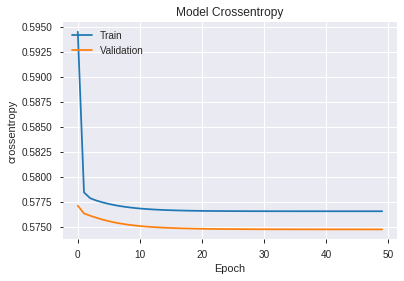

0.5 0.6984747023809523
0.51 0.6833147321428571
0.52 0.6672712053571429
0.53 0.6523902529761905
0.54 0.6367652529761905
0.55 0.6202101934523809
0.56 0.6030040922619048
0.5700000000000001 0.5876581101190477
0.5800000000000001 0.5703125
0.5900000000000001 0.5517113095238095
0.6000000000000001 0.5329706101190477
0.6100000000000001 0.5154389880952381
0.6200000000000001 0.4962797619047619
0.6300000000000001 0.47767857142857145
0.6400000000000001 0.45958891369047616
0.6500000000000001 0.43996465773809523
0.6600000000000001 0.41889880952380953
0.6700000000000002 0.39946056547619047
0.6800000000000002 0.38025483630952384
0.6900000000000002 0.3611421130952381
0.7000000000000002 0.34314546130952384
0.7100000000000002 0.32607886904761907
0.7200000000000002 0.30961681547619047
0.7300000000000002 0.2902250744047619
0.7400000000000002 0.2728794642857143
0.7500000000000002 0.25492931547619047
0.7600000000000002 0.23804873511904762
0.7700000000000002 0.22335379464285715
0.7800000000000002 0.20847284226

In [185]:
draw_history(history)
threshold=getTop20Threshold(pred_ans)
Matrics(y_test.values[:len(pred_ans)], pred_ans,threshold) 

In [7]:
def PrecisionRecall(x_test,pred,N):
    hit = 0
    n_recall = 1
    n_precision = 1
    adGroupList=pd.unique(x_test["adGroup"])
    pred[["adGroup"]] = pred[["adGroup"]].astype(int)
    print("N is {} ".format(N))
    print("Evaluating the model......")
    for adGroup in adGroupList:
        topN=pred.loc[pred["adGroup"]==adGroup].sort_values("target",ascending=False)[:N]
  
        groundTruth=x_test.loc[x_test["adGroup"]==adGroup]
        groundTruth=groundTruth[groundTruth["target"]>0]

        intersection = pd.merge(topN,
                 groundTruth,
                 how='inner', on=['adGroup','placement']
                 )
        hit += intersection.shape[0]
        n_recall += groundTruth.shape[0]
        n_precision += N
    print("Evaluation Finished!")
       
    return [hit / (1.0 * n_recall), hit / (1.0 * n_precision)]